#Hands-on Activity 5.1 Generating Images with GANs and VAEs

#Procedures and Discussion: Variational Autoencoders and GANs

In [29]:
# system libraries
import sys
import warnings
import os
import glob
warnings.filterwarnings("ignore")

# image libraries
import cv2 # requires installing opencv (e.g., pip install opencv-python)
from imgaug import augmenters # requires installing imgaug (e.g., pip install imgaug)

# math/numerical libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from scipy.stats import norm
from sklearn.model_selection import train_test_split

import tensorflow as tf

# deep learning libraries
from keras.models import Model, Sequential
from keras.optimizers import Adam, RMSprop

from keras.layers import *
from keras import backend as K
# from keras.callbacks import EarlyStopping
# from keras.utils import to_categorical
# from keras.metrics import *
# from keras.preprocessing import image, sequence
#

print(tf.__version__)

2.15.0


## Part 1: Autoencoders (AEs)

Answer: What is the typical architecture of a 'vanilla/standard/traditional' autoencoder.

### Data: Acquisition and Pre-processing
We will be using Fashion-MNIST, which can be conveniently accessed with Keras.

4422102/4422102 [==============================] - 0s 0us/step
X_train shape: (60000, 28, 28), X_test shape: (10000, 28, 28)
y_train shape: (60000,), and y_test shape: (10000,)


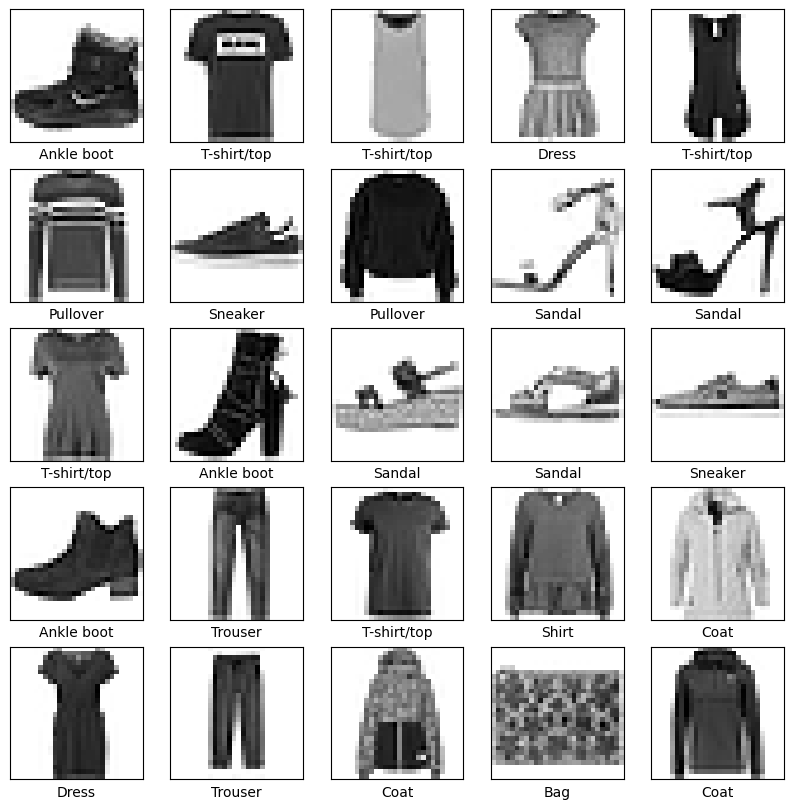

In [ ]:
# get the data from keras - how convenient!
fashion_mnist = tf.keras.datasets.fashion_mnist

# load the data and split it into training and testing sets
(X_train, y_train),(X_test, y_test) = fashion_mnist.load_data()

# normalize the data by dividing with pixel intensity
# (each pixel is 8 bits so its value ranges from 0 to 255)
X_train, X_test = X_train / 255.0, X_test / 255.0

print(f'X_train shape: {X_train.shape}, X_test shape: {X_test.shape}')
print(f'y_train shape: {y_train.shape}, and y_test shape: {y_test.shape}')

# classes are named 0-9 so define names for plotting clarity
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

# display the first 25 garments from the training set
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_train[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[y_train[i]])
plt.show()

#### Add Noise to the Images

In attempt to make the autoencoder more robust and not just memorize the inputs, let's add noise to the inputs but calculate its loss based on how similar its outputs are to the original (non-denoised) images.

Check out imgaug docs for more info and other ways to add noise.

In [ ]:
# Neural Networks want the inputs to be 3D
n_samples, h, w = X_train.shape

X_train = X_train.reshape(-1, h, w, 1)
X_test = X_test.reshape(-1, h, w, 1)

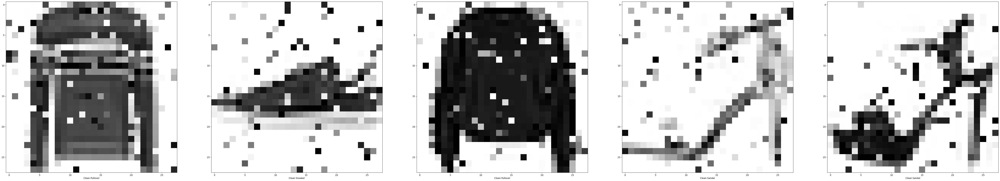

In [ ]:
# Adding some 'salt and pepper' noises
noise = augmenters.SaltAndPepper(0.1)
seq_object = augmenters.Sequential([noise])

X_train_n = seq_object.augment_images(X_train * 255) / 255
X_test_n = seq_object.augment_images(X_test * 255) / 255

f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i in range(5,10):
    ax[i-5].imshow(X_train_n[i, :, :, 0].reshape(28, 28), cmap=plt.cm.binary)
    ax[i-5].set_xlabel('Clean '+class_names[y_train[i]])

#### Create the Autoencoder

In [ ]:
# input layer
input_layer = tf.keras.layers.Input(shape=(28, 28, 1))

# encoding architecture
encoded_layer1 = tf.keras.layers.Conv2D(64,(3, 3), activation='relu', padding='same')(input_layer)
encoded_layer1 = tf.keras.layers.MaxPool2D((2, 2), padding='same')(encoded_layer1)
encoded_layer2 = tf.keras.layers.Conv2D(32,(3, 3), activation='relu', padding='same')(encoded_layer1)
encoded_layer2 = tf.keras.layers.MaxPool2D((2, 2), padding='same')(encoded_layer2)
encoded_layer3 = tf.keras.layers.Conv2D(16,(3, 3), activation='relu', padding='same')(encoded_layer2)
latent_view = tf.keras.layers.MaxPool2D((2, 2), padding='same')(encoded_layer3)

# decoding architecture
decoded_layer1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(latent_view)
decoded_layer1 = tf.keras.layers.UpSampling2D((2, 2))(decoded_layer1)
decoded_layer2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(decoded_layer1)
decoded_layer2 = tf.keras.layers.UpSampling2D((2, 2))(decoded_layer2)
decoded_layer3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(decoded_layer2)
decoded_layer3 = tf.keras.layers.UpSampling2D((2, 2))(decoded_layer3)
output_layer = tf.keras.layers.Conv2D(1,(3, 3), padding='same')(decoded_layer3)

# compile the model
model = tf.keras.Model(input_layer, output_layer)
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 64)        640       
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 64)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        18464     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 7, 7, 32)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 16)          4624  

#### Train the Autoencoder

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=5, mode='auto')

# epochs=20 for better results
history = model.fit(X_train_n, X_train, epochs=20, batch_size=2048, validation_data=(X_test_n, X_test), callbacks=[early_stopping])

Epoch 1/20
30/30 [==============================] - 7s 223ms/step - loss: 0.0820 - val_loss: 0.0488
Epoch 2/20
30/30 [==============================] - 3s 103ms/step - loss: 0.0407 - val_loss: 0.0347
Epoch 3/20
30/30 [==============================] - 3s 101ms/step - loss: 0.0315 - val_loss: 0.0284
Epoch 4/20
30/30 [==============================] - 3s 102ms/step - loss: 0.0267 - val_loss: 0.0250
Epoch 5/20
30/30 [==============================] - 3s 107ms/step - loss: 0.0242 - val_loss: 0.0232
Epoch 6/20
30/30 [==============================] - 3s 105ms/step - loss: 0.0225 - val_loss: 0.0219
Epoch 7/20
30/30 [==============================] - 3s 103ms/step - loss: 0.0214 - val_loss: 0.0208
Epoch 8/20
30/30 [==============================] - 3s 103ms/step - loss: 0.0203 - val_loss: 0.0198
Epoch 9/20
30/30 [==============================] - 3s 108ms/step - loss: 0.0194 - val_loss: 0.0194
Epoch 10/20
30/30 [==============================] - 3s 106ms/step - loss: 0.0190 - val_loss: 0.0187

In [ ]:
n = np.random.randint(0,len(X_test)-5) # pick a random starting index within our test set

#### Visualize Samples reconstructed by AE

**Denoised Images**

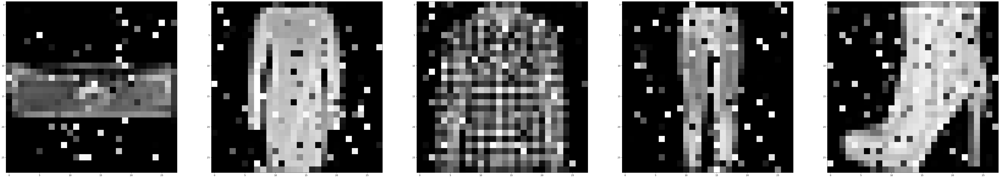

In [ ]:
f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i,a in enumerate(range(n,n+5)):
    ax[i].imshow(X_test_n[a, :, :, 0].reshape(28, 28), cmap='gray')

**Actual Targets (i.e., Original inputs)**

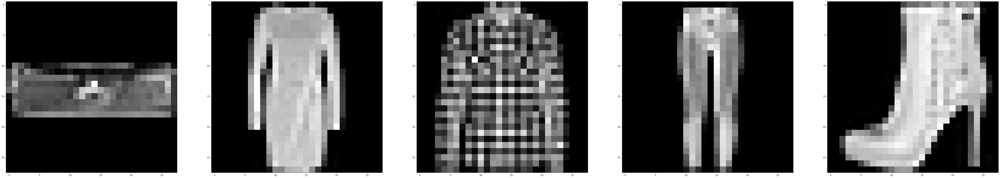

In [ ]:
f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i,a in enumerate(range(n,n+5)): # display the 5 images starting at our random index
    ax[i].imshow(X_test[a, :, :, 0].reshape(28, 28), cmap='gray')

**Predicted Images**

1/1 [==============================] - 0s 437ms/step


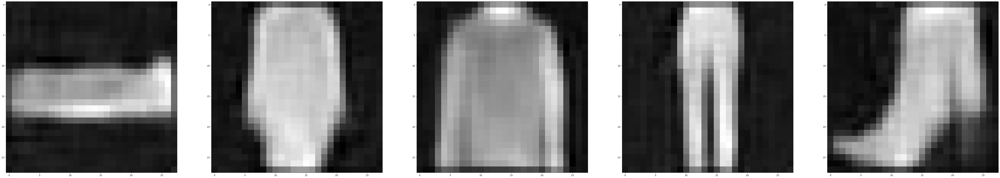

In [ ]:
preds = model.predict(X_test_n[n:n+5])
f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i,a in enumerate(range(n,n+5)):
    ax[i].imshow(preds[i].reshape(28, 28), cmap='gray')
plt.show()

Adding noise can provide a more robust general model and predictions. The model's prediction on the fashion dataset is not that detailed but the pattern of the shoes/clothes are discenible.

## Part 2: Variational Autoencoders (VAEs)

**Discussion: Why do we care to use VAEs? Identify the limitations/weaknesses of Autoencoders**

### Reset Data

In [ ]:
# get the data from keras - how convenient!
fashion_mnist = tf.keras.datasets.fashion_mnist

# load the data and split it into training and testing sets
(X_train, y_train),(X_test, y_test) = fashion_mnist.load_data()

# normalize the data by dividing with pixel intensity
# (each pixel is 8 bits so its value ranges from 0 to 255)
X_train, X_test = X_train / 255.0, X_test / 255.0

print(f'X_train shape: {X_train.shape}, X_test shape: {X_test.shape}')
print(f'y_train shape: {y_train.shape}, and y_test shape: {y_test.shape}')

X_train shape: (60000, 28, 28), X_test shape: (10000, 28, 28)
y_train shape: (60000,), and y_test shape: (10000,)


### Setup Encoder Neural Network

In [ ]:
batch_size = 16
latent_dim = 2  # Number of latent dimension parameters

input_img = tf.keras.layers.Input(shape=(784,), name="input")
x = tf.keras.layers.Dense(512, activation='relu', name="intermediate_encoder")(input_img)
x = tf.keras.layers.Dense(2, activation='relu', name="latent_encoder")(x)

z_mu = tf.keras.layers.Dense(latent_dim)(x)
z_log_sigma = tf.keras.layers.Dense(latent_dim)(x)

In [ ]:
# sampling function
def sampling(args):
    z_mu, z_log_sigma = args
    epsilon = tf.keras.backend.random_normal(shape=(tf.keras.backend.shape(z_mu)[0], latent_dim))
    z = z_mu + tf.keras.backend.exp(z_log_sigma) * epsilon
    return z

# sample vector from the latent distribution
z = tf.keras.layers.Lambda(sampling)([z_mu, z_log_sigma])

In [ ]:
# decoder takes the latent distribution sample as input
decoder_input = tf.keras.layers.Input((2,), name="input_decoder")

x = tf.keras.layers.Dense(512, activation='relu', name="intermediate_decoder", input_shape=(2,))(decoder_input)

# Expand to 784 total pixels
x = tf.keras.layers.Dense(784, activation='sigmoid', name="original_decoder")(x)

# decoder model statement
decoder = tf.keras.Model(decoder_input, x)

# apply the decoder to the sample from the latent distribution
z_decoded = decoder(z)

In [ ]:
decoder.summary()

Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_decoder (InputLayer)  [(None, 2)]               0         
                                                                 
 intermediate_decoder (Dens  (None, 512)               1536      
 e)                                                              
                                                                 
 original_decoder (Dense)    (None, 784)               402192    
                                                                 
Total params: 403728 (1.54 MB)
Trainable params: 403728 (1.54 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# construct a custom layer to calculate the loss
class CustomVariationalLayer(tf.keras.layers.Layer):

    def vae_loss(self, x, z_decoded):
        x = tf.keras.backend.flatten(x)
        z_decoded = tf.keras.backend.flatten(z_decoded)
        # Reconstruction loss
        xent_loss = tf.keras.losses.binary_crossentropy(x, z_decoded)
        return xent_loss

    # adds the custom loss to the class
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

# apply the custom loss to the input images and the decoded latent distribution sample
y = CustomVariationalLayer()([input_img, z_decoded])

In [ ]:
z_decoded

<KerasTensor: shape=(None, 784) dtype=float32 (created by layer 'model_1')>

In [ ]:
# VAE model statement
vae = tf.keras.Model(input_img, y)
vae.compile(optimizer='rmsprop', loss=None)

In [ ]:
vae.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 784)]                0         []                            
                                                                                                  
 intermediate_encoder (Dens  (None, 512)                  401920    ['input[0][0]']               
 e)                                                                                               
                                                                                                  
 latent_encoder (Dense)      (None, 2)                    1026      ['intermediate_encoder[0][0]']
                                                                                                  
 dense (Dense)               (None, 2)                    6         ['latent_encoder[0][0]']

In [ ]:
X_train.shape

(60000, 28, 28)

In [ ]:
train_x = X_train.reshape(-1,784) # train_x.reshape(-1, 784)
val_x = X_test.reshape(-1,784) #val_x.reshape(-1, 784)

In [ ]:
vae.fit(x=train_x, y=None,
        shuffle=True,
        epochs=4,
        batch_size=batch_size,
        validation_data=(val_x, None))

Epoch 1/4
3750/3750 [==============================] - 24s 5ms/step - loss: 0.4431 - val_loss: 0.4158
Epoch 2/4
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3761 - val_loss: 0.3499
Epoch 3/4
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3451 - val_loss: 0.3433
Epoch 4/4
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3399 - val_loss: 0.3389


1/1 [==============================] - 0s 15ms/step


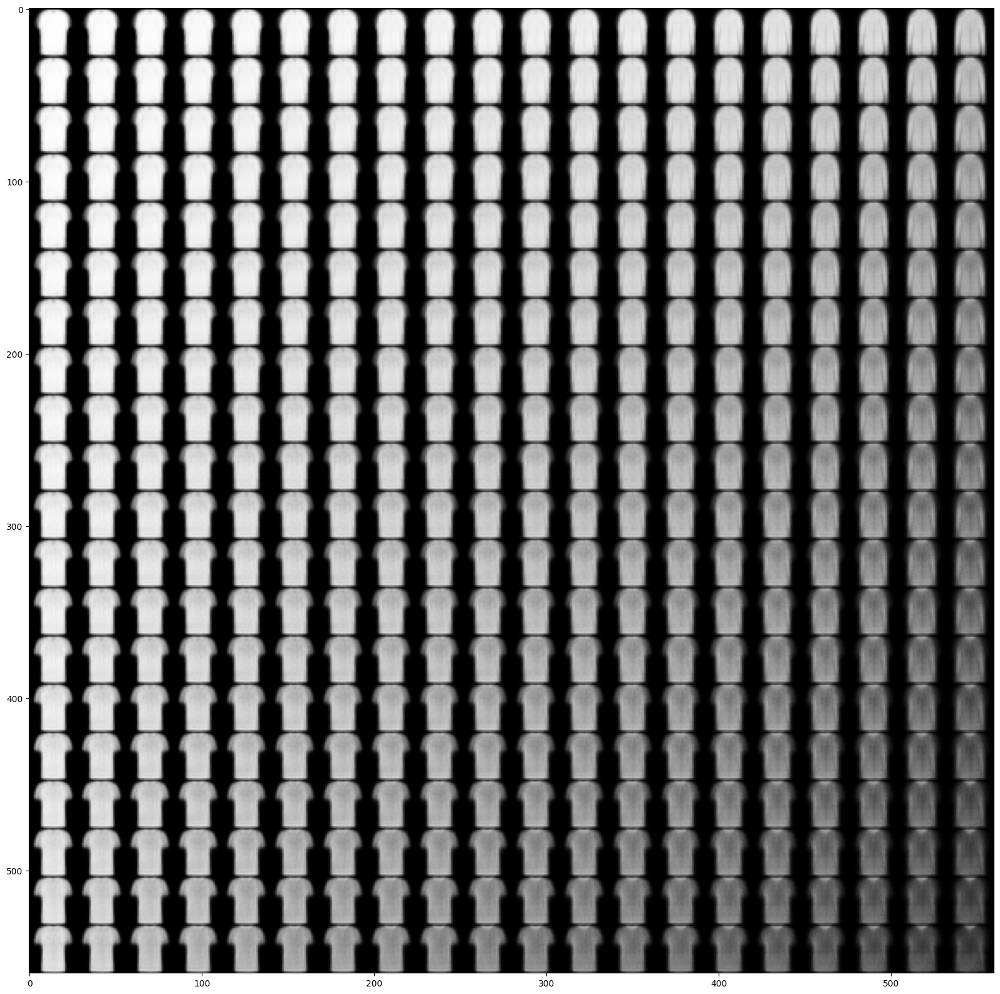

In [ ]:
# Display a 2D manifold of the samples
n = 20  # figure with 20x20 samples
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))

# Construct grid of latent variable values - can change values here to generate different things
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

# decode for each square in the grid
for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, batch_size).reshape(batch_size, 2)

        x_decoded = decoder.predict(z_sample, batch_size=batch_size)

        digit = x_decoded[0].reshape(digit_size, digit_size)

        figure[i * digit_size: (i + 1) * digit_size,
               j * digit_size: (j + 1) * digit_size] = digit

plt.figure(figsize=(20, 20))
plt.imshow(figure, cmap='gray')
plt.show()

3750/3750 [==============================] - 6s 2ms/step


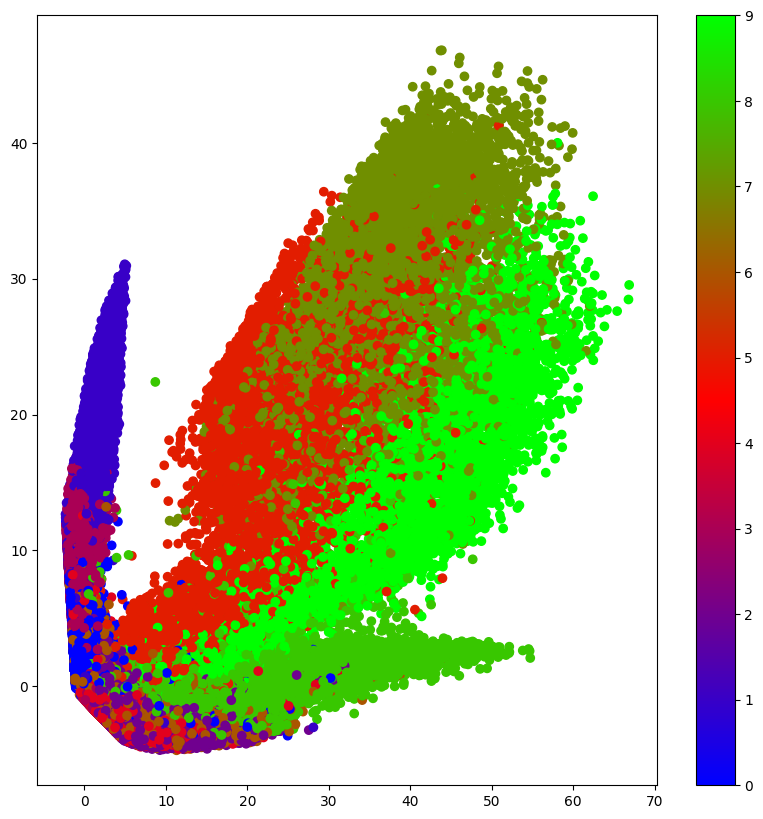

In [ ]:
# Translate into the latent space
encoder = tf.keras.Model(input_img, z_mu) # works on older version of TF and Keras
x_valid_noTest_encoded = encoder.predict(train_x, batch_size=batch_size)
plt.figure(figsize=(10, 10))
plt.scatter(x_valid_noTest_encoded[:, 0], x_valid_noTest_encoded[:, 1], c=y_train, cmap='brg')
plt.colorbar()
plt.show()

Each class predictions can be seen clustered together indicating a good fit and prediction of the model.

## Part 2B: Adding CNNs and KL Divergence Losses

### Generating new fashion

In [ ]:
batch_size = 16
latent_dim = 2  # Number of latent dimension parameters

# Encoder architecture: Input -> Conv2D*4 -> Flatten -> Dense
input_img = Input(shape=(28, 28, 1))

x = Conv2D(32,3,padding='same', activation='relu')(input_img)
x = Conv2D(64,3,padding='same', activation='relu',strides=(2, 2))(x)
x = Conv2D(64,3,padding='same', activation='relu')(x)
x = Conv2D(64,3,padding='same', activation='relu')(x)

# need to know the shape of the network here for the decoder
shape_before_flattening = K.int_shape(x)

x = Flatten()(x)
x = Dense(32, activation='relu')(x)

# Two outputs, latent mean and (log)variance
z_mu = Dense(latent_dim)(x)
z_log_sigma = Dense(latent_dim)(x)

### Setup Sampling Function

In [ ]:
# sampling function
def sampling(args):
    z_mu, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mu)[0], latent_dim), mean=0., stddev=1.)
    return z_mu + K.exp(z_log_sigma) * epsilon

# sample vector from the latent distribution
z = Lambda(sampling)([z_mu, z_log_sigma])

### Setup Decoder Neural Network
Task: Try different number of hidden layers and nodes?

In [ ]:
# decoder takes the latent distribution sample as input
decoder_input = Input(K.int_shape(z)[1:])

# Expand to 784 total pixels
x = Dense(np.prod(shape_before_flattening[1:]),
                 activation='relu')(decoder_input)

# reshape
x = Reshape(shape_before_flattening[1:])(x)

# use Conv2DTranspose to reverse the conv layers from the encoder
x = Conv2DTranspose(32, 3,
                           padding='same',
                           activation='relu',
                           strides=(2, 2))(x)
x = Conv2D(1, 3,
                  padding='same',
                  activation='sigmoid')(x)

# decoder model statement
decoder = Model(decoder_input, x)

# apply the decoder to the sample from the latent distribution
z_decoded = decoder(z)

### Setup Loss Function

In [ ]:
# construct a custom layer to calculate the loss
class CustomVariationalLayer(Layer):

    def vae_loss(self, x, z_decoded):
        x = K.flatten(x)
        z_decoded = K.flatten(z_decoded)

        # Reconstruction loss
        xent_loss = tf.keras.losses.binary_crossentropy(x, z_decoded)

        # KL divergence
        kl_loss = -5e-4 * K.mean(1 + z_log_sigma - K.square(z_mu) - K.exp(z_log_sigma), axis=-1)
        return K.mean(xent_loss + kl_loss)

    # adds the custom loss to the class
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

# apply the custom loss to the input images and the decoded latent distribution sample
y = CustomVariationalLayer()([input_img, z_decoded])

### Train VAE

In [ ]:
# VAE model statement
vae = Model(input_img, y)
vae.compile(optimizer='rmsprop', loss=None)

In [ ]:
vae.summary()

Model: "model_20"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 28, 28)]             0         []                            
                                                                                                  
 intermediate_encoder (Dens  (None, 28, 512)              14848     ['input[0][0]']               
 e)                                                                                               
                                                                                                  
 latent_encoder (Dense)      (None, 28, 2)                1026      ['intermediate_encoder[0][0]']
                                                                                                  
 dense_12 (Dense)            (None, 28, 2)                6         ['latent_encoder[0][0]'

In [ ]:
train_x = train_x.reshape(-1, 28, 28, 1)
val_x = val_x.reshape(-1, 28, 28, 1)

In [ ]:
vae.fit(x=train_x, y=None,
        shuffle=True,
        epochs=20,
        batch_size=batch_size,
        validation_data=(val_x, None))

Epoch 1/20
3750/3750 [==============================] - 15s 4ms/step - loss: 0.3655 - val_loss: 0.3654
Epoch 2/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3611 - val_loss: 0.3616
Epoch 3/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3559 - val_loss: 0.3532
Epoch 4/20
3750/3750 [==============================] - 15s 4ms/step - loss: 0.3506 - val_loss: 0.3523
Epoch 5/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3468 - val_loss: 0.3461
Epoch 6/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3431 - val_loss: 0.3430
Epoch 7/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3379 - val_loss: 0.3388
Epoch 8/20
3750/3750 [==============================] - 15s 4ms/step - loss: 0.3349 - val_loss: 0.3366
Epoch 9/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3328 - val_loss: 0.3352
Epoch 10/20
3750/3750 [==============================] - 14s 4ms/step - l

### Visualize Samples Reconstructed by VAE

1/1 [==============================] - 0s 19ms/step


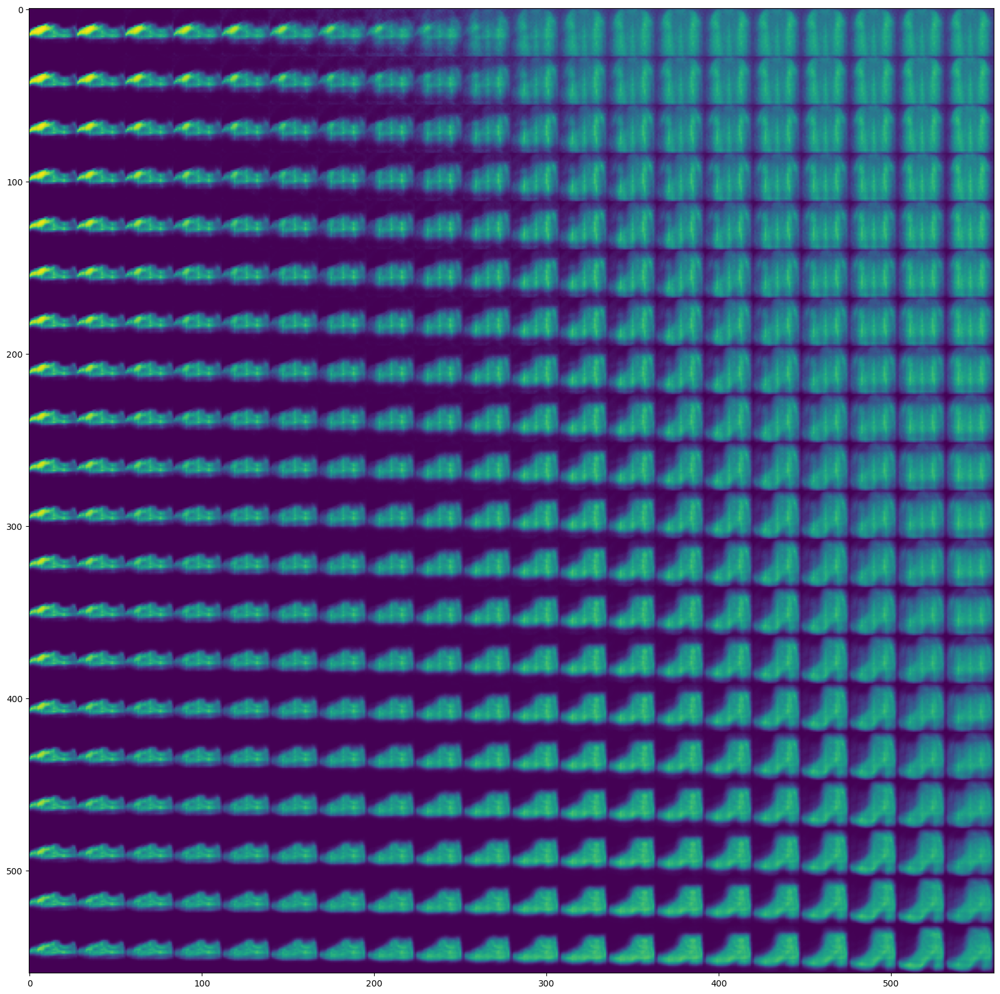

In [ ]:
# Display a 2D manifold of the samples
n = 20  # figure with 20x20 samples
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))

# Construct grid of latent variable values - can change values here to generate different things
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

# decode for each square in the grid
for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, batch_size).reshape(batch_size, 2)
        x_decoded = decoder.predict(z_sample, batch_size=batch_size)
        digit = x_decoded[0].reshape(digit_size, digit_size)
        figure[i * digit_size: (i + 1) * digit_size,
               j * digit_size: (j + 1) * digit_size] = digit

plt.figure(figsize=(20, 20))
plt.imshow(figure)
plt.show()

### VAE: Visualize Latent Space

3750/3750 [==============================] - 9s 2ms/step


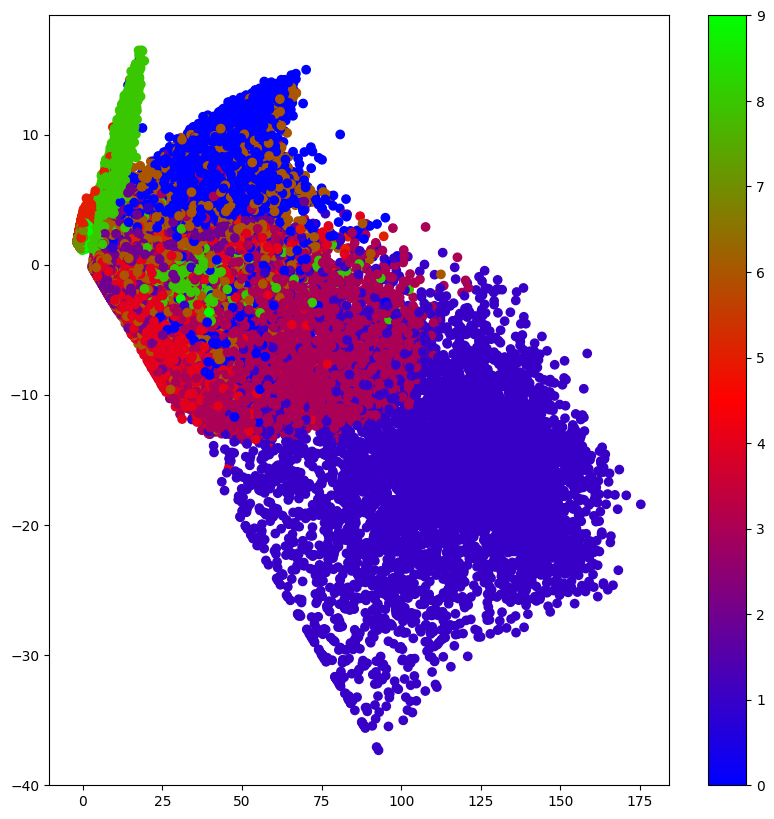

In [ ]:
# Translate into the latent space
encoder = Model(input_img, z_mu)
x_valid_noTest_encoded = encoder.predict(train_x, batch_size=batch_size)
plt.figure(figsize=(10, 10))
plt.scatter(x_valid_noTest_encoded[:, 0], x_valid_noTest_encoded[:, 1], c=y_train, cmap='brg')
plt.colorbar()
plt.show()

There seems like a straight line that borders the dots for unknown reason. Nonetheless, each class are still clustered together. Some classes spread more while some are close and packed.

## Exercise: Generating a 1D Gaussian Distribution from Uniform Noise

In this exercise, we are going to generate 1-D Gaussian distribution from a n-D uniform distribution. This is a toy exercise in order to understand the ability of GANs (generators) to generate arbitrary distributions from random noise.

Generate training data - Gaussian Distribution

In [ ]:
# system libraries
import sys
import warnings
import os
import glob
warnings.filterwarnings("ignore")

# image libraries
import cv2 # requires installing opencv (e.g., pip install opencv-python)
from imgaug import augmenters # requires installing imgaug (e.g., pip install imgaug)

# math/numerical libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from scipy.stats import norm
from sklearn.model_selection import train_test_split

import tensorflow as tf

In [ ]:
def generate_data(n_samples = 10000,n_dim=1):
  return np.random.randn(n_samples, n_dim)

A general function to define feedforward architectures

In [ ]:
def set_model(input_dim, output_dim, hidden_dim=64,n_layers = 1,activation='tanh',optimizer='adam', loss = 'binary_crossentropy'):
  model = Sequential()
  model.add(Dense(hidden_dim,input_dim=input_dim,activation=activation))

  for _ in range(n_layers-1):
    model.add(Dense(hidden_dim),activation=activation)
  model.add(Dense(output_dim))

  model.compile(loss=loss, optimizer=optimizer)
  print(model.summary())
  return model

Setting GAN training and losses here

In [ ]:
def get_gan_network(discriminator, random_dim, generator, optimizer = 'adam'):
  discriminator.trainable = False
  gan_input = Input(shape=(random_dim,))
  x = generator(gan_input)
  gan_output = discriminator(x)
  gan = Model(inputs = gan_input,outputs=gan_output)
  gan.compile( loss='binary_crossentropy', optimizer=optimizer)
  return gan

In [ ]:
# hyper-parameters
NOISE_DIM = 10
DATA_DIM = 1
G_LAYERS = 1
D_LAYERS = 1

In [ ]:
def train_gan(epochs=1,batch_size=128):
    x_train = generate_data(n_samples=12800,n_dim=DATA_DIM)
    batch_count = x_train.shape[0]/batch_size

    generator = set_model(NOISE_DIM, DATA_DIM, n_layers=G_LAYERS, activation='tanh',loss = 'mean_squared_error')
    discriminator = set_model(DATA_DIM, 1, n_layers= D_LAYERS, activation='sigmoid')
    gan = get_gan_network(discriminator, NOISE_DIM, generator, 'adam')

    for e in range(1,epochs+1):

        # generate noise from a uniform distribution
        noise = np.random.rand(batch_size,NOISE_DIM)
        true_batch = x_train[np.random.choice(x_train.shape[0], batch_size, replace=False), :]

        generated_values = generator.predict(noise)
        X = np.concatenate([generated_values,true_batch])

        y_dis = np.zeros(2*batch_size)

        #One-sided label smoothing to avoid overconfidence. In GAN, if the discriminator depends on a small set of features to detect real images,
        #the generator may just produce these features only to exploit the discriminator.
        #The optimization may turn too greedy and produces no long term benefit.
        #To avoid the problem, we penalize the discriminator when the prediction for any real images go beyond 0.9 (D(real image)>0.9).
        y_dis[:batch_size] = 0.9

        discriminator.trainable = True
        disc_history = discriminator.train_on_batch(X, y_dis)
        discriminator.trainable = False

        # Train generator
        noise = np.random.rand(batch_size,NOISE_DIM)
        y_gen = np.zeros(batch_size)
        gan.train_on_batch(noise, y_gen)

    return generator, discriminator

In [ ]:
generator, discriminator = train_gan()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 64)                704       
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                                 
Total params: 769 (3.00 KB)
Trainable params: 769 (3.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 64)                128       
                                                                 
 dense_9 (Dense)             (None, 1)                 65        
                                                                 

313/313 [==============================] - 1s 1ms/step
1st order moment -  True :  0.0 , GAN : [0.]
2nd order moment -  True :  1.020243964946054 , GAN : [0.01591862]
3rd order moment -  True :  -0.011068063191140256 , GAN : [0.00010058]
4th order moment -  True :  3.0730263021068938 , GAN : [0.00069906]


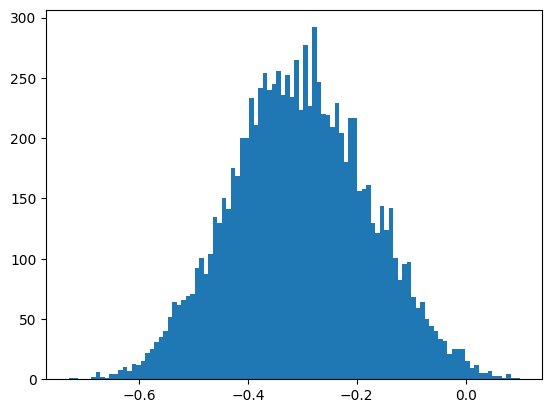

In [ ]:
noise = np.random.rand(10000,NOISE_DIM)
generated_values = generator.predict(noise)
plt.hist(generated_values,bins=100)

true_gaussian = [np.random.randn() for x in range(10000)]

print('1st order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 1) , ', GAN :', scipy.stats.moment(generated_values,1))
print('2nd order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 2) , ', GAN :', scipy.stats.moment(generated_values,2))
print('3rd order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 3) , ', GAN :', scipy.stats.moment(generated_values,3))
print('4th order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 4) , ', GAN :', scipy.stats.moment(generated_values,4))
plt.show()

Four different moments were shown. GAN learned to generate samples with a similar mean although there are some deviation from a perfect Gaussian distribution.

**CONCLUSION**

Some conclusions we can make from this exercise:
1. GANs are able to learn a generative model from general noise distributions.
2. Traditional GANs do not learn the higher-order moments well. Possible issues : Number of samples, approximating higher moments is hard. Usually known to under-predict higher order variances. For people interested in learning why, read more about divergence measures between distributions (particularly about Wasserstein etc.)


# Supplementary Activities

## Part 1: MNIST GAN - Learn to Generate MNIST Digits

In [ ]:
from keras.datasets import mnist
#from keras.utils import np_utils
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.layers import LeakyReLU
from keras.optimizers import RMSprop
from keras.optimizers.legacy import Adam
import numpy as np
import matplotlib.pyplot as plt
import random
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings("ignore")
# Dataset of 60,000 28x28 grayscale images of the 10 digits, along with a test set of 10,000 images.
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

11490434/11490434 [==============================] - 2s 0us/step


Re-scale data since we are using ReLU activations. **WHY?**

In [ ]:
X_train = X_train.reshape(60000, 784)
X_test = X_test.reshape(10000, 784)
X_train = X_train.astype('float32')/255
X_test = X_test.astype('float32')/255

Set noise dimension

**EXERCISE : Play around with different noise dimensions and plot the performance with respect to the size of the noise vector.**

In [ ]:
z_dim = 10

Tasks:
1. Build Model using LeakyReLU Activations: Build a generator, discriminator, and a GAN as feed-forward network with multiple layers, dropout, and leakyReLU as activation function.
2. Train Model
3. Provide an evaluation/conclusion.

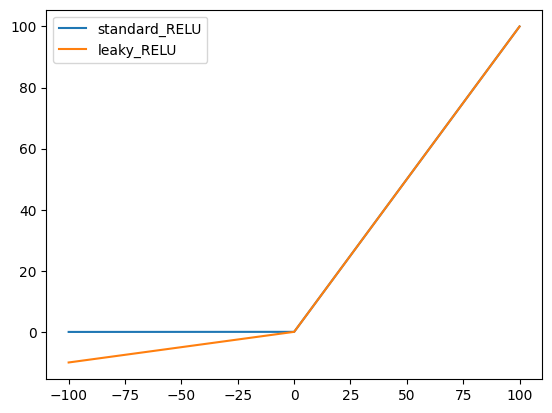

In [ ]:
def leakyReLU(x,neg_scale=0.01):
    if x > 0:
        return x
    else:
        return neg_scale*x

std_relu = []
leaky_relu = []

std_relu = [leakyReLU(x,neg_scale=0) for x in np.linspace(-100,100,10000)]
leaky_relu = [leakyReLU(x,neg_scale=0.1) for x in np.linspace(-100,100,10000)]

plt.plot(np.linspace(-100,100,10000),std_relu, label='standard_RELU')
plt.plot(np.linspace(-100,100,10000),leaky_relu, label='leaky_RELU')
plt.legend()
plt.show()

Leaky ReLU allow us not to kill the data entirely when it reaches negative.

z_dim = 10000

In [ ]:
z_dim = 10000
adam = Adam(learning_rate=0.0002, beta_1=0.5)


# (a) GENERATOR
g = Sequential()
g.add(Dense(256, input_dim=z_dim, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(1024, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(1024, input_dim=784, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=10, dim=(1, 10), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 50
Batch size: 256
Batches per epoch: 234


  0%|          | 0/50 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 80ms/step


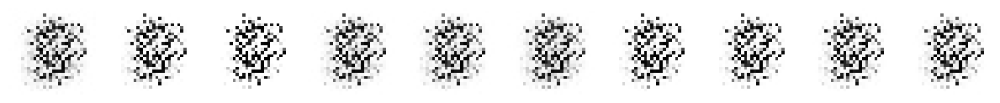

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 17ms/step


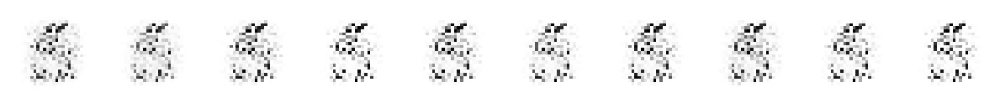

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 30ms/step


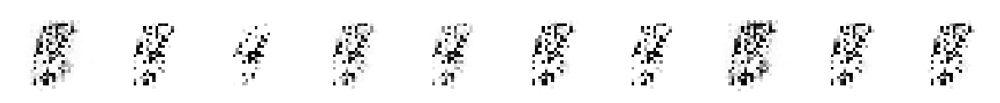

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 28ms/step


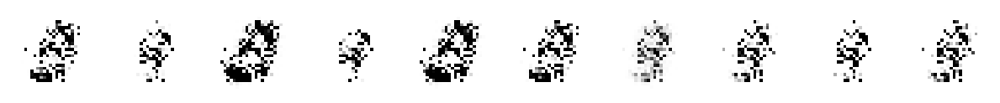

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 20ms/step


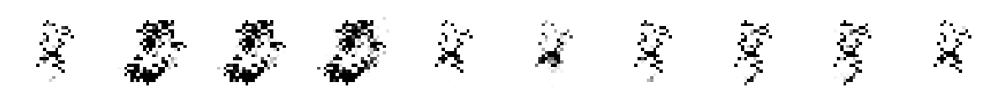

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 18ms/step


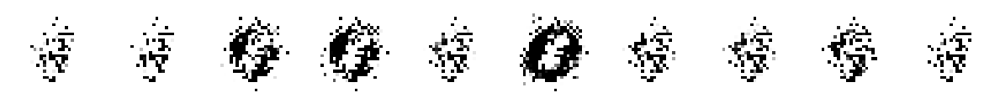

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 20ms/step


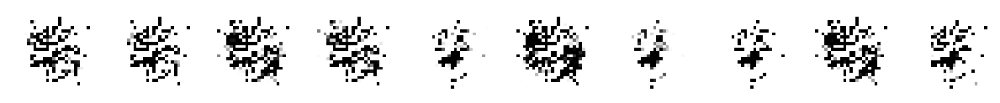

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 17ms/step


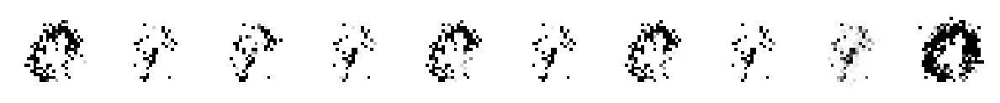

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 17ms/step


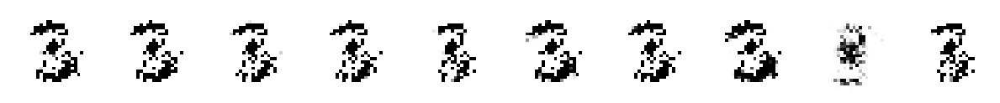

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 18ms/step


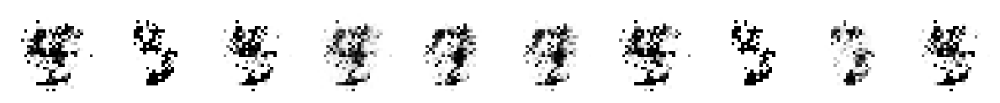

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 25ms/step


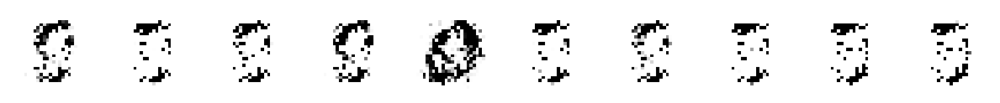

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 18ms/step


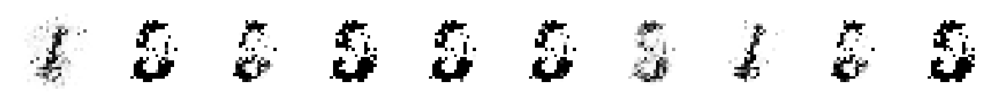

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 17ms/step


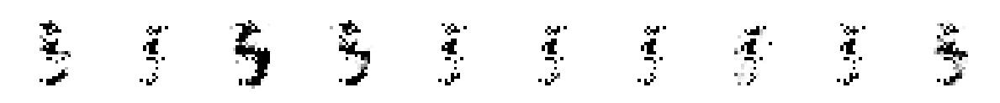

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 17ms/step


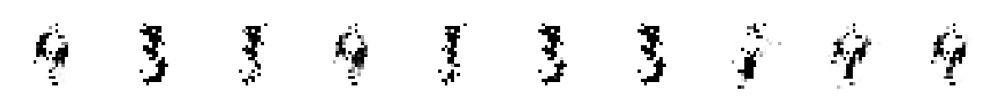

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 28ms/step


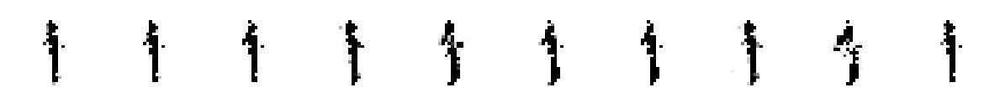

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 19ms/step


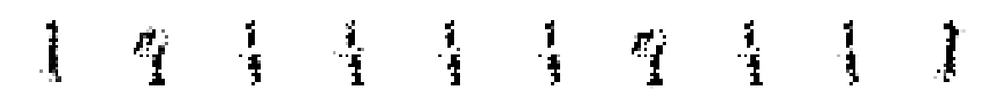

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 18ms/step


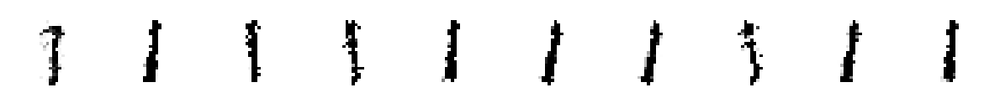

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 19ms/step


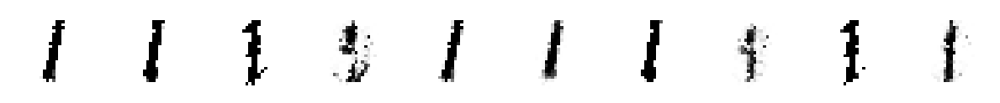

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 18ms/step


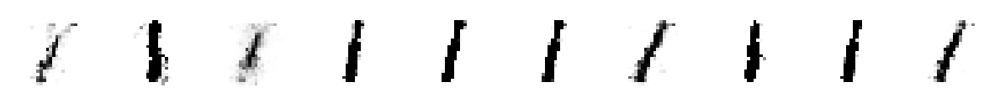

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 19ms/step


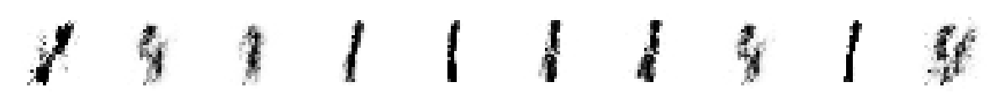

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 19ms/step


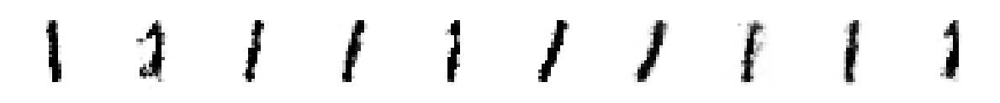

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 18ms/step


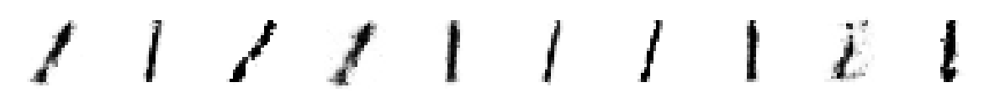

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 20ms/step


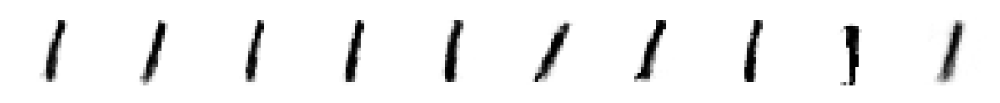

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 19ms/step


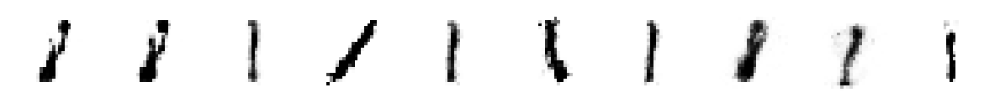

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 23ms/step


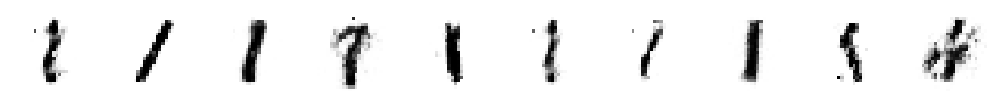

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 18ms/step


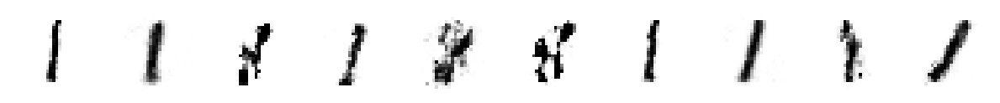

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 18ms/step


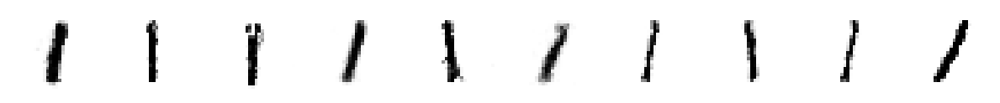

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 34ms/step


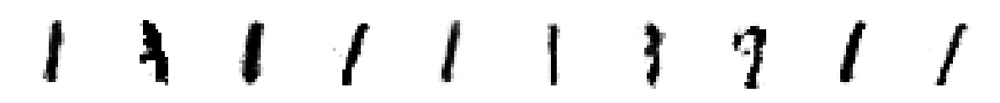

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 18ms/step


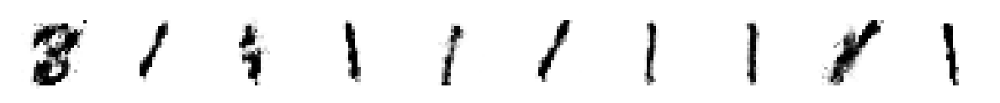

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 17ms/step


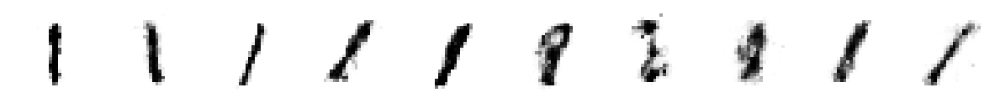

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 19ms/step


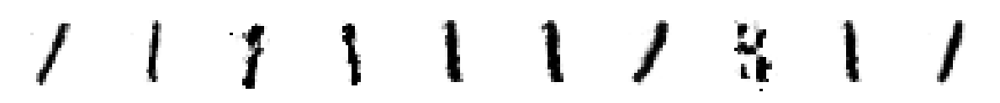

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 17ms/step


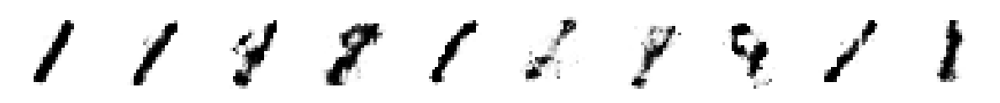

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 17ms/step


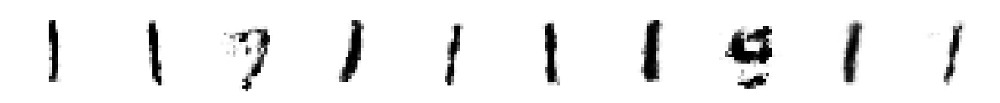

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 17ms/step


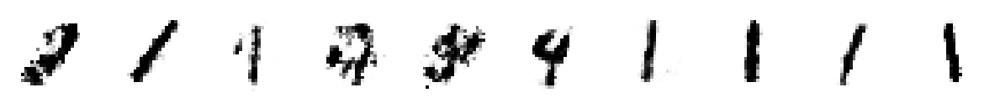

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 26ms/step


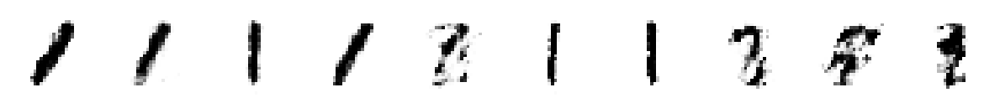

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 17ms/step


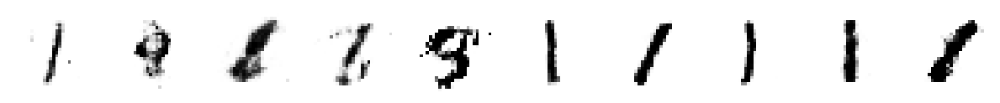

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 25ms/step


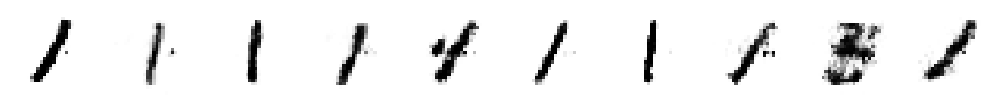

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 16ms/step


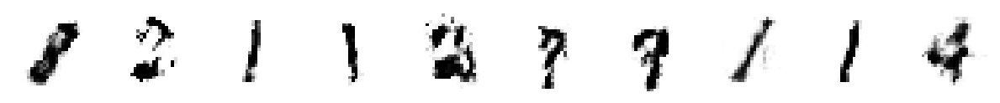

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 17ms/step


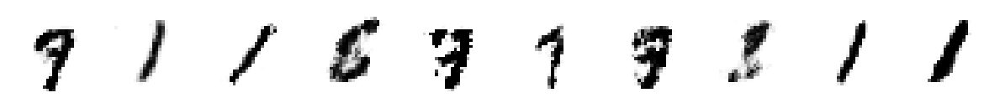

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 17ms/step


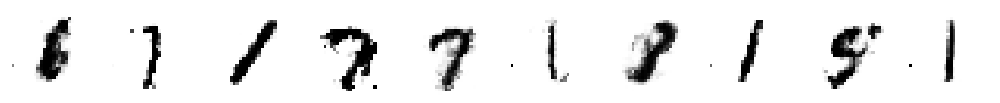

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 19ms/step


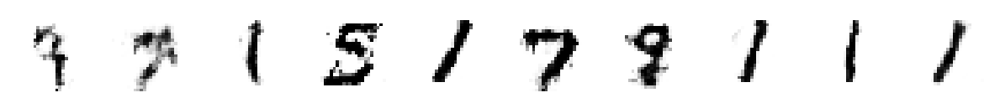

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 19ms/step


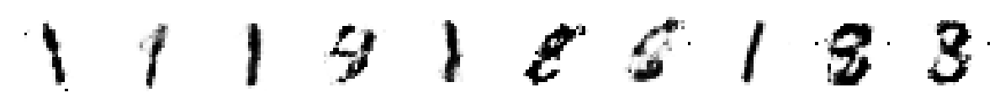

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 16ms/step


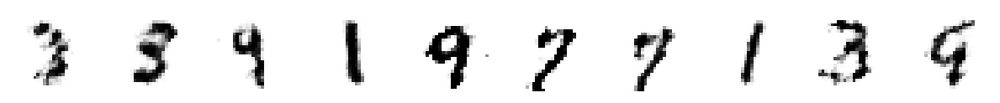

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 17ms/step


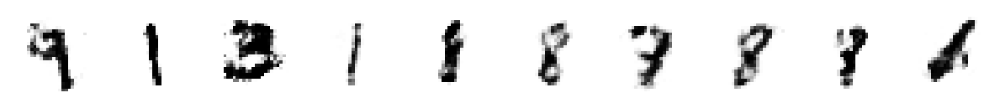

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 18ms/step


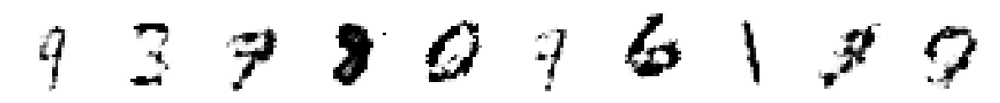

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 18ms/step


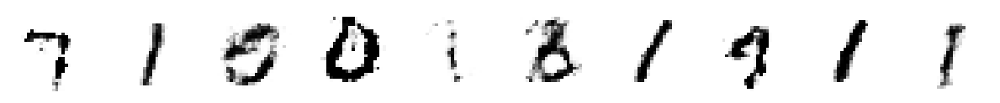

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 17ms/step


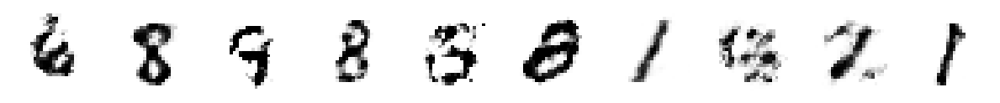

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 26ms/step


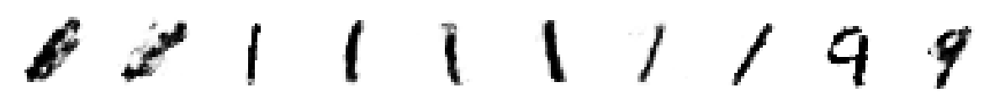

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 17ms/step


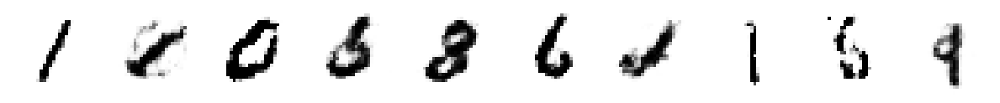

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 17ms/step


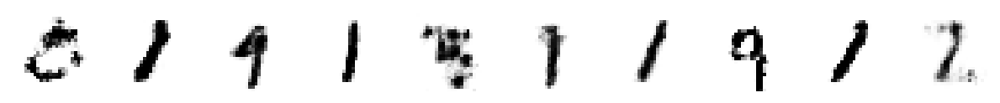

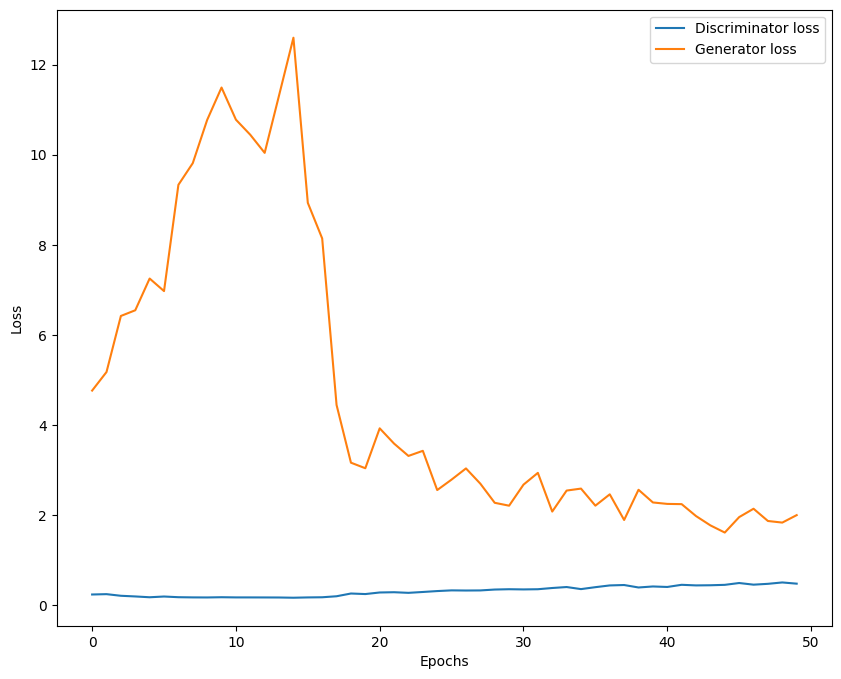

In [ ]:
train(z_dim, epochs=50, BATCH_SIZE=256)

The GAN Was able to generate digits from the MNIST dataset. The numbers can be recognized pretty easily including the small and thin loops of the digit 8. However, some predictions are still blurry. Improvements can still be done.

## Part 2: GANs and VAEs

Tasks:
1. Use your own dataset.
2. Generate new images using GAN and VAE
3. Compare the results of generating images using GAN and VAE.

### Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
csv_path = '/content/drive/MyDrive/Colab Notebooks/arithmetic.csv'
df = pd.read_csv(csv_path)
print(df.shape)
df.head()

(3080, 785)


,label,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
0,add,255,255,255,255,255,255,255,255,255,...,90,255,255,255,255,255,255,255,255,255
1,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [3]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['label'])
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label mapping:")
print(label_mapping)

Label mapping:
{'add': 0, 'div': 1, 'eq': 2, 'mul': 3, 'sub': 4}


In [4]:
print(df.label.value_counts())
df.head()

label
4    655
2    634
1    618
0    596
3    577
Name: count, dtype: int64


,label,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
0,0,255,255,255,255,255,255,255,255,255,...,90,255,255,255,255,255,255,255,255,255
1,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [5]:
from sklearn.model_selection import train_test_split

X = df.drop(columns=['label']).values
y = df['label'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print("Training set - X shape:", X_train.shape, "y shape:", y_train.shape)
print("Testing set - X shape:", X_test.shape, "y shape:", y_test.shape)

Training set - X shape: (2156, 784) y shape: (2156,)
Testing set - X shape: (924, 784) y shape: (924,)


In [6]:
X_train = X_train.astype('float32')/255
X_test = X_test.astype('float32')/255

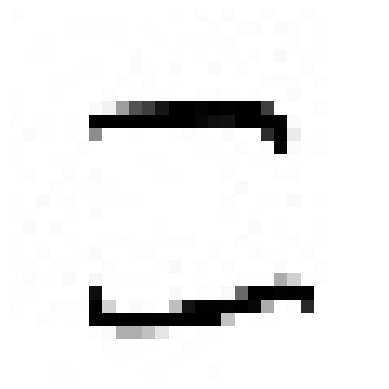

In [7]:
import matplotlib.pyplot as plt
index = 0
selected_image = X_train[index].reshape(28,28)

plt.imshow(selected_image, cmap='gray')
plt.axis('off')
plt.show()

I imported the Math operators symbols images.

### GAN

In [78]:
from keras.datasets import mnist
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.layers import LeakyReLU
from keras.optimizers import RMSprop
from keras.optimizers.legacy import Adam
import numpy as np
import matplotlib.pyplot as plt
import random
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings('default')

In [9]:
z_dim = 1
adam = Adam(learning_rate=0.0005, beta_1=0.5)


# (a) GENERATOR
g = Sequential()
g.add(Dense(128, input_dim=z_dim, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(512, input_dim=784, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(254, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(128, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=5, dim=(1, 5), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 50
Batch size: 64
Batches per epoch: 33


  0%|          | 0/50 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 64ms/step


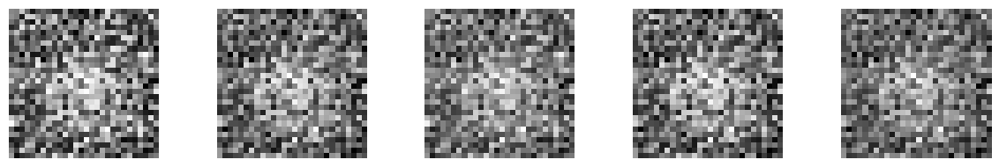

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 30ms/step


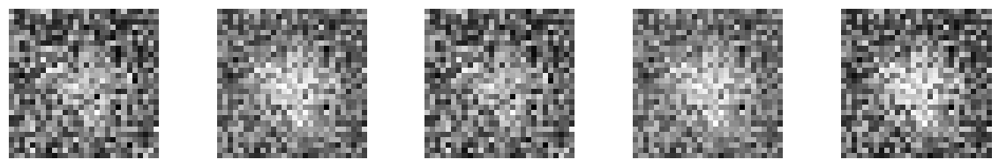

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 18ms/step


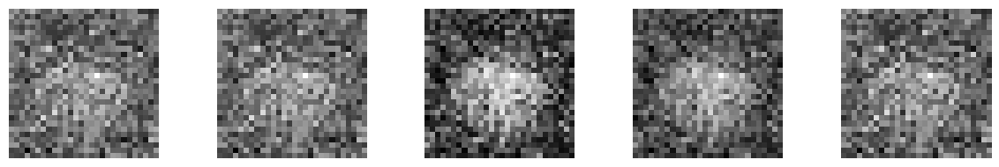

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 16ms/step


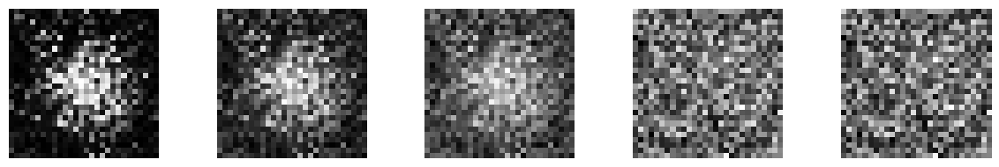

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 18ms/step


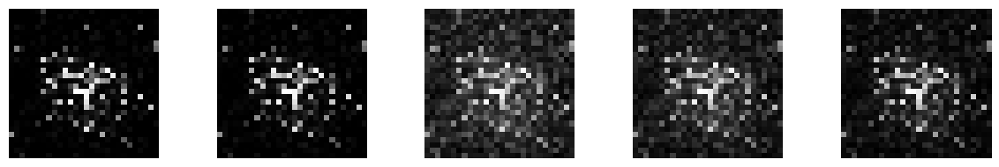

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 27ms/step


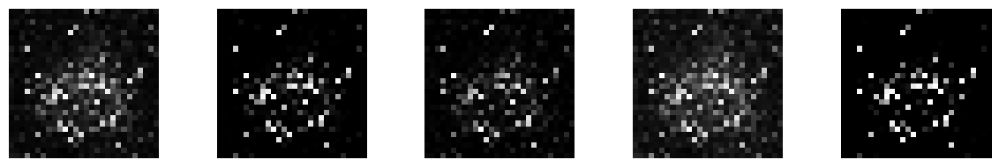

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 16ms/step


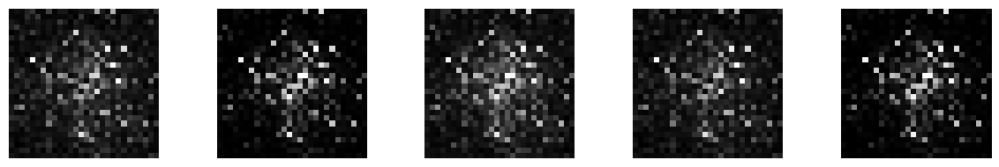

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 16ms/step


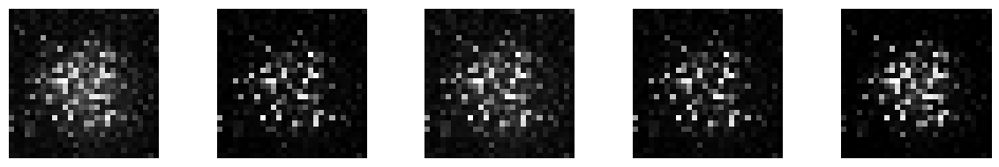

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 17ms/step


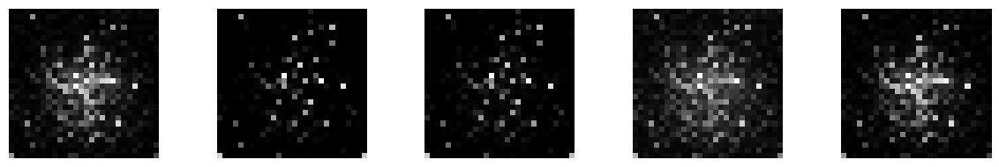

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 24ms/step


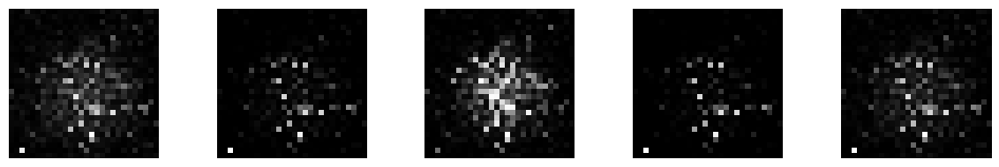

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 21ms/step


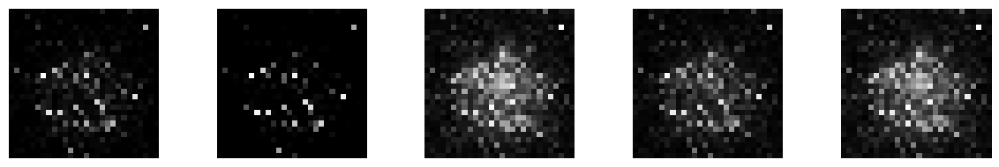

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 19ms/step


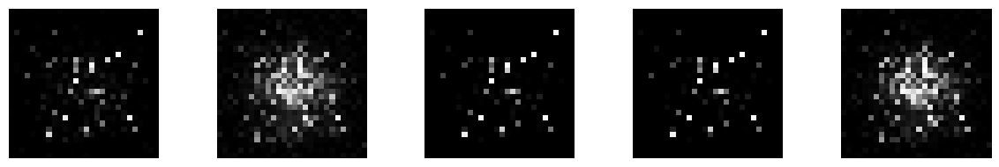

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 16ms/step


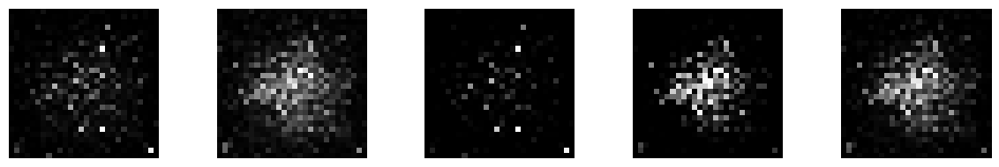

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 29ms/step


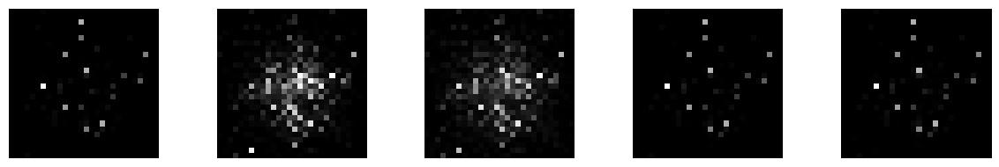

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 17ms/step


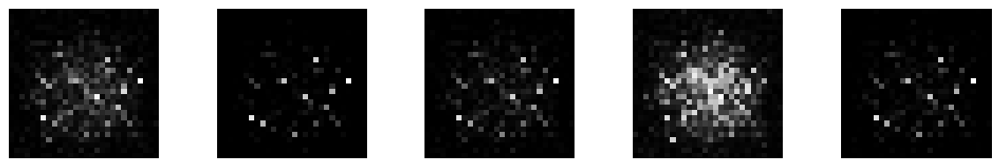

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 19ms/step


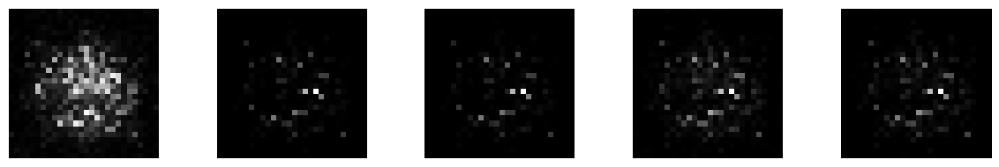

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 16ms/step


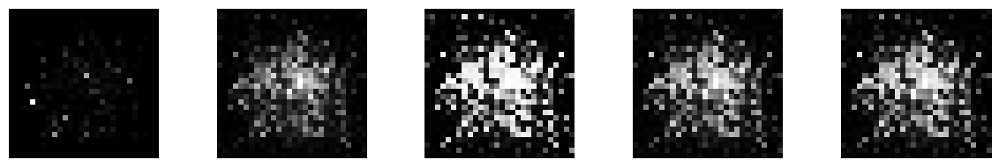

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 32ms/step


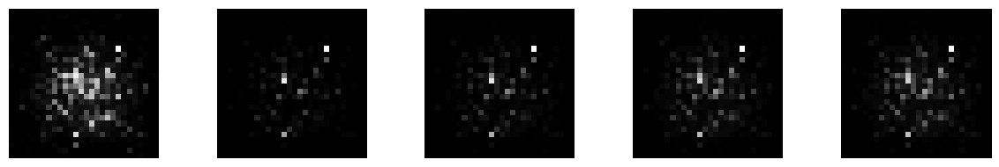

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 16ms/step


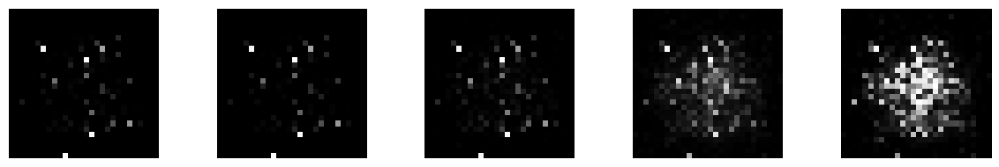

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 16ms/step


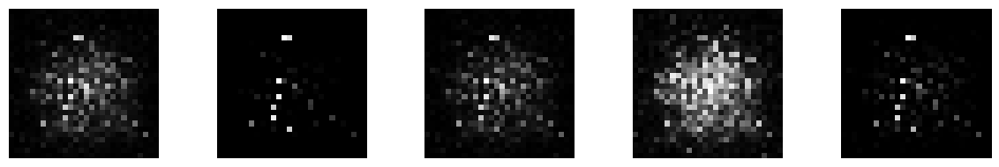

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 16ms/step


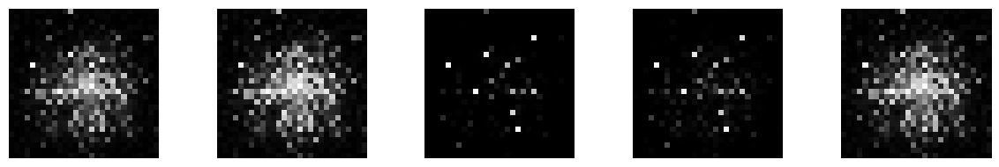

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 25ms/step


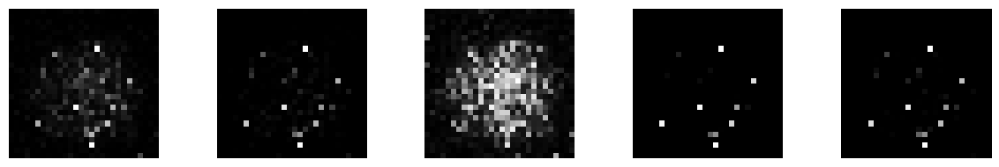

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 17ms/step


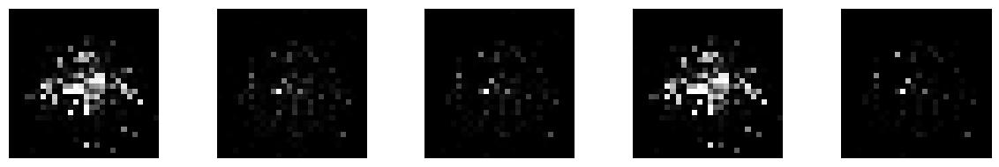

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 17ms/step


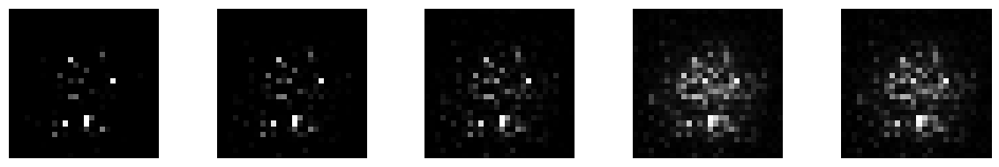

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 17ms/step


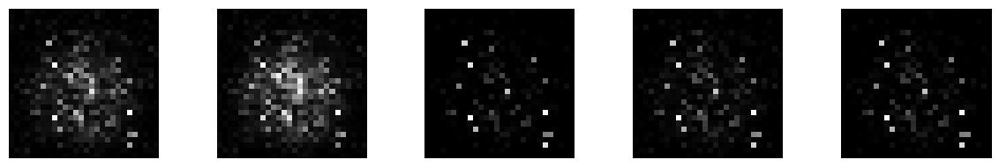

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 30ms/step


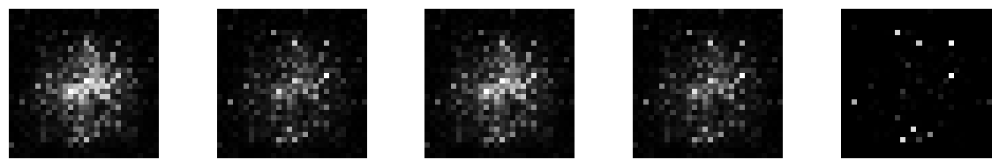

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 17ms/step


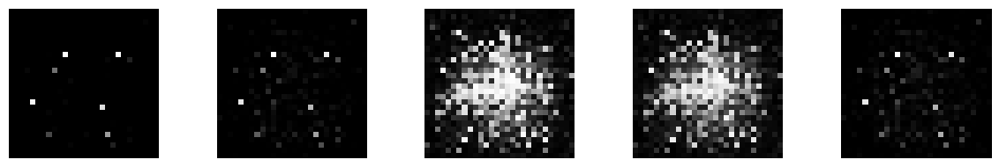

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 18ms/step


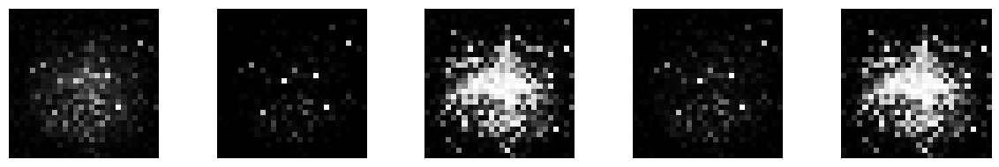

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 16ms/step


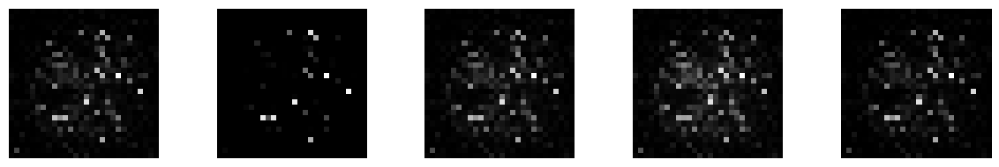

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 22ms/step


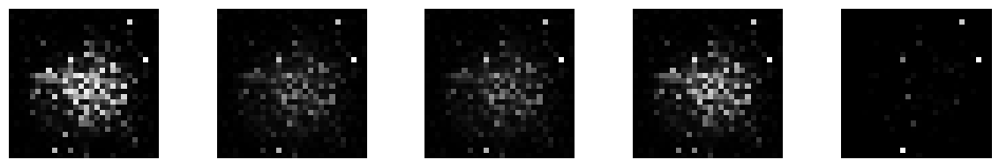

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 16ms/step


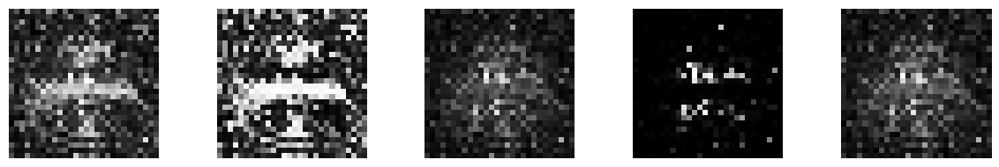

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 17ms/step


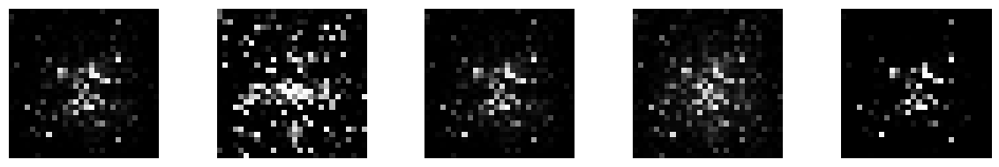

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 18ms/step


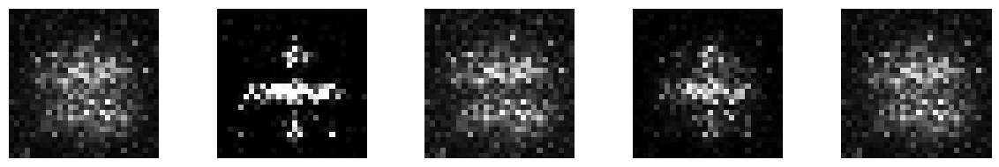

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 31ms/step


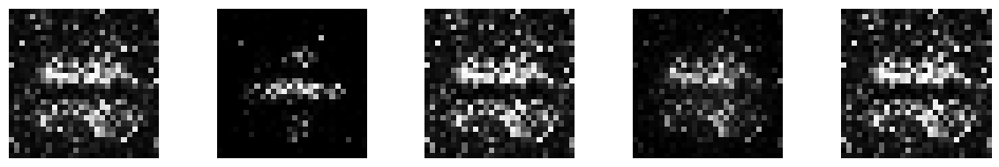

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 16ms/step


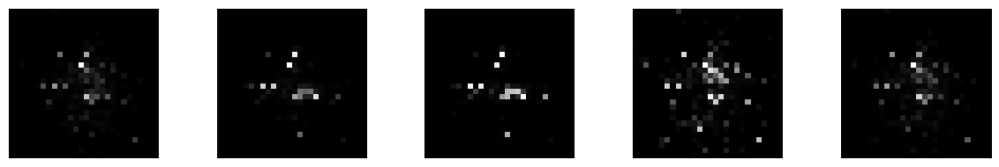

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 16ms/step


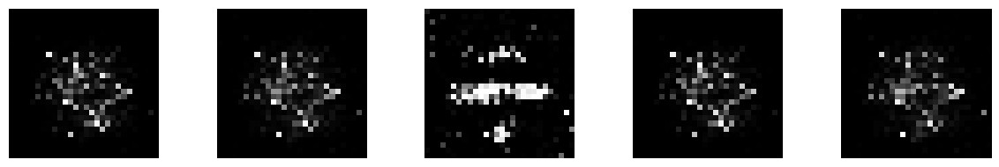

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 17ms/step


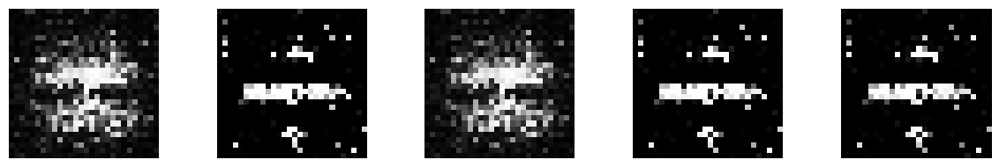

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 25ms/step


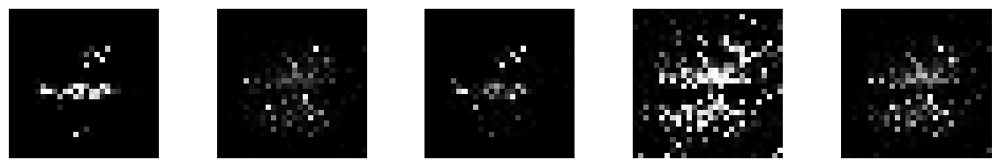

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 17ms/step


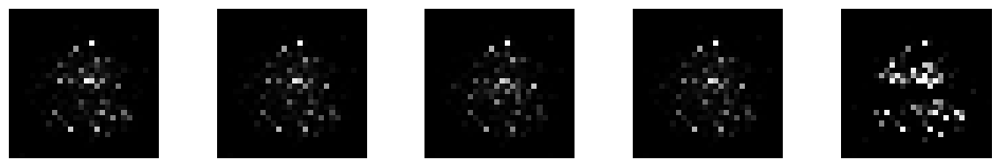

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 17ms/step


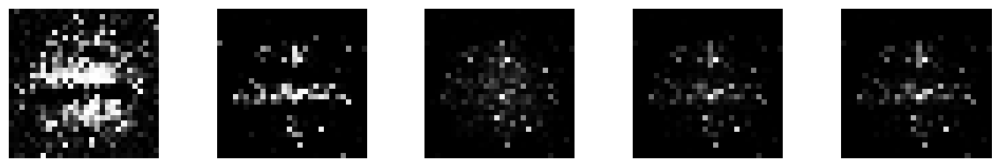

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 17ms/step


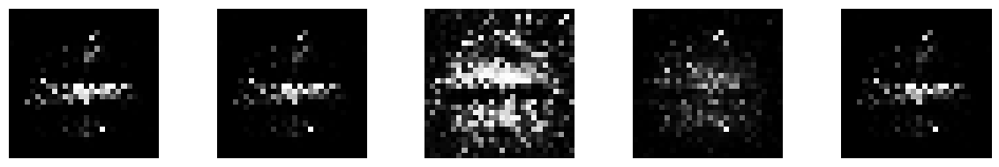

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 18ms/step


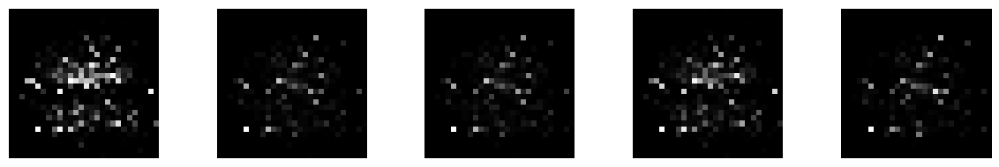

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 18ms/step


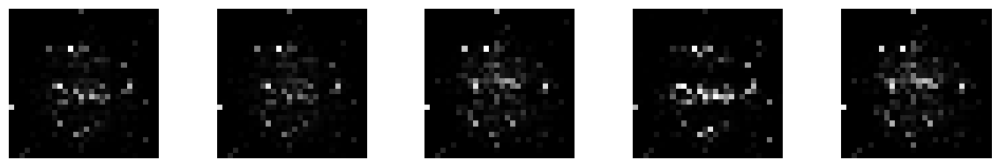

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 17ms/step


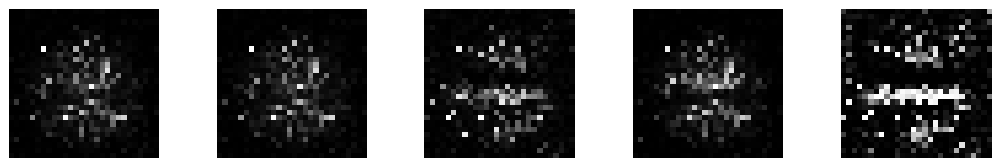

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 16ms/step


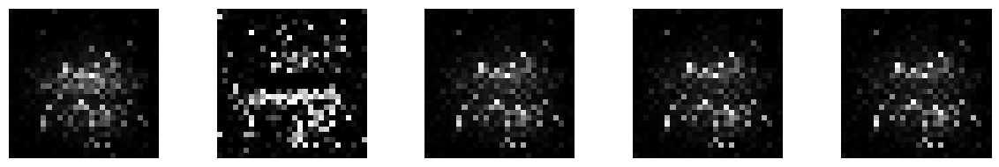

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 17ms/step


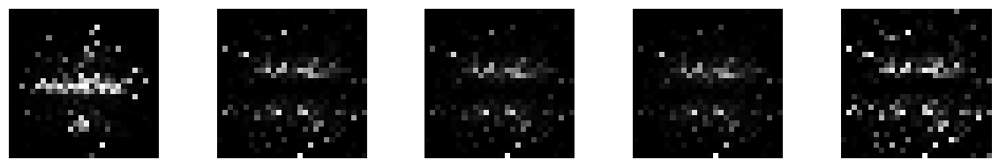

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 17ms/step


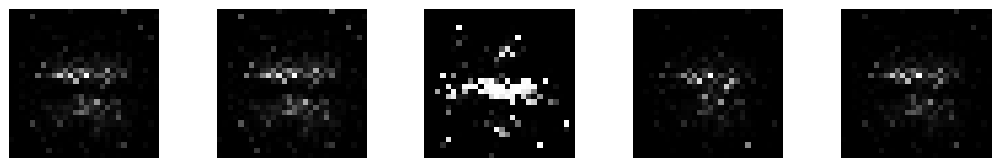

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 16ms/step


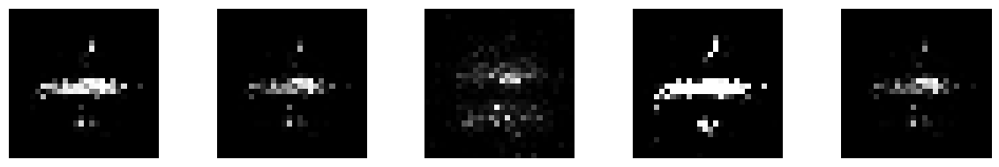

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 26ms/step


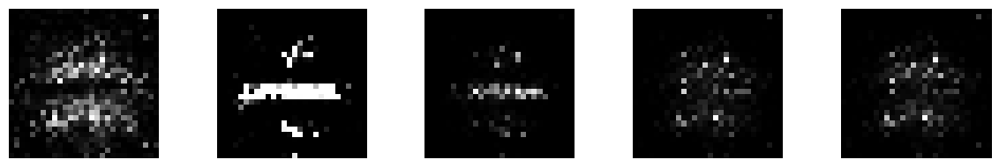

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 17ms/step


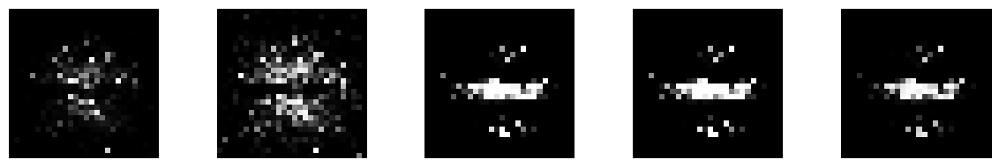

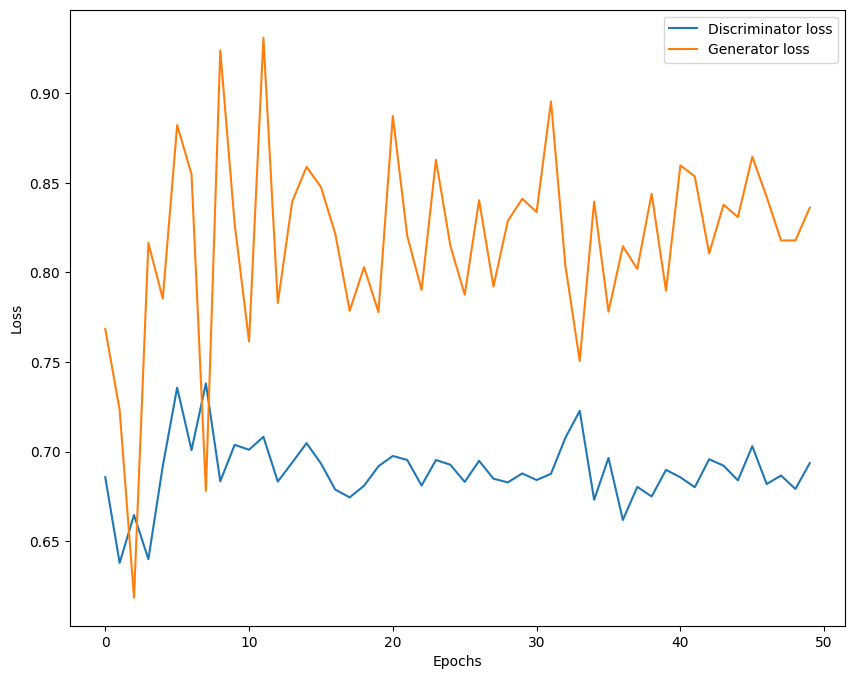

In [ ]:
train(z_dim, epochs=50, BATCH_SIZE=256)

In [23]:
z_dim = 1000
lr = 0.0002
patience = 5
factor = 0.5
min_lr = 1e-6
wait = 0
adam = Adam(learning_rate=lr, beta_1=0.5)

# (a) GENERATOR
g = Sequential()
g.add(Dense(256, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(1024, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(2048, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(2048, input_dim=784, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(1024, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(512, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(256, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])


def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=5, dim=(1, 5), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    best = 999.9
    lr = 0.0002
    patience = 5
    factor = 0.5
    min_lr = 1e-6
    wait = 0
    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)
        '''
        if d_loss[0] < best:
            best = d_loss[0]
            wait = 0
        else:
            wait += 1

        # Reduce learning rate if no improvement
        if wait >= patience:
            lr = max(lr * factor, min_lr)
            adam.learning_rate = lr
            print(f'Reducing learning rate to {lr}')
            wait = 0'''
        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 500
Batch size: 128
Batches per epoch: 16


<ipython-input-23-e2e14cf37843>:82: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for e in tqdm_notebook(range(1, epochs+1)):


  0%|          | 0/500 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 58ms/step


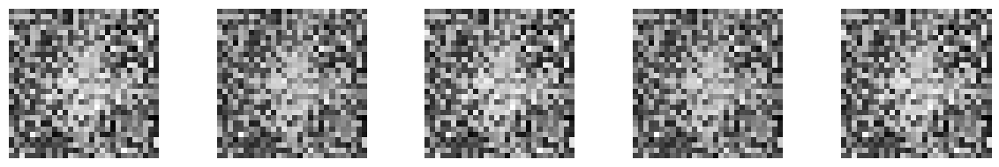

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 17ms/step


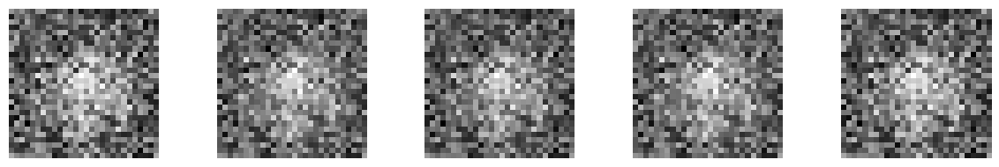

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 16ms/step


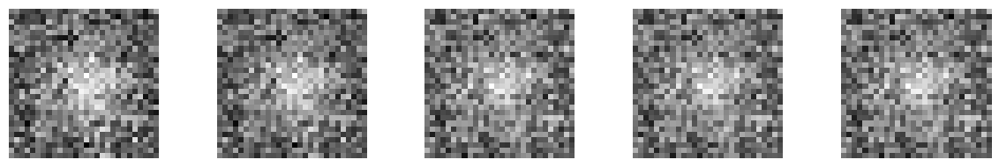

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 17ms/step


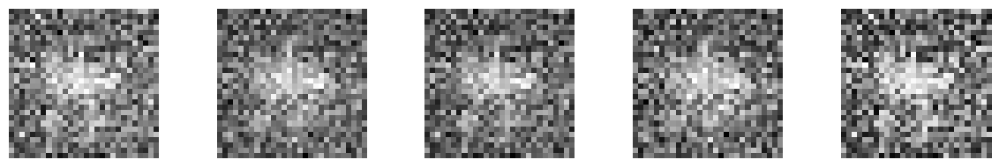

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 21ms/step


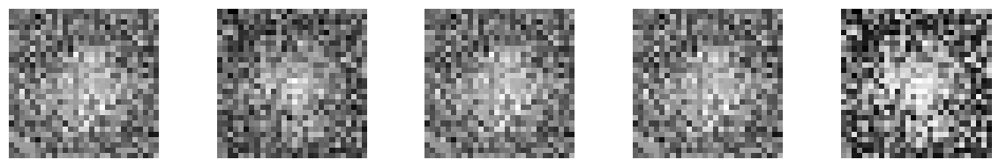

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 21ms/step


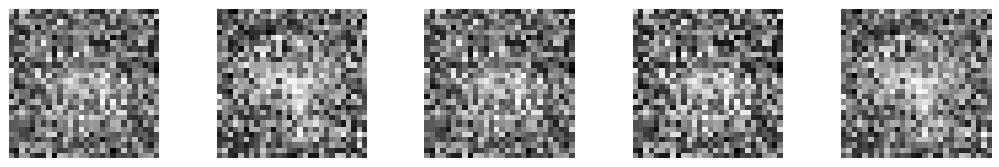

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 31ms/step


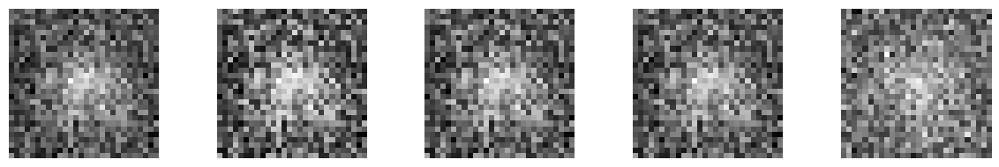

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 18ms/step


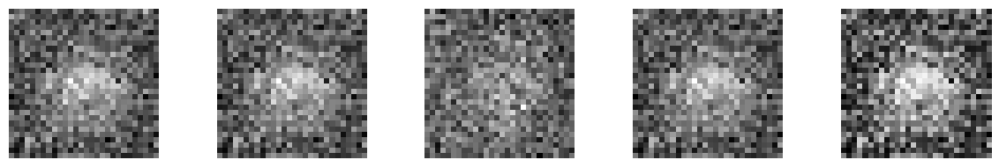

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 18ms/step


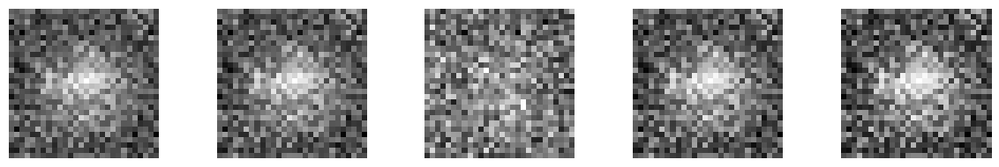

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 17ms/step


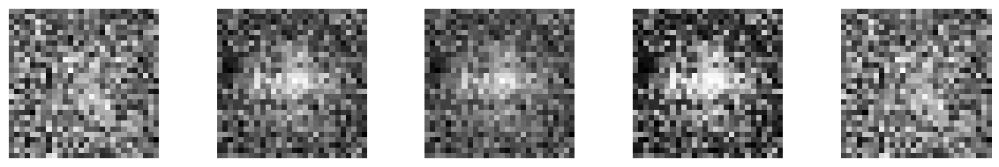

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 27ms/step


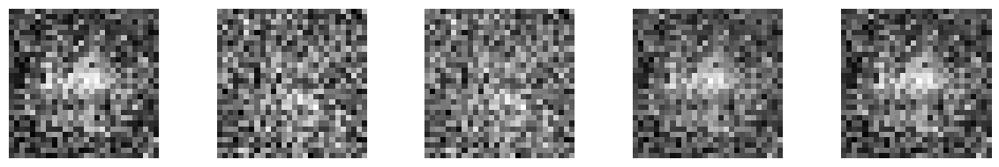

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 66ms/step


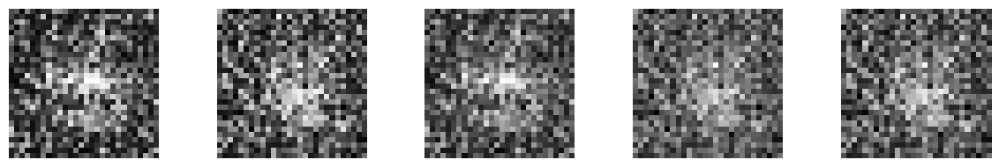

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 126ms/step


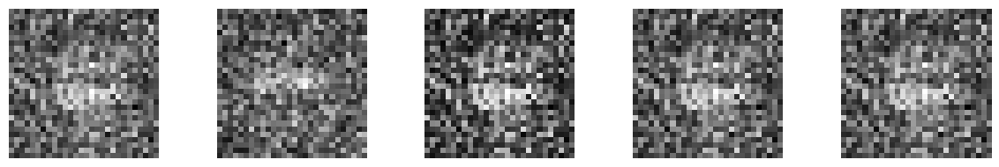

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 20ms/step


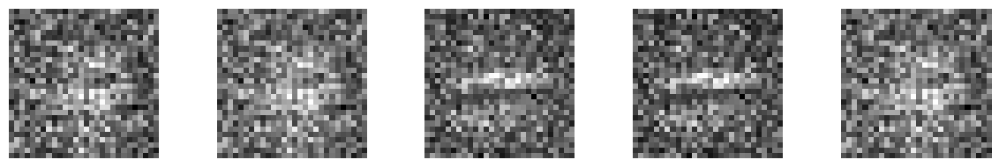

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 35ms/step


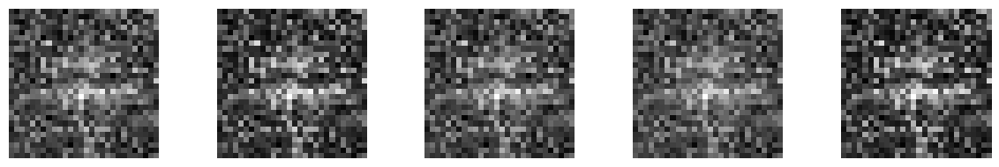

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 18ms/step


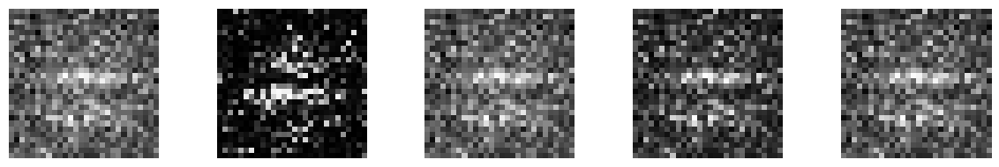

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 28ms/step


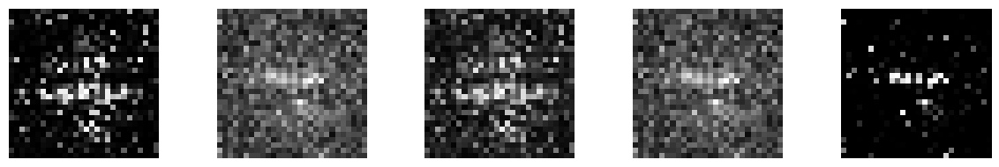

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 21ms/step


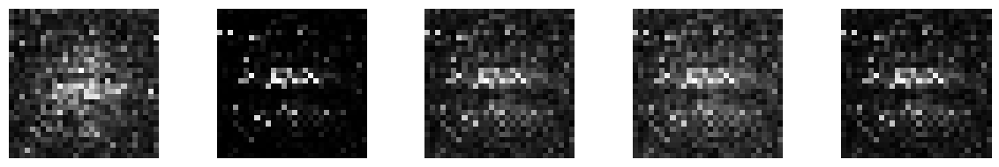

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 21ms/step


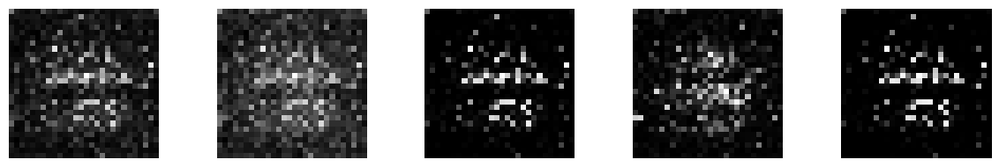

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 35ms/step


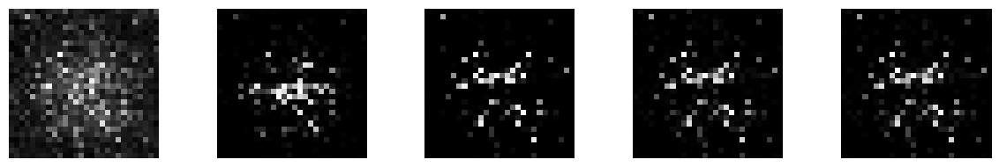

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 43ms/step


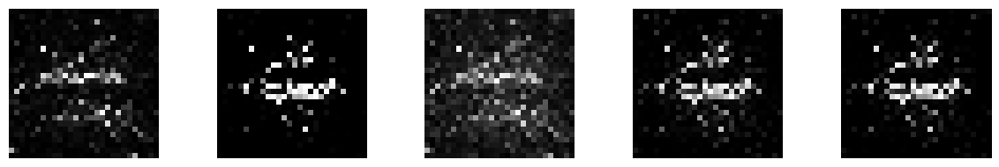

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 19ms/step


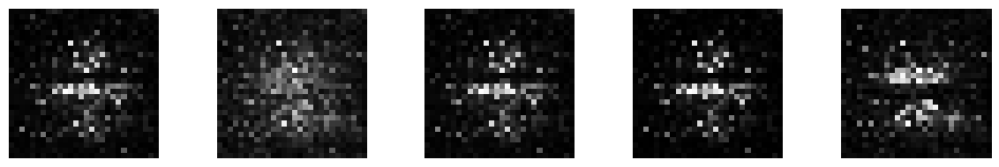

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 23ms/step


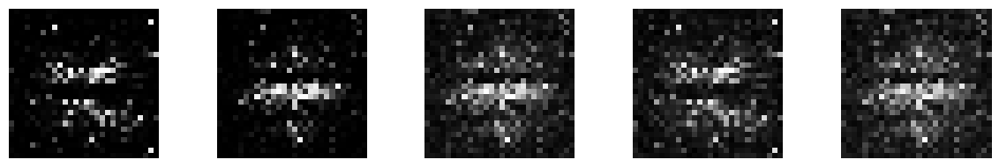

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 20ms/step


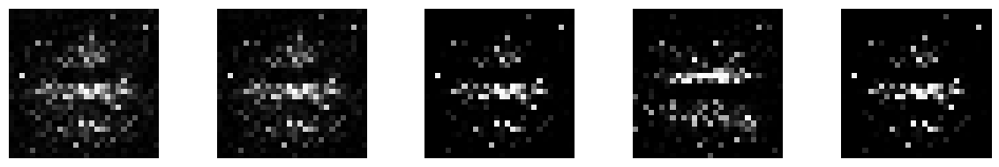

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 19ms/step


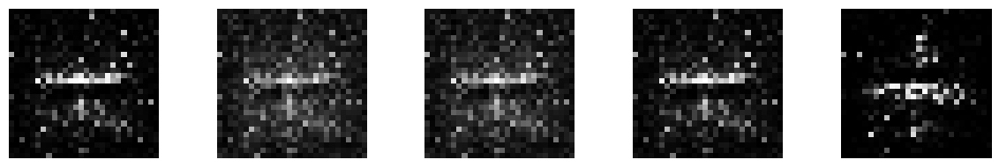

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 19ms/step


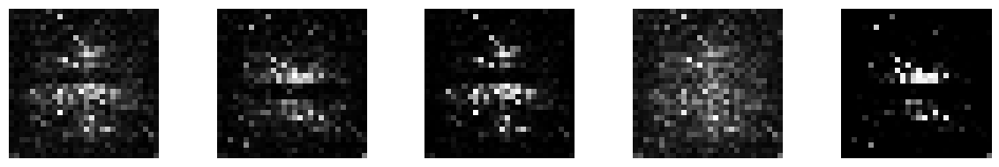

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 30ms/step


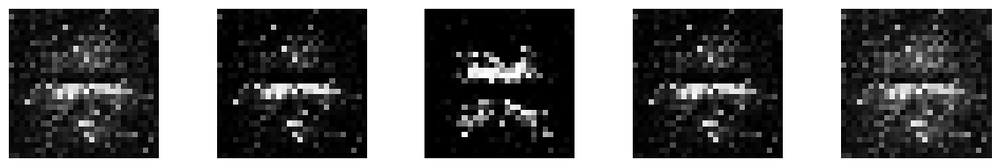

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 19ms/step


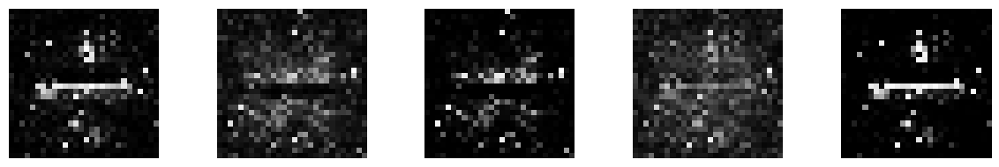

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 18ms/step


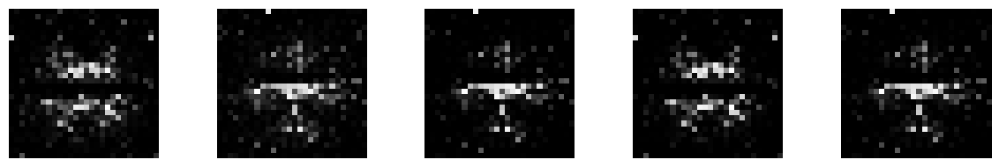

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 38ms/step


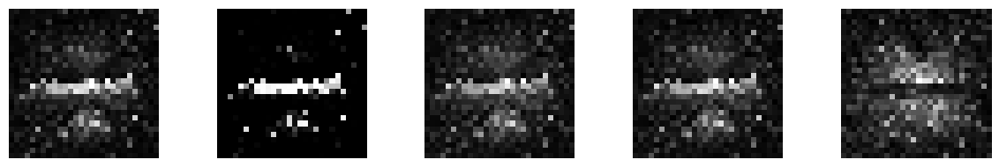

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 21ms/step


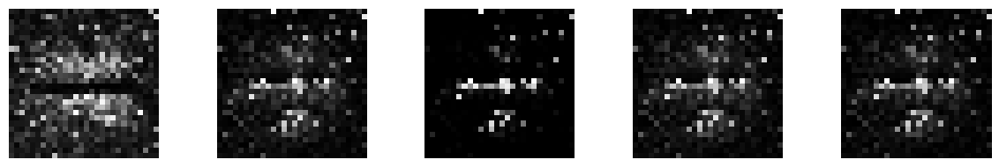

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 22ms/step


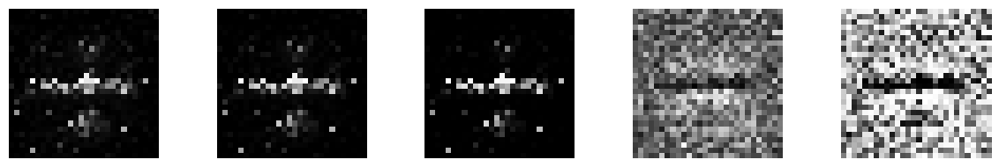

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 37ms/step


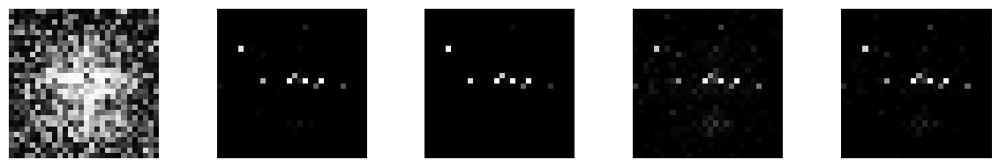

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 23ms/step


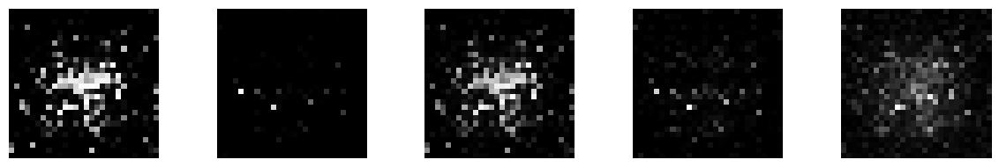

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 28ms/step


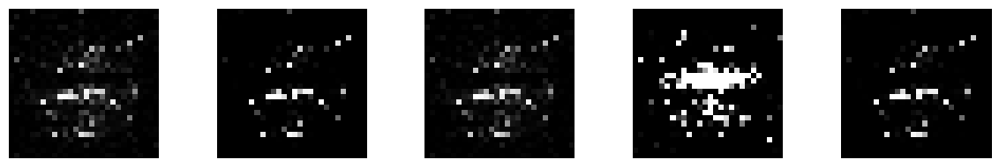

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 19ms/step


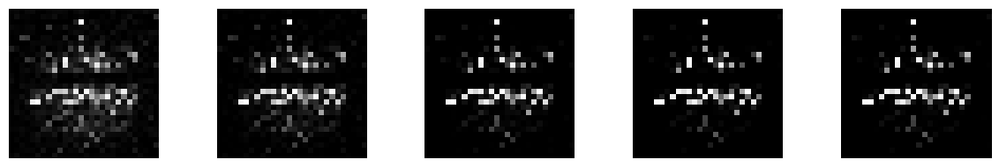

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 19ms/step


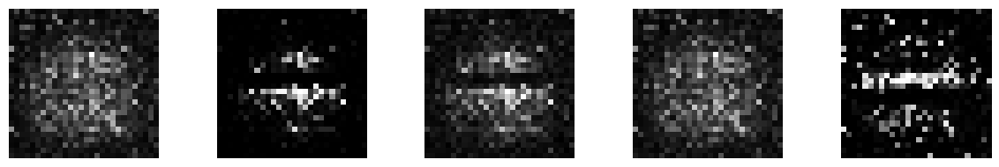

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 18ms/step


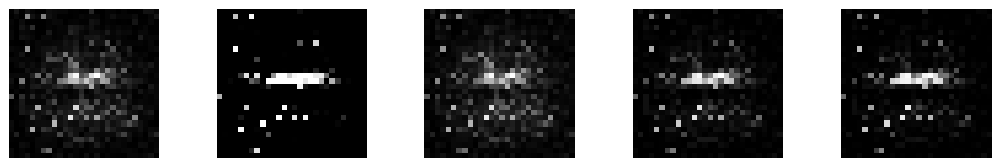

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 37ms/step


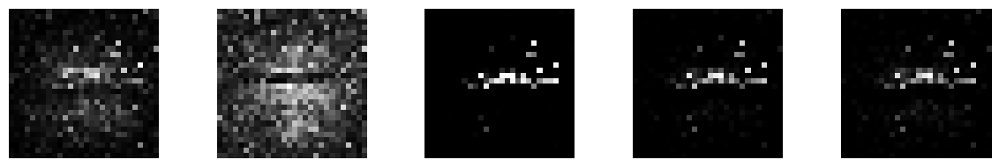

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 19ms/step


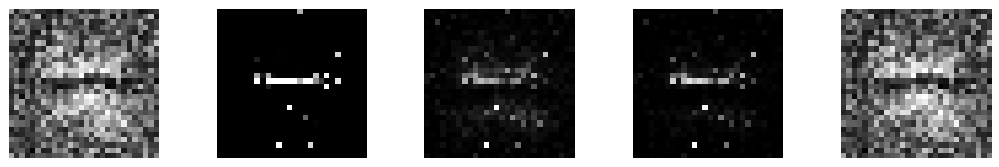

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 18ms/step


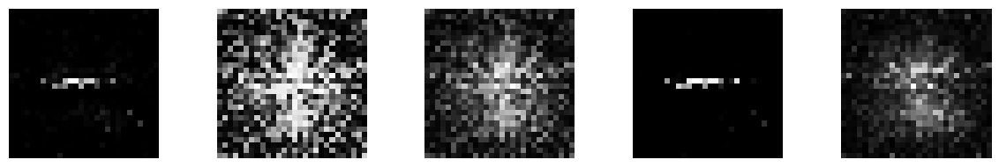

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 28ms/step


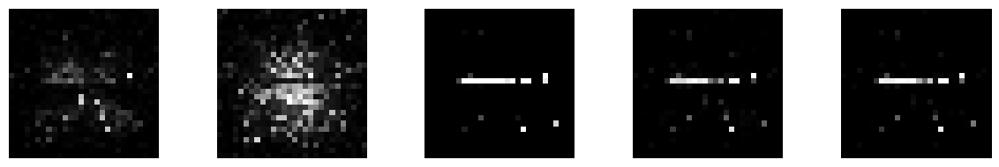

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 22ms/step


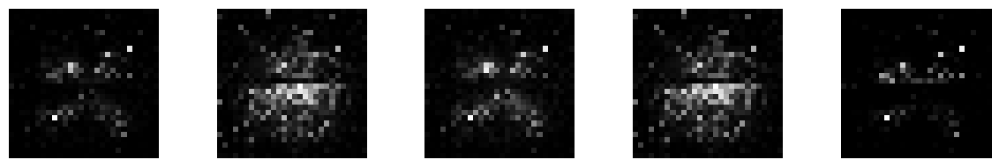

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 21ms/step


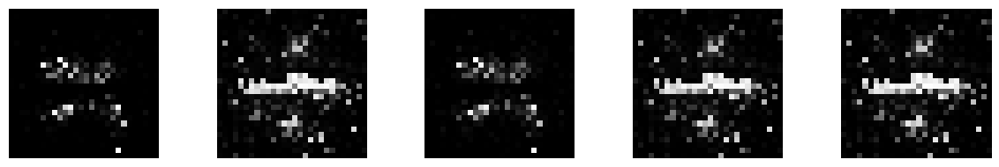

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 47ms/step


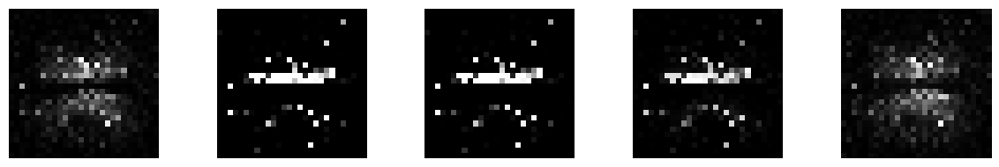

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 33ms/step


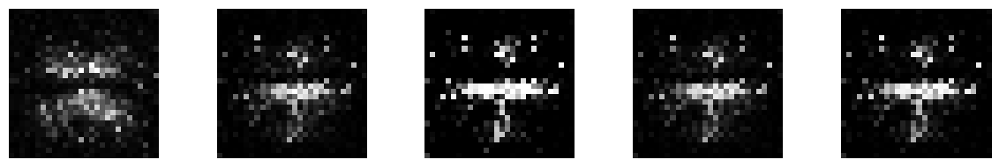

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 19ms/step


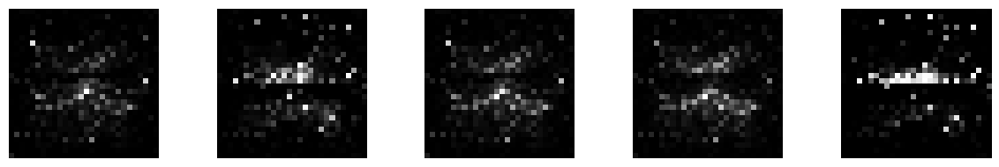

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 20ms/step


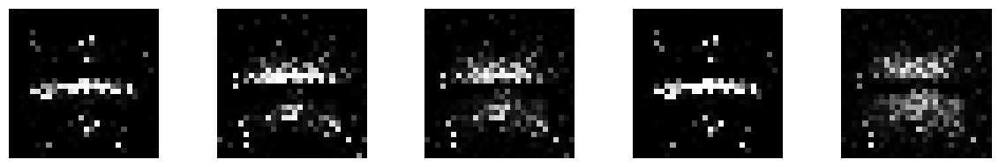

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 18ms/step


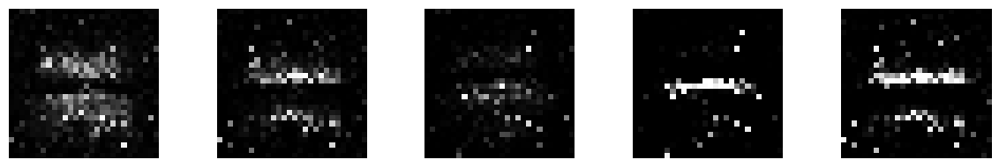

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 18ms/step


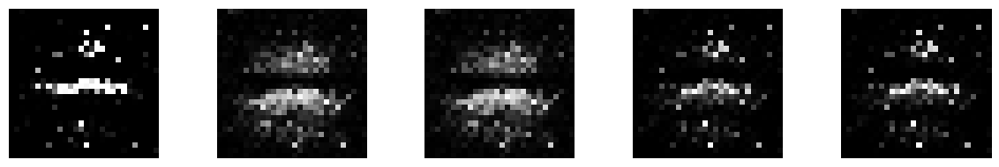

--------------- Epoch 51 ---------------
1/1 [==============================] - 0s 28ms/step


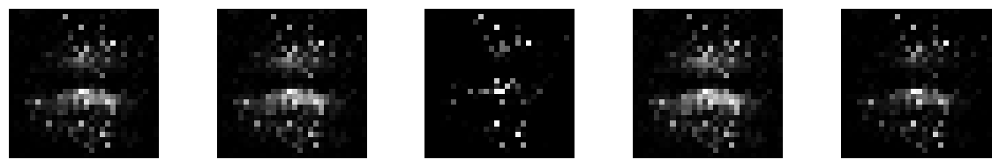

--------------- Epoch 52 ---------------
1/1 [==============================] - 0s 19ms/step


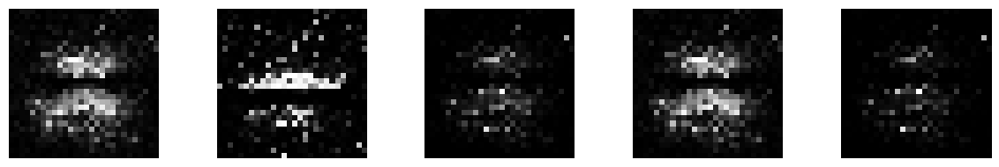

--------------- Epoch 53 ---------------
1/1 [==============================] - 0s 21ms/step


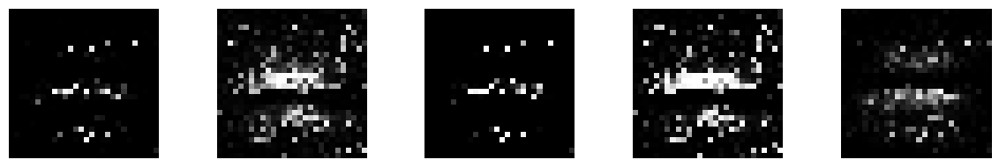

--------------- Epoch 54 ---------------
1/1 [==============================] - 0s 18ms/step


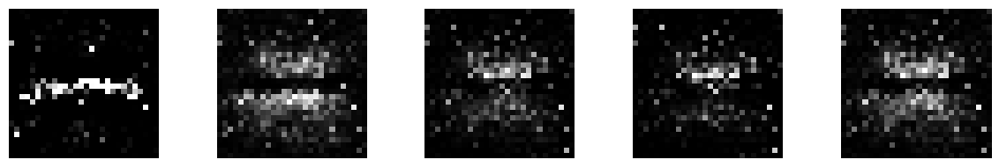

--------------- Epoch 55 ---------------
1/1 [==============================] - 0s 21ms/step


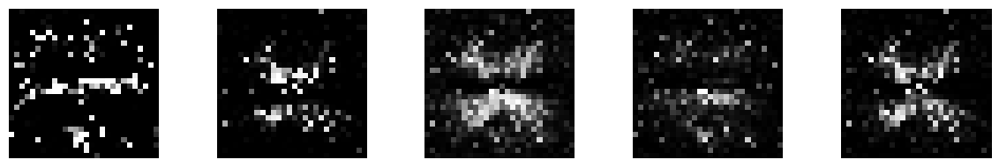

--------------- Epoch 56 ---------------
1/1 [==============================] - 0s 20ms/step


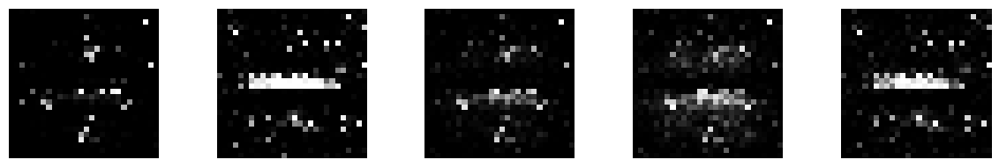

--------------- Epoch 57 ---------------
1/1 [==============================] - 0s 27ms/step


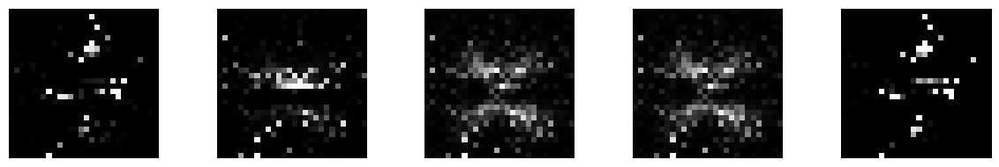

--------------- Epoch 58 ---------------
1/1 [==============================] - 0s 20ms/step


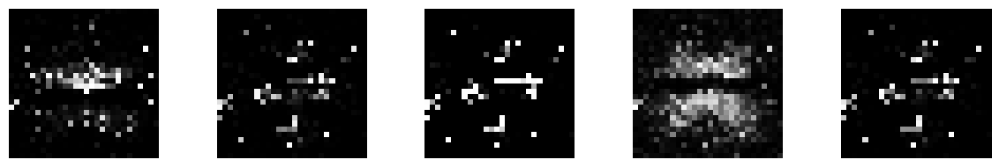

--------------- Epoch 59 ---------------
1/1 [==============================] - 0s 21ms/step


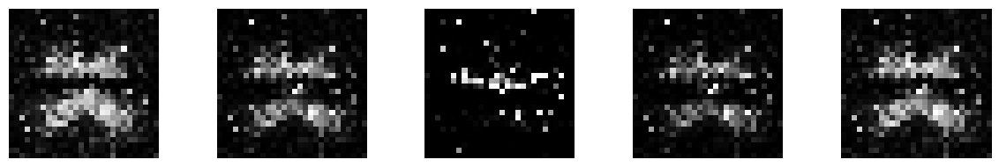

--------------- Epoch 60 ---------------
1/1 [==============================] - 0s 20ms/step


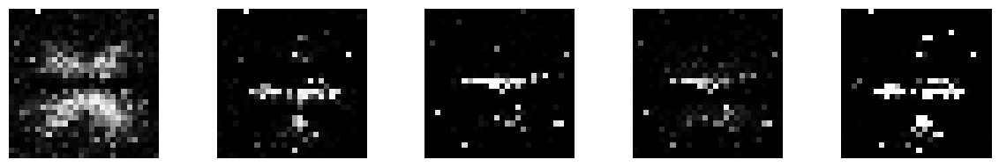

--------------- Epoch 61 ---------------
1/1 [==============================] - 0s 20ms/step


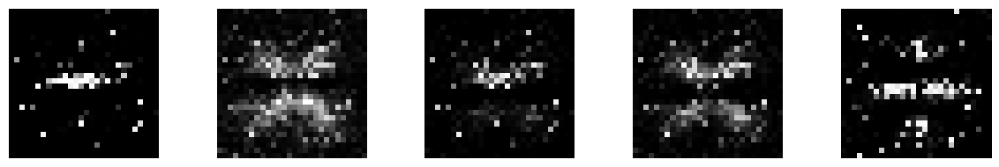

--------------- Epoch 62 ---------------
1/1 [==============================] - 0s 19ms/step


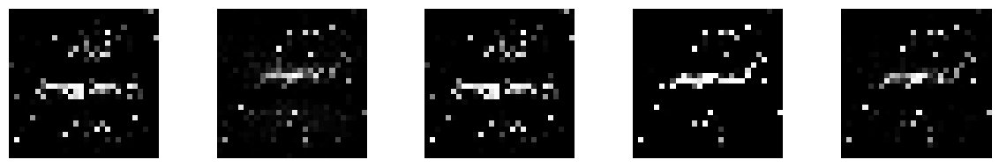

--------------- Epoch 63 ---------------
1/1 [==============================] - 0s 32ms/step


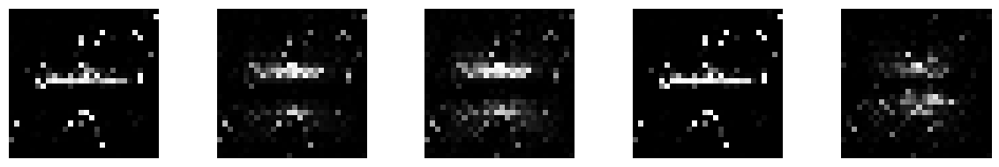

--------------- Epoch 64 ---------------
1/1 [==============================] - 0s 19ms/step


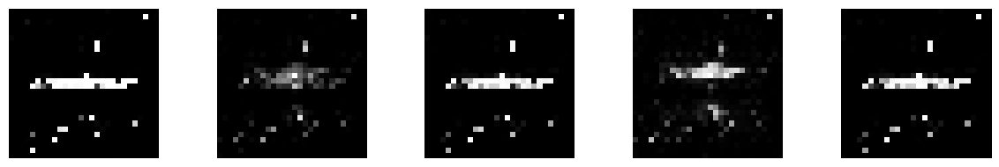

--------------- Epoch 65 ---------------
1/1 [==============================] - 0s 20ms/step


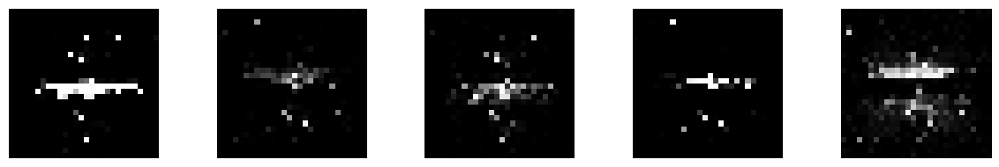

--------------- Epoch 66 ---------------
1/1 [==============================] - 0s 20ms/step


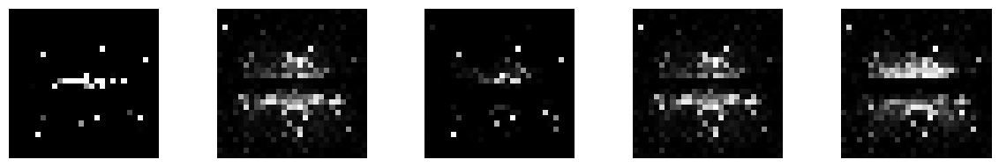

--------------- Epoch 67 ---------------
1/1 [==============================] - 0s 20ms/step


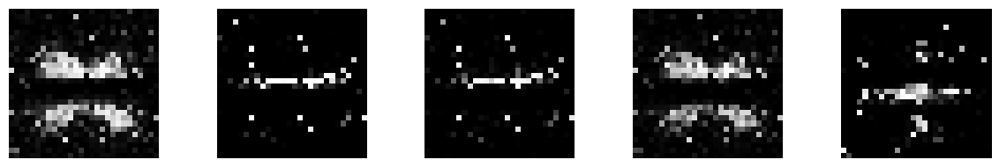

--------------- Epoch 68 ---------------
1/1 [==============================] - 0s 21ms/step


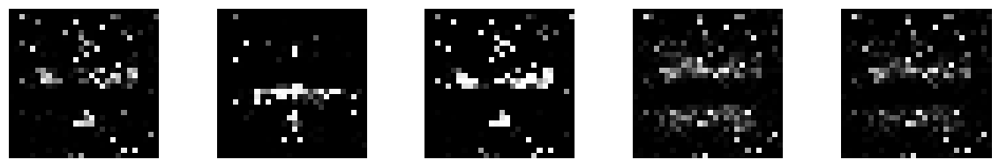

--------------- Epoch 69 ---------------
1/1 [==============================] - 0s 35ms/step


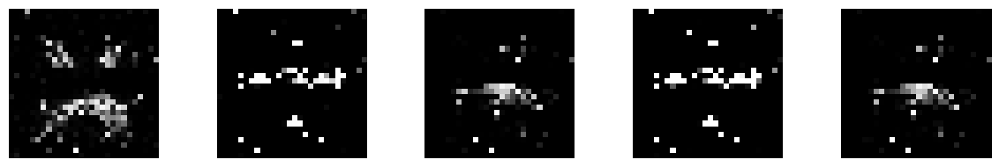

--------------- Epoch 70 ---------------
1/1 [==============================] - 0s 20ms/step


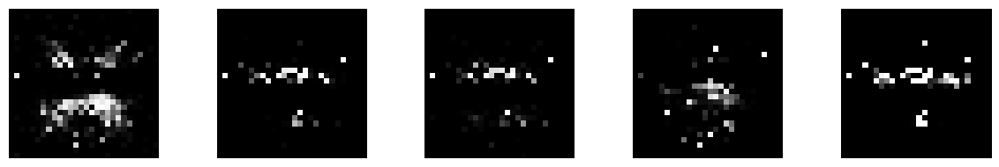

--------------- Epoch 71 ---------------
1/1 [==============================] - 0s 18ms/step


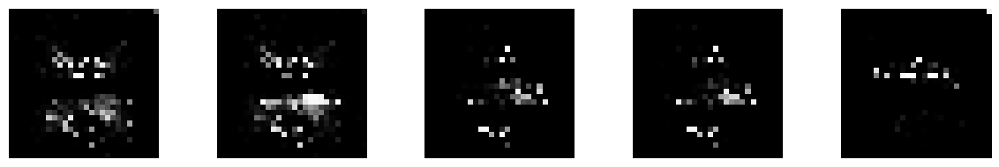

--------------- Epoch 72 ---------------
1/1 [==============================] - 0s 18ms/step


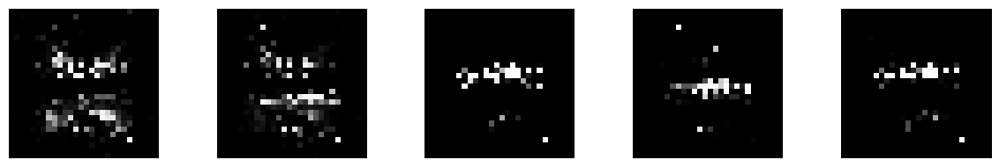

--------------- Epoch 73 ---------------
1/1 [==============================] - 0s 19ms/step


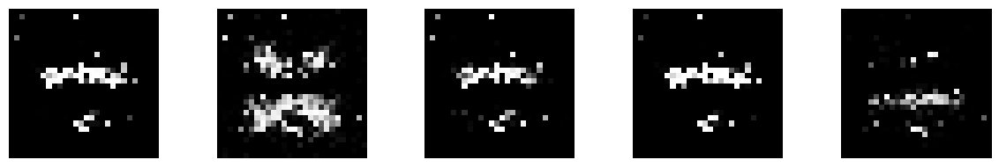

--------------- Epoch 74 ---------------
1/1 [==============================] - 0s 18ms/step


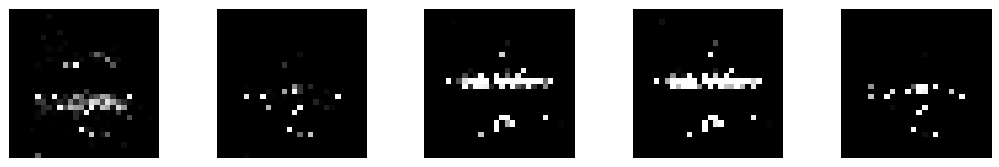

--------------- Epoch 75 ---------------
1/1 [==============================] - 0s 31ms/step


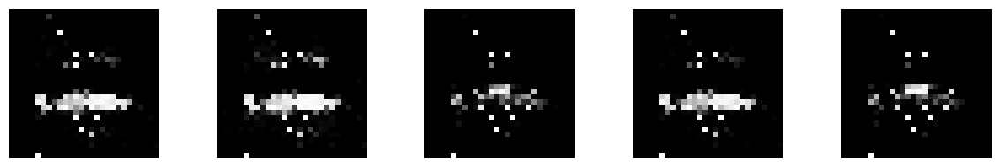

--------------- Epoch 76 ---------------
1/1 [==============================] - 0s 31ms/step


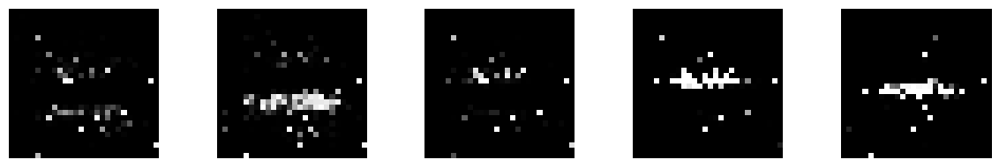

--------------- Epoch 77 ---------------
1/1 [==============================] - 0s 22ms/step


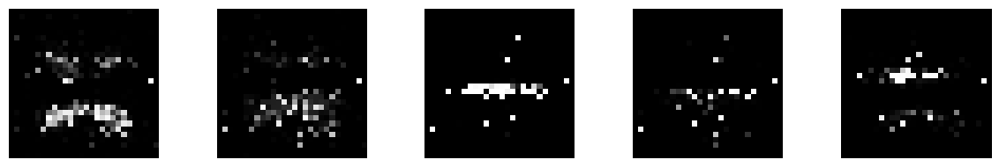

--------------- Epoch 78 ---------------
1/1 [==============================] - 0s 17ms/step


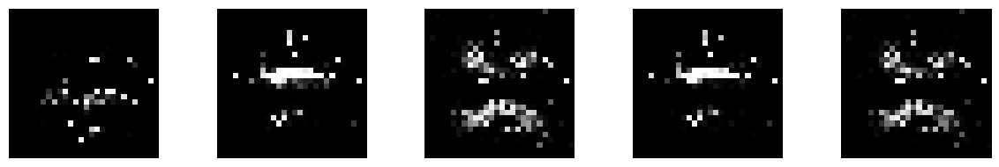

--------------- Epoch 79 ---------------
1/1 [==============================] - 0s 17ms/step


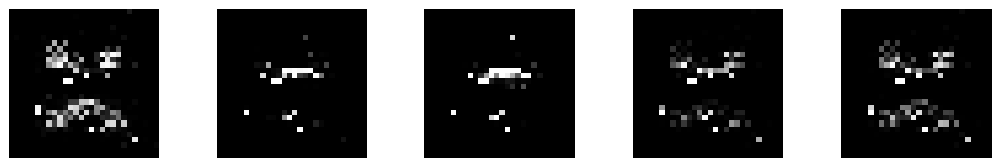

--------------- Epoch 80 ---------------
1/1 [==============================] - 0s 21ms/step


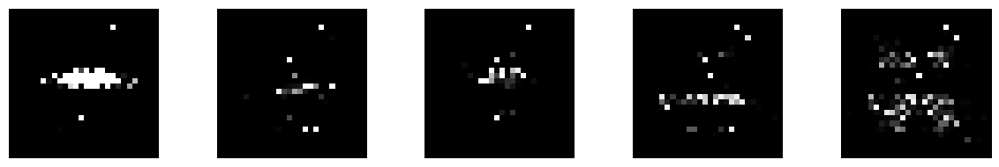

--------------- Epoch 81 ---------------
1/1 [==============================] - 0s 20ms/step


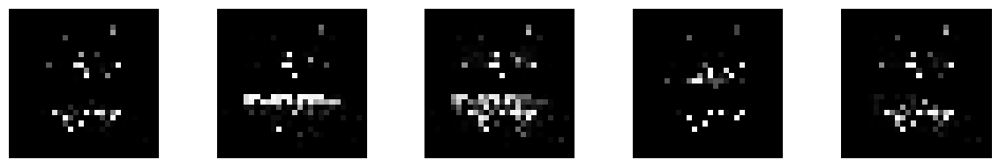

--------------- Epoch 82 ---------------
1/1 [==============================] - 0s 34ms/step


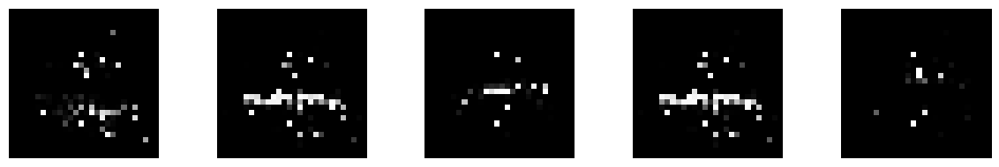

--------------- Epoch 83 ---------------
1/1 [==============================] - 0s 19ms/step


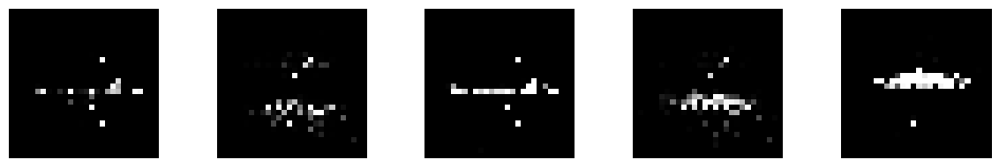

--------------- Epoch 84 ---------------
1/1 [==============================] - 0s 19ms/step


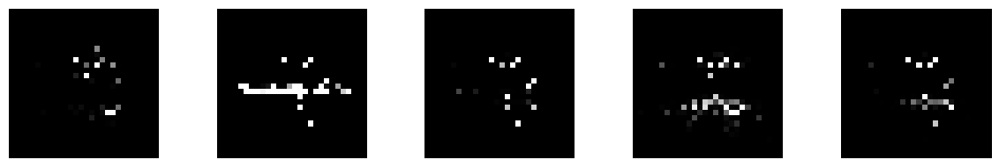

--------------- Epoch 85 ---------------
1/1 [==============================] - 0s 19ms/step


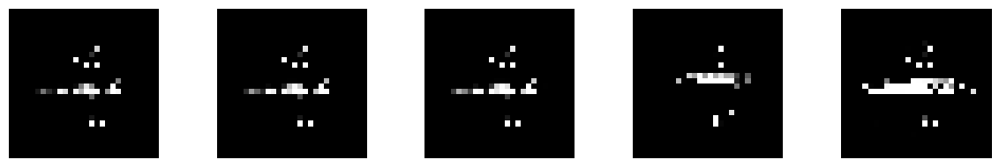

--------------- Epoch 86 ---------------
1/1 [==============================] - 0s 18ms/step


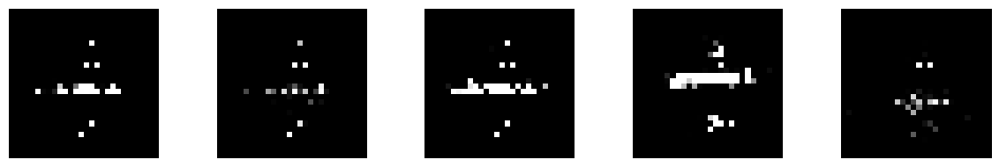

--------------- Epoch 87 ---------------
1/1 [==============================] - 0s 19ms/step


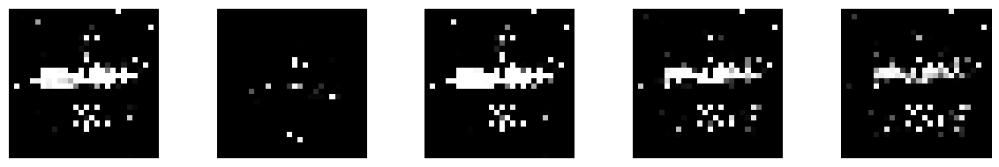

--------------- Epoch 88 ---------------
1/1 [==============================] - 0s 27ms/step


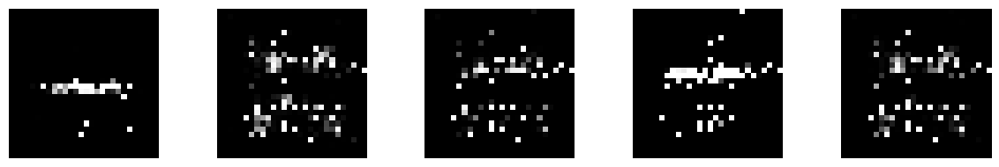

--------------- Epoch 89 ---------------
1/1 [==============================] - 0s 18ms/step


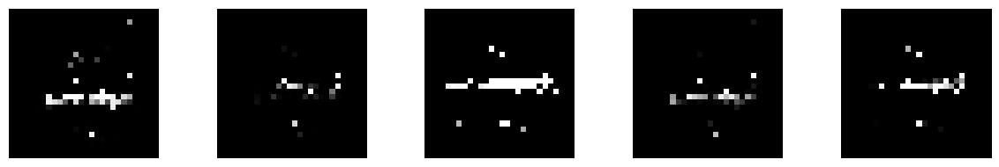

--------------- Epoch 90 ---------------
1/1 [==============================] - 0s 18ms/step


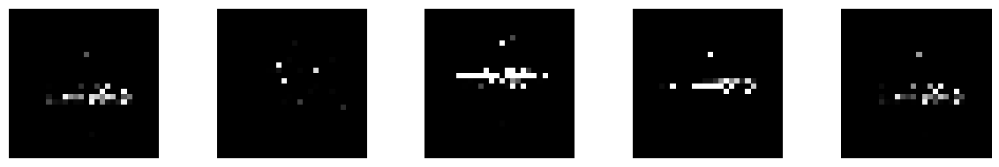

--------------- Epoch 91 ---------------
1/1 [==============================] - 0s 16ms/step


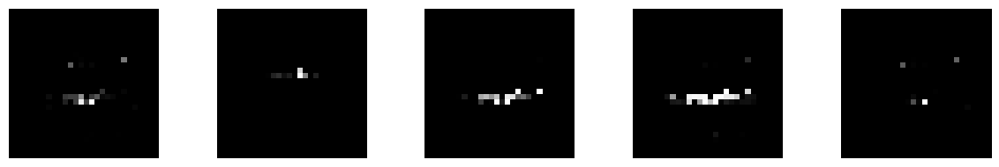

--------------- Epoch 92 ---------------
1/1 [==============================] - 0s 21ms/step


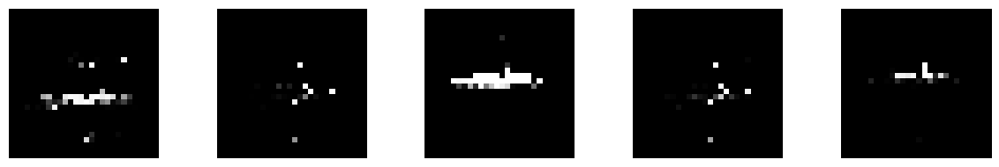

--------------- Epoch 93 ---------------
1/1 [==============================] - 0s 23ms/step


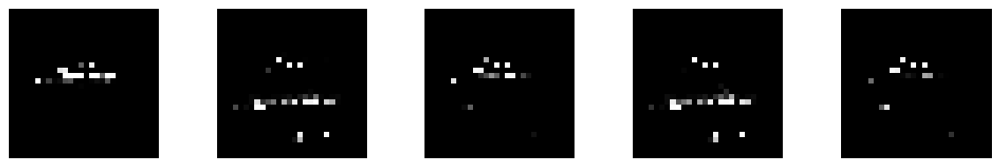

--------------- Epoch 94 ---------------
1/1 [==============================] - 0s 31ms/step


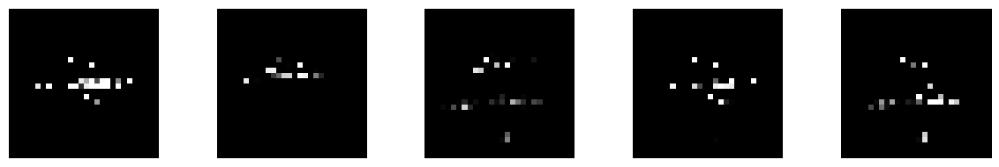

--------------- Epoch 95 ---------------
1/1 [==============================] - 0s 20ms/step


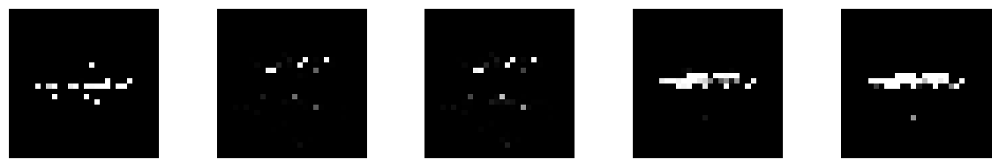

--------------- Epoch 96 ---------------
1/1 [==============================] - 0s 23ms/step


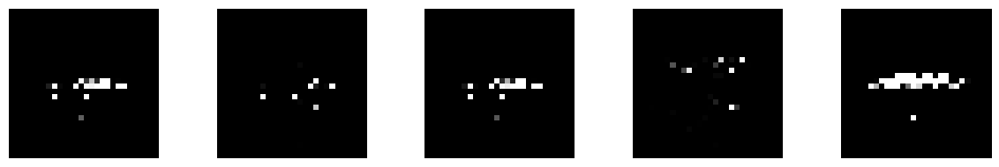

--------------- Epoch 97 ---------------
1/1 [==============================] - 0s 23ms/step


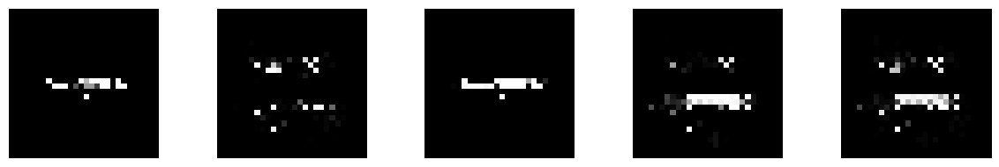

--------------- Epoch 98 ---------------
1/1 [==============================] - 0s 19ms/step


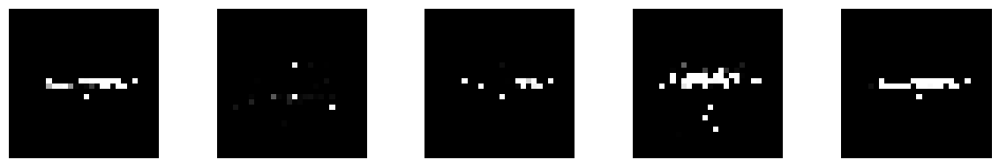

--------------- Epoch 99 ---------------
1/1 [==============================] - 0s 18ms/step


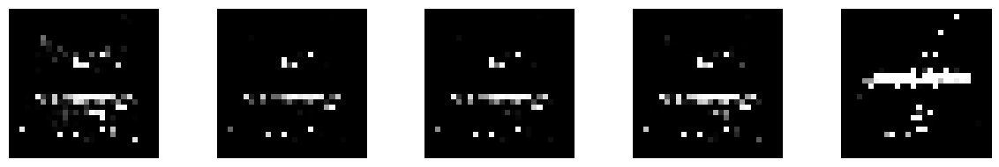

--------------- Epoch 100 ---------------
1/1 [==============================] - 0s 25ms/step


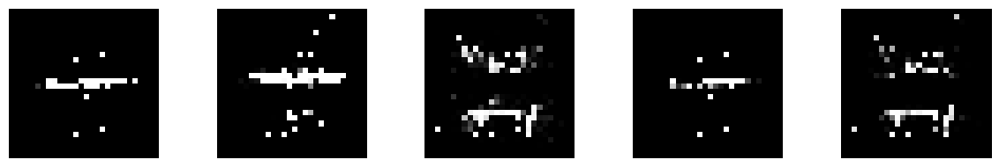

--------------- Epoch 101 ---------------
1/1 [==============================] - 0s 17ms/step


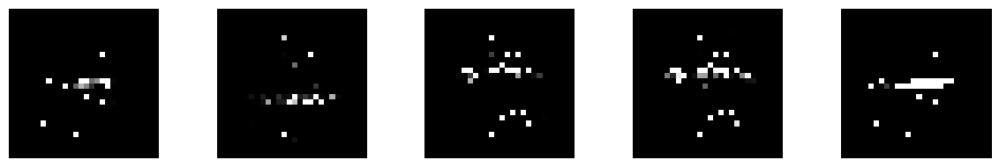

--------------- Epoch 102 ---------------
1/1 [==============================] - 0s 18ms/step


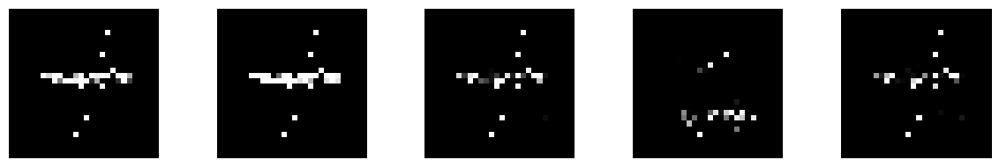

--------------- Epoch 103 ---------------
1/1 [==============================] - 0s 17ms/step


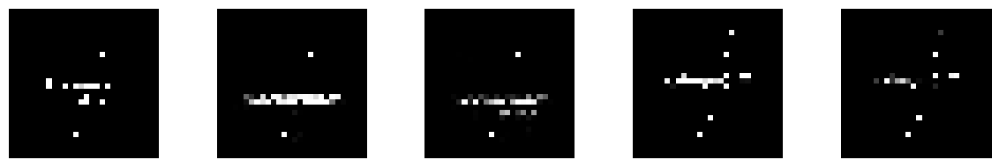

--------------- Epoch 104 ---------------
1/1 [==============================] - 0s 17ms/step


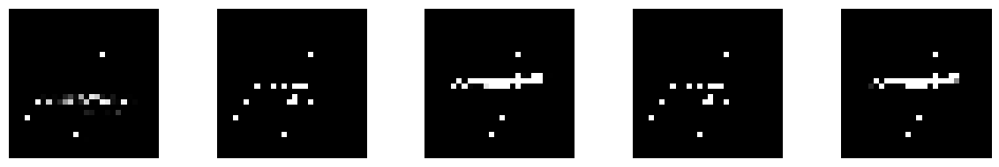

--------------- Epoch 105 ---------------
1/1 [==============================] - 0s 22ms/step


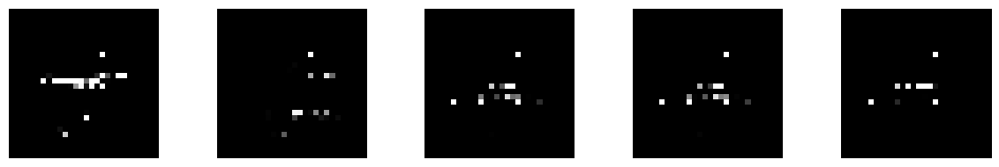

--------------- Epoch 106 ---------------
1/1 [==============================] - 0s 34ms/step


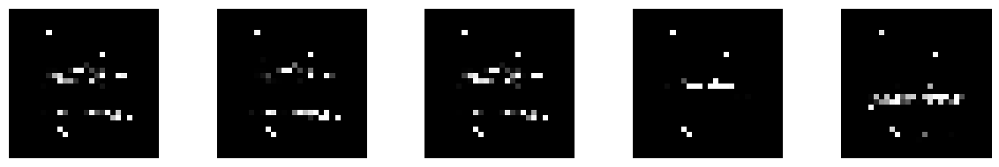

--------------- Epoch 107 ---------------
1/1 [==============================] - 0s 21ms/step


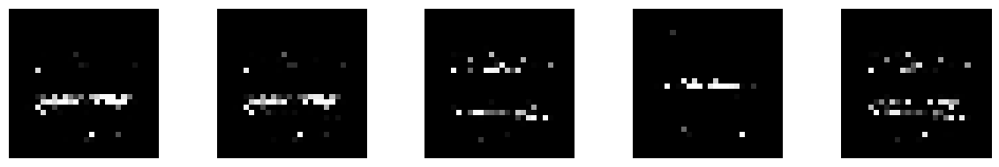

--------------- Epoch 108 ---------------
1/1 [==============================] - 0s 37ms/step


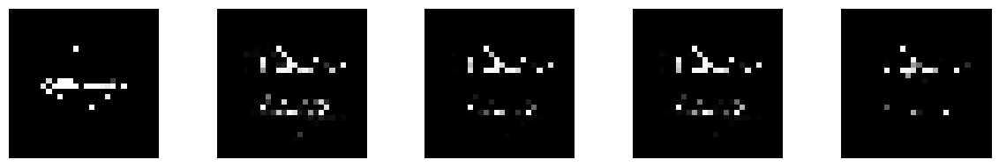

--------------- Epoch 109 ---------------
1/1 [==============================] - 0s 20ms/step


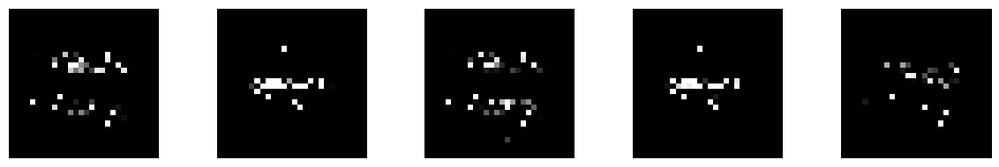

--------------- Epoch 110 ---------------
1/1 [==============================] - 0s 18ms/step


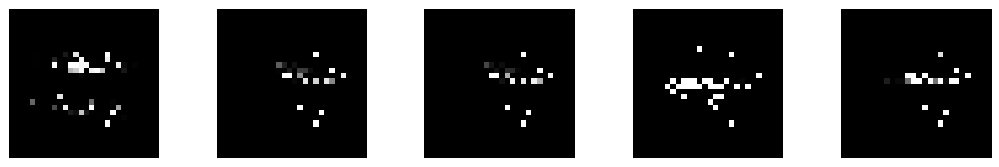

--------------- Epoch 111 ---------------
1/1 [==============================] - 0s 19ms/step


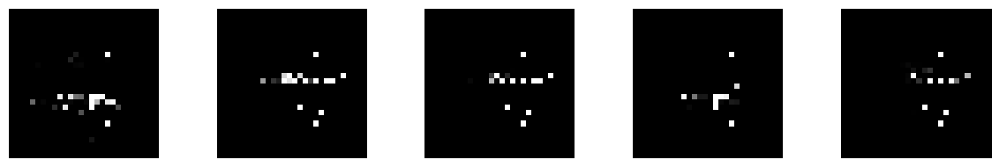

--------------- Epoch 112 ---------------
1/1 [==============================] - 0s 30ms/step


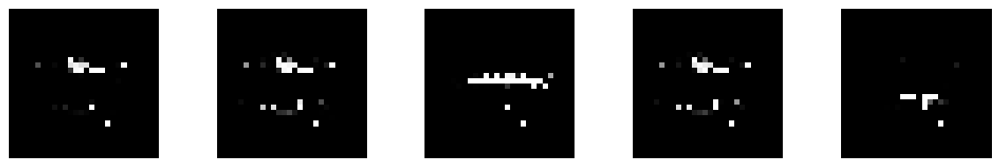

--------------- Epoch 113 ---------------
1/1 [==============================] - 0s 18ms/step


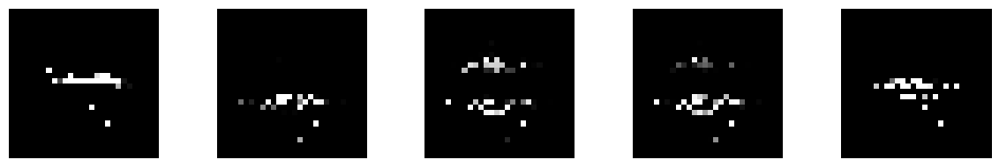

--------------- Epoch 114 ---------------
1/1 [==============================] - 0s 20ms/step


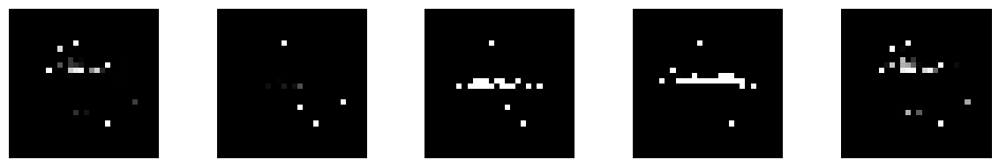

--------------- Epoch 115 ---------------
1/1 [==============================] - 0s 20ms/step


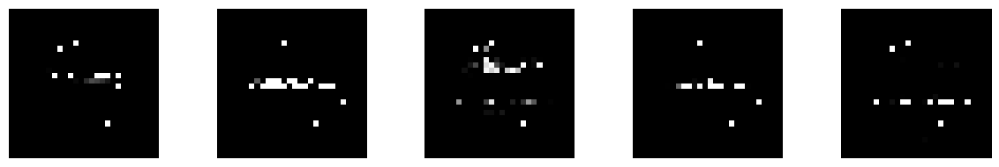

--------------- Epoch 116 ---------------
1/1 [==============================] - 0s 18ms/step


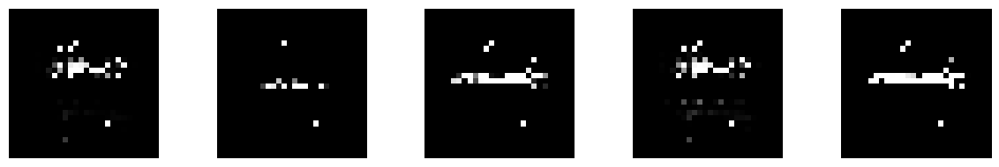

--------------- Epoch 117 ---------------
1/1 [==============================] - 0s 24ms/step


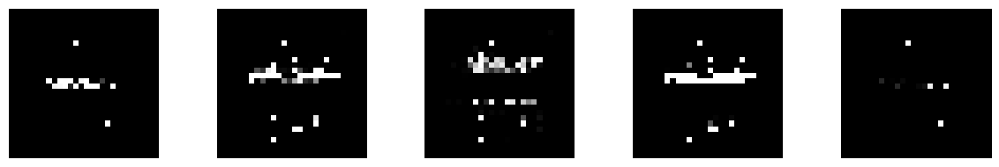

--------------- Epoch 118 ---------------
1/1 [==============================] - 0s 28ms/step


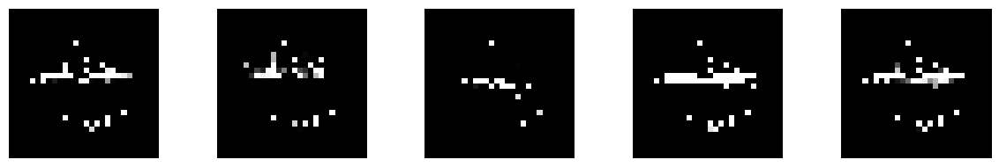

--------------- Epoch 119 ---------------
1/1 [==============================] - 0s 18ms/step


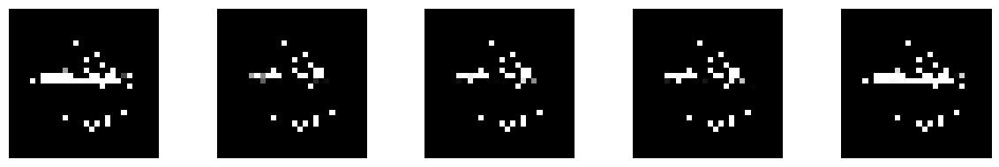

--------------- Epoch 120 ---------------
1/1 [==============================] - 0s 19ms/step


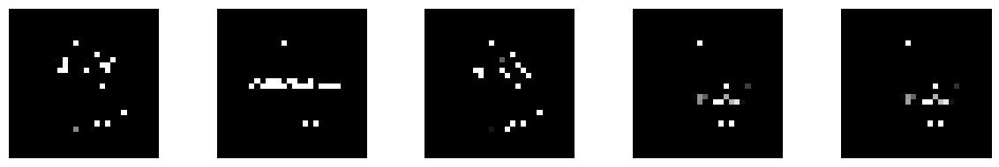

--------------- Epoch 121 ---------------
1/1 [==============================] - 0s 18ms/step


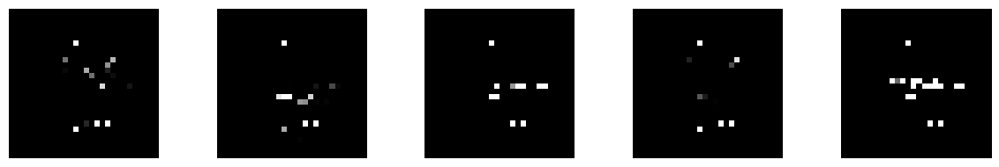

--------------- Epoch 122 ---------------
1/1 [==============================] - 0s 27ms/step


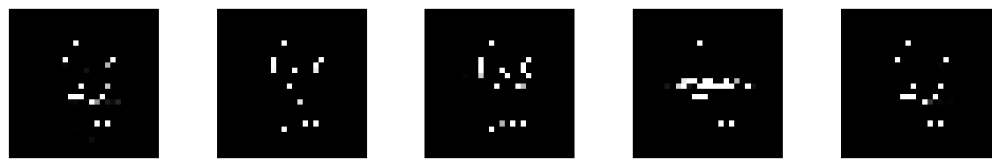

--------------- Epoch 123 ---------------
1/1 [==============================] - 0s 30ms/step


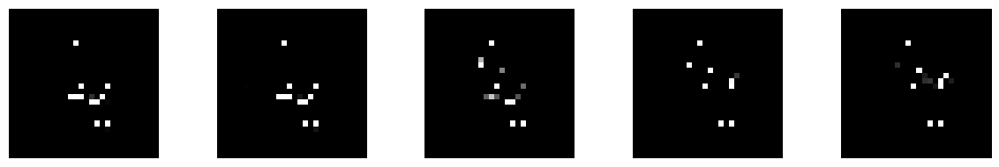

--------------- Epoch 124 ---------------
1/1 [==============================] - 0s 20ms/step


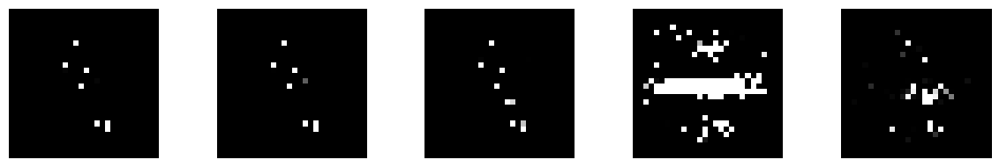

--------------- Epoch 125 ---------------
1/1 [==============================] - 0s 19ms/step


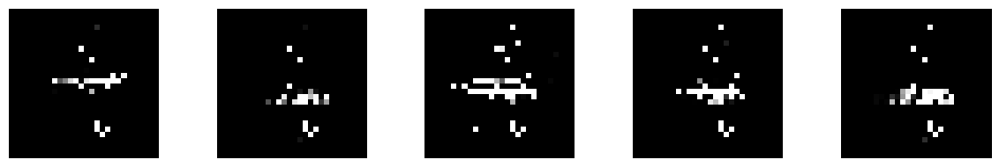

--------------- Epoch 126 ---------------
1/1 [==============================] - 0s 19ms/step


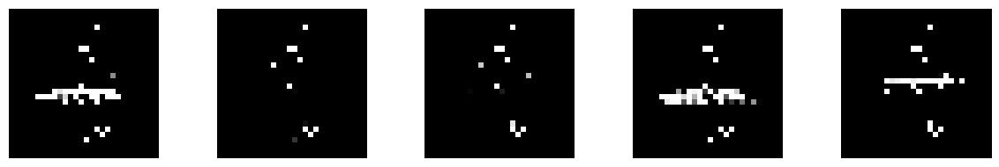

--------------- Epoch 127 ---------------
1/1 [==============================] - 0s 17ms/step


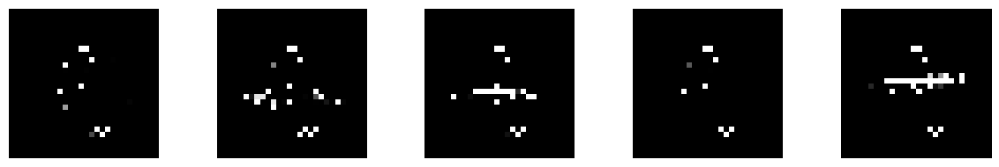

--------------- Epoch 128 ---------------
1/1 [==============================] - 0s 19ms/step


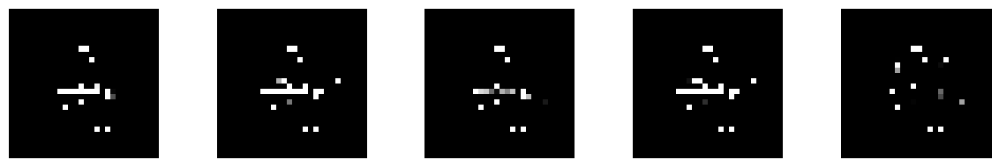

--------------- Epoch 129 ---------------
1/1 [==============================] - 0s 30ms/step


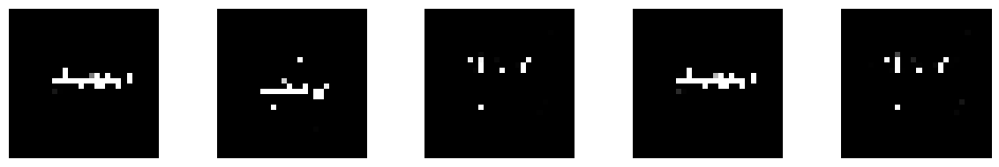

--------------- Epoch 130 ---------------
1/1 [==============================] - 0s 20ms/step


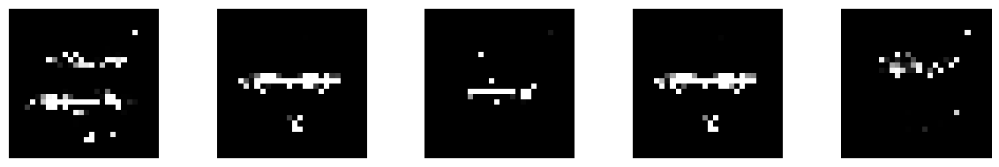

--------------- Epoch 131 ---------------
1/1 [==============================] - 0s 20ms/step


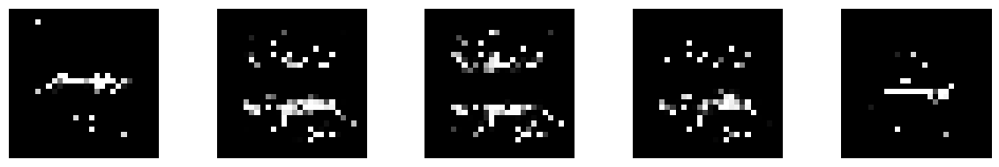

--------------- Epoch 132 ---------------
1/1 [==============================] - 0s 21ms/step


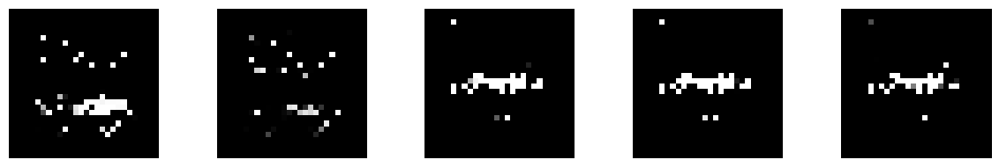

--------------- Epoch 133 ---------------
1/1 [==============================] - 0s 21ms/step


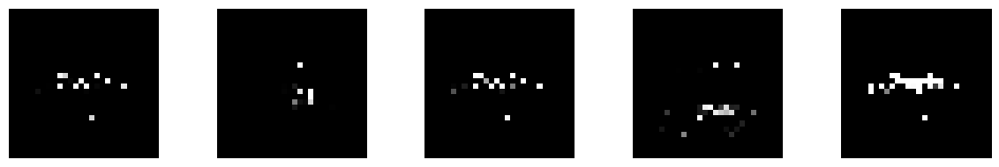

--------------- Epoch 134 ---------------
1/1 [==============================] - 0s 21ms/step


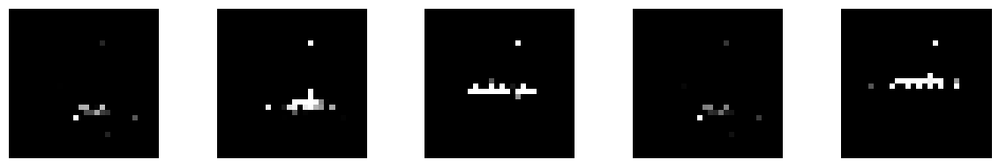

--------------- Epoch 135 ---------------
1/1 [==============================] - 0s 26ms/step


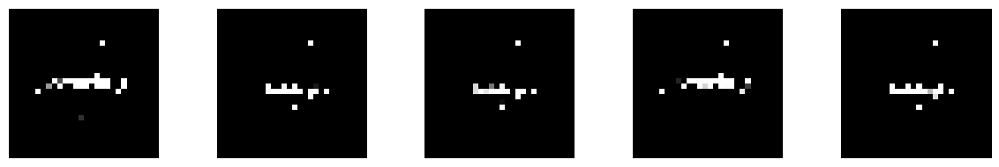

--------------- Epoch 136 ---------------
1/1 [==============================] - 0s 20ms/step


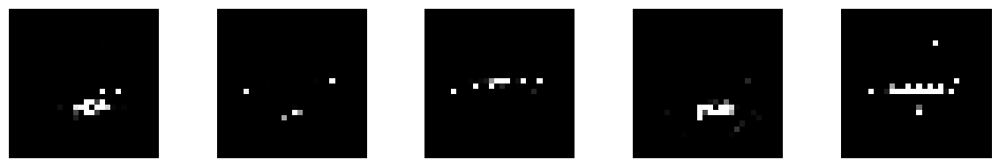

--------------- Epoch 137 ---------------
1/1 [==============================] - 0s 17ms/step


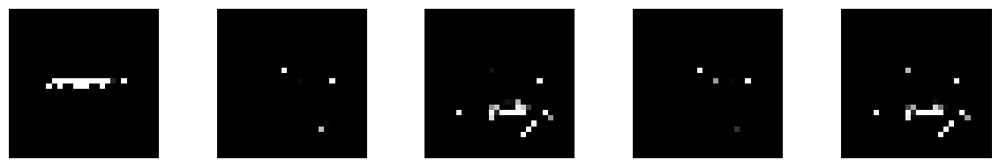

--------------- Epoch 138 ---------------
1/1 [==============================] - 0s 19ms/step


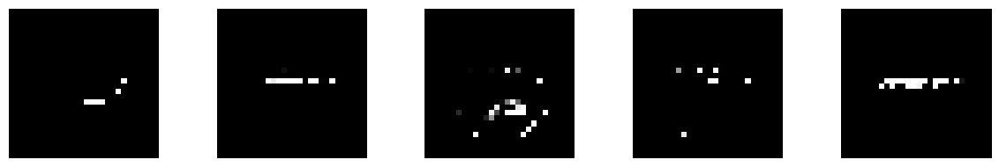

--------------- Epoch 139 ---------------
1/1 [==============================] - 0s 18ms/step


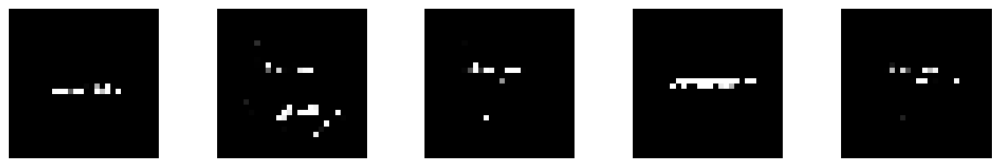

--------------- Epoch 140 ---------------
1/1 [==============================] - 0s 19ms/step


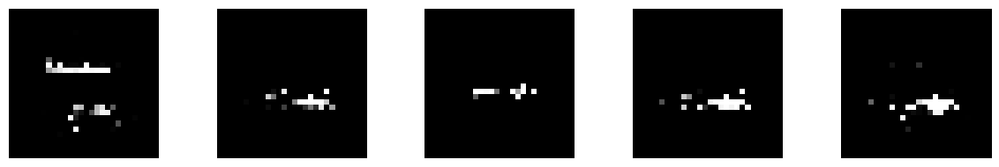

--------------- Epoch 141 ---------------
1/1 [==============================] - 0s 26ms/step


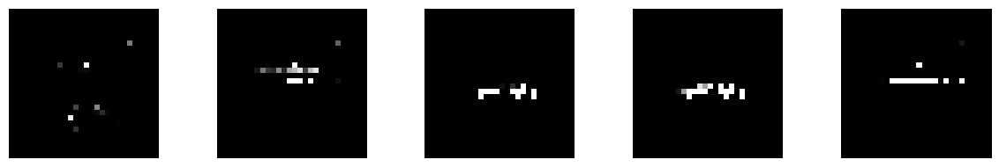

--------------- Epoch 142 ---------------
1/1 [==============================] - 0s 22ms/step


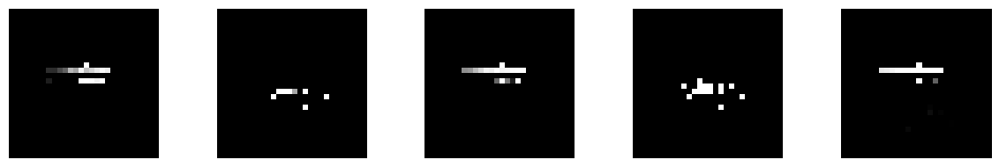

--------------- Epoch 143 ---------------
1/1 [==============================] - 0s 22ms/step


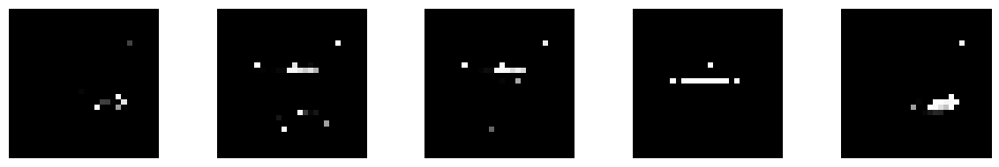

--------------- Epoch 144 ---------------
1/1 [==============================] - 0s 21ms/step


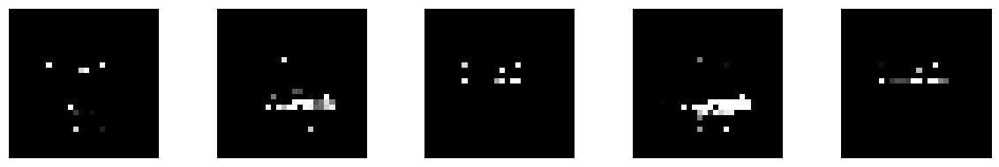

--------------- Epoch 145 ---------------
1/1 [==============================] - 0s 20ms/step


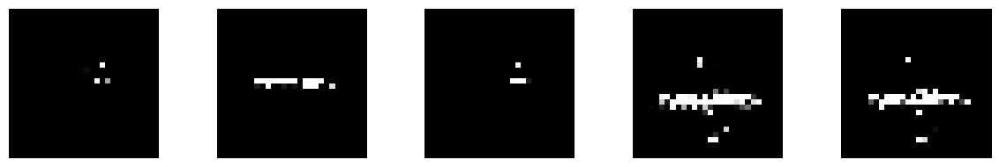

--------------- Epoch 146 ---------------
1/1 [==============================] - 0s 19ms/step


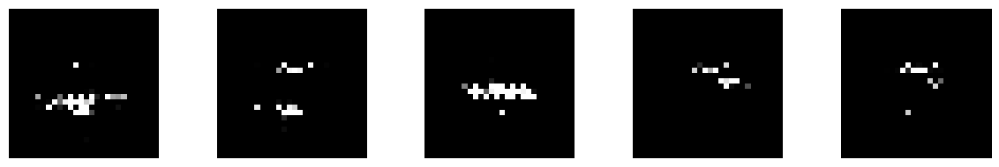

--------------- Epoch 147 ---------------
1/1 [==============================] - 0s 29ms/step


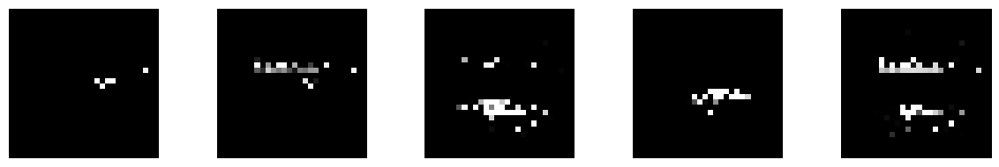

--------------- Epoch 148 ---------------
1/1 [==============================] - 0s 18ms/step


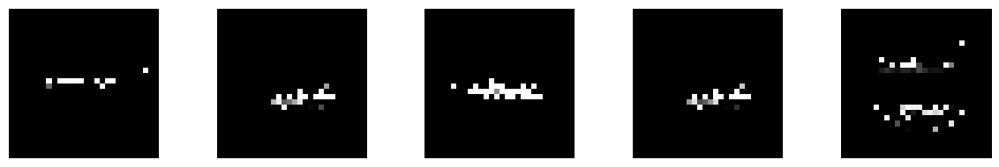

--------------- Epoch 149 ---------------
1/1 [==============================] - 0s 17ms/step


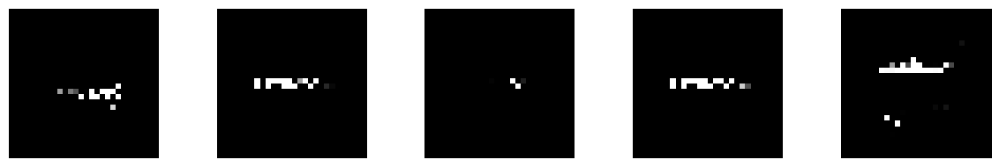

--------------- Epoch 150 ---------------
1/1 [==============================] - 0s 19ms/step


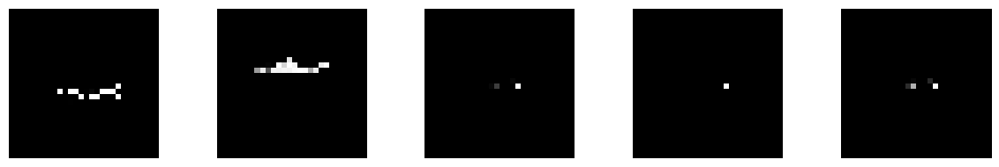

--------------- Epoch 151 ---------------
1/1 [==============================] - 0s 18ms/step


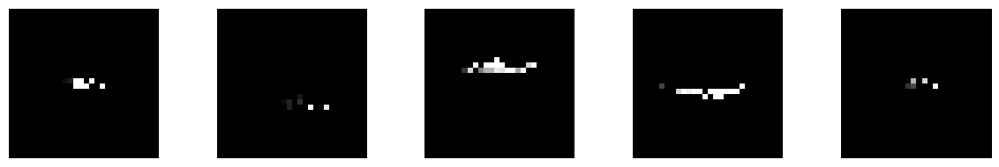

--------------- Epoch 152 ---------------
1/1 [==============================] - 0s 18ms/step


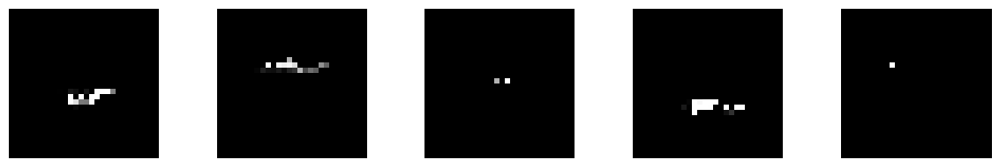

--------------- Epoch 153 ---------------
1/1 [==============================] - 0s 31ms/step


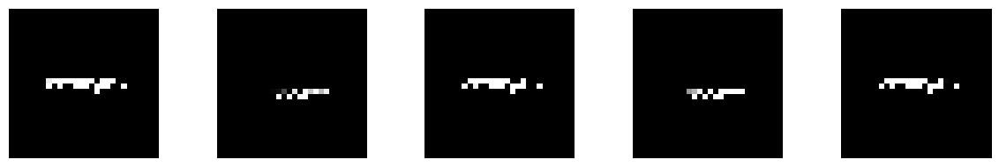

--------------- Epoch 154 ---------------
1/1 [==============================] - 0s 33ms/step


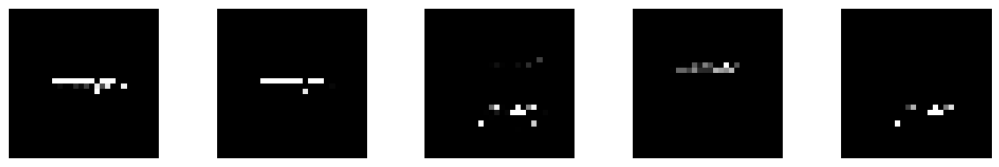

--------------- Epoch 155 ---------------
1/1 [==============================] - 0s 20ms/step


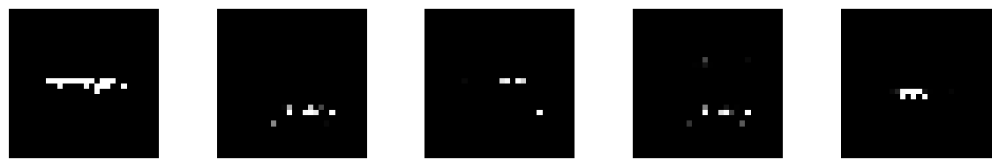

--------------- Epoch 156 ---------------
1/1 [==============================] - 0s 21ms/step


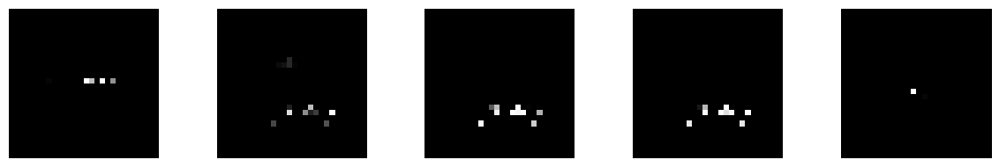

--------------- Epoch 157 ---------------
1/1 [==============================] - 0s 20ms/step


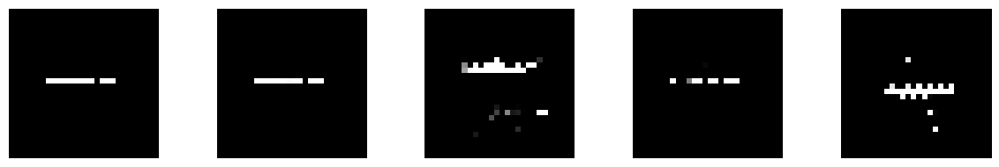

--------------- Epoch 158 ---------------
1/1 [==============================] - 0s 18ms/step


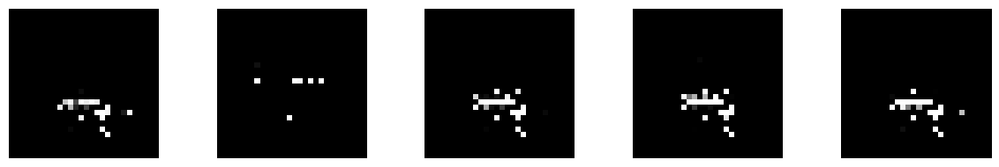

--------------- Epoch 159 ---------------
1/1 [==============================] - 0s 19ms/step


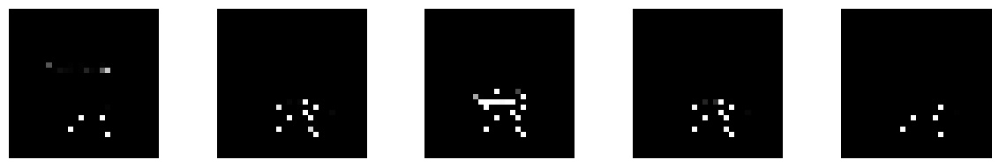

--------------- Epoch 160 ---------------
1/1 [==============================] - 0s 27ms/step


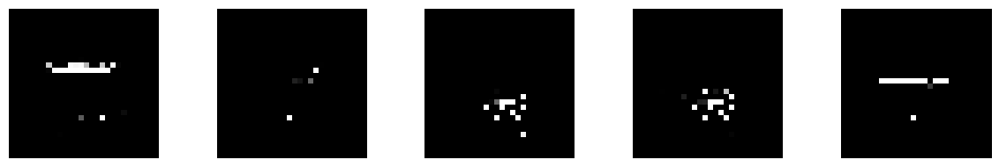

--------------- Epoch 161 ---------------
1/1 [==============================] - 0s 20ms/step


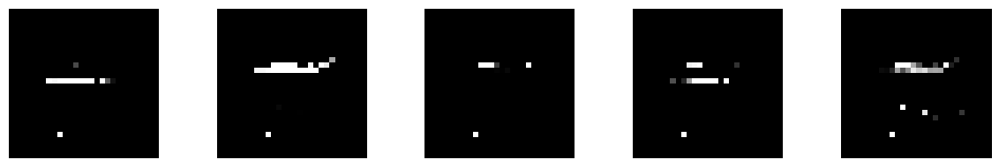

--------------- Epoch 162 ---------------
1/1 [==============================] - 0s 19ms/step


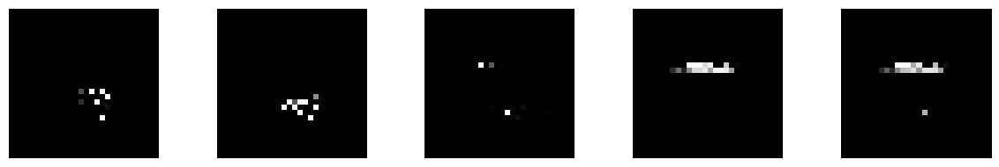

--------------- Epoch 163 ---------------
1/1 [==============================] - 0s 18ms/step


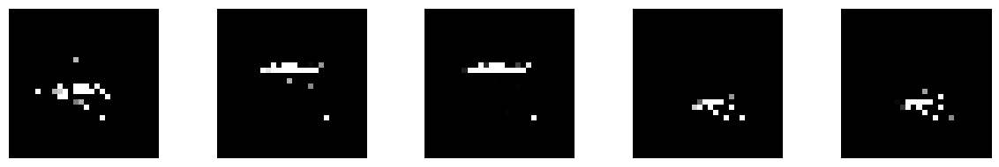

--------------- Epoch 164 ---------------
1/1 [==============================] - 0s 20ms/step


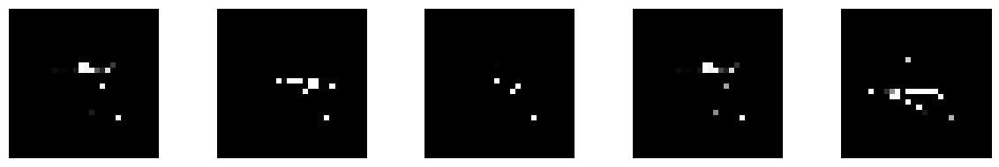

--------------- Epoch 165 ---------------
1/1 [==============================] - 0s 19ms/step


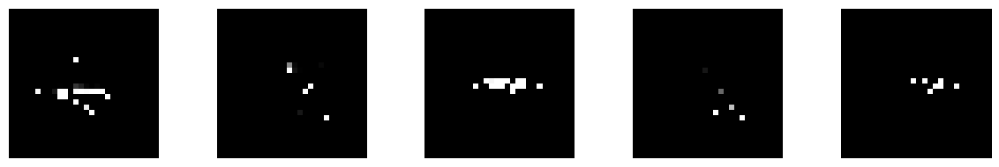

--------------- Epoch 166 ---------------
1/1 [==============================] - 0s 25ms/step


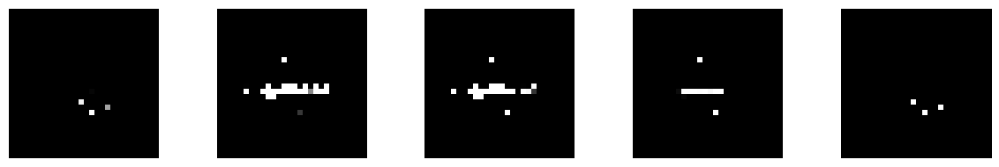

--------------- Epoch 167 ---------------
1/1 [==============================] - 0s 21ms/step


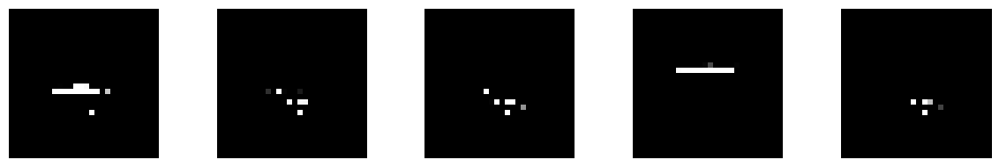

--------------- Epoch 168 ---------------
1/1 [==============================] - 0s 25ms/step


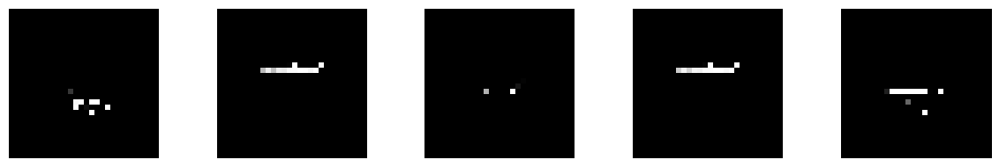

--------------- Epoch 169 ---------------
1/1 [==============================] - 0s 22ms/step


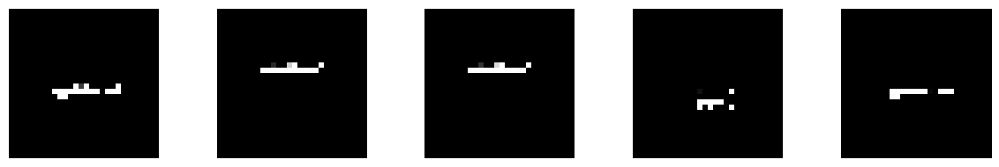

--------------- Epoch 170 ---------------
1/1 [==============================] - 0s 21ms/step


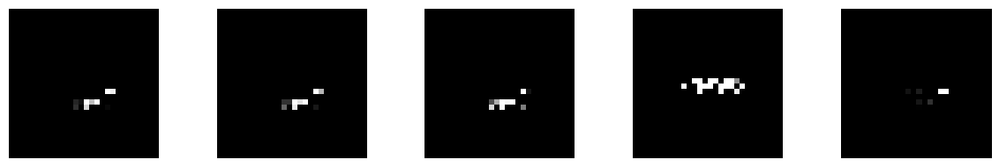

--------------- Epoch 171 ---------------
1/1 [==============================] - 0s 30ms/step


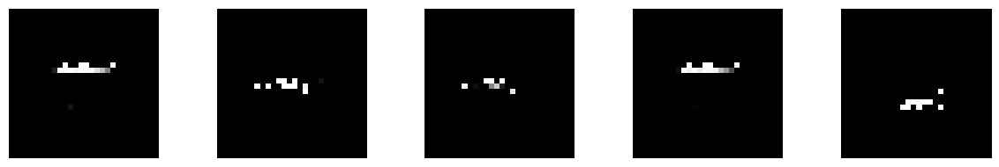

--------------- Epoch 172 ---------------
1/1 [==============================] - 0s 28ms/step


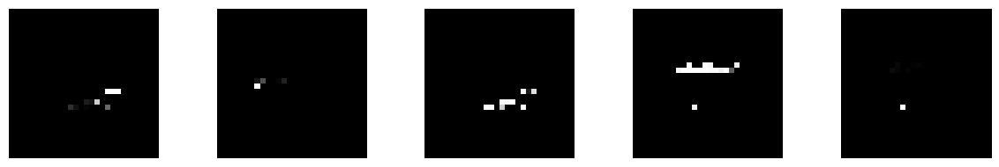

--------------- Epoch 173 ---------------
1/1 [==============================] - 0s 19ms/step


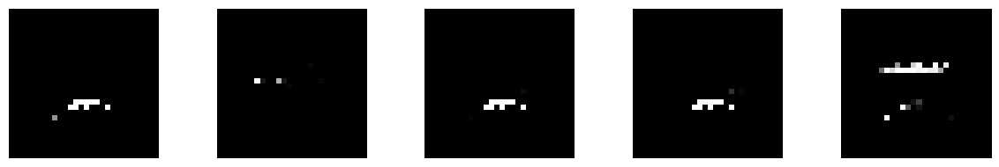

--------------- Epoch 174 ---------------
1/1 [==============================] - 0s 17ms/step


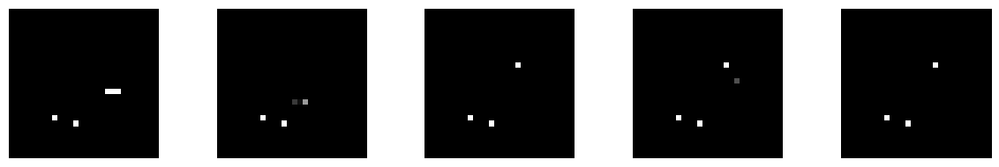

--------------- Epoch 175 ---------------
1/1 [==============================] - 0s 17ms/step


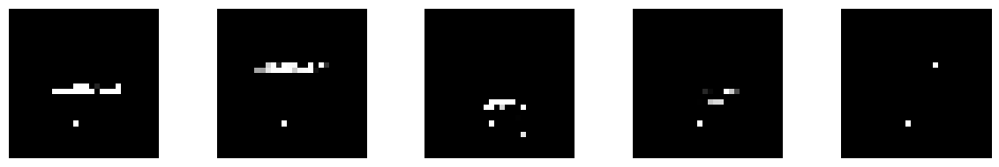

--------------- Epoch 177 ---------------
1/1 [==============================] - 0s 19ms/step


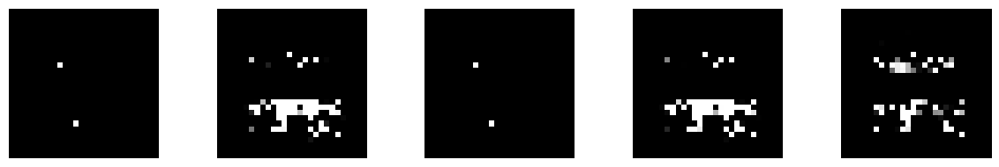

--------------- Epoch 178 ---------------
1/1 [==============================] - 0s 30ms/step


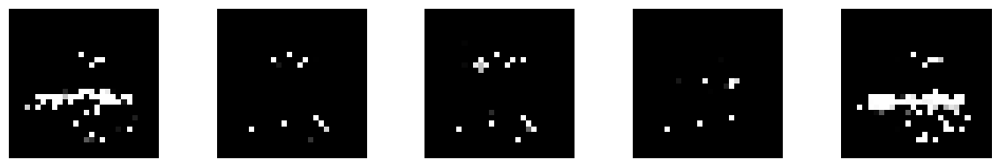

--------------- Epoch 179 ---------------
1/1 [==============================] - 0s 20ms/step


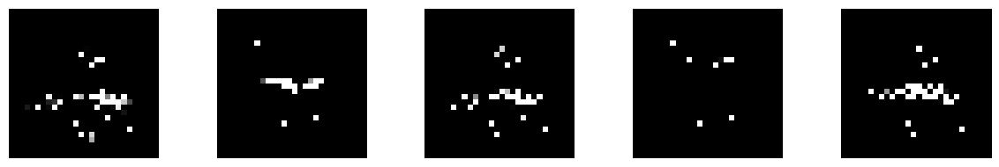

--------------- Epoch 180 ---------------
1/1 [==============================] - 0s 22ms/step


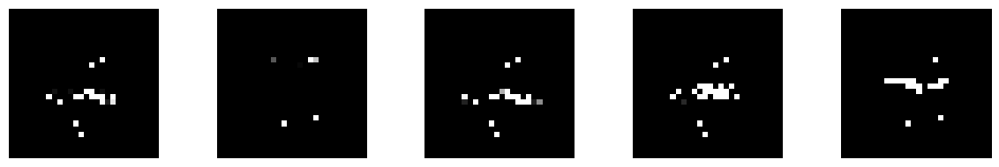

--------------- Epoch 181 ---------------
1/1 [==============================] - 0s 20ms/step


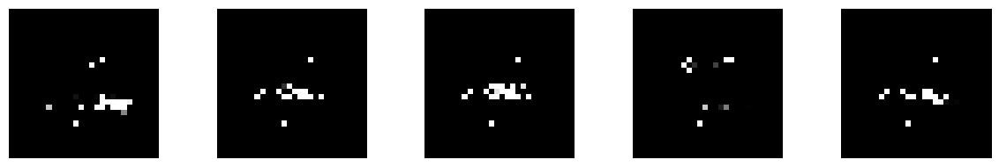

--------------- Epoch 182 ---------------
1/1 [==============================] - 0s 20ms/step


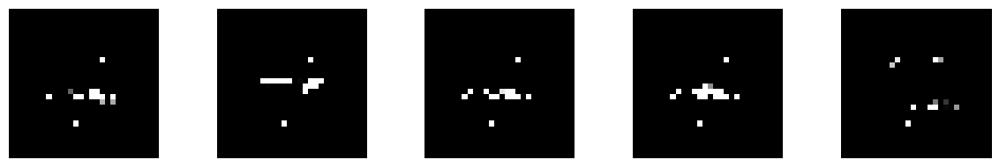

--------------- Epoch 183 ---------------
1/1 [==============================] - 0s 30ms/step


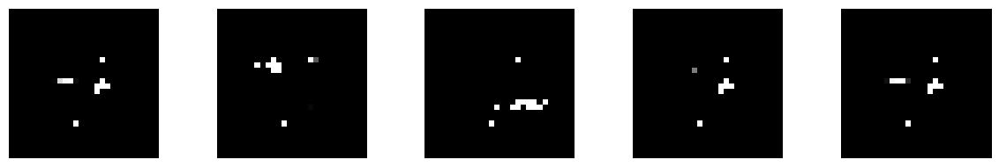

--------------- Epoch 184 ---------------
1/1 [==============================] - 0s 40ms/step


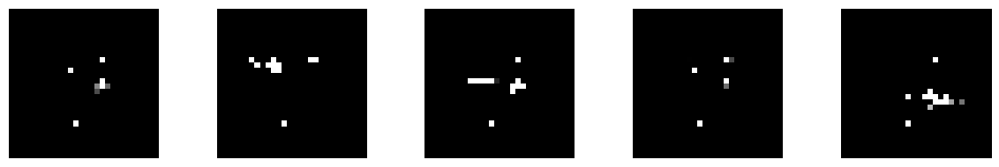

--------------- Epoch 185 ---------------
1/1 [==============================] - 0s 18ms/step


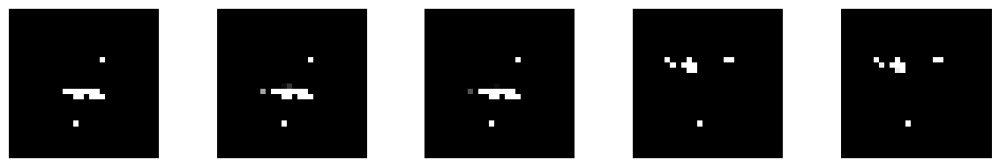

--------------- Epoch 186 ---------------
1/1 [==============================] - 0s 19ms/step


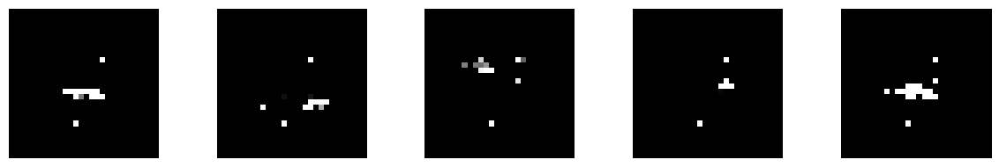

--------------- Epoch 187 ---------------
1/1 [==============================] - 0s 18ms/step


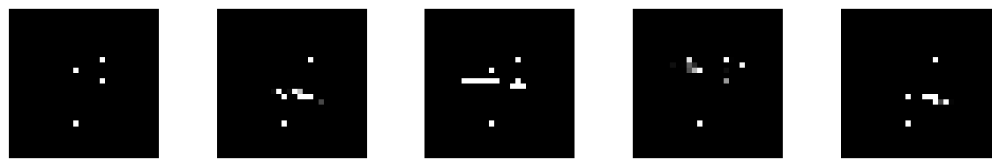

--------------- Epoch 188 ---------------
1/1 [==============================] - 0s 18ms/step


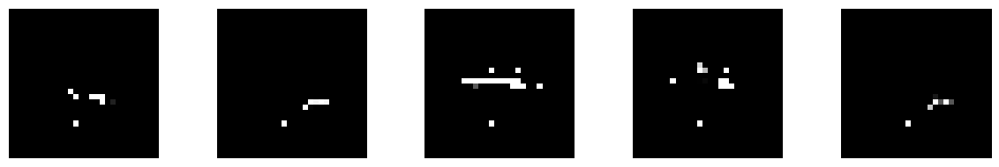

--------------- Epoch 189 ---------------
1/1 [==============================] - 0s 22ms/step


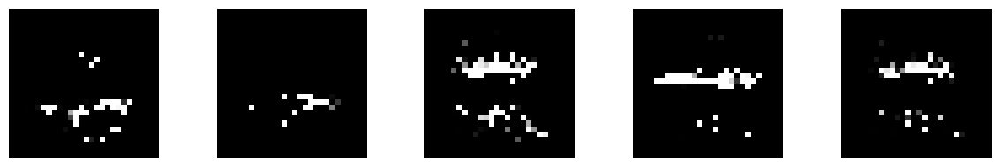

--------------- Epoch 190 ---------------
1/1 [==============================] - 0s 26ms/step


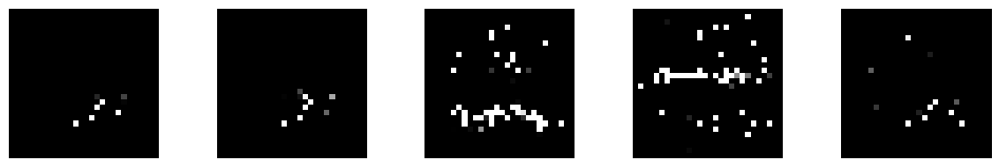

--------------- Epoch 191 ---------------
1/1 [==============================] - 0s 20ms/step


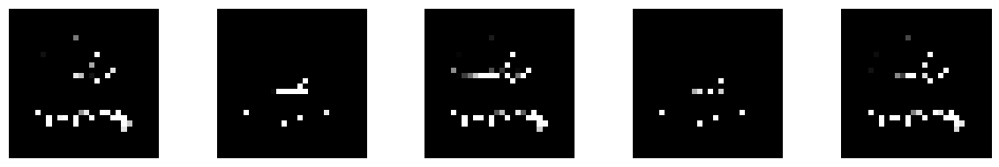

--------------- Epoch 192 ---------------
1/1 [==============================] - 0s 21ms/step


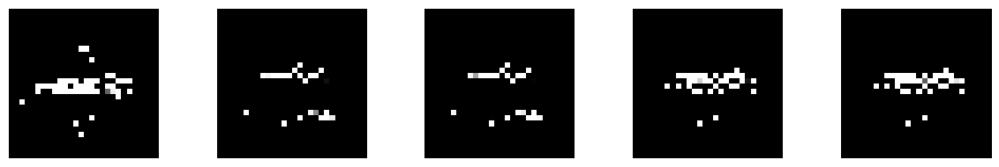

--------------- Epoch 193 ---------------
1/1 [==============================] - 0s 20ms/step


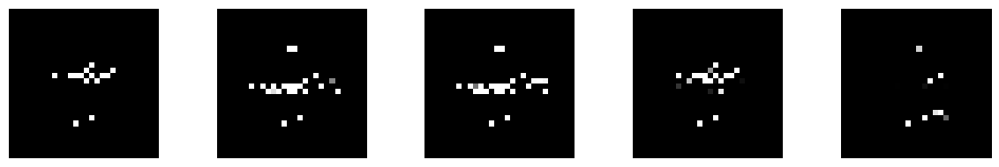

--------------- Epoch 194 ---------------
1/1 [==============================] - 0s 20ms/step


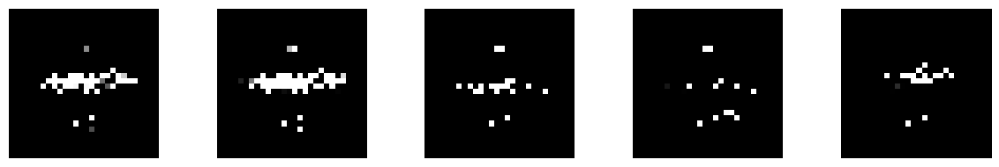

--------------- Epoch 195 ---------------
1/1 [==============================] - 0s 21ms/step


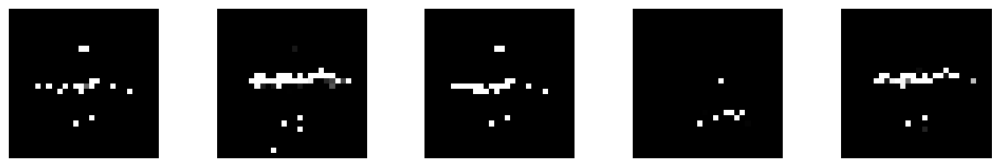

--------------- Epoch 196 ---------------
1/1 [==============================] - 0s 25ms/step


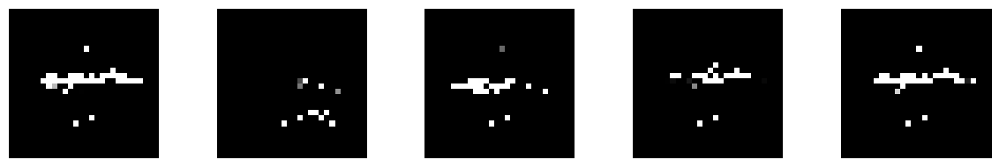

--------------- Epoch 197 ---------------
1/1 [==============================] - 0s 29ms/step


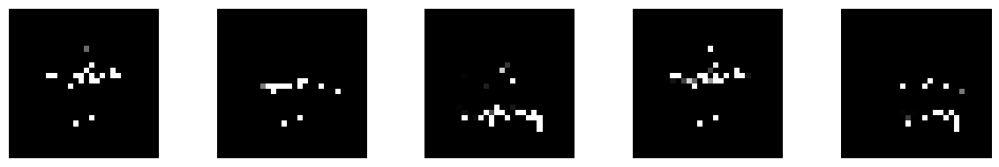

--------------- Epoch 198 ---------------
1/1 [==============================] - 0s 19ms/step


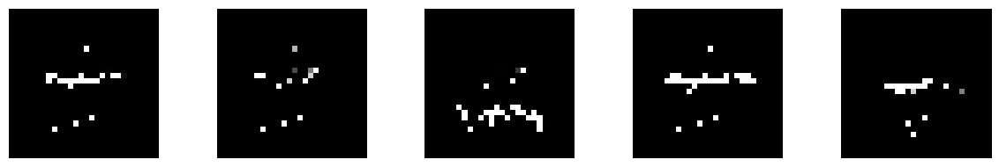

--------------- Epoch 199 ---------------
1/1 [==============================] - 0s 18ms/step


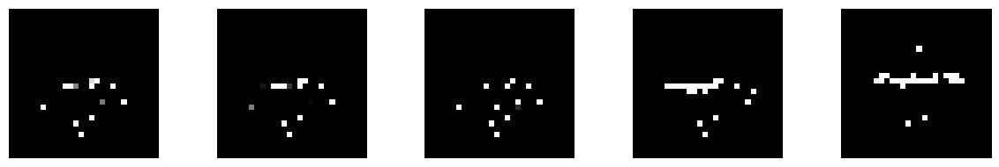

--------------- Epoch 200 ---------------
1/1 [==============================] - 0s 17ms/step


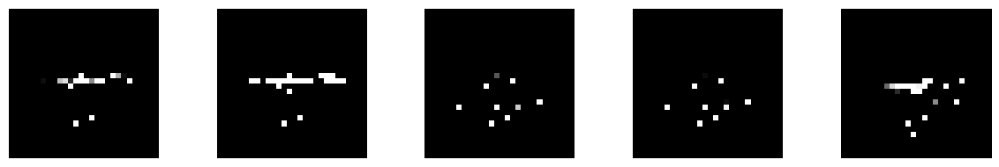

--------------- Epoch 201 ---------------
1/1 [==============================] - 0s 16ms/step


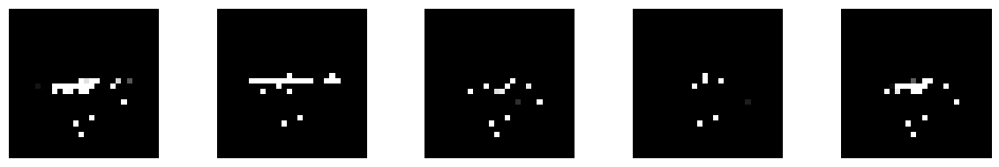

--------------- Epoch 202 ---------------
1/1 [==============================] - 0s 26ms/step


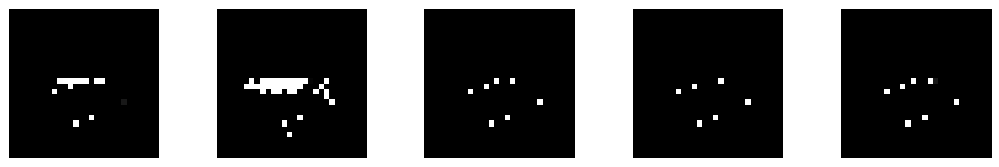

--------------- Epoch 203 ---------------
1/1 [==============================] - 0s 17ms/step


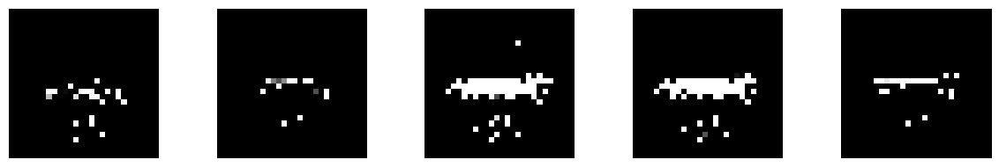

--------------- Epoch 204 ---------------
1/1 [==============================] - 0s 25ms/step


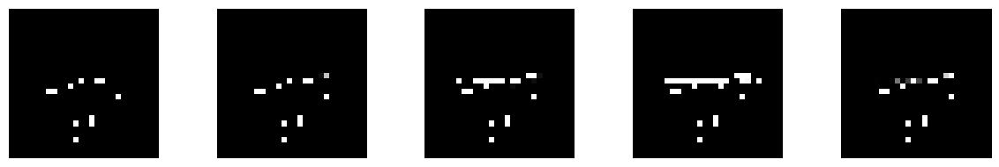

--------------- Epoch 205 ---------------
1/1 [==============================] - 0s 20ms/step


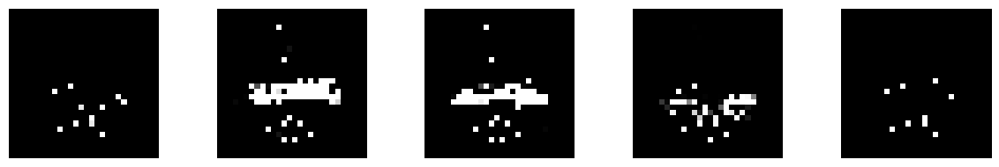

--------------- Epoch 206 ---------------
1/1 [==============================] - 0s 19ms/step


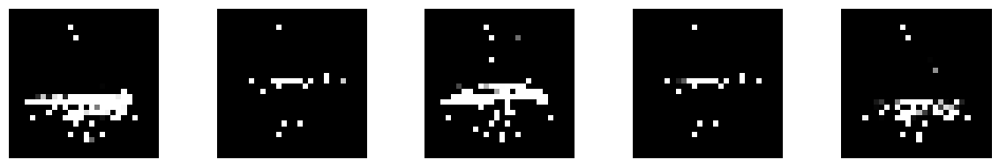

--------------- Epoch 207 ---------------
1/1 [==============================] - 0s 19ms/step


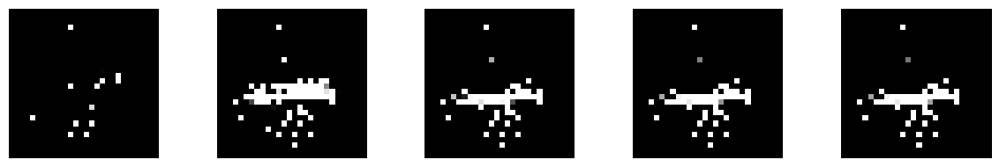

--------------- Epoch 208 ---------------
1/1 [==============================] - 0s 25ms/step


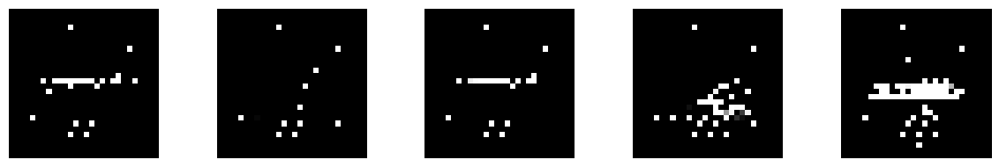

--------------- Epoch 209 ---------------
1/1 [==============================] - 0s 20ms/step


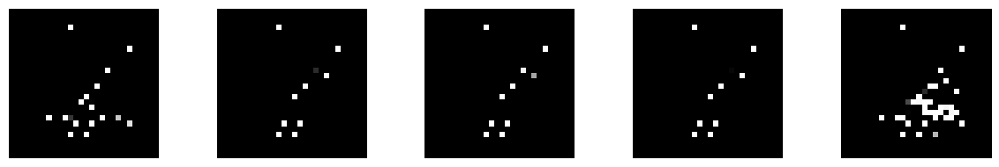

--------------- Epoch 210 ---------------
1/1 [==============================] - 0s 20ms/step


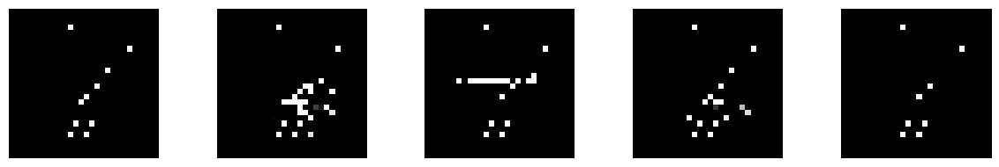

--------------- Epoch 211 ---------------
1/1 [==============================] - 0s 19ms/step


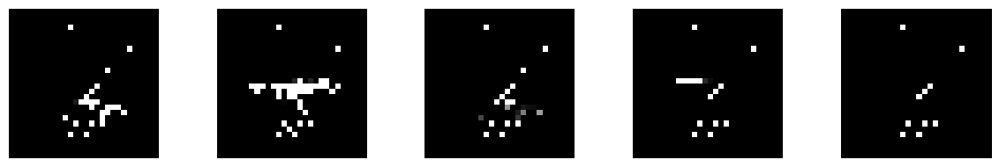

--------------- Epoch 212 ---------------
1/1 [==============================] - 0s 18ms/step


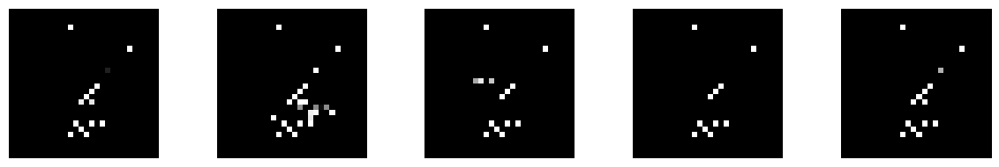

--------------- Epoch 213 ---------------
1/1 [==============================] - 0s 20ms/step


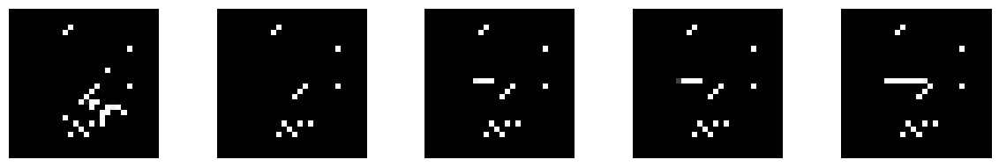

--------------- Epoch 214 ---------------
1/1 [==============================] - 0s 30ms/step


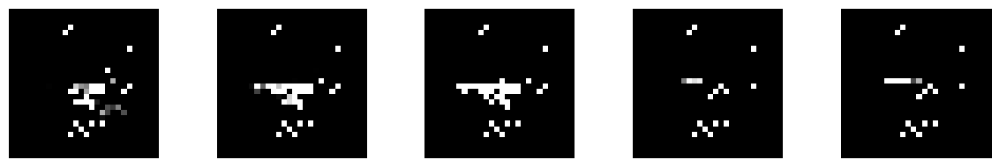

--------------- Epoch 215 ---------------
1/1 [==============================] - 0s 17ms/step


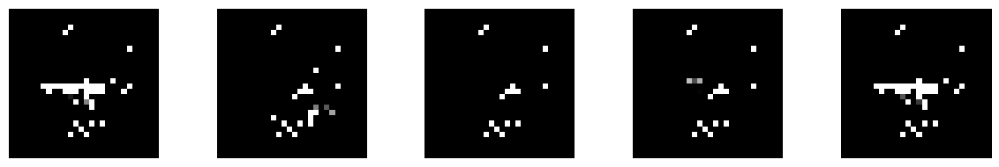

--------------- Epoch 216 ---------------
1/1 [==============================] - 0s 22ms/step


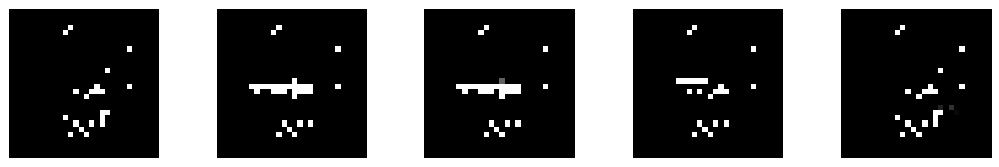

--------------- Epoch 217 ---------------
1/1 [==============================] - 0s 20ms/step


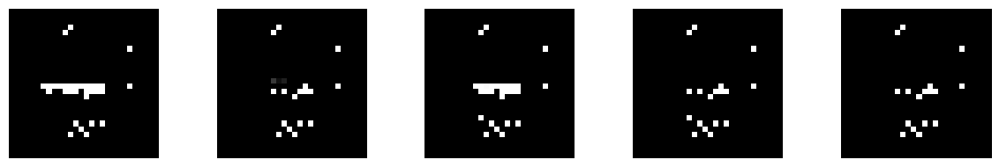

--------------- Epoch 218 ---------------
1/1 [==============================] - 0s 19ms/step


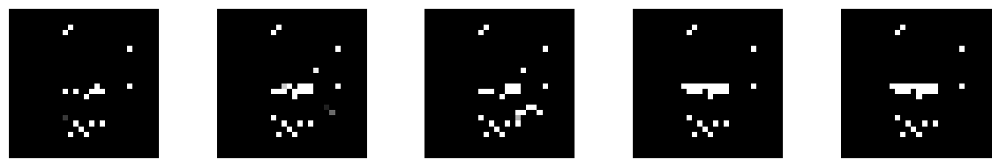

--------------- Epoch 219 ---------------
1/1 [==============================] - 0s 18ms/step


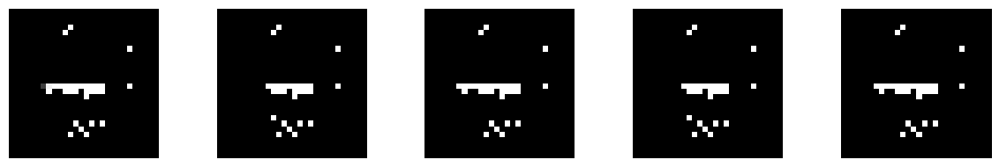

--------------- Epoch 220 ---------------
1/1 [==============================] - 0s 25ms/step


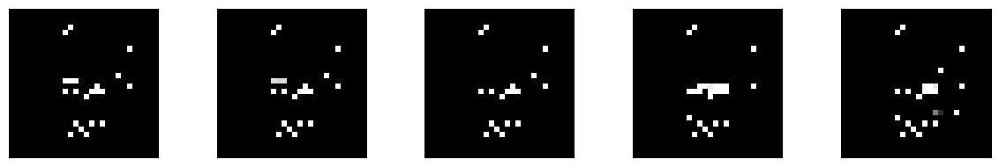

--------------- Epoch 221 ---------------
1/1 [==============================] - 0s 19ms/step


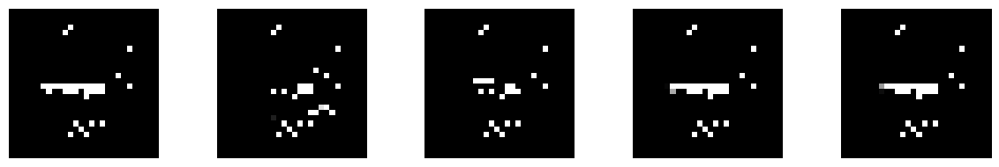

--------------- Epoch 222 ---------------
1/1 [==============================] - 0s 19ms/step


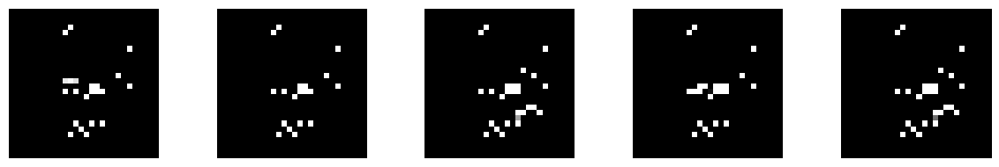

--------------- Epoch 223 ---------------
1/1 [==============================] - 0s 18ms/step


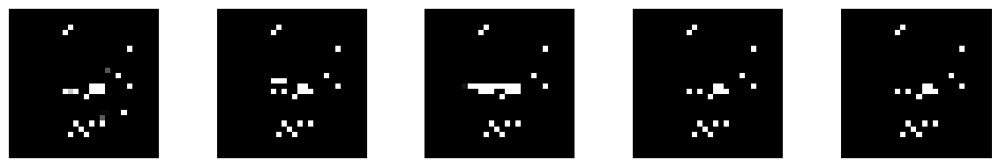

--------------- Epoch 224 ---------------
1/1 [==============================] - 0s 21ms/step


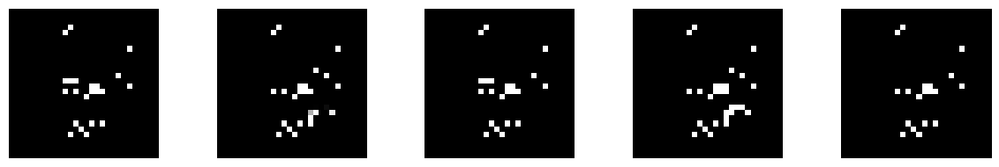

--------------- Epoch 225 ---------------
1/1 [==============================] - 0s 20ms/step


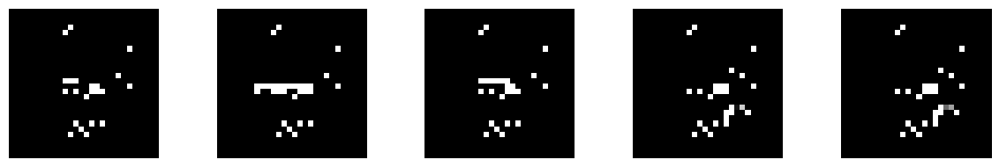

--------------- Epoch 226 ---------------
1/1 [==============================] - 0s 25ms/step


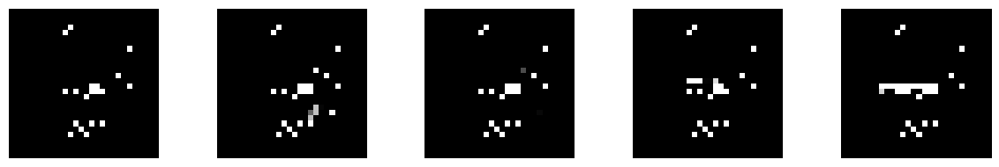

--------------- Epoch 227 ---------------
1/1 [==============================] - 0s 17ms/step


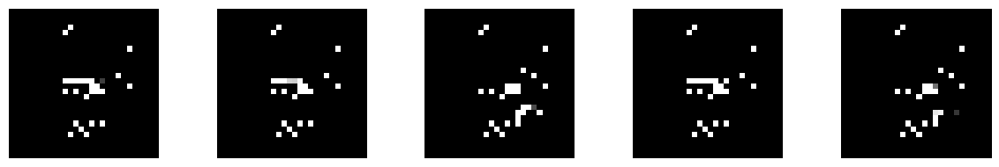

--------------- Epoch 228 ---------------
1/1 [==============================] - 0s 19ms/step


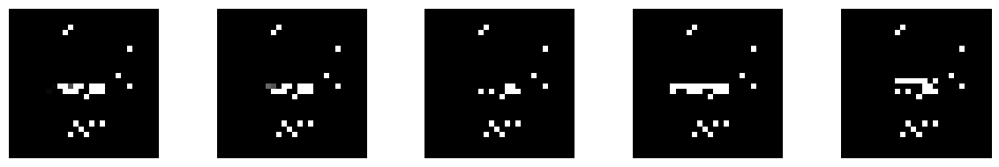

--------------- Epoch 229 ---------------
1/1 [==============================] - 0s 24ms/step


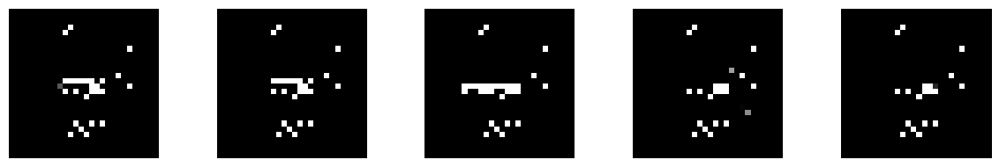

--------------- Epoch 230 ---------------
1/1 [==============================] - 0s 20ms/step


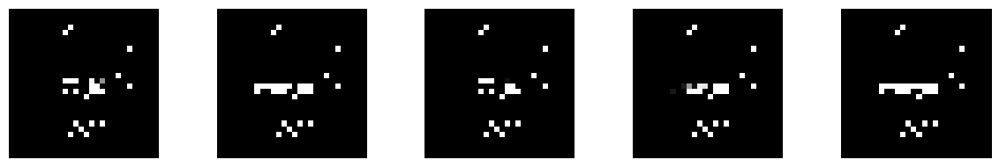

--------------- Epoch 231 ---------------
1/1 [==============================] - 0s 20ms/step


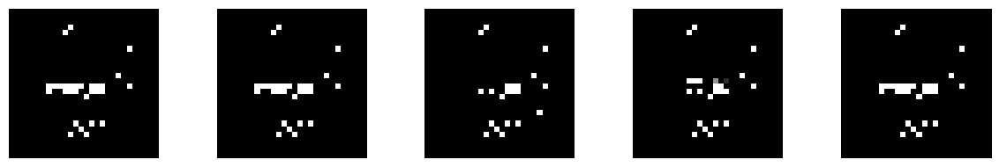

--------------- Epoch 232 ---------------
1/1 [==============================] - 0s 26ms/step


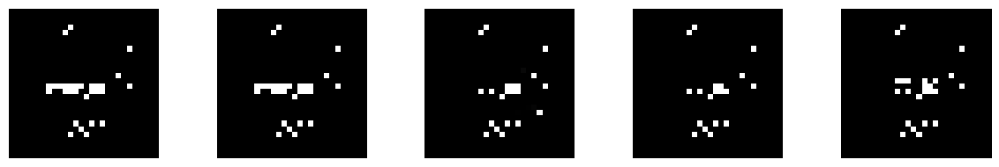

--------------- Epoch 233 ---------------
1/1 [==============================] - 0s 18ms/step


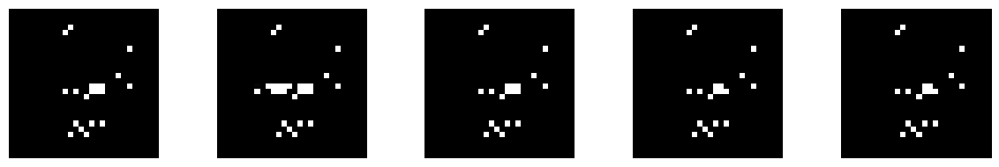

--------------- Epoch 234 ---------------
1/1 [==============================] - 0s 18ms/step


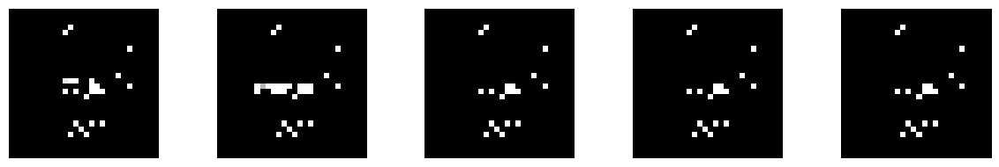

--------------- Epoch 235 ---------------
1/1 [==============================] - 0s 19ms/step


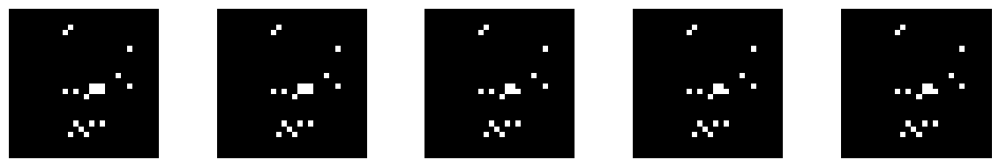

--------------- Epoch 236 ---------------
1/1 [==============================] - 0s 17ms/step


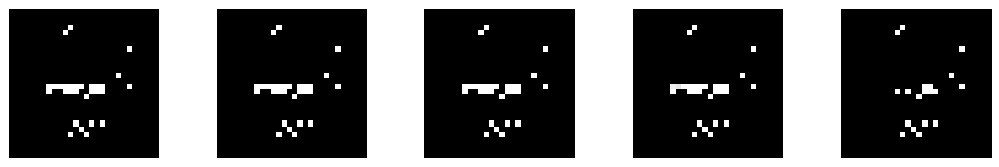

--------------- Epoch 237 ---------------
1/1 [==============================] - 0s 17ms/step


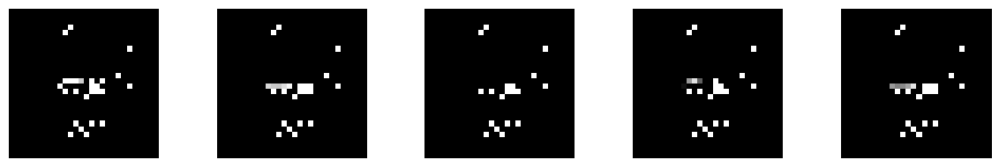

--------------- Epoch 238 ---------------
1/1 [==============================] - 0s 29ms/step


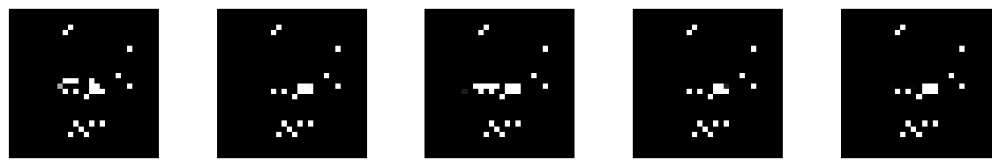

--------------- Epoch 239 ---------------
1/1 [==============================] - 0s 27ms/step


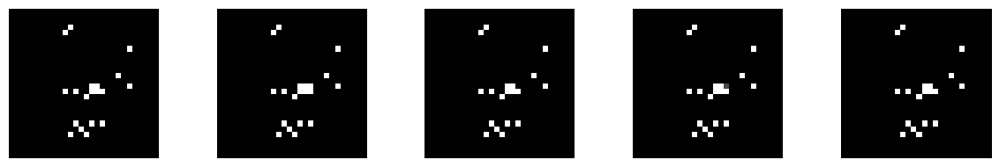

--------------- Epoch 240 ---------------
1/1 [==============================] - 0s 17ms/step


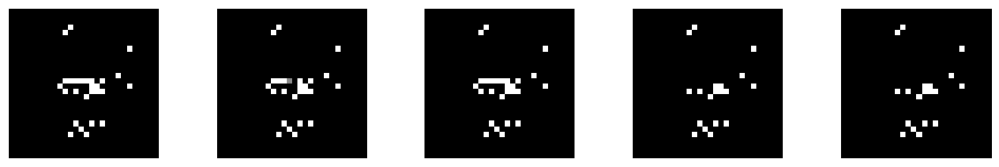

--------------- Epoch 241 ---------------
1/1 [==============================] - 0s 20ms/step


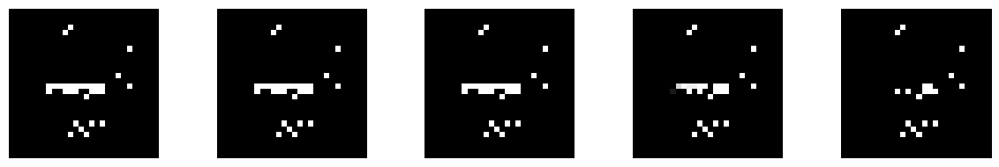

--------------- Epoch 242 ---------------
1/1 [==============================] - 0s 20ms/step


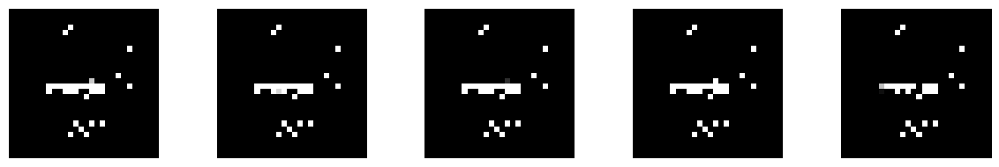

--------------- Epoch 243 ---------------
1/1 [==============================] - 0s 21ms/step


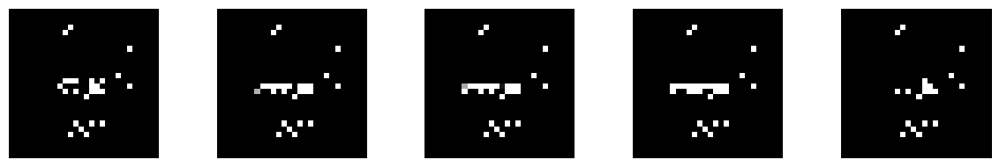

--------------- Epoch 244 ---------------
1/1 [==============================] - 0s 37ms/step


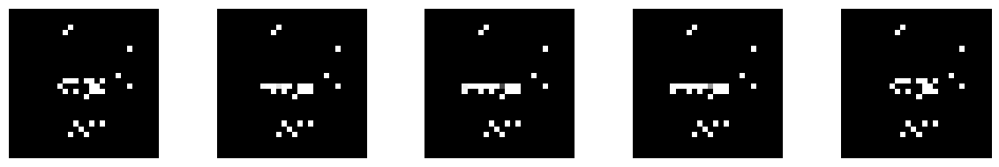

--------------- Epoch 245 ---------------
1/1 [==============================] - 0s 31ms/step


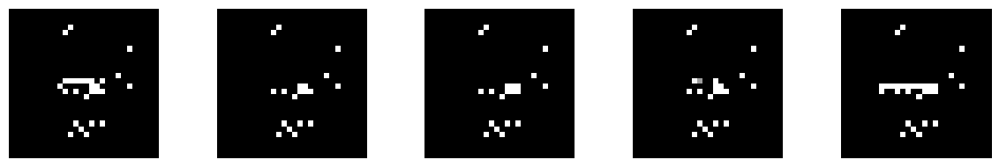

--------------- Epoch 246 ---------------
1/1 [==============================] - 0s 19ms/step


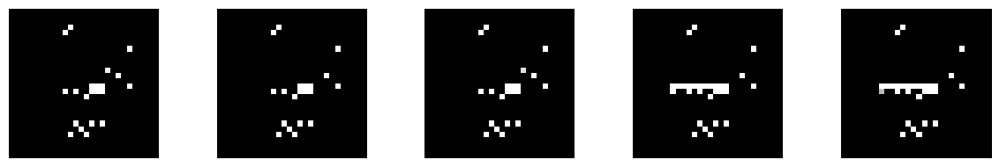

--------------- Epoch 247 ---------------
1/1 [==============================] - 0s 17ms/step


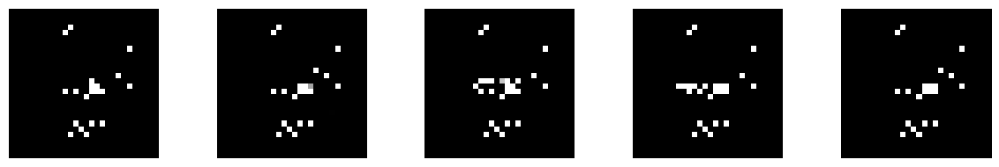

--------------- Epoch 248 ---------------
1/1 [==============================] - 0s 19ms/step


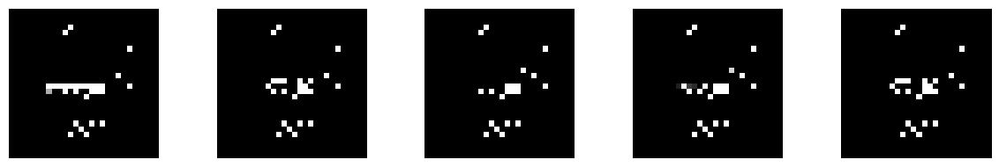

--------------- Epoch 249 ---------------
1/1 [==============================] - 0s 17ms/step


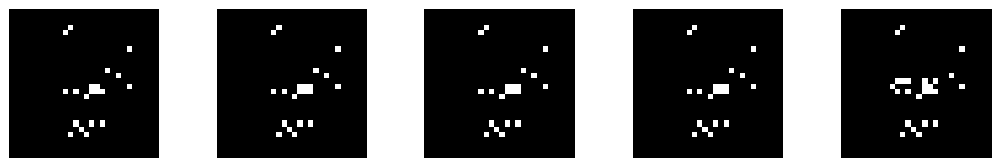

--------------- Epoch 250 ---------------
1/1 [==============================] - 0s 19ms/step


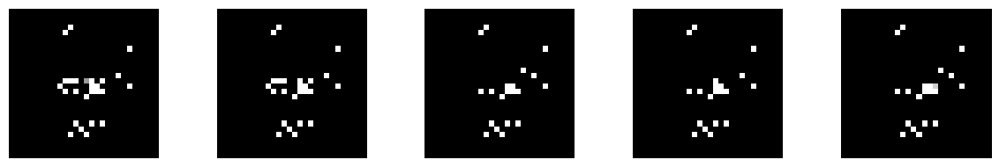

--------------- Epoch 251 ---------------
1/1 [==============================] - 0s 34ms/step


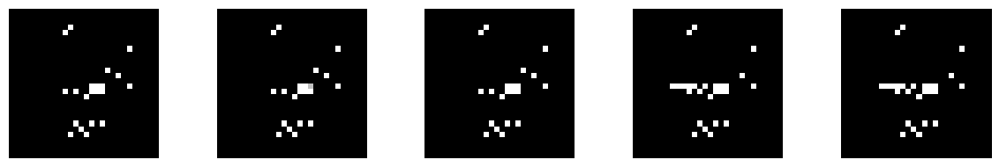

--------------- Epoch 252 ---------------
1/1 [==============================] - 0s 17ms/step


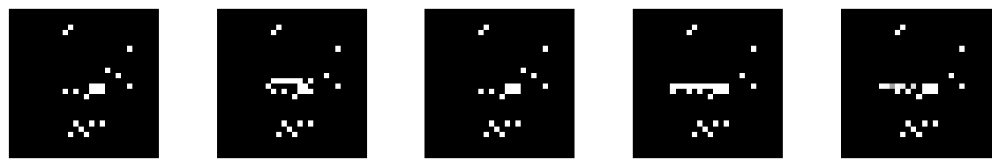

--------------- Epoch 253 ---------------
1/1 [==============================] - 0s 20ms/step


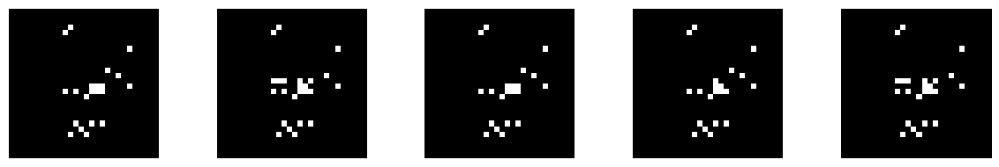

--------------- Epoch 254 ---------------
1/1 [==============================] - 0s 19ms/step


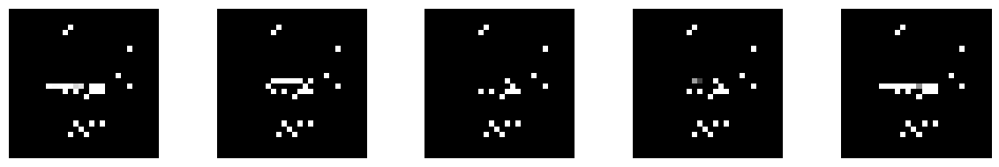

--------------- Epoch 255 ---------------
1/1 [==============================] - 0s 19ms/step


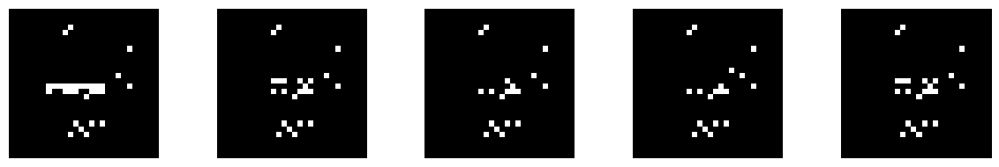

--------------- Epoch 256 ---------------
1/1 [==============================] - 0s 19ms/step


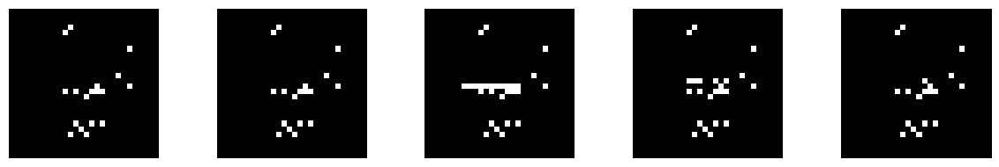

--------------- Epoch 257 ---------------
1/1 [==============================] - 0s 39ms/step


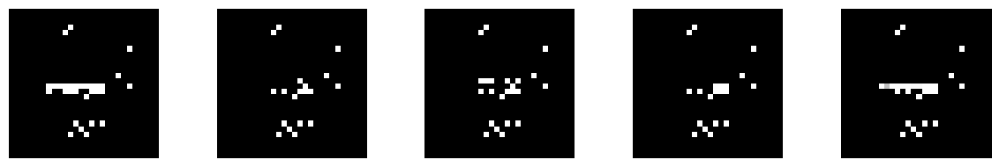

--------------- Epoch 258 ---------------
1/1 [==============================] - 0s 34ms/step


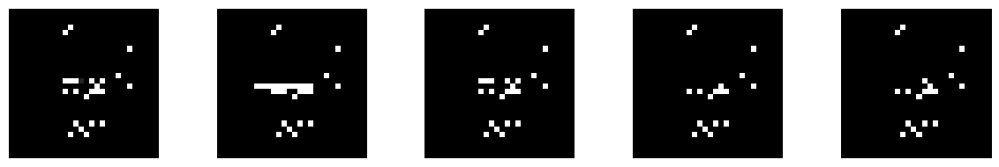

--------------- Epoch 259 ---------------
1/1 [==============================] - 0s 17ms/step


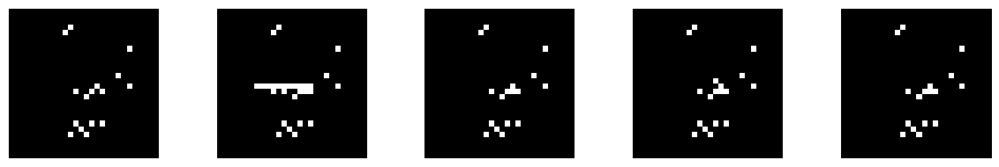

--------------- Epoch 260 ---------------
1/1 [==============================] - 0s 19ms/step


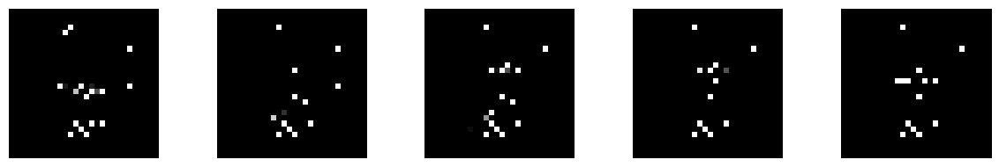

--------------- Epoch 261 ---------------
1/1 [==============================] - 0s 18ms/step


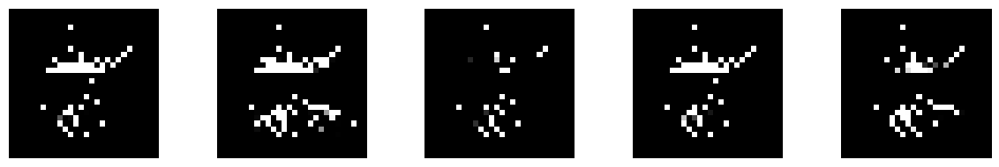

--------------- Epoch 262 ---------------
1/1 [==============================] - 0s 17ms/step


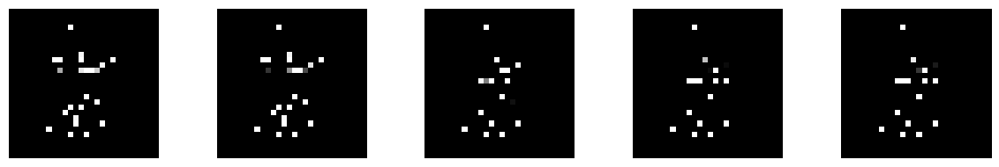

--------------- Epoch 263 ---------------
1/1 [==============================] - 0s 26ms/step


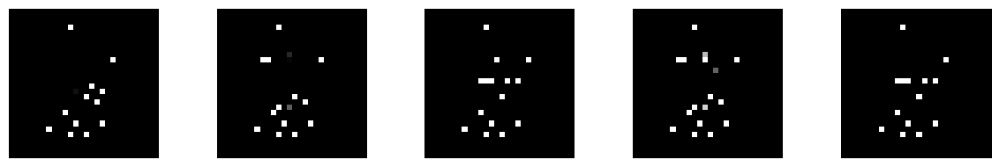

--------------- Epoch 264 ---------------
1/1 [==============================] - 0s 16ms/step


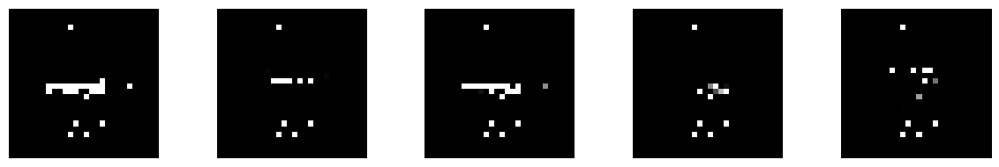

--------------- Epoch 265 ---------------
1/1 [==============================] - 0s 19ms/step


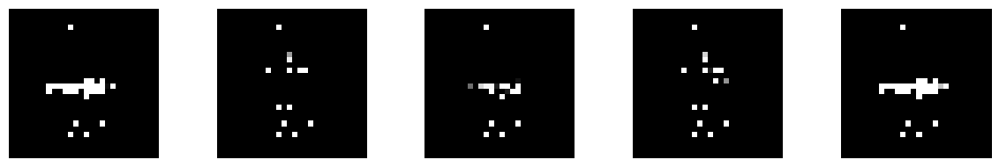

--------------- Epoch 266 ---------------
1/1 [==============================] - 0s 19ms/step


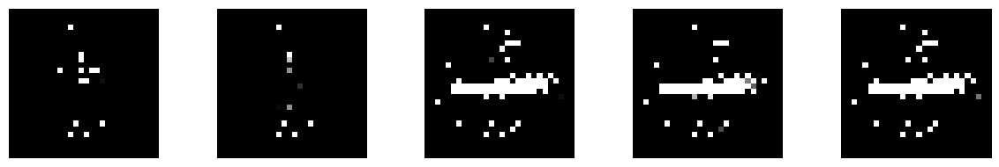

--------------- Epoch 267 ---------------
1/1 [==============================] - 0s 20ms/step


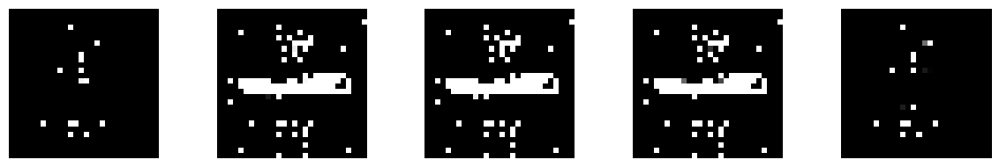

--------------- Epoch 268 ---------------
1/1 [==============================] - 0s 21ms/step


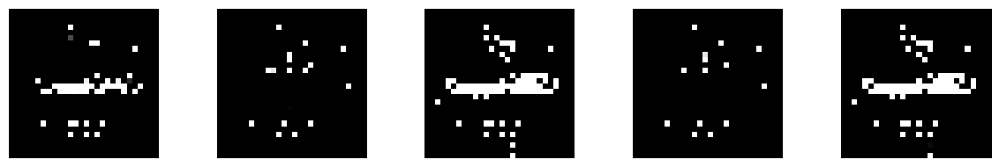

--------------- Epoch 269 ---------------
1/1 [==============================] - 0s 27ms/step


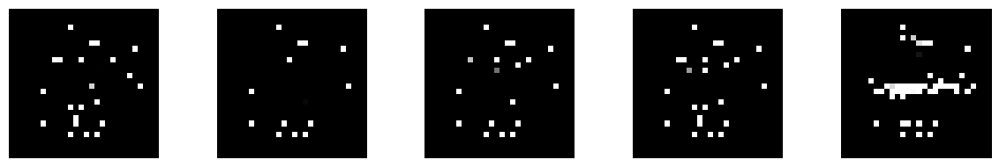

--------------- Epoch 270 ---------------
1/1 [==============================] - 0s 18ms/step


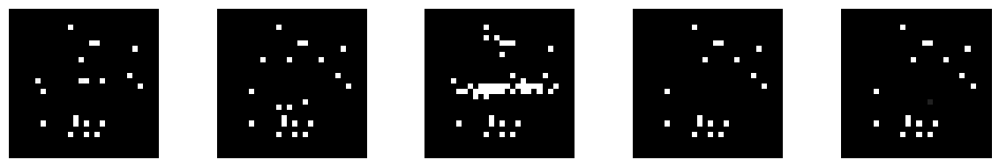

--------------- Epoch 271 ---------------
1/1 [==============================] - 0s 24ms/step


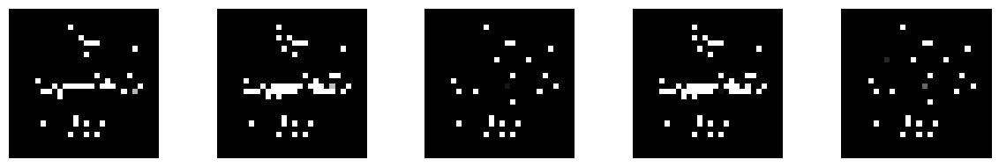

--------------- Epoch 272 ---------------
1/1 [==============================] - 0s 17ms/step


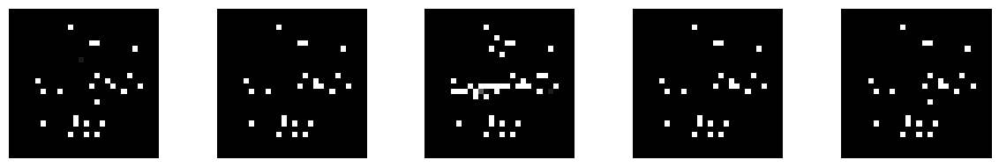

--------------- Epoch 273 ---------------
1/1 [==============================] - 0s 17ms/step


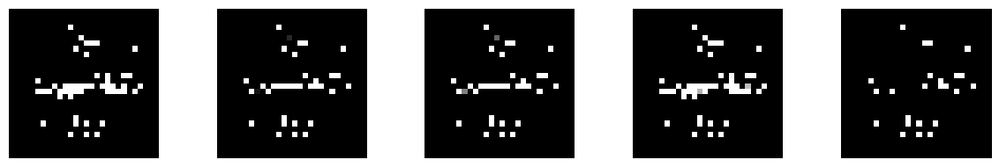

--------------- Epoch 274 ---------------
1/1 [==============================] - 0s 24ms/step


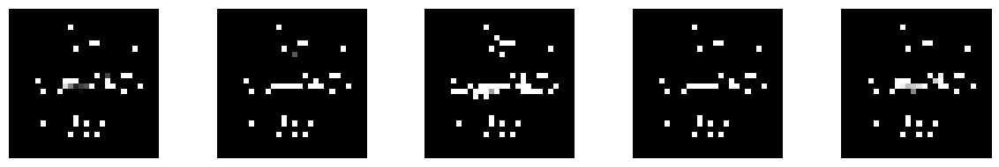

--------------- Epoch 275 ---------------
1/1 [==============================] - 0s 27ms/step


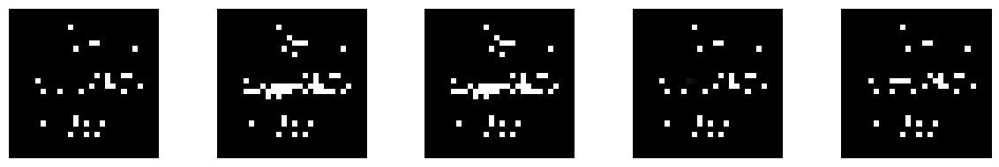

--------------- Epoch 276 ---------------
1/1 [==============================] - 0s 18ms/step


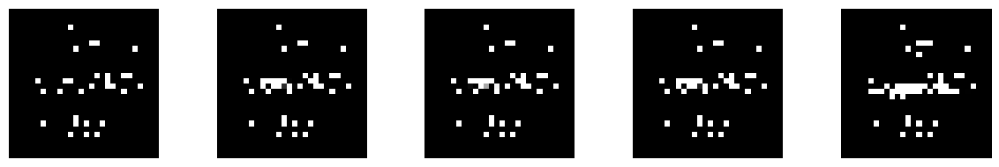

--------------- Epoch 277 ---------------
1/1 [==============================] - 0s 21ms/step


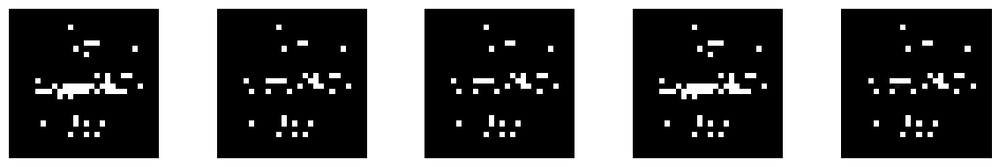

--------------- Epoch 278 ---------------
1/1 [==============================] - 0s 21ms/step


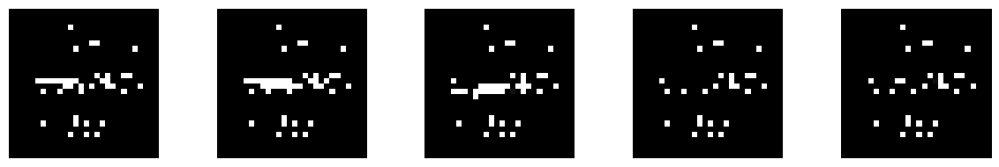

--------------- Epoch 279 ---------------
1/1 [==============================] - 0s 20ms/step


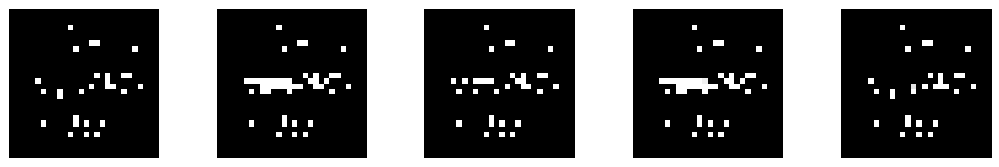

--------------- Epoch 280 ---------------
1/1 [==============================] - 0s 27ms/step


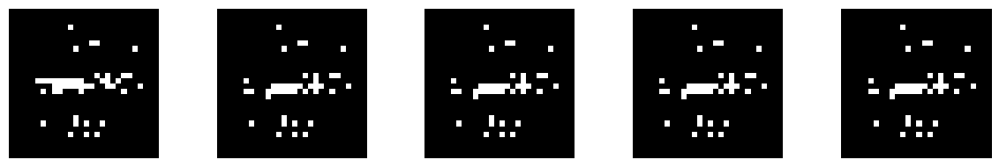

--------------- Epoch 281 ---------------
1/1 [==============================] - 0s 19ms/step


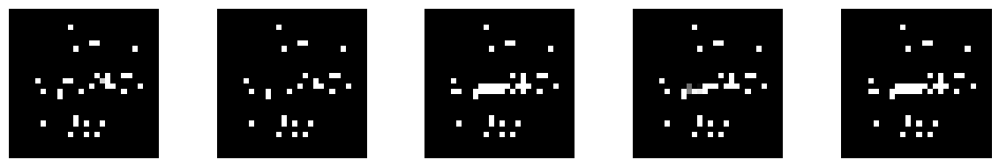

--------------- Epoch 282 ---------------
1/1 [==============================] - 0s 21ms/step


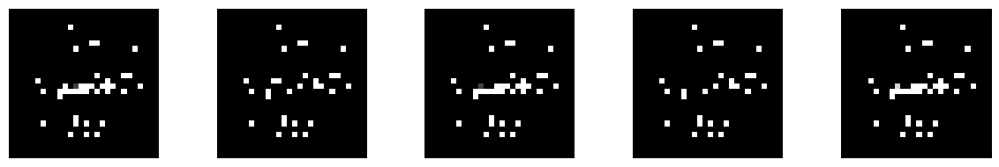

--------------- Epoch 283 ---------------
1/1 [==============================] - 0s 18ms/step


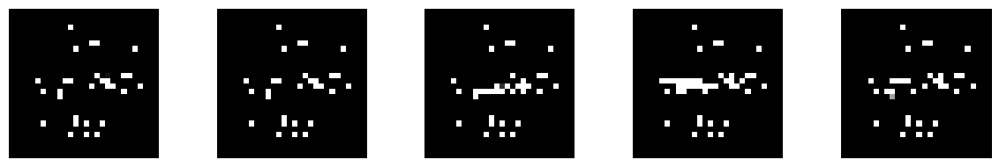

--------------- Epoch 284 ---------------
1/1 [==============================] - 0s 17ms/step


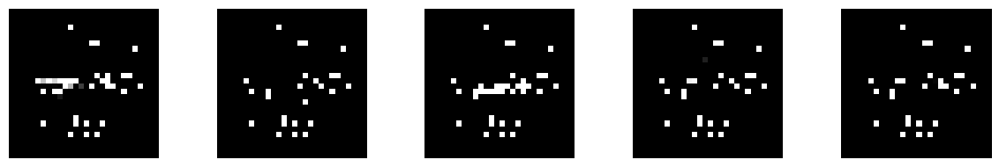

--------------- Epoch 285 ---------------
1/1 [==============================] - 0s 21ms/step


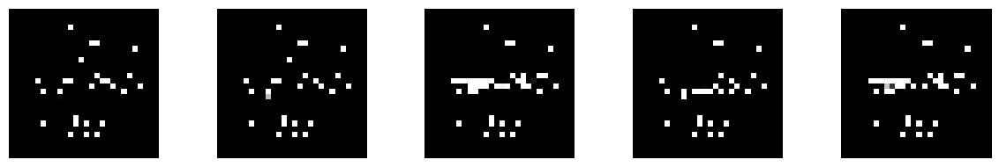

--------------- Epoch 286 ---------------
1/1 [==============================] - 0s 28ms/step


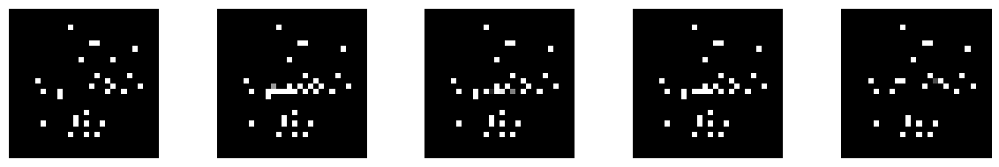

--------------- Epoch 287 ---------------
1/1 [==============================] - 0s 17ms/step


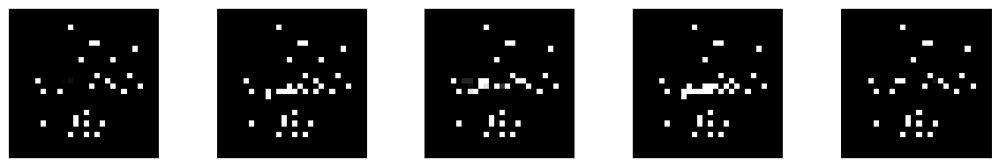

--------------- Epoch 288 ---------------
1/1 [==============================] - 0s 17ms/step


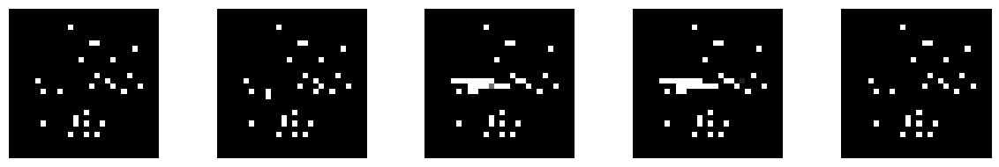

--------------- Epoch 289 ---------------
1/1 [==============================] - 0s 18ms/step


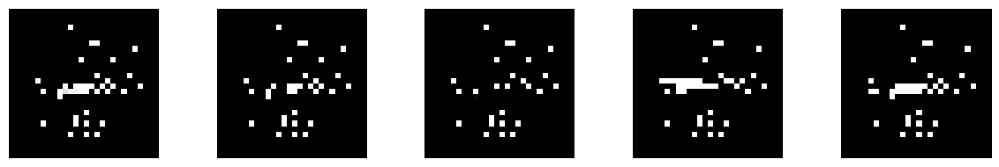

--------------- Epoch 290 ---------------
1/1 [==============================] - 0s 22ms/step


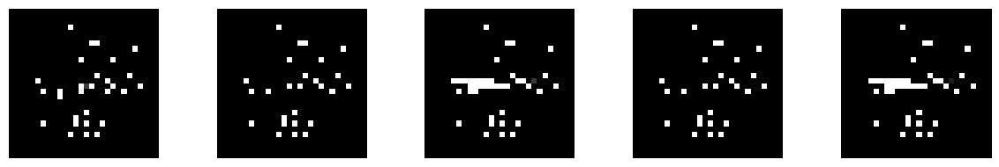

--------------- Epoch 291 ---------------
1/1 [==============================] - 0s 19ms/step


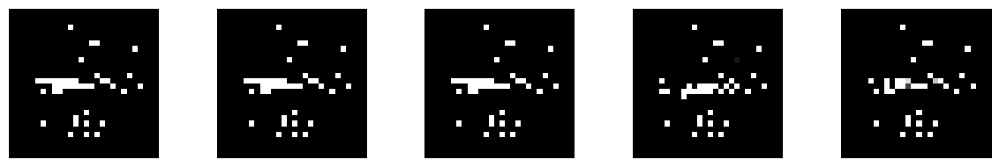

--------------- Epoch 292 ---------------
1/1 [==============================] - 0s 26ms/step


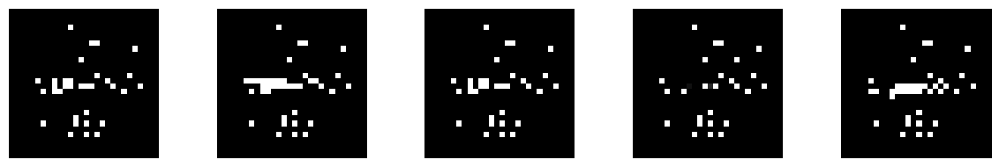

--------------- Epoch 293 ---------------
1/1 [==============================] - 0s 18ms/step


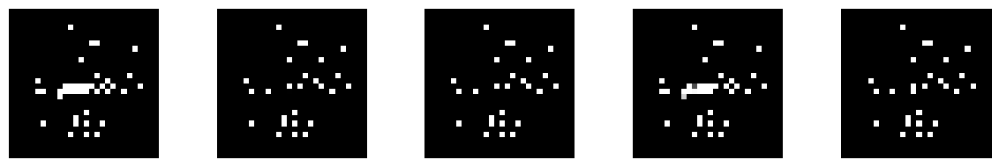

--------------- Epoch 294 ---------------
1/1 [==============================] - 0s 17ms/step


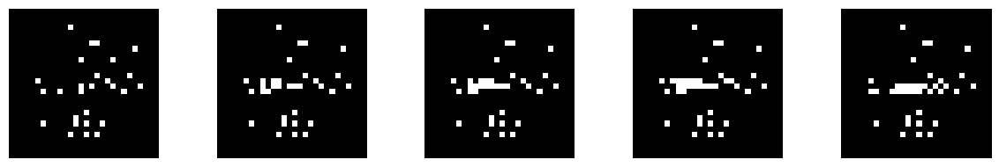

--------------- Epoch 295 ---------------
1/1 [==============================] - 0s 19ms/step


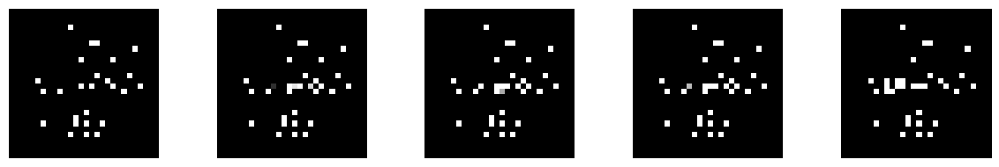

--------------- Epoch 296 ---------------
1/1 [==============================] - 0s 18ms/step


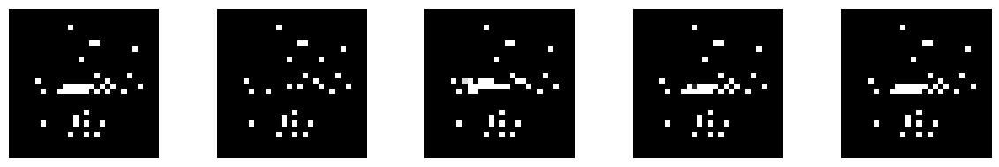

--------------- Epoch 297 ---------------
1/1 [==============================] - 0s 18ms/step


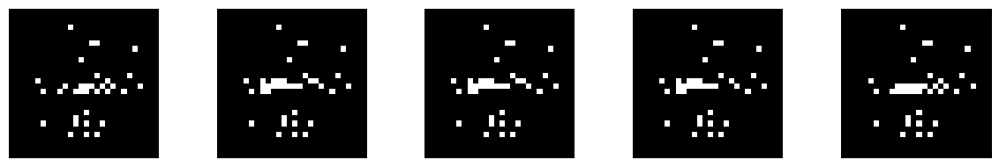

--------------- Epoch 298 ---------------
1/1 [==============================] - 0s 27ms/step


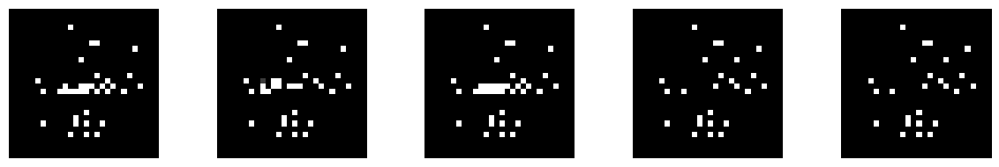

--------------- Epoch 299 ---------------
1/1 [==============================] - 0s 17ms/step


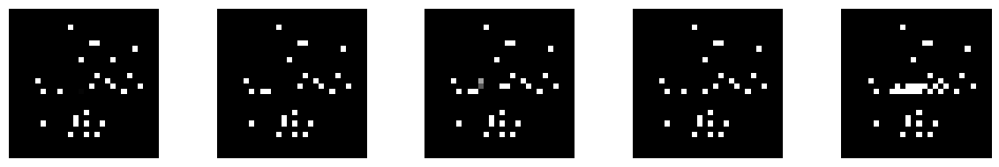

--------------- Epoch 300 ---------------
1/1 [==============================] - 0s 18ms/step


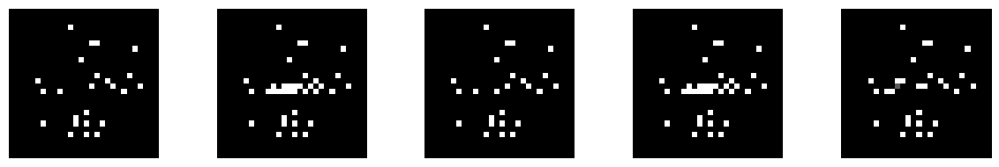

--------------- Epoch 301 ---------------
1/1 [==============================] - 0s 18ms/step


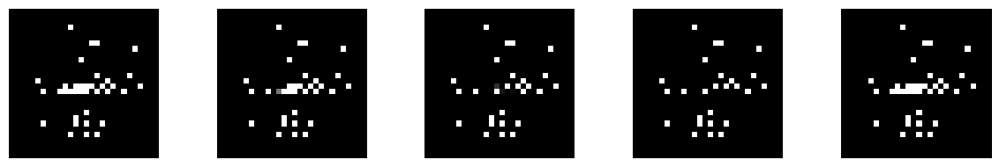

--------------- Epoch 302 ---------------
1/1 [==============================] - 0s 20ms/step


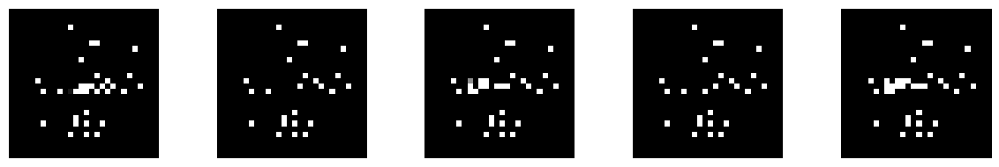

--------------- Epoch 303 ---------------
1/1 [==============================] - 0s 23ms/step


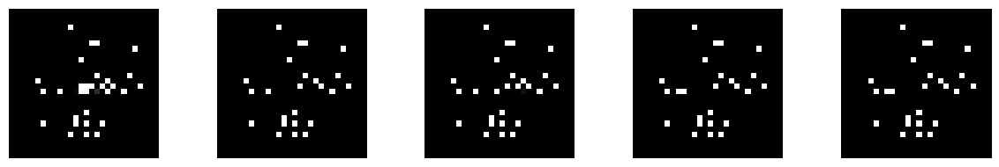

--------------- Epoch 304 ---------------
1/1 [==============================] - 0s 27ms/step


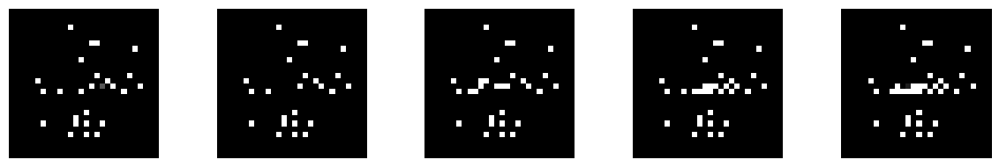

--------------- Epoch 305 ---------------
1/1 [==============================] - 0s 25ms/step


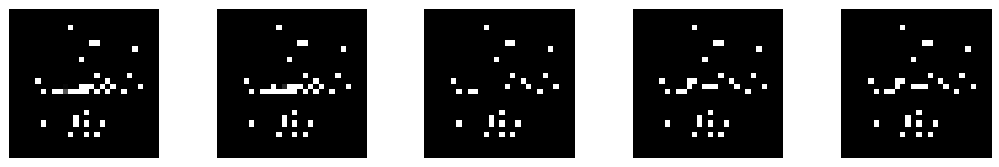

--------------- Epoch 306 ---------------
1/1 [==============================] - 0s 22ms/step


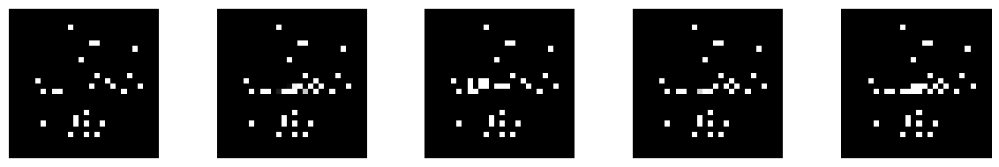

--------------- Epoch 307 ---------------
1/1 [==============================] - 0s 18ms/step


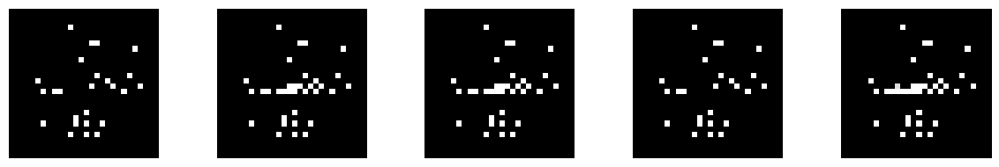

--------------- Epoch 308 ---------------
1/1 [==============================] - 0s 18ms/step


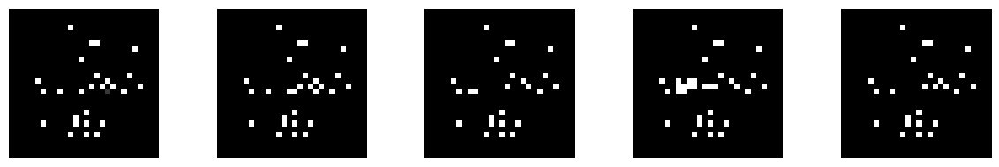

--------------- Epoch 309 ---------------
1/1 [==============================] - 0s 19ms/step


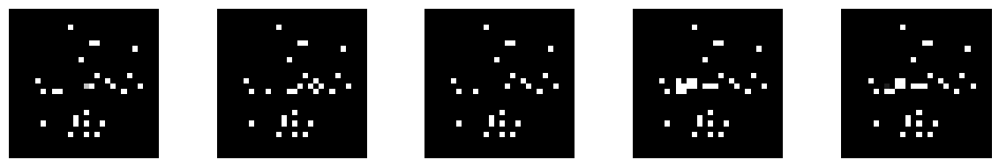

--------------- Epoch 310 ---------------
1/1 [==============================] - 0s 32ms/step


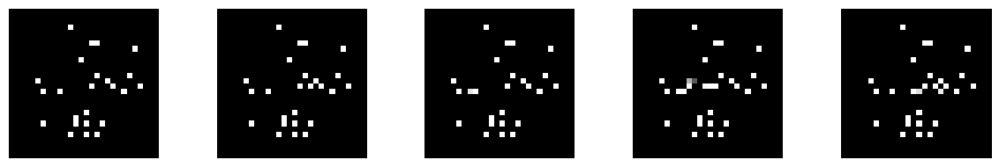

--------------- Epoch 311 ---------------
1/1 [==============================] - 0s 19ms/step


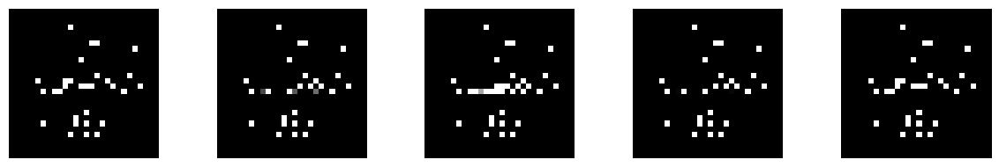

--------------- Epoch 312 ---------------
1/1 [==============================] - 0s 17ms/step


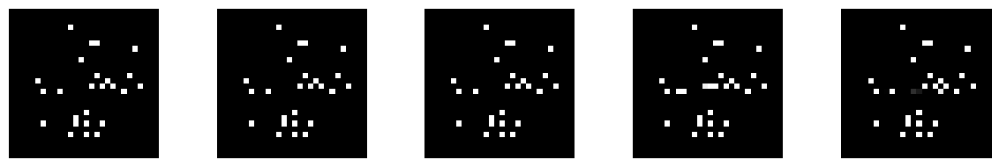

--------------- Epoch 313 ---------------
1/1 [==============================] - 0s 19ms/step


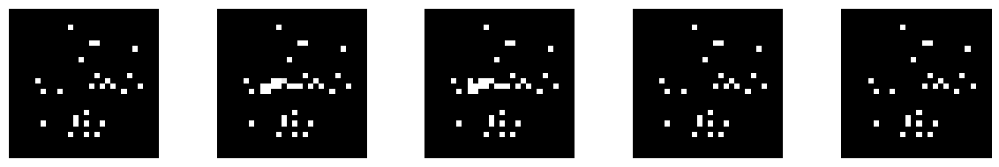

--------------- Epoch 314 ---------------
1/1 [==============================] - 0s 17ms/step


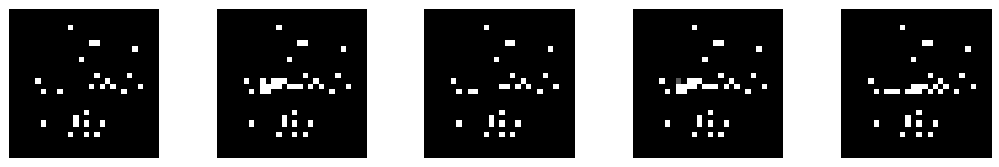

--------------- Epoch 315 ---------------
1/1 [==============================] - 0s 21ms/step


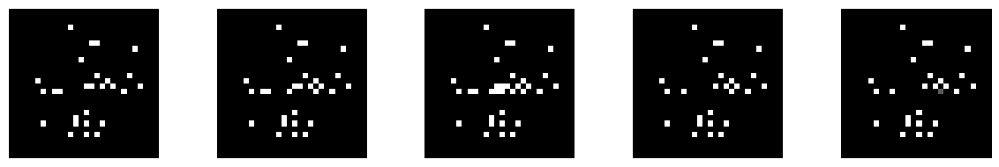

--------------- Epoch 316 ---------------
1/1 [==============================] - 0s 36ms/step


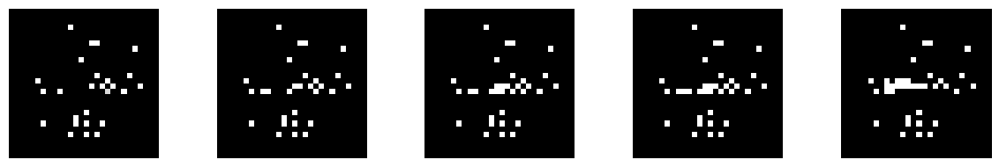

--------------- Epoch 317 ---------------
1/1 [==============================] - 0s 21ms/step


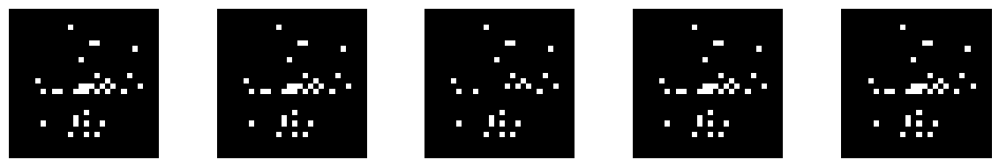

--------------- Epoch 318 ---------------
1/1 [==============================] - 0s 18ms/step


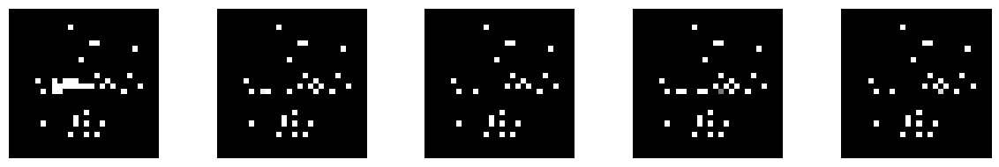

--------------- Epoch 319 ---------------
1/1 [==============================] - 0s 18ms/step


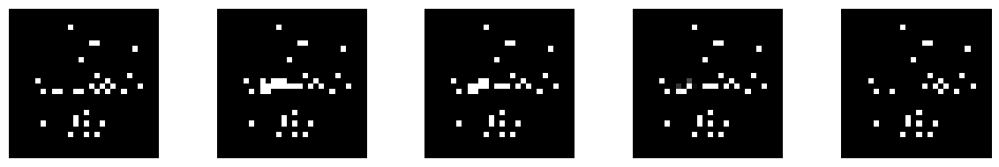

--------------- Epoch 320 ---------------
1/1 [==============================] - 0s 18ms/step


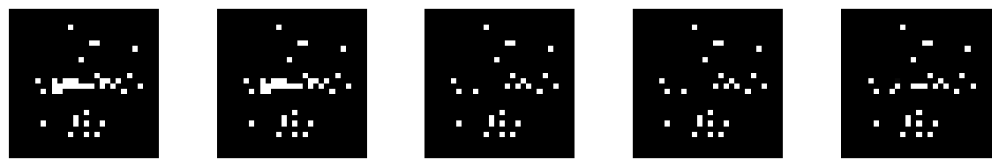

--------------- Epoch 321 ---------------
1/1 [==============================] - 0s 17ms/step


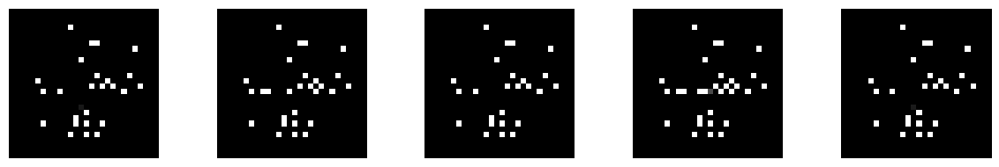

--------------- Epoch 322 ---------------
1/1 [==============================] - 0s 24ms/step


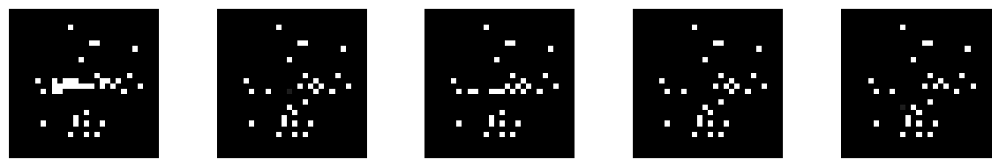

--------------- Epoch 323 ---------------
1/1 [==============================] - 0s 18ms/step


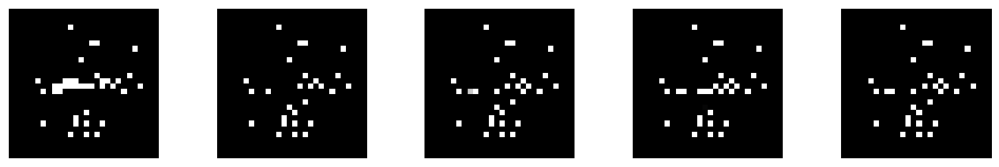

--------------- Epoch 324 ---------------
1/1 [==============================] - 0s 19ms/step


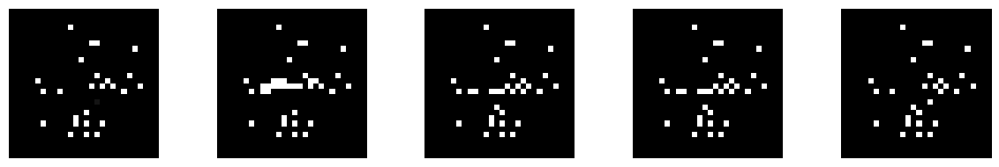

--------------- Epoch 325 ---------------
1/1 [==============================] - 0s 17ms/step


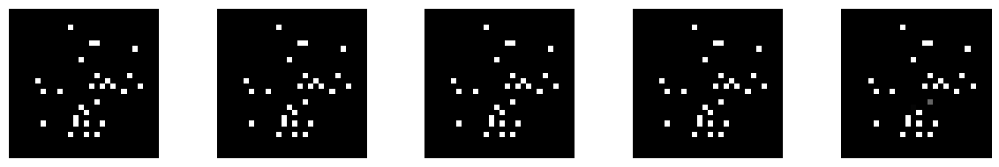

--------------- Epoch 326 ---------------
1/1 [==============================] - 0s 17ms/step


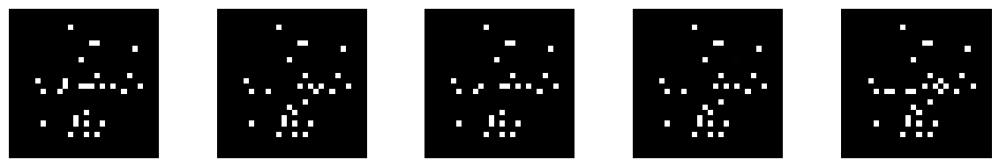

--------------- Epoch 327 ---------------
1/1 [==============================] - 0s 34ms/step


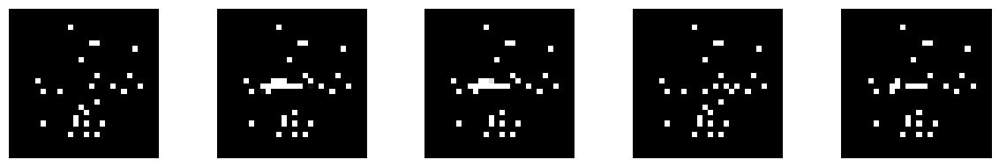

--------------- Epoch 328 ---------------
1/1 [==============================] - 0s 30ms/step


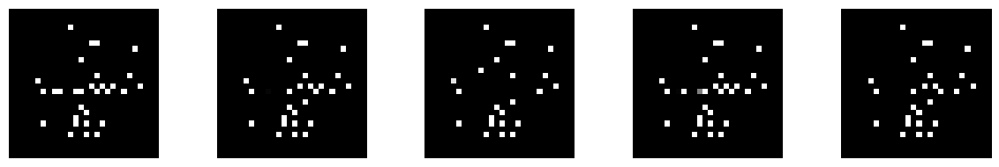

--------------- Epoch 329 ---------------
1/1 [==============================] - 0s 25ms/step


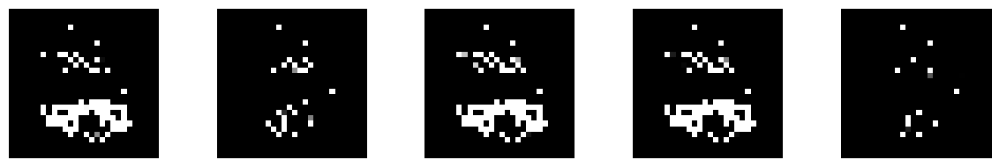

--------------- Epoch 330 ---------------
1/1 [==============================] - 0s 27ms/step


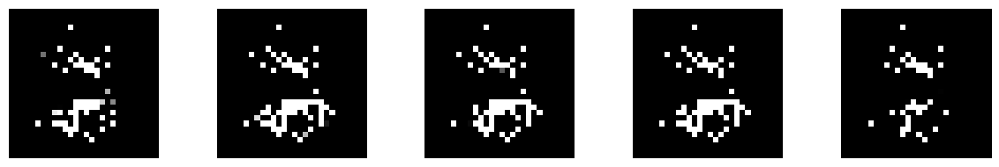

--------------- Epoch 331 ---------------
1/1 [==============================] - 0s 19ms/step


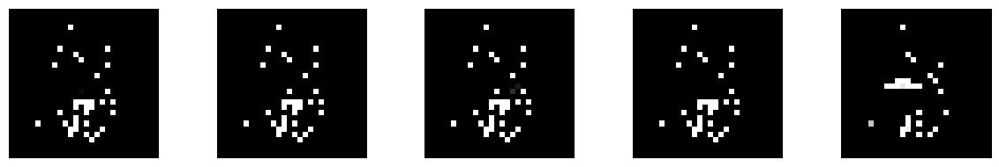

--------------- Epoch 332 ---------------
1/1 [==============================] - 0s 19ms/step


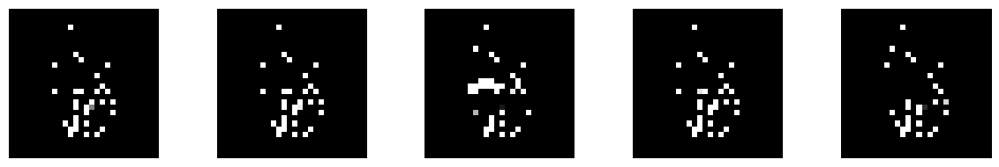

--------------- Epoch 333 ---------------
1/1 [==============================] - 0s 26ms/step


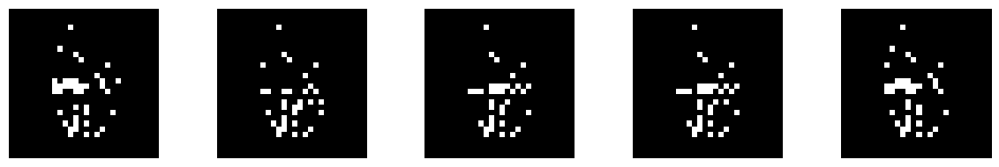

--------------- Epoch 334 ---------------
1/1 [==============================] - 0s 32ms/step


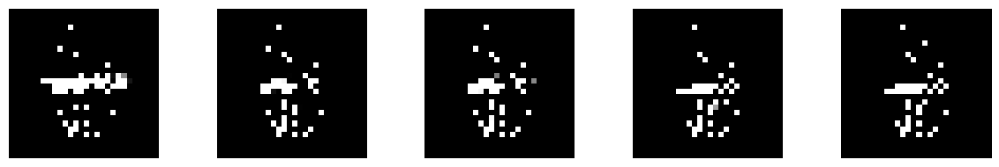

--------------- Epoch 335 ---------------
1/1 [==============================] - 0s 17ms/step


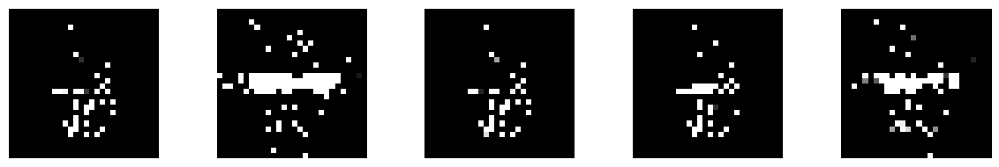

--------------- Epoch 336 ---------------
1/1 [==============================] - 0s 18ms/step


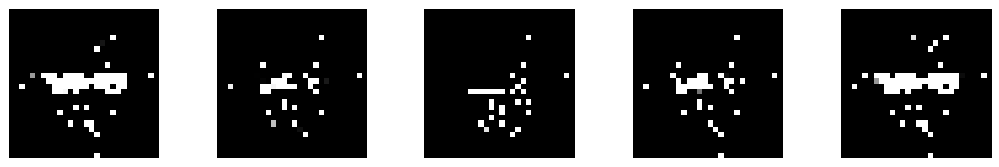

--------------- Epoch 337 ---------------
1/1 [==============================] - 0s 17ms/step


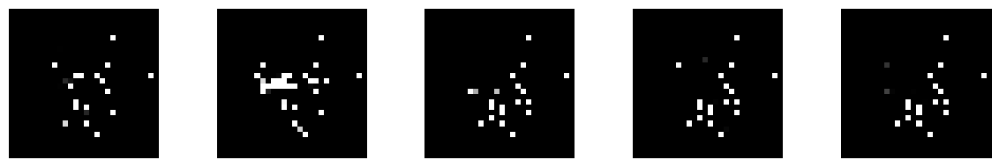

--------------- Epoch 338 ---------------
1/1 [==============================] - 0s 17ms/step


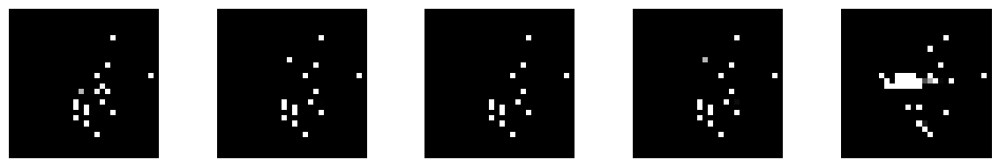

--------------- Epoch 339 ---------------
1/1 [==============================] - 0s 48ms/step


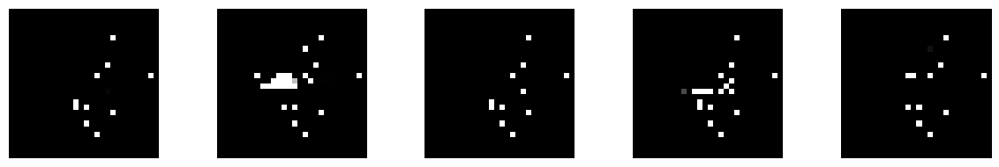

--------------- Epoch 340 ---------------
1/1 [==============================] - 0s 22ms/step


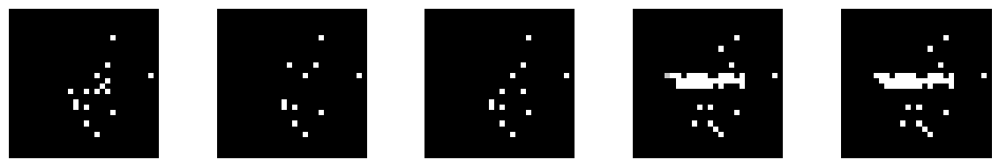

--------------- Epoch 341 ---------------
1/1 [==============================] - 0s 22ms/step


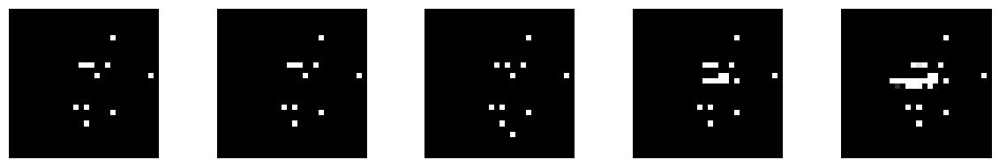

--------------- Epoch 342 ---------------
1/1 [==============================] - 0s 19ms/step


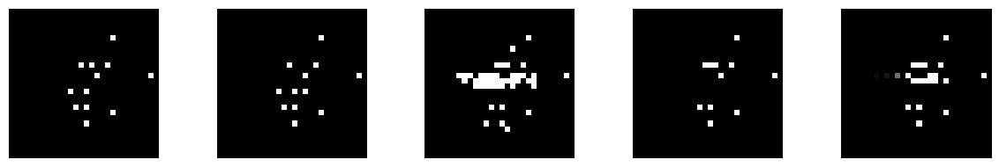

--------------- Epoch 343 ---------------
1/1 [==============================] - 0s 28ms/step


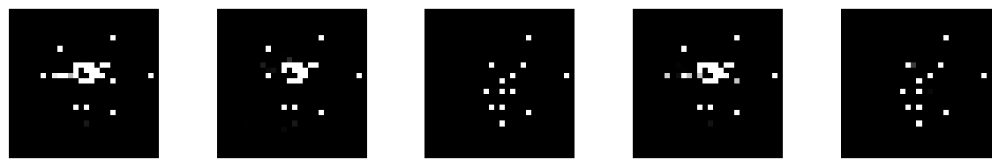

--------------- Epoch 344 ---------------
1/1 [==============================] - 0s 19ms/step


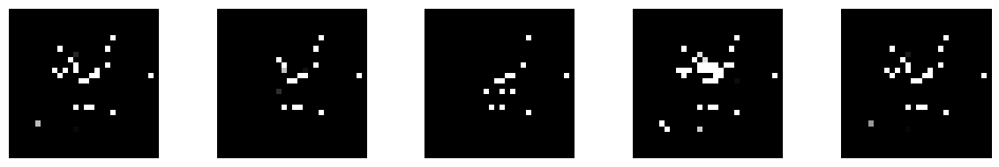

--------------- Epoch 345 ---------------
1/1 [==============================] - 0s 30ms/step


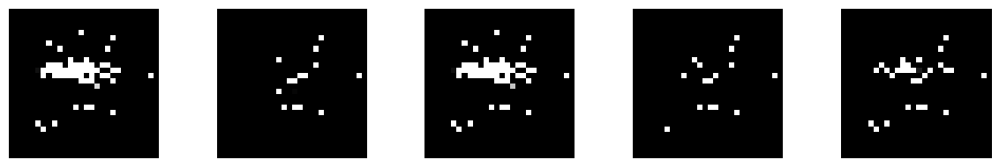

--------------- Epoch 346 ---------------
1/1 [==============================] - 0s 17ms/step


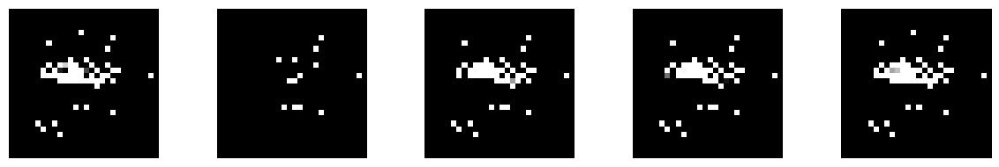

--------------- Epoch 347 ---------------
1/1 [==============================] - 0s 18ms/step


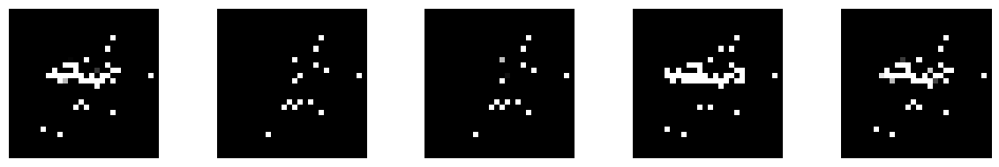

--------------- Epoch 348 ---------------
1/1 [==============================] - 0s 17ms/step


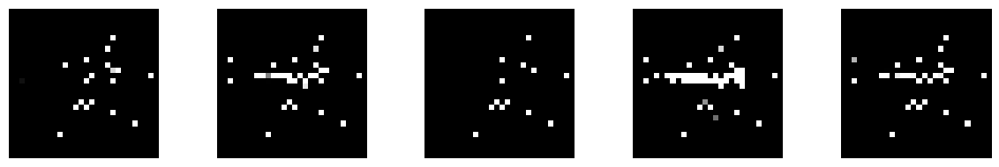

--------------- Epoch 349 ---------------
1/1 [==============================] - 0s 20ms/step


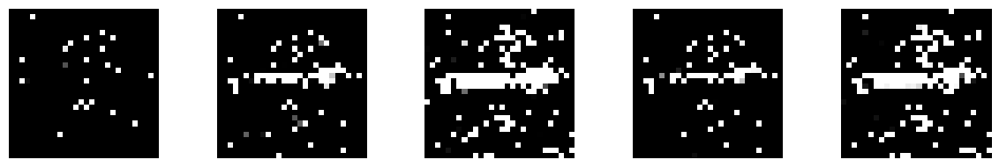

--------------- Epoch 350 ---------------
1/1 [==============================] - 0s 20ms/step


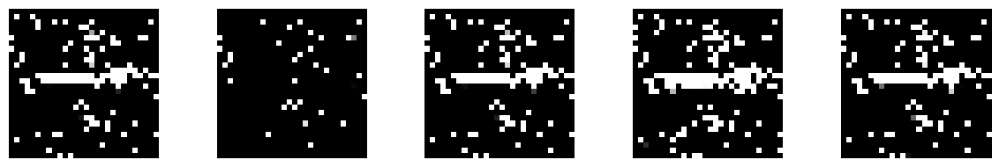

--------------- Epoch 351 ---------------
1/1 [==============================] - 0s 29ms/step


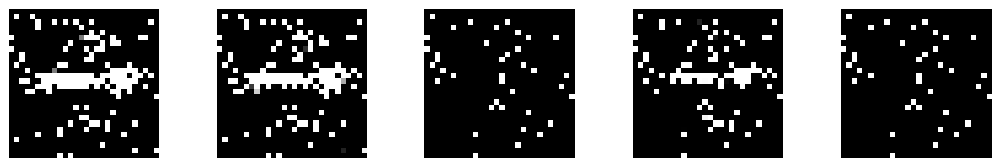

--------------- Epoch 352 ---------------
1/1 [==============================] - 0s 23ms/step


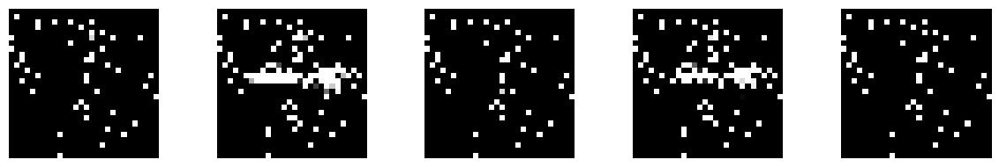

--------------- Epoch 353 ---------------
1/1 [==============================] - 0s 22ms/step


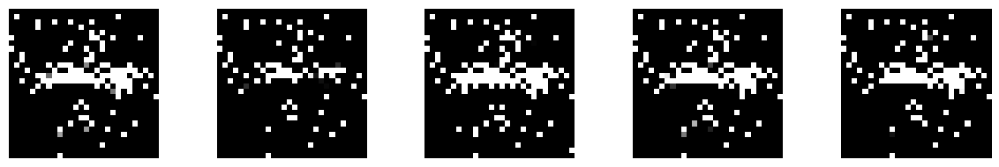

--------------- Epoch 354 ---------------
1/1 [==============================] - 0s 19ms/step


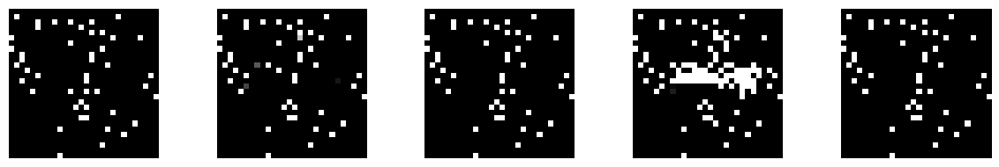

--------------- Epoch 355 ---------------
1/1 [==============================] - 0s 19ms/step


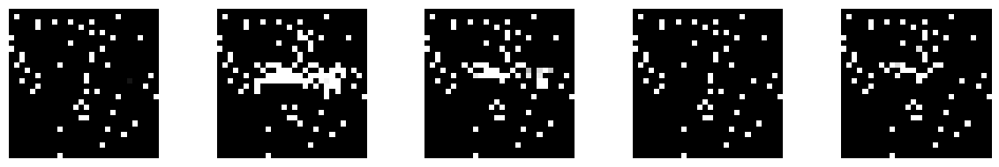

--------------- Epoch 356 ---------------
1/1 [==============================] - 0s 29ms/step


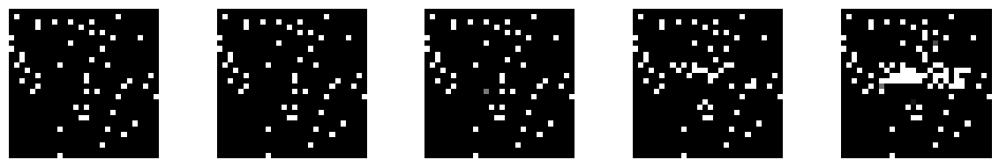

--------------- Epoch 357 ---------------
1/1 [==============================] - 0s 28ms/step


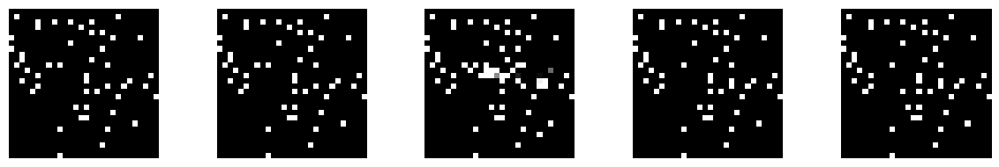

--------------- Epoch 358 ---------------
1/1 [==============================] - 0s 19ms/step


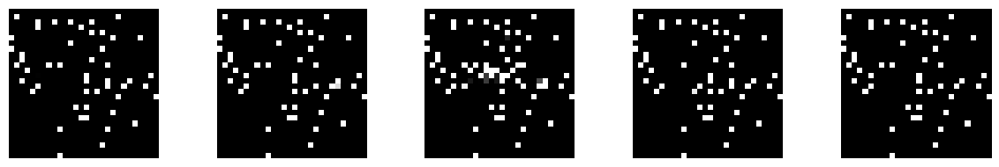

--------------- Epoch 359 ---------------
1/1 [==============================] - 0s 18ms/step


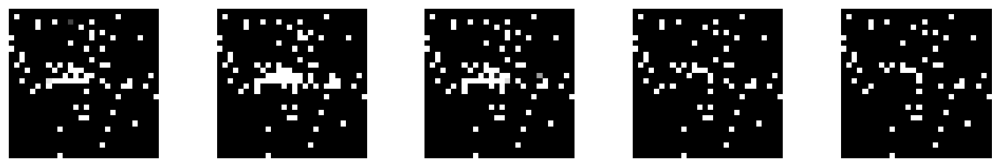

--------------- Epoch 360 ---------------
1/1 [==============================] - 0s 17ms/step


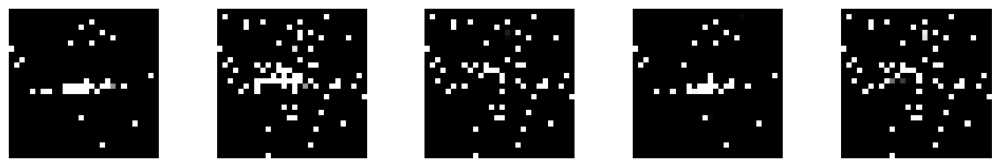

--------------- Epoch 361 ---------------
1/1 [==============================] - 0s 18ms/step


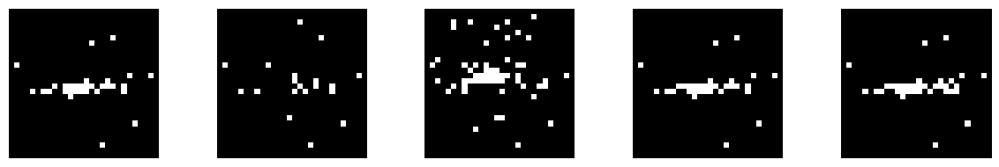

--------------- Epoch 362 ---------------
1/1 [==============================] - 0s 19ms/step


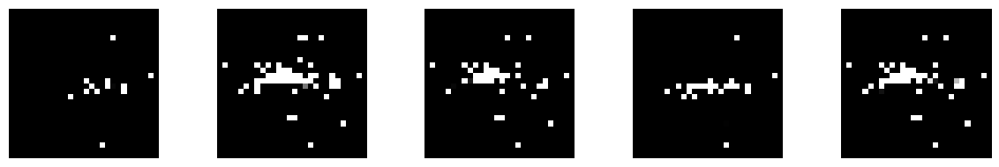

--------------- Epoch 363 ---------------
1/1 [==============================] - 0s 27ms/step


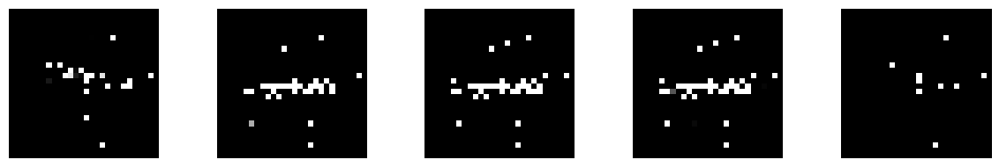

--------------- Epoch 364 ---------------
1/1 [==============================] - 0s 21ms/step


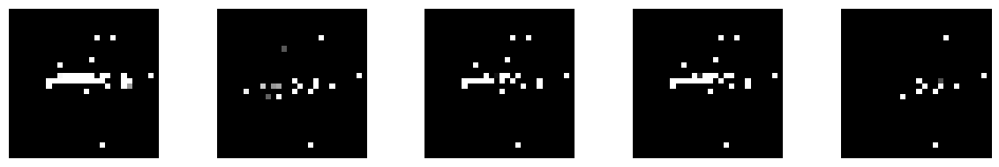

--------------- Epoch 365 ---------------
1/1 [==============================] - 0s 20ms/step


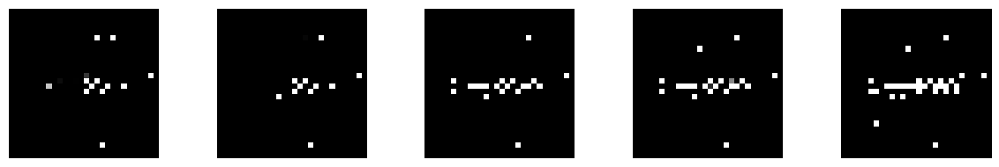

--------------- Epoch 366 ---------------
1/1 [==============================] - 0s 19ms/step


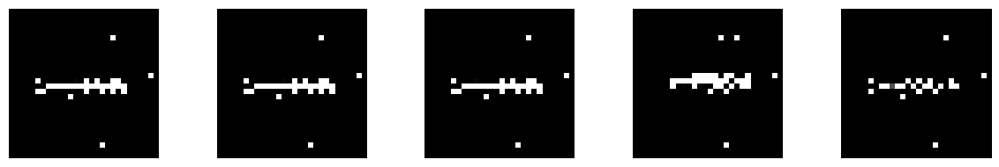

--------------- Epoch 367 ---------------
1/1 [==============================] - 0s 20ms/step


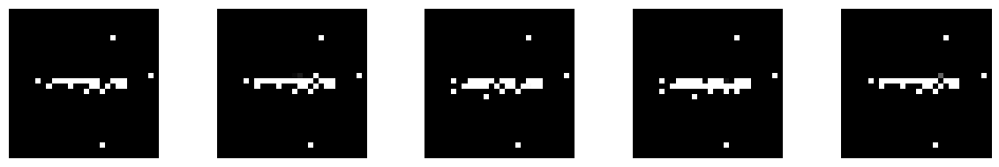

--------------- Epoch 368 ---------------
1/1 [==============================] - 0s 33ms/step


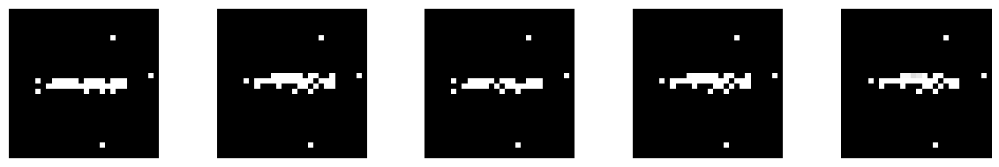

--------------- Epoch 369 ---------------
1/1 [==============================] - 0s 29ms/step


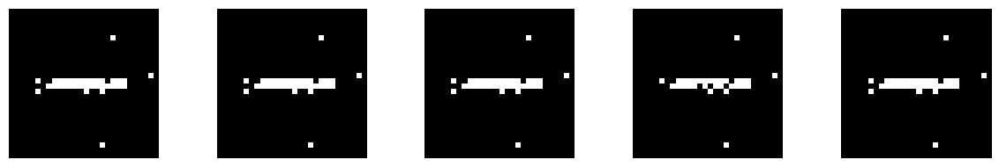

--------------- Epoch 370 ---------------
1/1 [==============================] - 0s 19ms/step


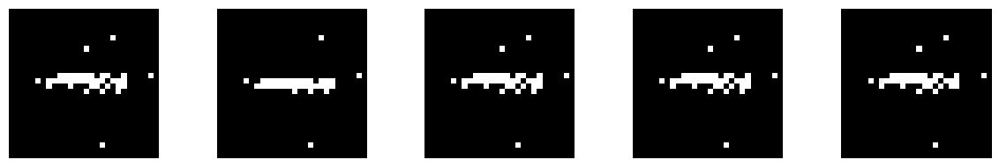

--------------- Epoch 371 ---------------
1/1 [==============================] - 0s 18ms/step


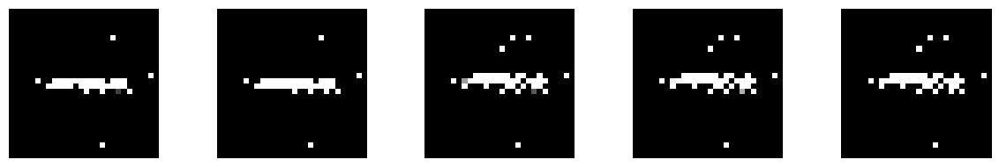

--------------- Epoch 372 ---------------
1/1 [==============================] - 0s 19ms/step


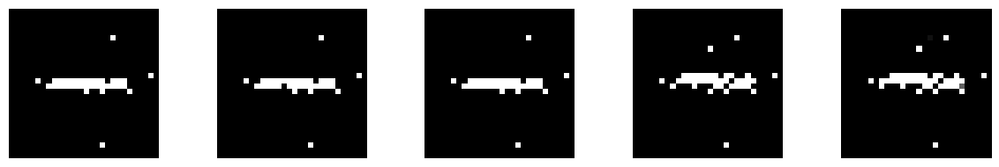

--------------- Epoch 373 ---------------
1/1 [==============================] - 0s 18ms/step


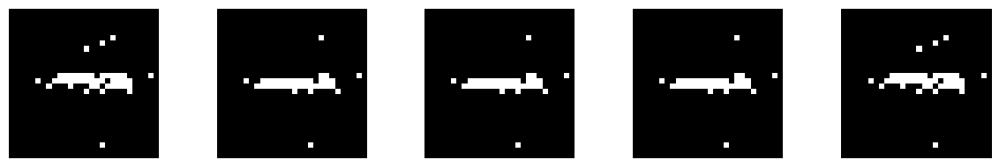

--------------- Epoch 374 ---------------
1/1 [==============================] - 0s 18ms/step


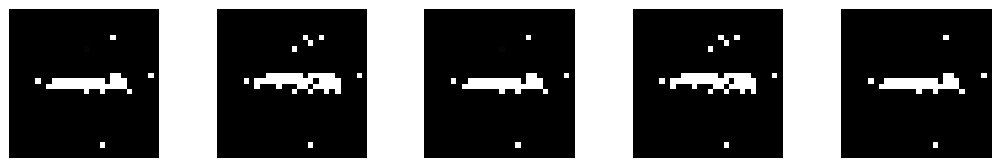

--------------- Epoch 375 ---------------
1/1 [==============================] - 0s 23ms/step


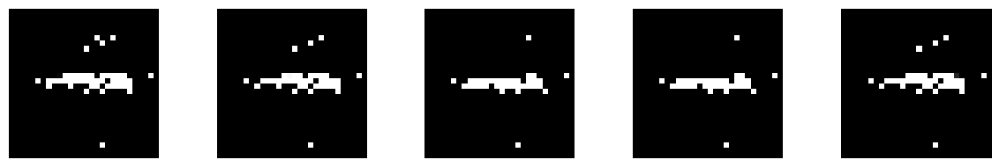

--------------- Epoch 376 ---------------
1/1 [==============================] - 0s 19ms/step


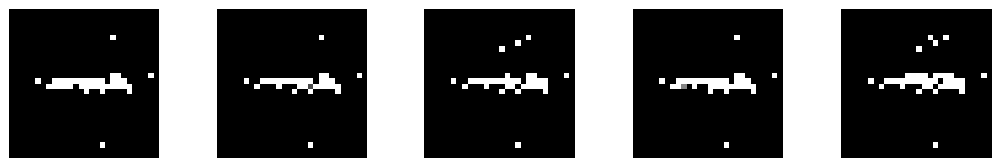

--------------- Epoch 377 ---------------
1/1 [==============================] - 0s 21ms/step


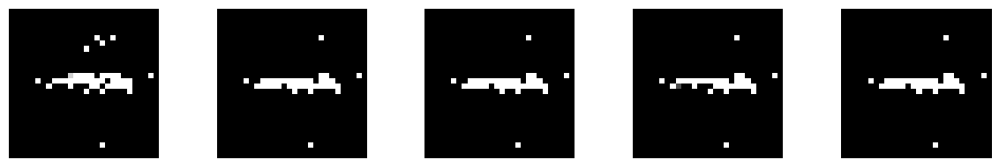

--------------- Epoch 378 ---------------
1/1 [==============================] - 0s 20ms/step


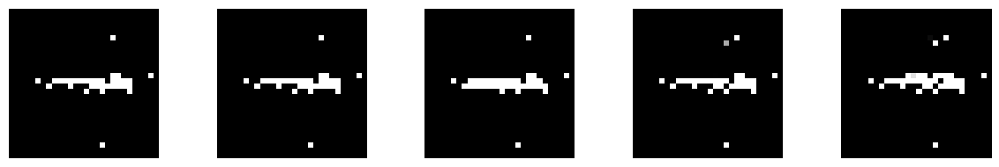

--------------- Epoch 379 ---------------
1/1 [==============================] - 0s 20ms/step


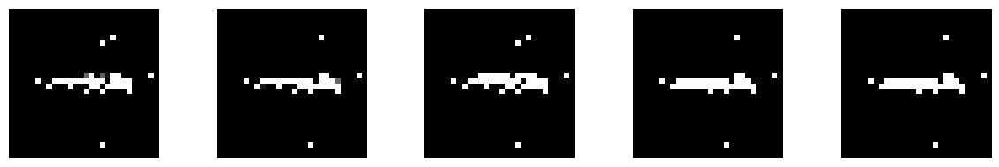

--------------- Epoch 380 ---------------
1/1 [==============================] - 0s 19ms/step


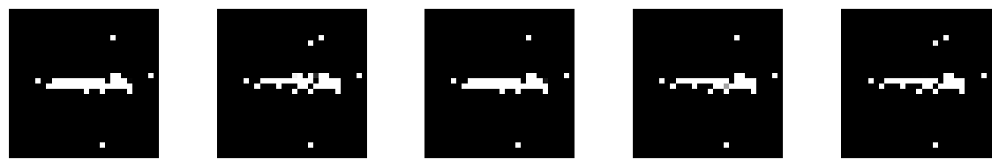

--------------- Epoch 381 ---------------
1/1 [==============================] - 0s 47ms/step


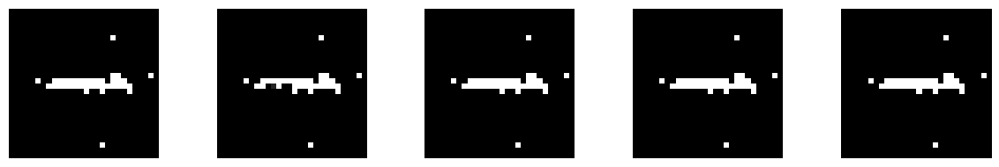

--------------- Epoch 382 ---------------
1/1 [==============================] - 0s 20ms/step


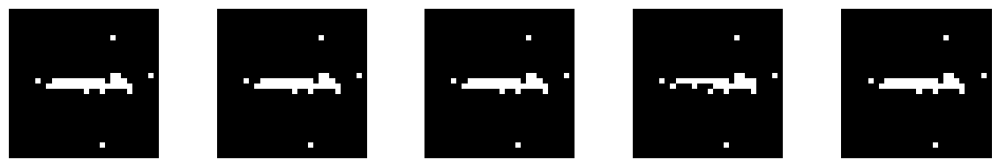

--------------- Epoch 383 ---------------
1/1 [==============================] - 0s 17ms/step


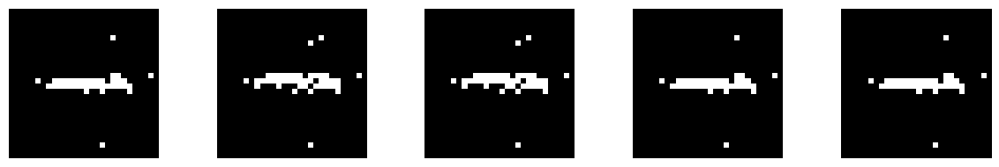

--------------- Epoch 384 ---------------
1/1 [==============================] - 0s 17ms/step


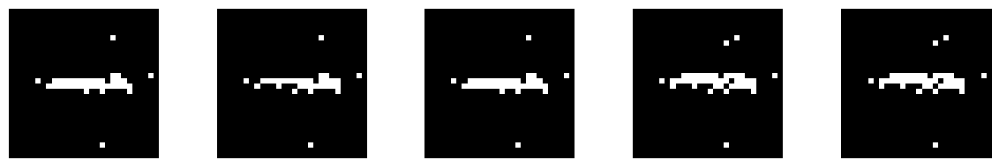

--------------- Epoch 385 ---------------
1/1 [==============================] - 0s 18ms/step


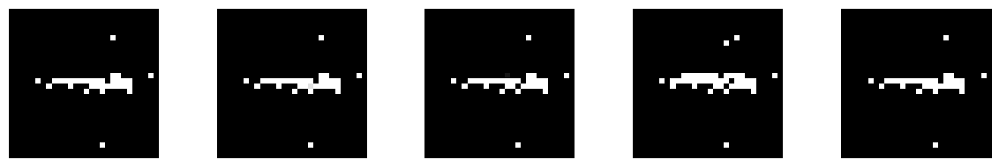

--------------- Epoch 386 ---------------
1/1 [==============================] - 0s 29ms/step


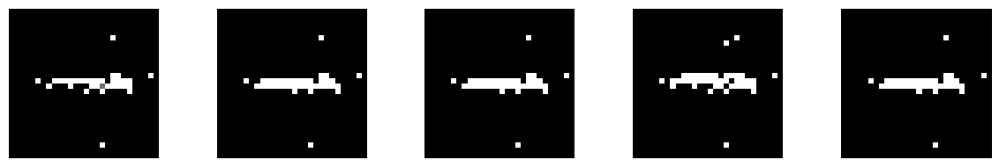

--------------- Epoch 387 ---------------
1/1 [==============================] - 0s 32ms/step


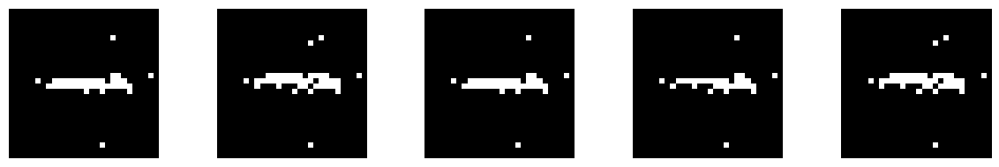

--------------- Epoch 388 ---------------
1/1 [==============================] - 0s 21ms/step


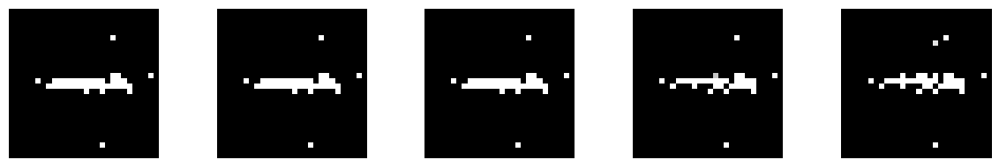

--------------- Epoch 389 ---------------
1/1 [==============================] - 0s 21ms/step


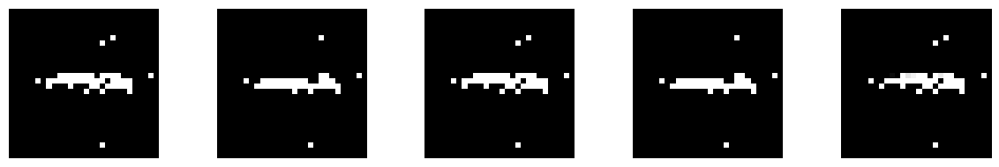

--------------- Epoch 390 ---------------
1/1 [==============================] - 0s 20ms/step


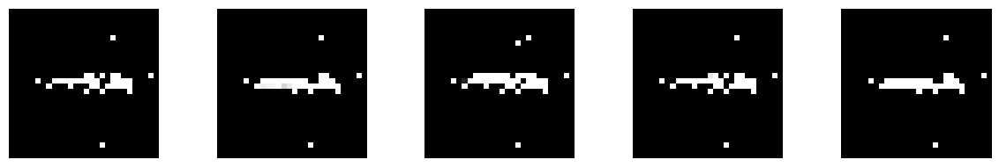

--------------- Epoch 391 ---------------
1/1 [==============================] - 0s 26ms/step


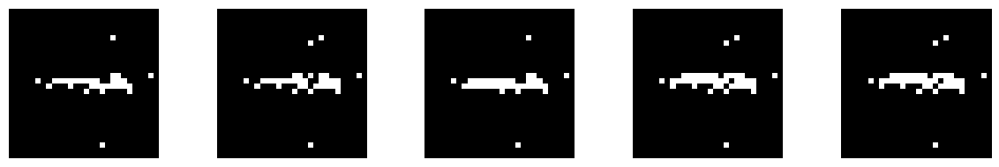

--------------- Epoch 392 ---------------
1/1 [==============================] - 0s 27ms/step


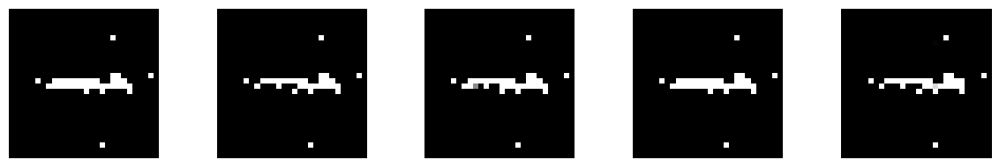

--------------- Epoch 393 ---------------
1/1 [==============================] - 0s 35ms/step


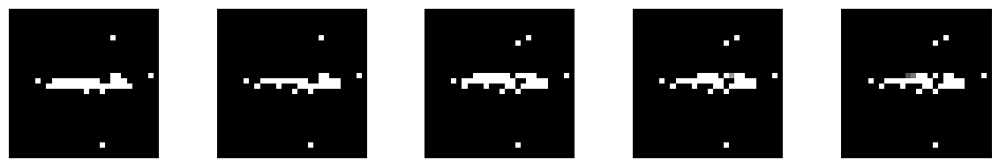

--------------- Epoch 394 ---------------
1/1 [==============================] - 0s 18ms/step


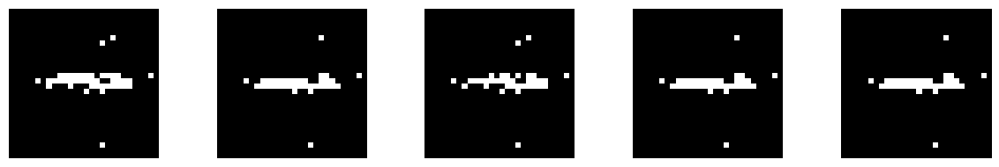

--------------- Epoch 395 ---------------
1/1 [==============================] - 0s 18ms/step


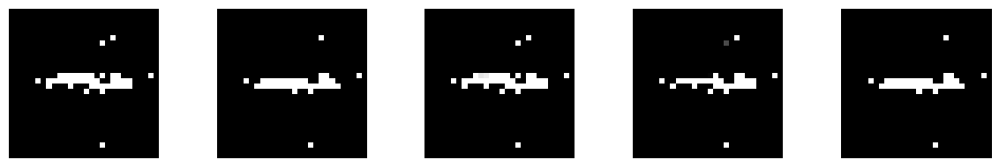

--------------- Epoch 396 ---------------
1/1 [==============================] - 0s 17ms/step


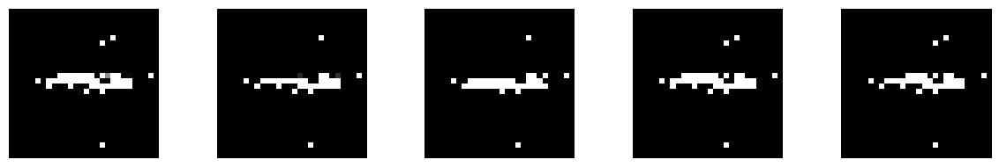

--------------- Epoch 397 ---------------
1/1 [==============================] - 0s 17ms/step


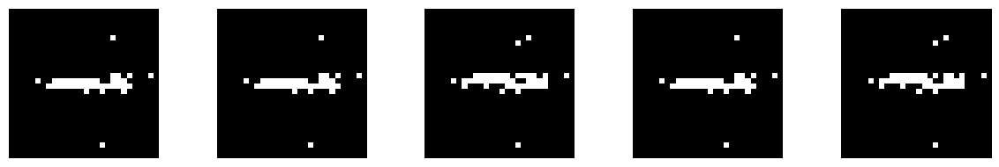

--------------- Epoch 398 ---------------
1/1 [==============================] - 0s 25ms/step


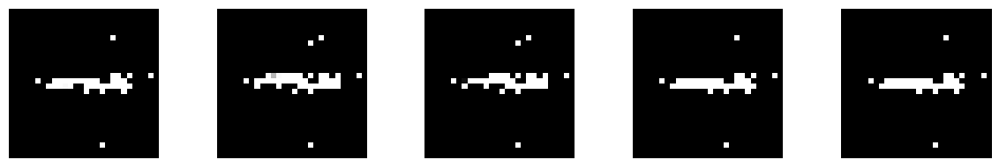

--------------- Epoch 399 ---------------
1/1 [==============================] - 0s 30ms/step


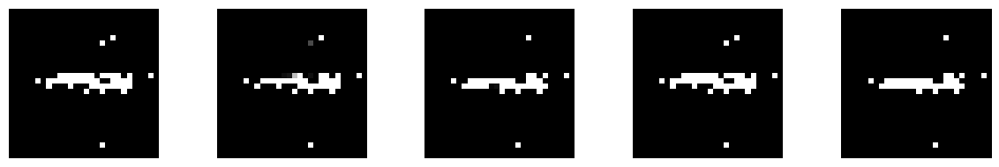

--------------- Epoch 400 ---------------
1/1 [==============================] - 0s 26ms/step


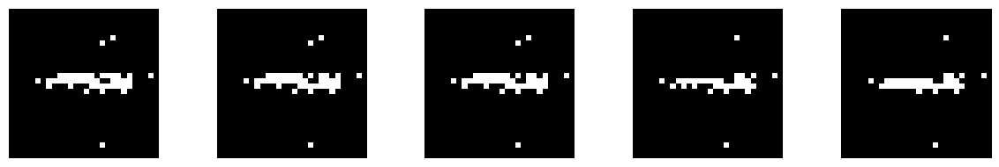

--------------- Epoch 401 ---------------
1/1 [==============================] - 0s 31ms/step


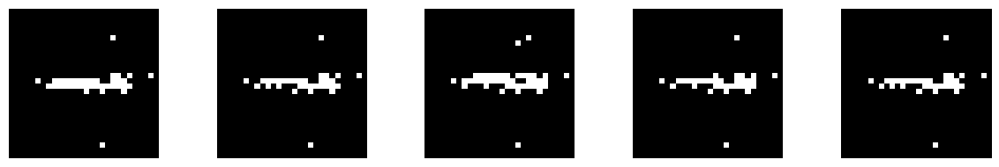

--------------- Epoch 402 ---------------
1/1 [==============================] - 0s 32ms/step


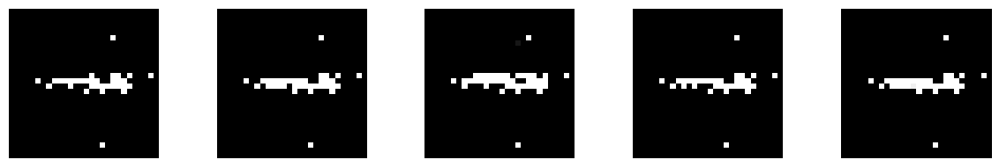

--------------- Epoch 403 ---------------
1/1 [==============================] - 0s 19ms/step


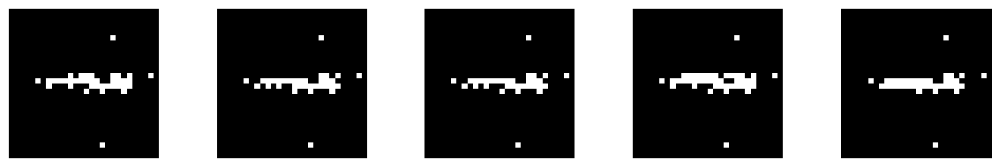

--------------- Epoch 404 ---------------
1/1 [==============================] - 0s 32ms/step


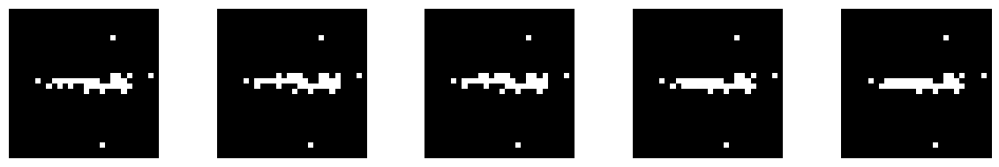

--------------- Epoch 405 ---------------
1/1 [==============================] - 0s 19ms/step


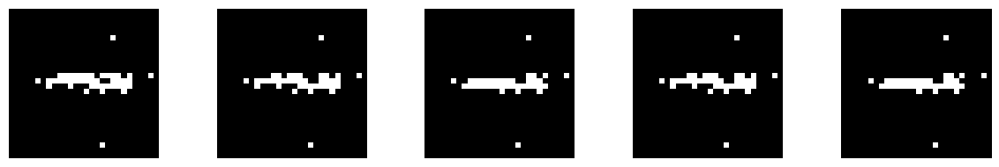

--------------- Epoch 406 ---------------
1/1 [==============================] - 0s 21ms/step


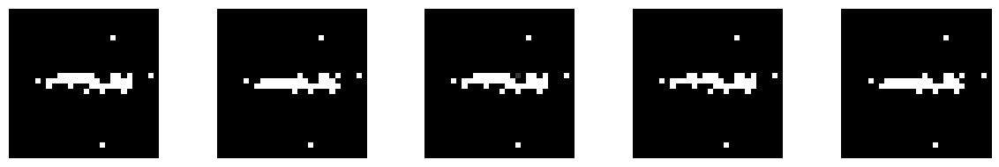

--------------- Epoch 407 ---------------
1/1 [==============================] - 0s 17ms/step


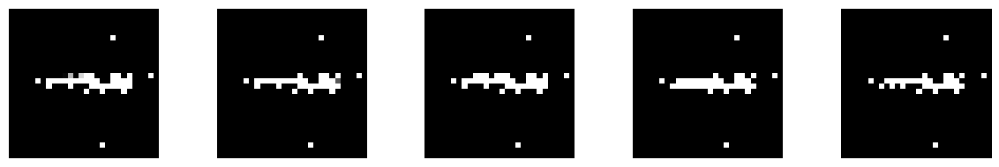

--------------- Epoch 408 ---------------
1/1 [==============================] - 0s 16ms/step


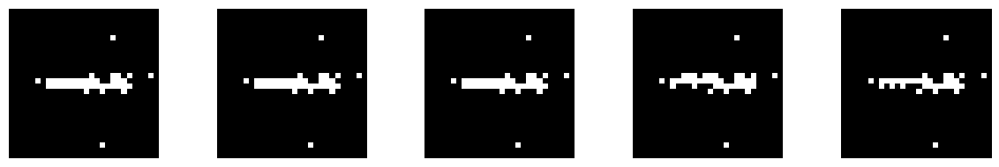

--------------- Epoch 409 ---------------
1/1 [==============================] - 0s 18ms/step


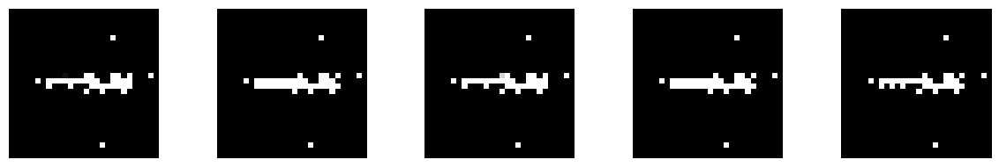

--------------- Epoch 410 ---------------
1/1 [==============================] - 0s 28ms/step


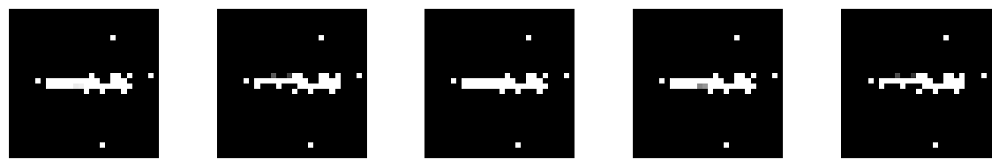

--------------- Epoch 411 ---------------
1/1 [==============================] - 0s 19ms/step


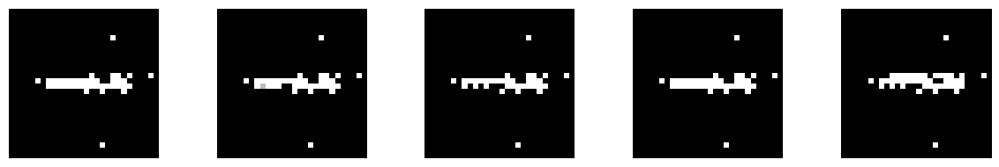

--------------- Epoch 412 ---------------
1/1 [==============================] - 0s 32ms/step


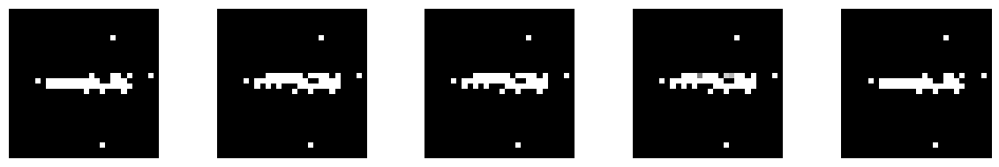

--------------- Epoch 413 ---------------
1/1 [==============================] - 0s 20ms/step


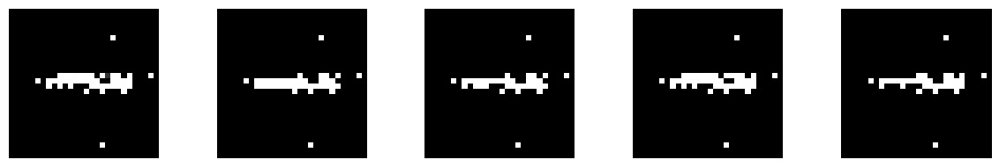

--------------- Epoch 414 ---------------
1/1 [==============================] - 0s 20ms/step


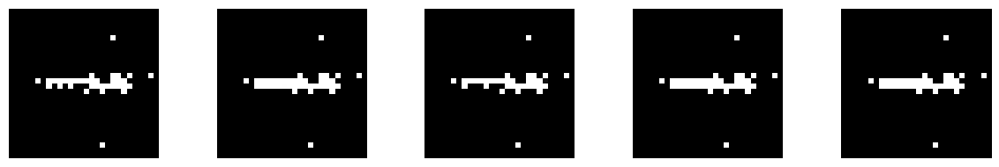

--------------- Epoch 415 ---------------
1/1 [==============================] - 0s 36ms/step


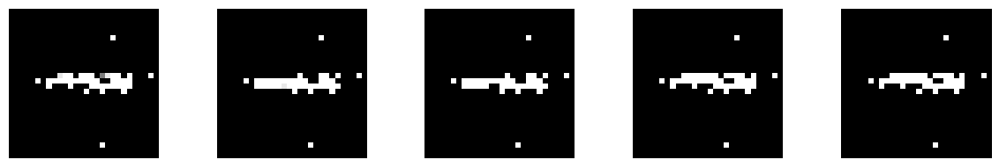

--------------- Epoch 416 ---------------
1/1 [==============================] - 0s 44ms/step


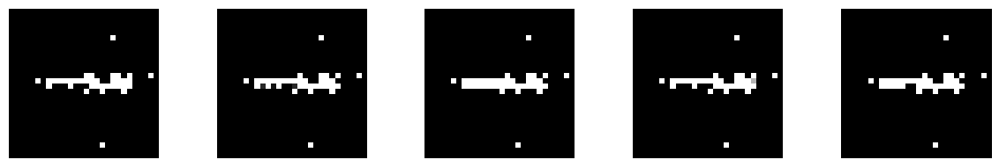

--------------- Epoch 417 ---------------
1/1 [==============================] - 0s 20ms/step


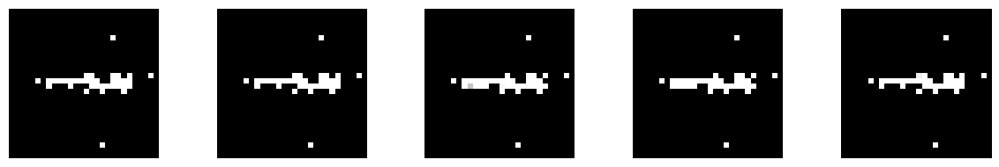

--------------- Epoch 418 ---------------
1/1 [==============================] - 0s 18ms/step


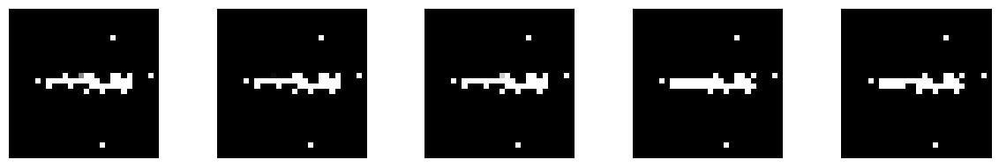

--------------- Epoch 419 ---------------
1/1 [==============================] - 0s 18ms/step


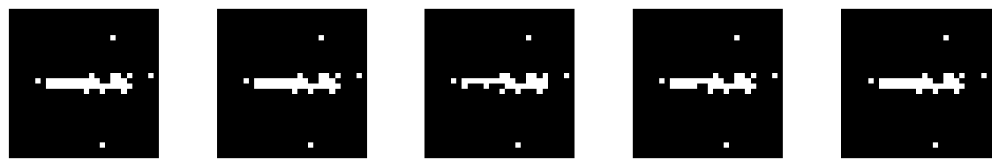

--------------- Epoch 420 ---------------
1/1 [==============================] - 0s 17ms/step


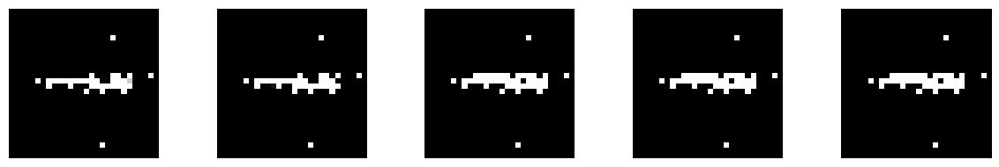

--------------- Epoch 421 ---------------
1/1 [==============================] - 0s 17ms/step


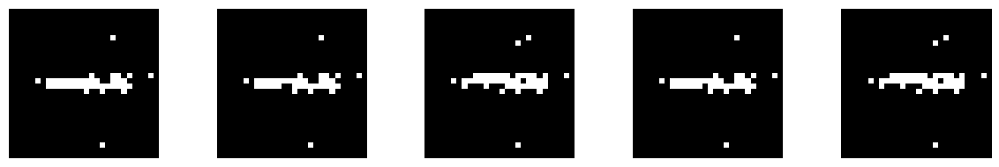

--------------- Epoch 422 ---------------
1/1 [==============================] - 0s 27ms/step


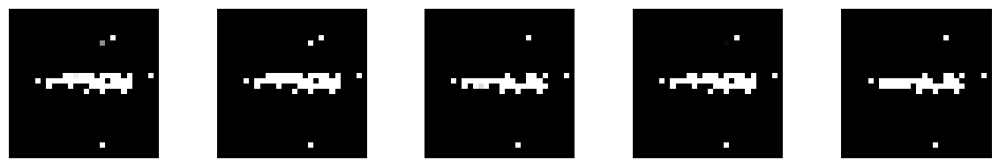

--------------- Epoch 423 ---------------
1/1 [==============================] - 0s 17ms/step


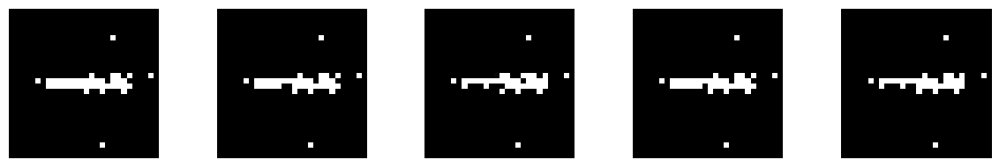

--------------- Epoch 424 ---------------
1/1 [==============================] - 0s 18ms/step


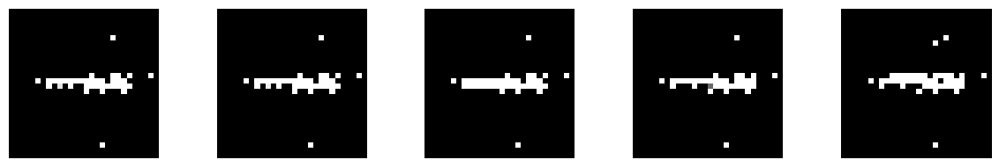

--------------- Epoch 425 ---------------
1/1 [==============================] - 0s 22ms/step


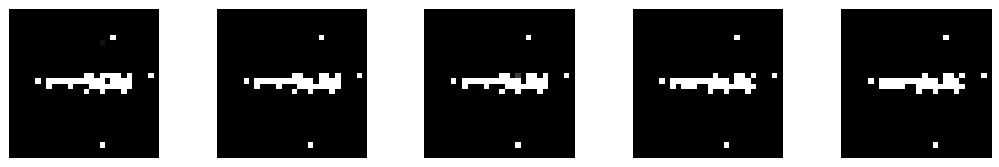

--------------- Epoch 426 ---------------
1/1 [==============================] - 0s 24ms/step


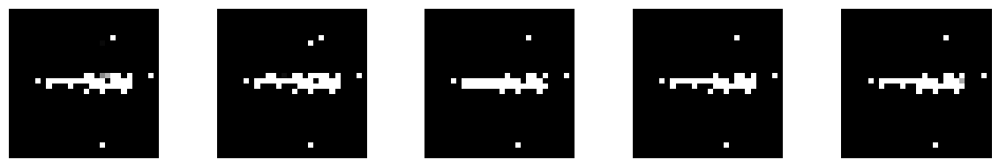

--------------- Epoch 427 ---------------
1/1 [==============================] - 0s 31ms/step


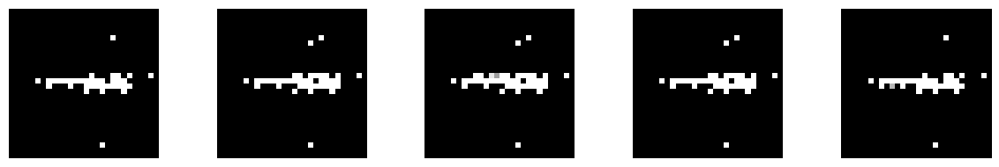

--------------- Epoch 428 ---------------
1/1 [==============================] - 0s 32ms/step


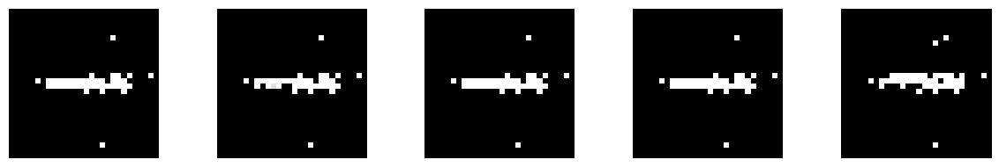

--------------- Epoch 429 ---------------
1/1 [==============================] - 0s 26ms/step


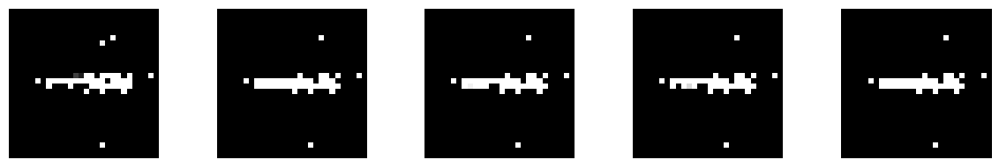

--------------- Epoch 430 ---------------
1/1 [==============================] - 0s 18ms/step


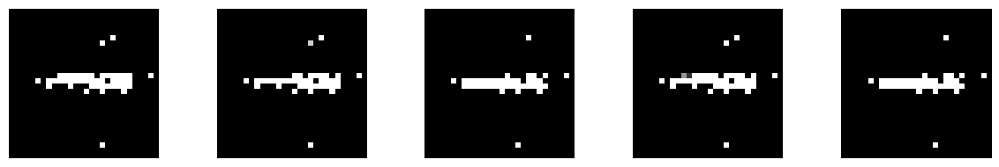

--------------- Epoch 431 ---------------
1/1 [==============================] - 0s 19ms/step


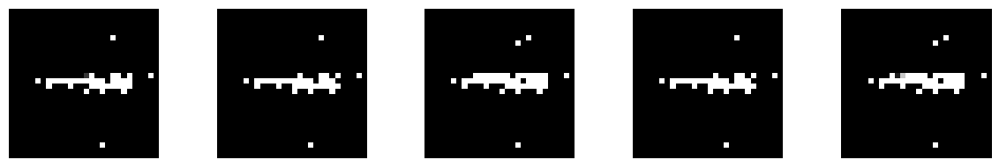

--------------- Epoch 432 ---------------
1/1 [==============================] - 0s 18ms/step


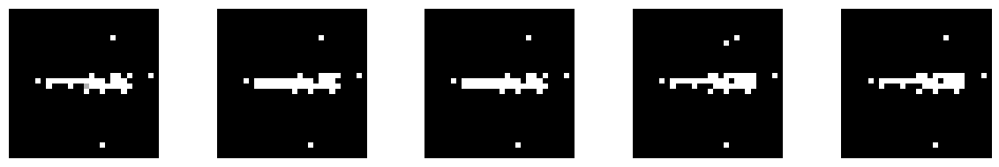

--------------- Epoch 433 ---------------
1/1 [==============================] - 0s 29ms/step


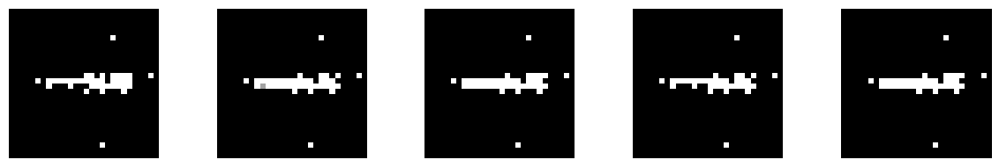

--------------- Epoch 434 ---------------
1/1 [==============================] - 0s 35ms/step


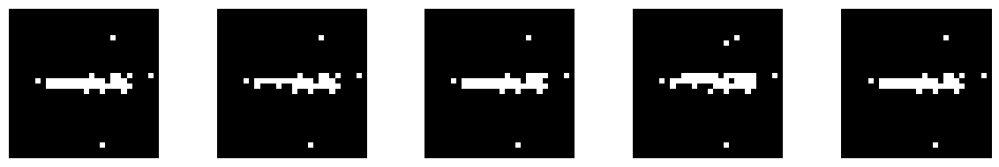

--------------- Epoch 435 ---------------
1/1 [==============================] - 0s 22ms/step


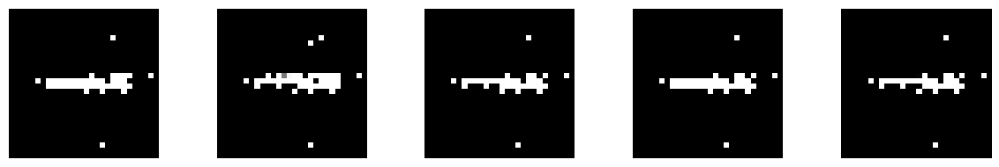

--------------- Epoch 436 ---------------
1/1 [==============================] - 0s 19ms/step


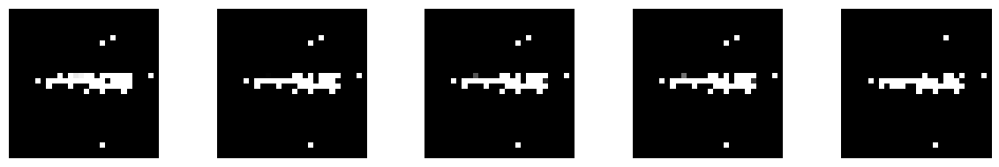

--------------- Epoch 437 ---------------
1/1 [==============================] - 0s 20ms/step


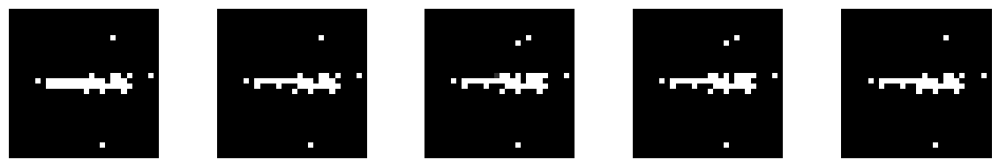

--------------- Epoch 438 ---------------
1/1 [==============================] - 0s 21ms/step


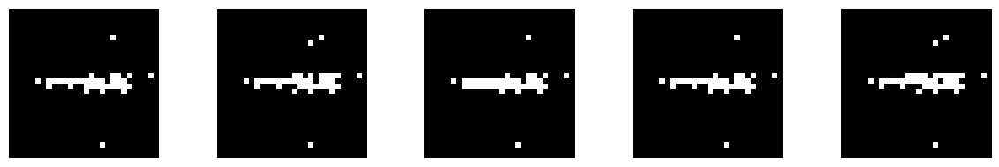

--------------- Epoch 439 ---------------
1/1 [==============================] - 0s 28ms/step


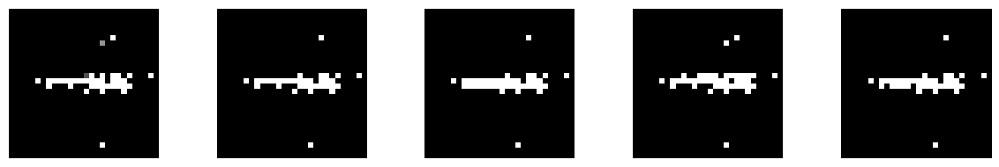

--------------- Epoch 440 ---------------
1/1 [==============================] - 0s 25ms/step


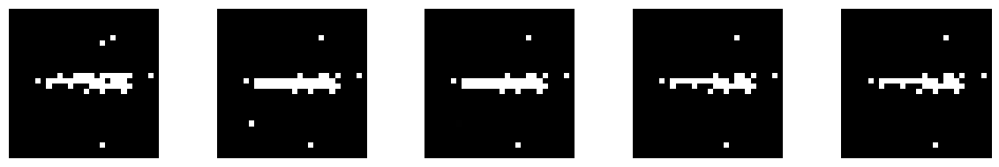

--------------- Epoch 441 ---------------
1/1 [==============================] - 0s 20ms/step


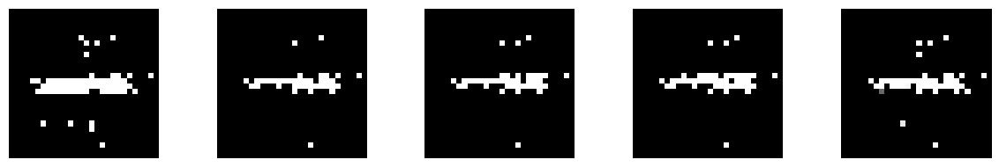

--------------- Epoch 442 ---------------
1/1 [==============================] - 0s 18ms/step


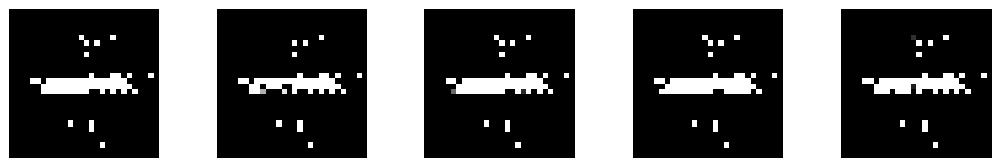

--------------- Epoch 443 ---------------
1/1 [==============================] - 0s 19ms/step


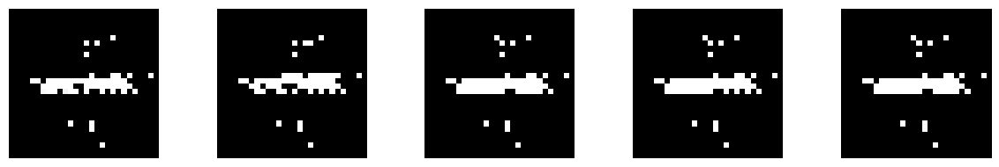

--------------- Epoch 444 ---------------
1/1 [==============================] - 0s 18ms/step


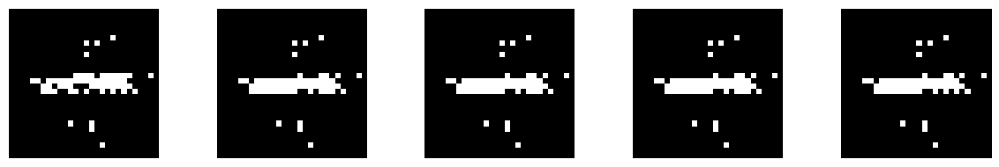

--------------- Epoch 445 ---------------
1/1 [==============================] - 0s 27ms/step


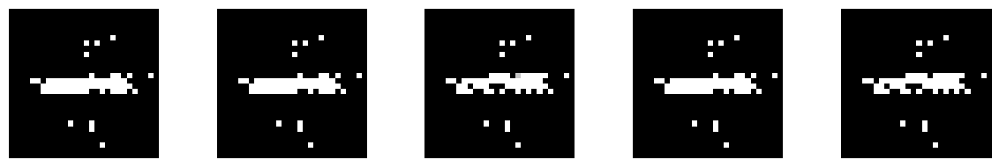

--------------- Epoch 446 ---------------
1/1 [==============================] - 0s 18ms/step


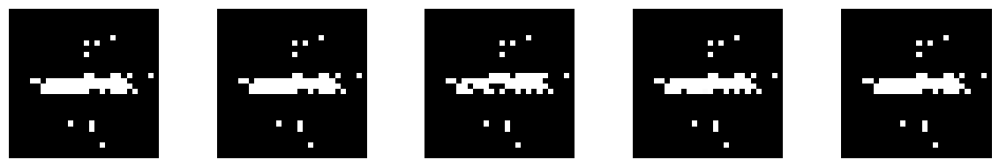

--------------- Epoch 447 ---------------
1/1 [==============================] - 0s 17ms/step


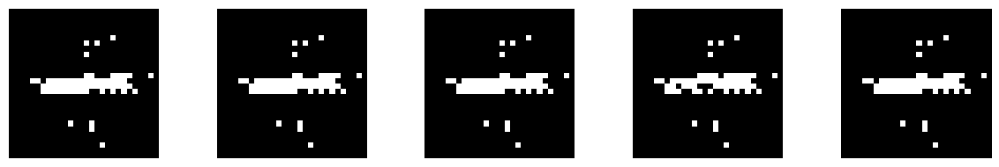

--------------- Epoch 448 ---------------
1/1 [==============================] - 0s 18ms/step


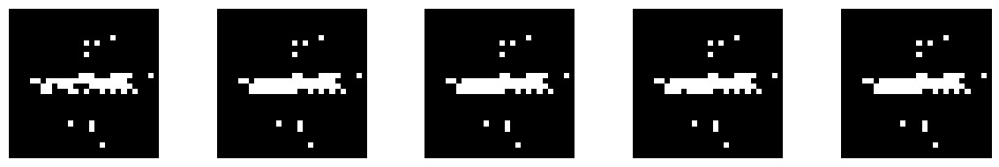

--------------- Epoch 449 ---------------
1/1 [==============================] - 0s 21ms/step


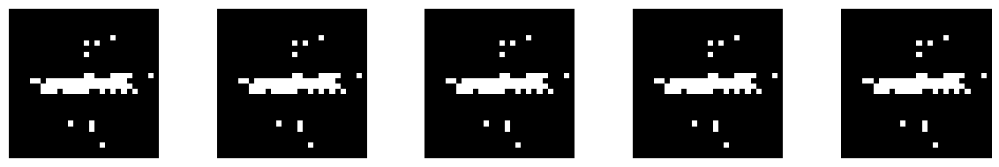

--------------- Epoch 450 ---------------
1/1 [==============================] - 0s 20ms/step


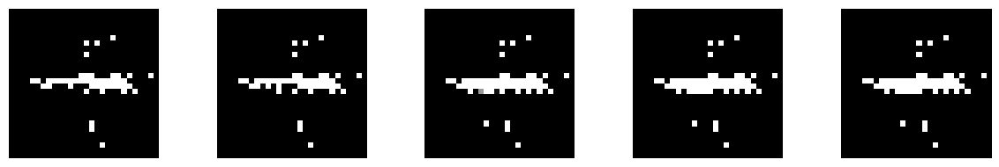

--------------- Epoch 451 ---------------
1/1 [==============================] - 0s 27ms/step


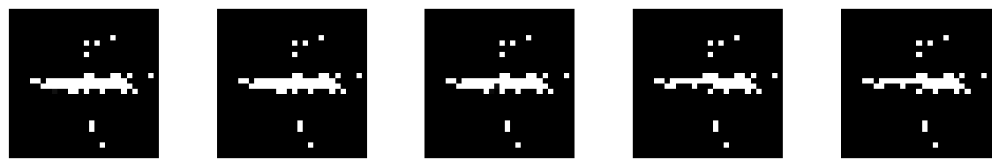

--------------- Epoch 452 ---------------
1/1 [==============================] - 0s 24ms/step


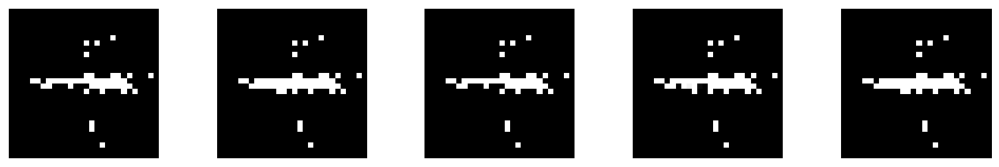

--------------- Epoch 453 ---------------
1/1 [==============================] - 0s 18ms/step


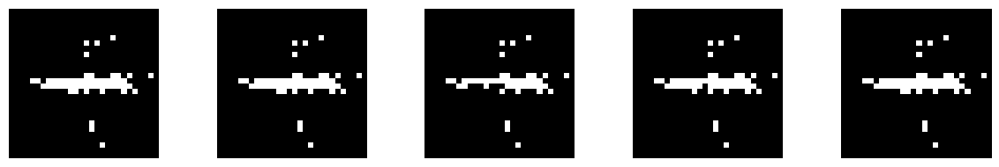

--------------- Epoch 454 ---------------
1/1 [==============================] - 0s 19ms/step


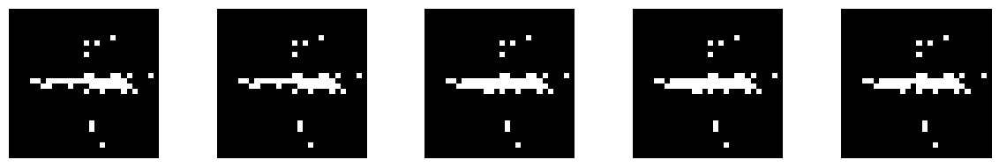

--------------- Epoch 455 ---------------
1/1 [==============================] - 0s 19ms/step


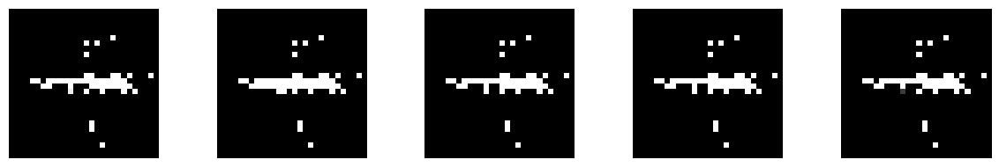

--------------- Epoch 456 ---------------
1/1 [==============================] - 0s 18ms/step


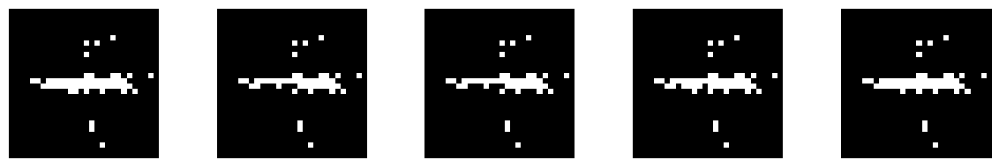

--------------- Epoch 457 ---------------
1/1 [==============================] - 0s 23ms/step


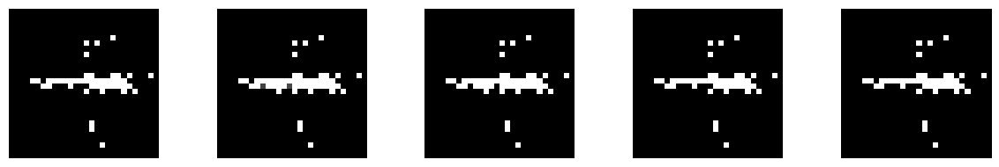

--------------- Epoch 458 ---------------
1/1 [==============================] - 0s 21ms/step


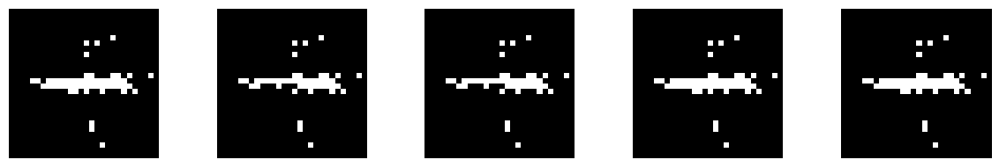

--------------- Epoch 459 ---------------
1/1 [==============================] - 0s 17ms/step


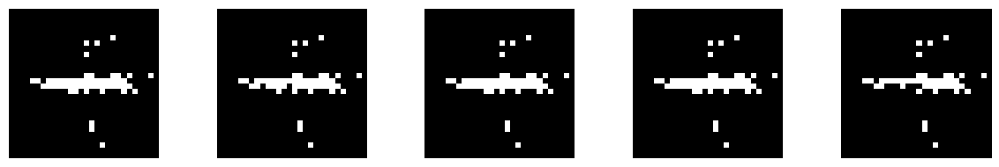

--------------- Epoch 460 ---------------
1/1 [==============================] - 0s 17ms/step


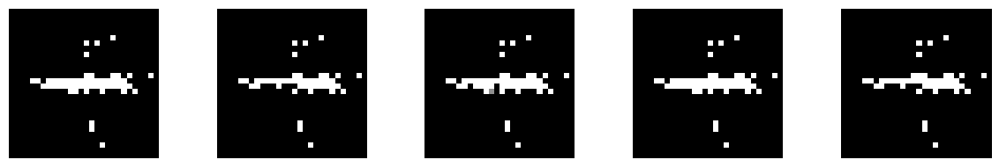

--------------- Epoch 461 ---------------
1/1 [==============================] - 0s 17ms/step


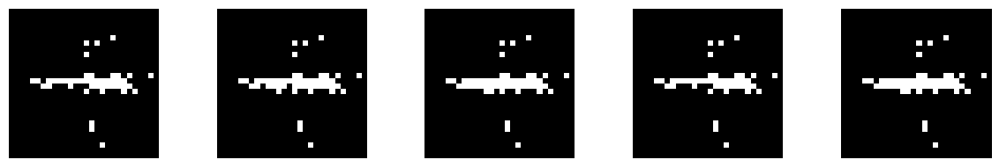

--------------- Epoch 462 ---------------
1/1 [==============================] - 0s 21ms/step


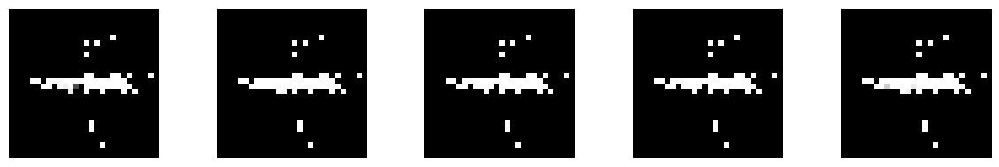

--------------- Epoch 463 ---------------
1/1 [==============================] - 0s 36ms/step


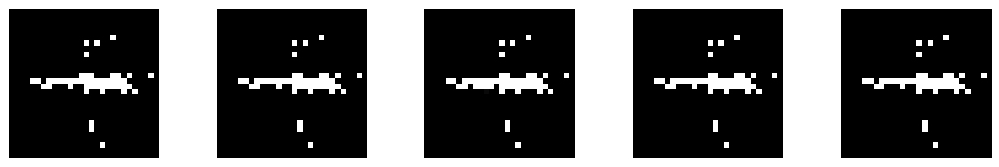

--------------- Epoch 464 ---------------
1/1 [==============================] - 0s 21ms/step


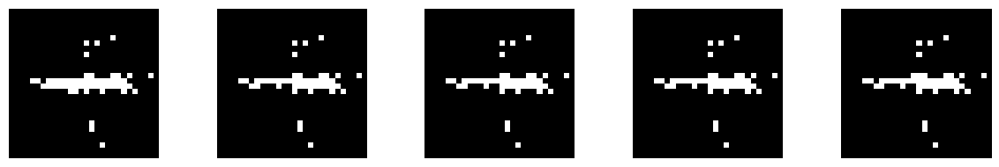

--------------- Epoch 465 ---------------
1/1 [==============================] - 0s 22ms/step


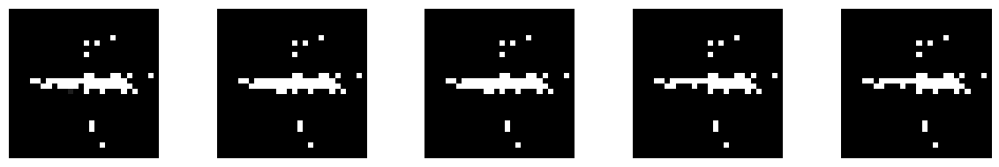

--------------- Epoch 466 ---------------
1/1 [==============================] - 0s 17ms/step


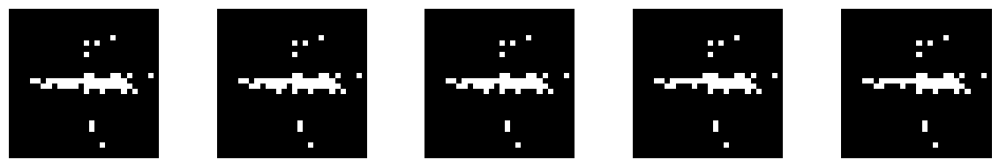

--------------- Epoch 467 ---------------
1/1 [==============================] - 0s 18ms/step


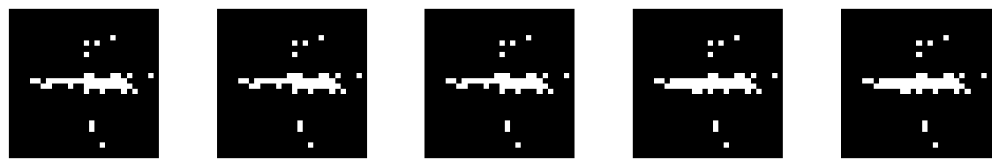

--------------- Epoch 468 ---------------
1/1 [==============================] - 0s 20ms/step


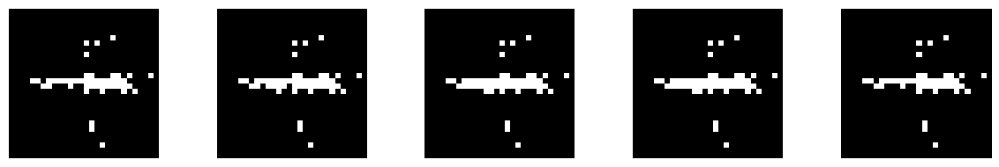

--------------- Epoch 469 ---------------
1/1 [==============================] - 0s 32ms/step


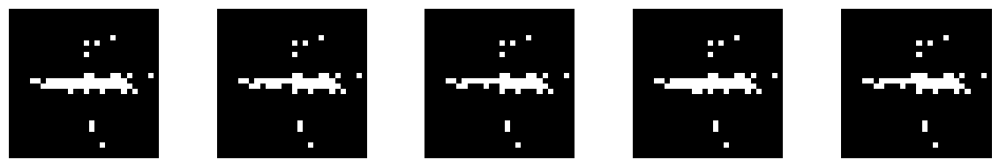

--------------- Epoch 470 ---------------
1/1 [==============================] - 0s 18ms/step


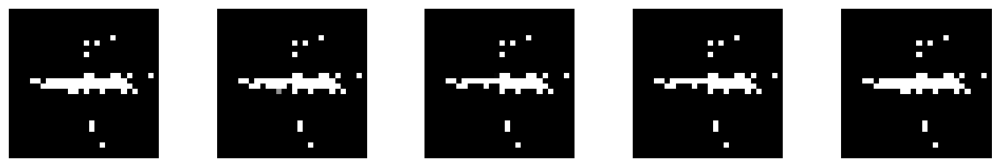

--------------- Epoch 471 ---------------
1/1 [==============================] - 0s 56ms/step


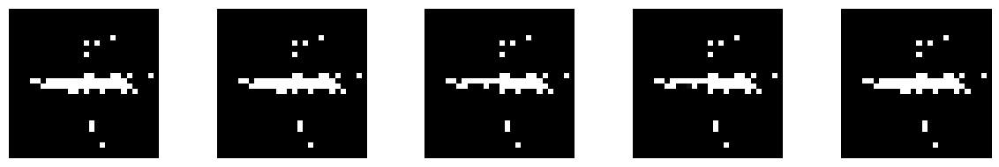

--------------- Epoch 472 ---------------
1/1 [==============================] - 0s 21ms/step


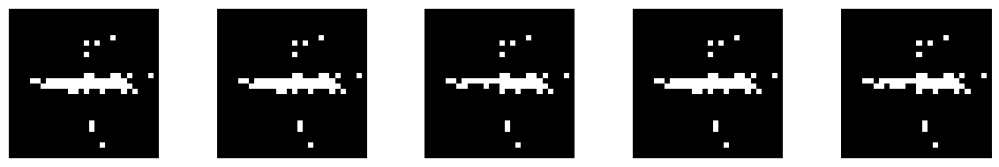

--------------- Epoch 473 ---------------
1/1 [==============================] - 0s 17ms/step


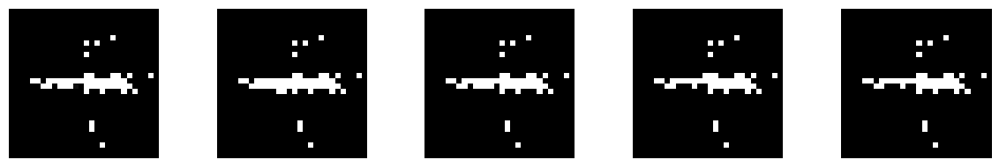

--------------- Epoch 474 ---------------
1/1 [==============================] - 0s 29ms/step


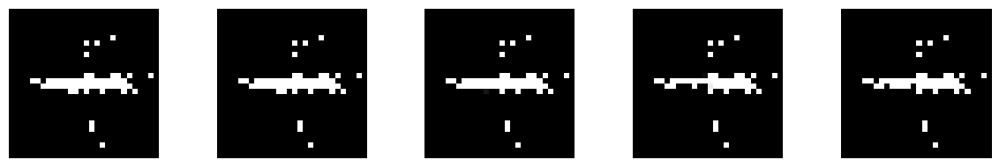

--------------- Epoch 475 ---------------
1/1 [==============================] - 0s 22ms/step


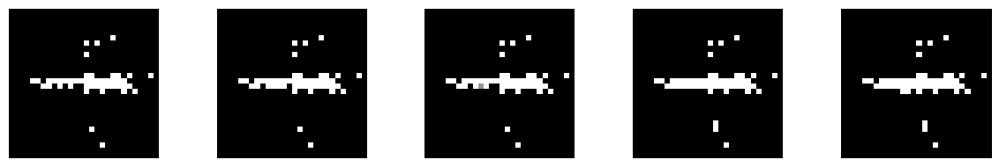

--------------- Epoch 476 ---------------
1/1 [==============================] - 0s 23ms/step


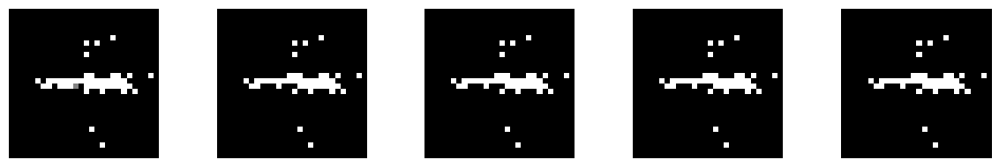

--------------- Epoch 477 ---------------
1/1 [==============================] - 0s 21ms/step


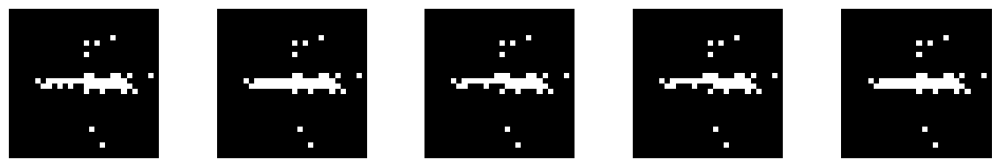

--------------- Epoch 478 ---------------
1/1 [==============================] - 0s 19ms/step


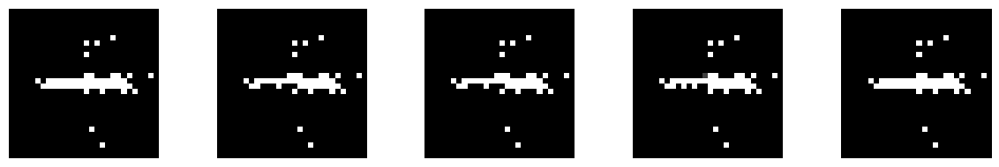

--------------- Epoch 479 ---------------
1/1 [==============================] - 0s 19ms/step


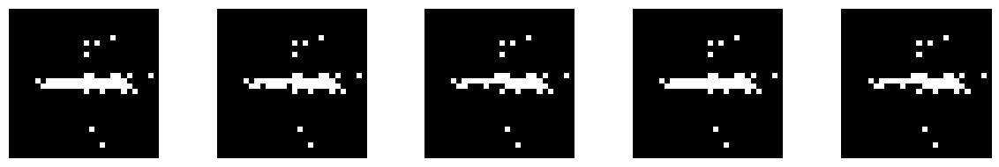

--------------- Epoch 480 ---------------
1/1 [==============================] - 0s 31ms/step


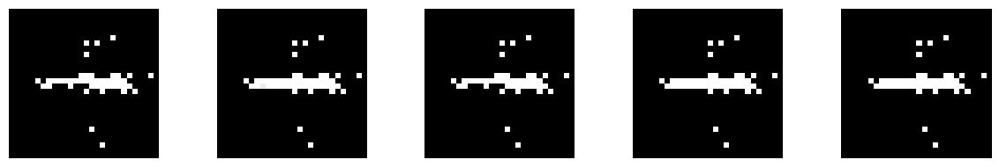

--------------- Epoch 481 ---------------
1/1 [==============================] - 0s 19ms/step


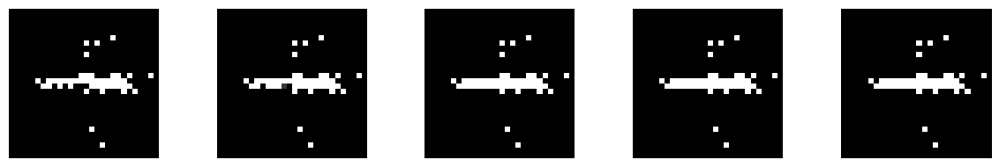

--------------- Epoch 482 ---------------
1/1 [==============================] - 0s 17ms/step


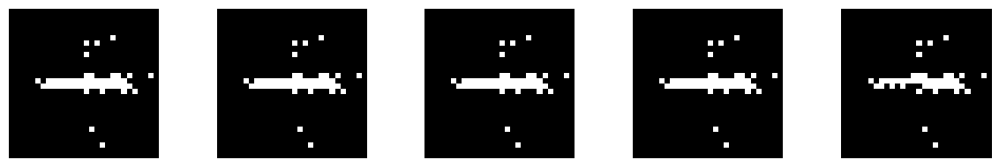

--------------- Epoch 483 ---------------
1/1 [==============================] - 0s 16ms/step


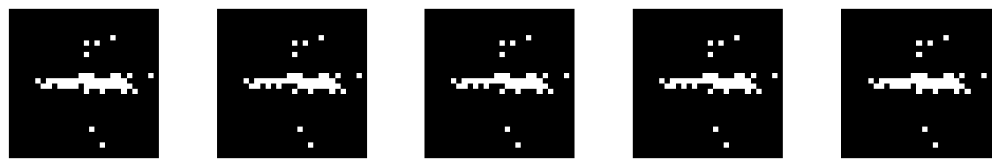

--------------- Epoch 484 ---------------
1/1 [==============================] - 0s 22ms/step


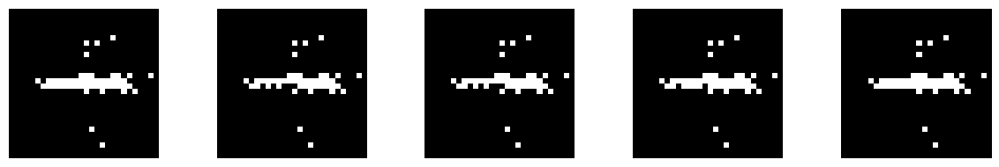

--------------- Epoch 485 ---------------
1/1 [==============================] - 0s 50ms/step


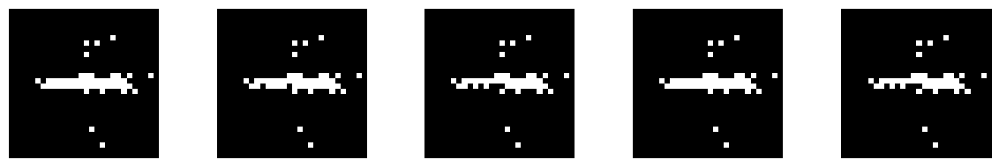

--------------- Epoch 486 ---------------
1/1 [==============================] - 0s 32ms/step


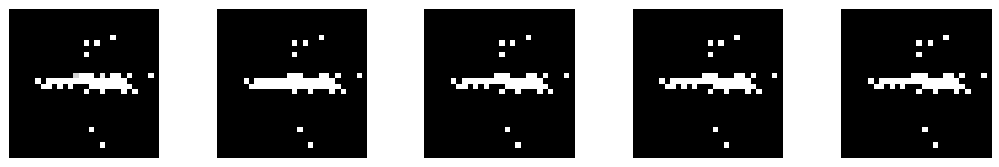

--------------- Epoch 487 ---------------
1/1 [==============================] - 0s 19ms/step


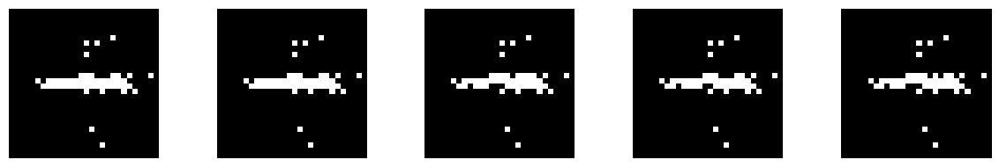

--------------- Epoch 488 ---------------
1/1 [==============================] - 0s 21ms/step


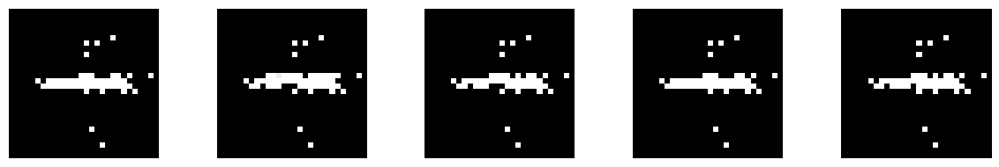

--------------- Epoch 489 ---------------
1/1 [==============================] - 0s 19ms/step


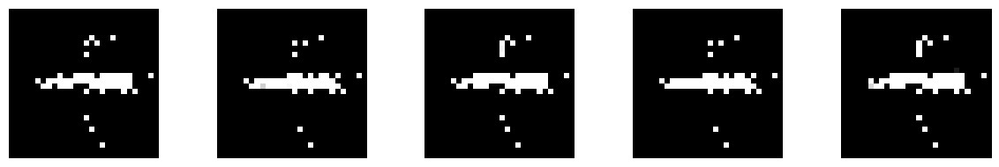

--------------- Epoch 490 ---------------
1/1 [==============================] - 0s 20ms/step


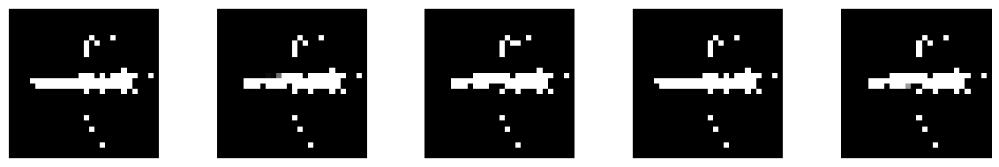

--------------- Epoch 491 ---------------
1/1 [==============================] - 0s 43ms/step


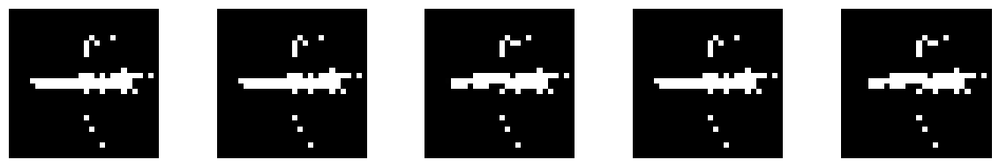

--------------- Epoch 492 ---------------
1/1 [==============================] - 0s 28ms/step


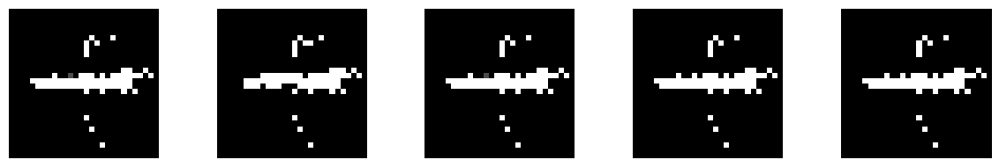

--------------- Epoch 493 ---------------
1/1 [==============================] - 0s 17ms/step


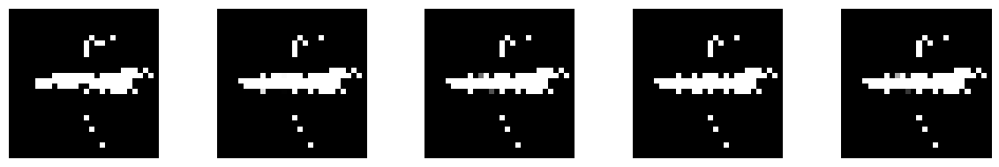

--------------- Epoch 494 ---------------
1/1 [==============================] - 0s 17ms/step


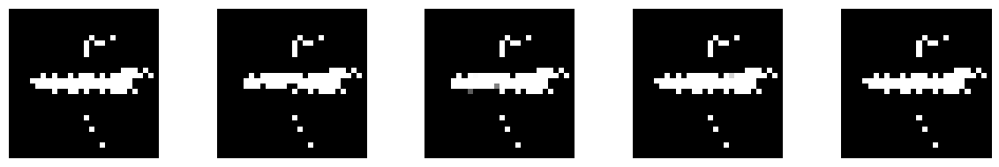

--------------- Epoch 495 ---------------
1/1 [==============================] - 0s 18ms/step


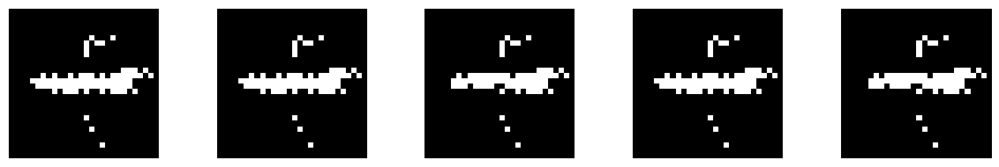

--------------- Epoch 496 ---------------
1/1 [==============================] - 0s 22ms/step


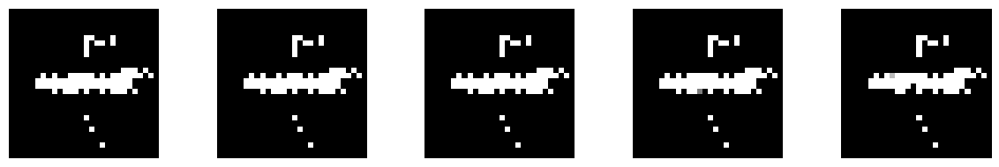

--------------- Epoch 497 ---------------
1/1 [==============================] - 0s 34ms/step


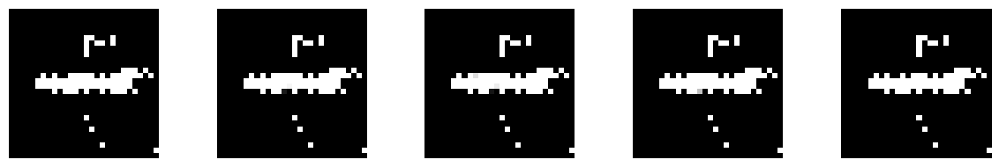

--------------- Epoch 498 ---------------
1/1 [==============================] - 0s 17ms/step


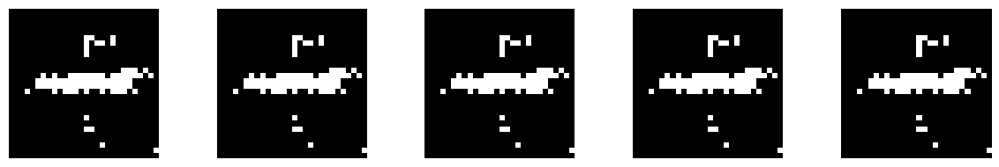

--------------- Epoch 499 ---------------
1/1 [==============================] - 0s 24ms/step


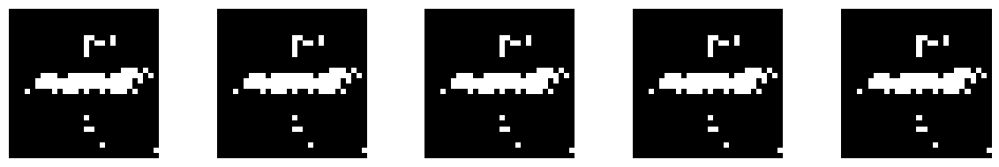

--------------- Epoch 500 ---------------
1/1 [==============================] - 0s 20ms/step


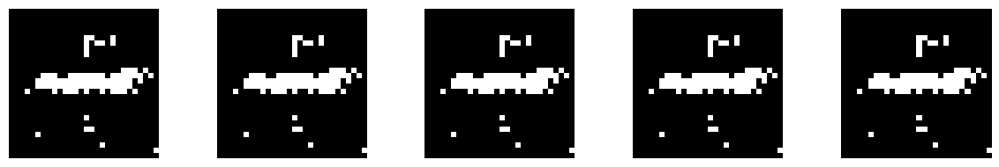

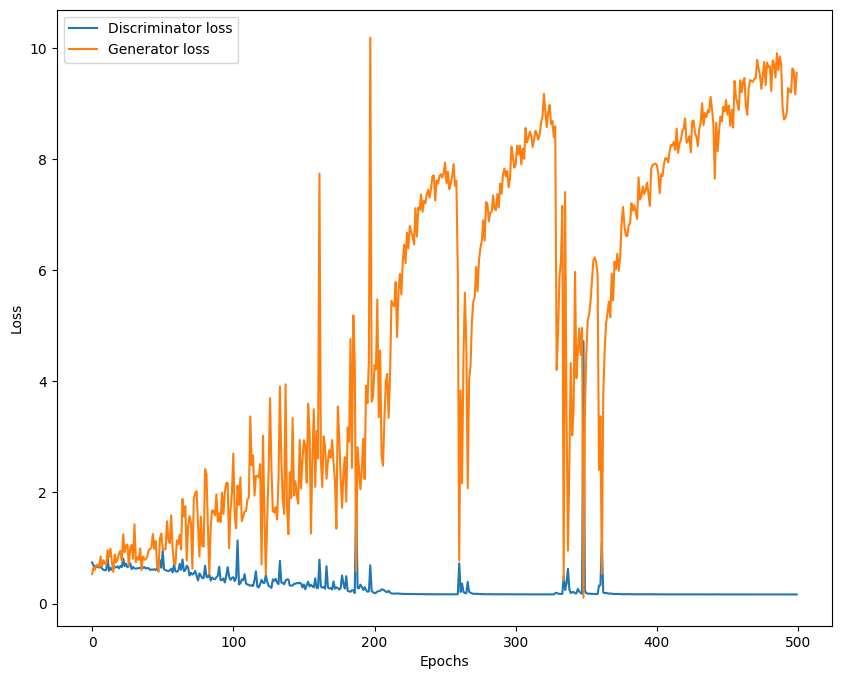

In [24]:
train(z_dim, epochs=500, BATCH_SIZE=128)

This is a terrible fit. Lets configure its architecture and add more techniques to improce the fit.

In [25]:
z_dim = 1000
lr = 0.0002
patience = 5
factor = 0.5
min_lr = 1e-6
wait = 0
adam = Adam(learning_rate=lr, beta_1=0.5)

# (a) GENERATOR
g = Sequential()
g.add(Dense(256, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(1024, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(2048, activation=LeakyReLU(alpha=0.3)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(2048, input_dim=784, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(1024, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(512, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(256, activation=LeakyReLU(alpha=0.3)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])


def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=5, dim=(1, 5), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    best = 999.9
    lr = 0.0002
    patience = 5
    factor = 0.5
    min_lr = 1e-6
    wait = 0
    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)
        '''
        if d_loss[0] < best:
            best = d_loss[0]
            wait = 0
        else:
            wait += 1

        # Reduce learning rate if no improvement
        if wait >= patience:
            lr = max(lr * factor, min_lr)
            adam.learning_rate = lr
            print(f'Reducing learning rate to {lr}')
            wait = 0'''
        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 500
Batch size: 128
Batches per epoch: 16


<ipython-input-25-82afcf798f3a>:85: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for e in tqdm_notebook(range(1, epochs+1)):


  0%|          | 0/500 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 80ms/step


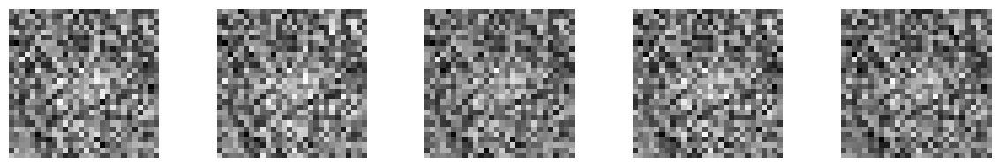

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 16ms/step


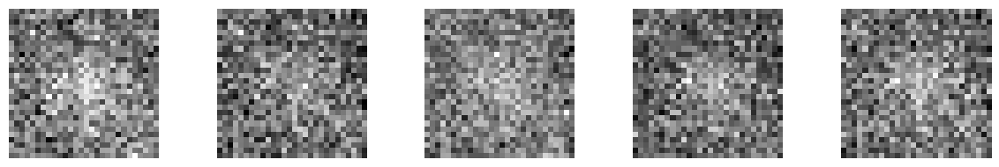

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 27ms/step


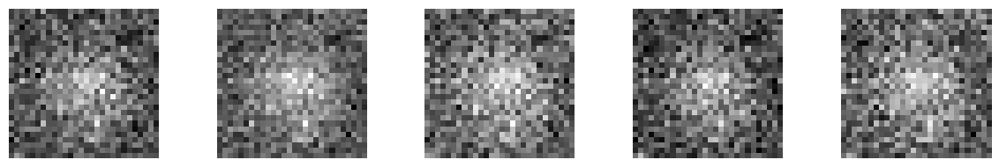

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 18ms/step


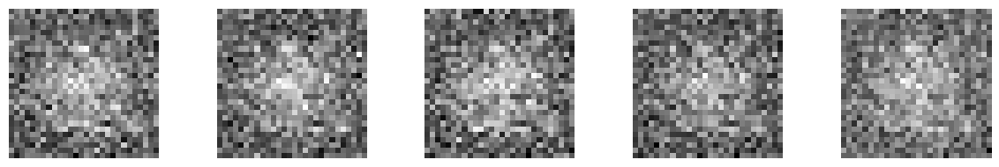

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 19ms/step


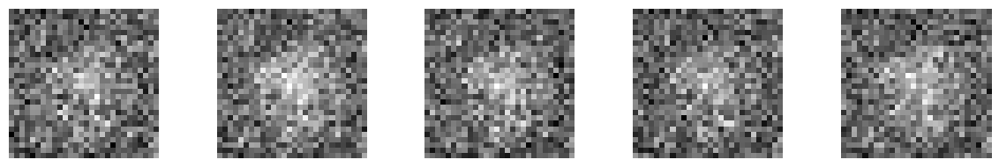

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 17ms/step


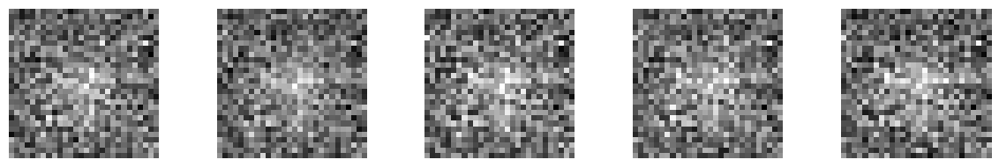

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 17ms/step


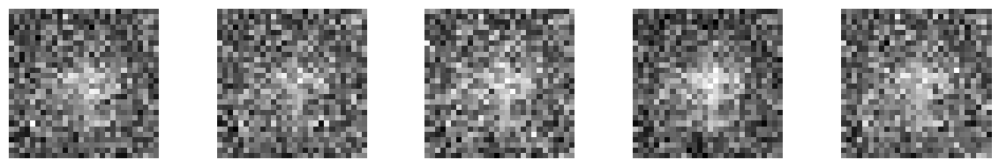

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 16ms/step


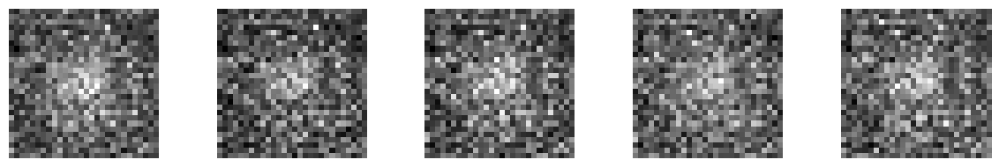

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 29ms/step


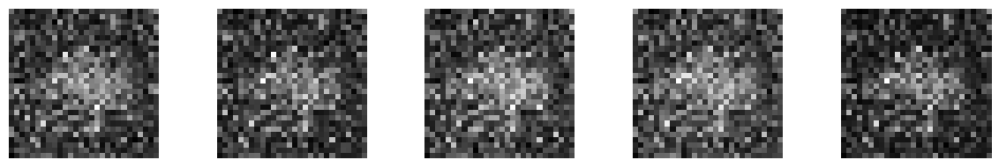

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 18ms/step


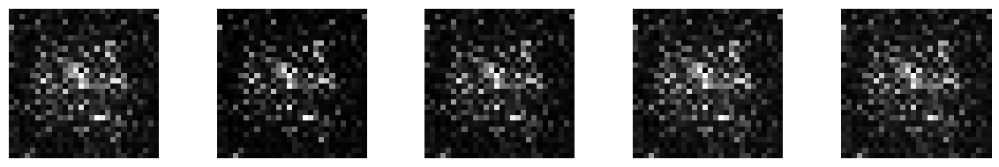

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 17ms/step


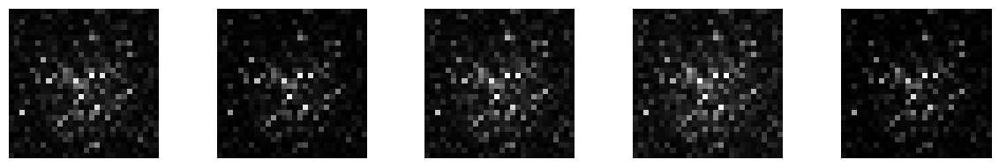

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 16ms/step


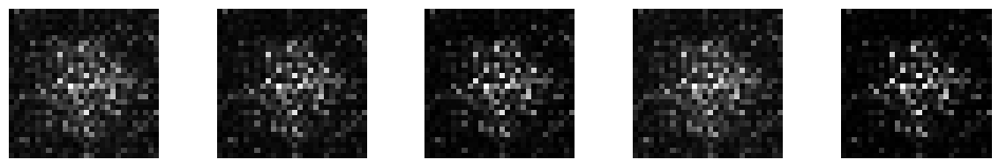

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 17ms/step


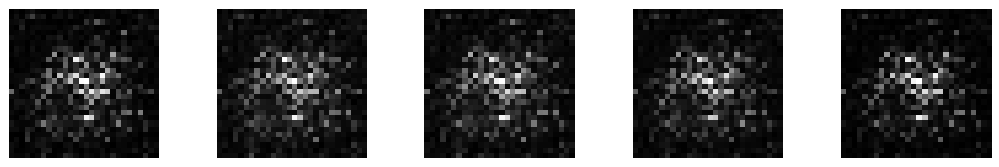

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 18ms/step


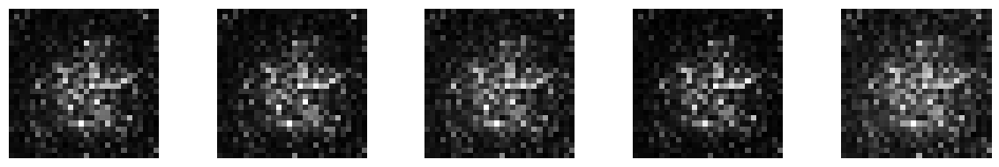

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 26ms/step


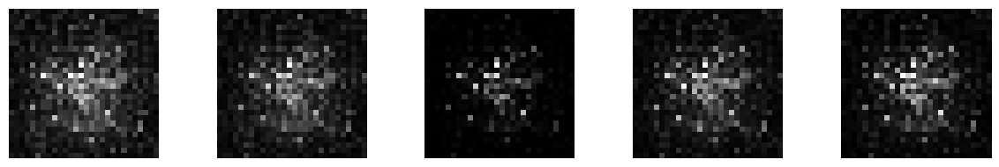

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 17ms/step


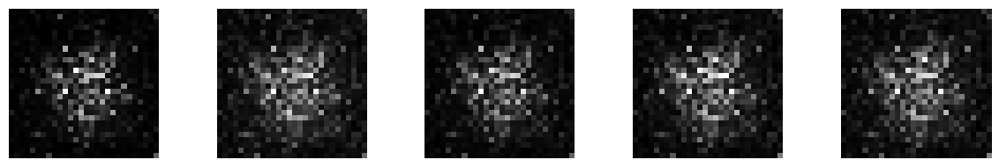

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 16ms/step


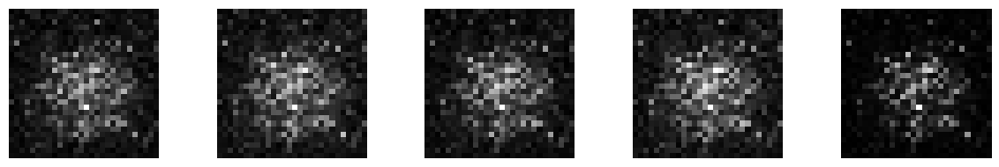

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 16ms/step


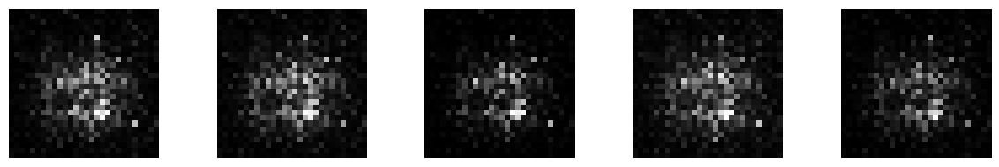

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 17ms/step


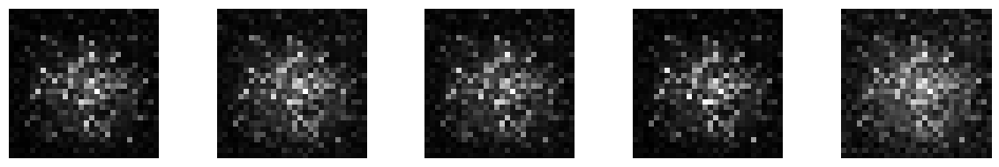

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 27ms/step


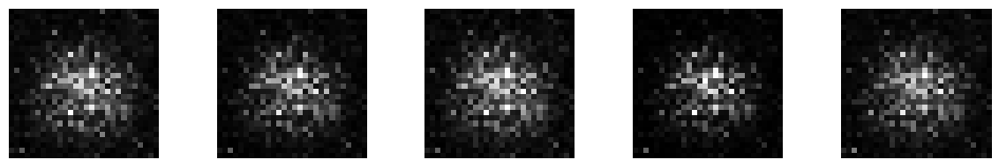

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 16ms/step


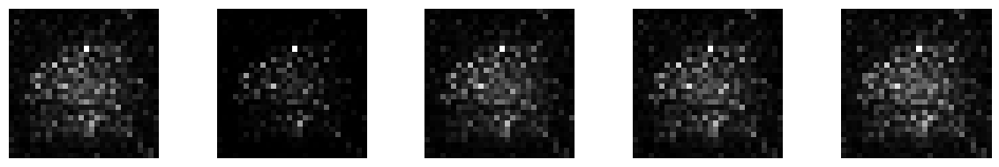

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 20ms/step


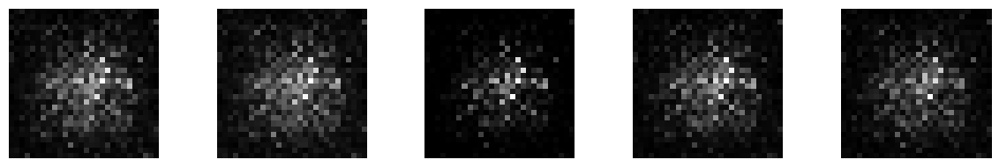

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 20ms/step


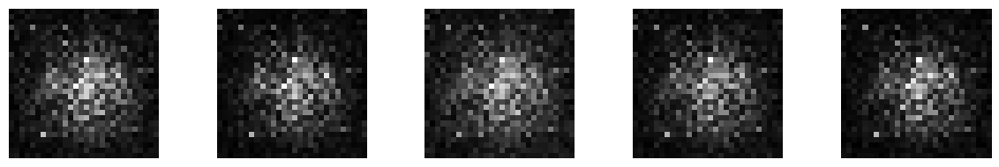

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 19ms/step


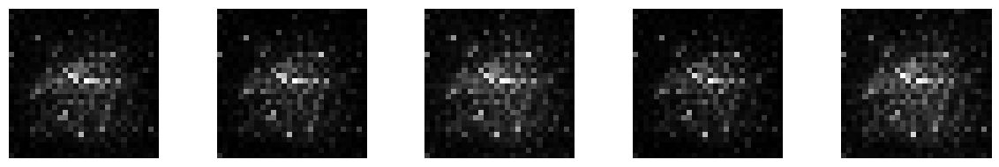

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 23ms/step


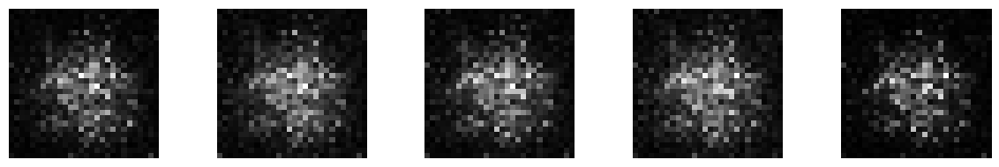

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 29ms/step


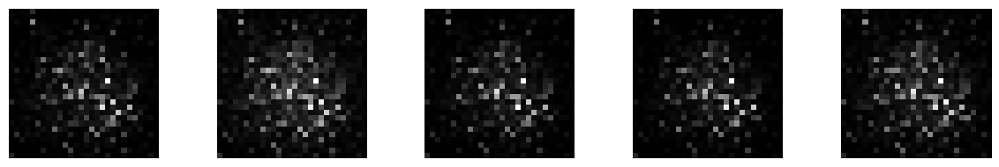

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 17ms/step


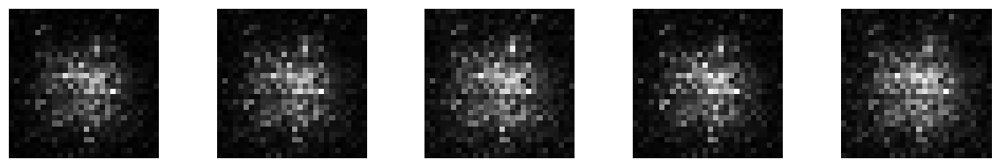

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 19ms/step


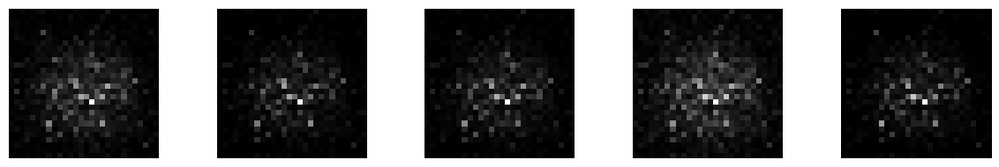

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 17ms/step


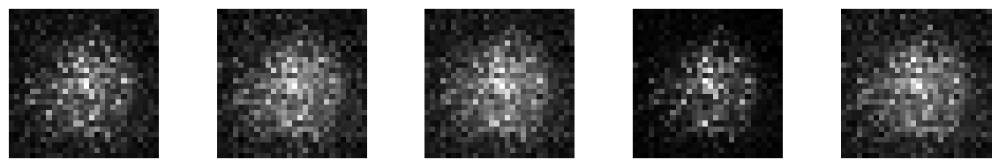

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 16ms/step


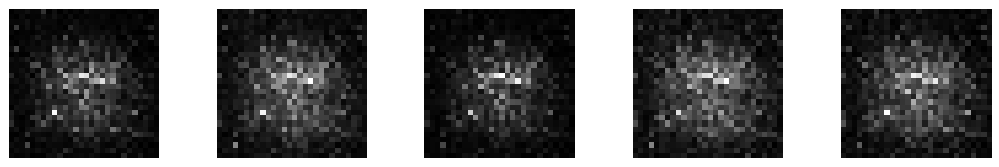

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 21ms/step


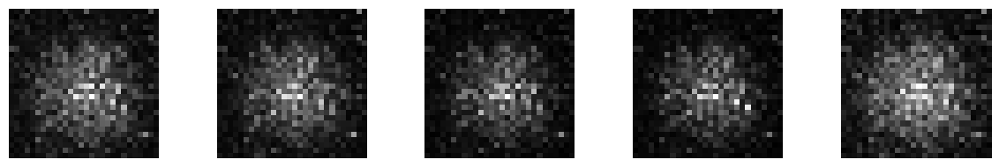

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 23ms/step


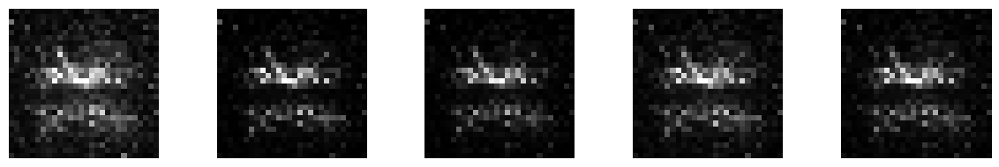

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 17ms/step


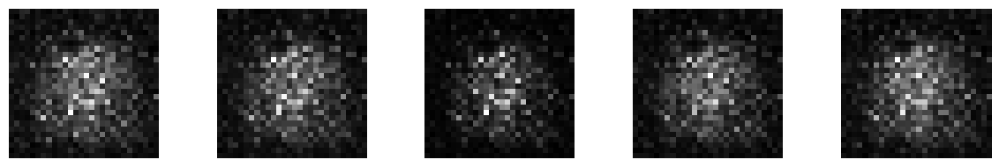

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 17ms/step


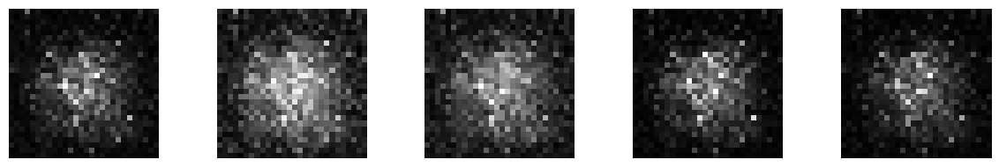

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 21ms/step


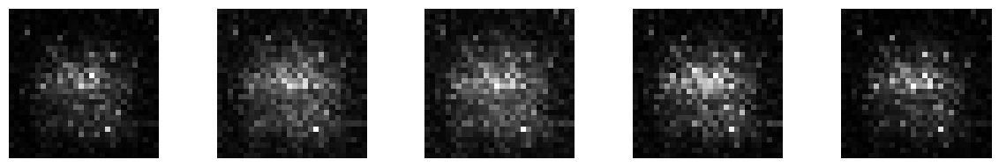

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 19ms/step


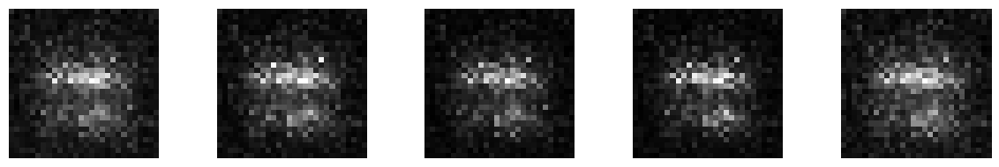

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 18ms/step


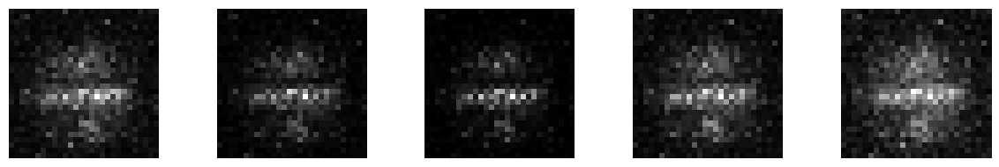

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 30ms/step


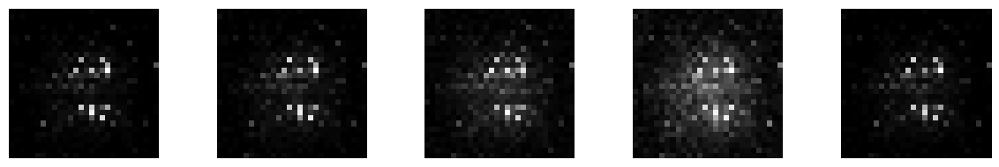

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 17ms/step


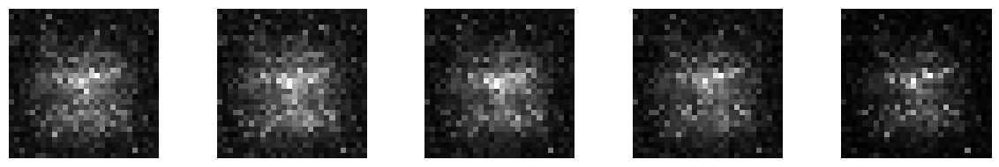

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 18ms/step


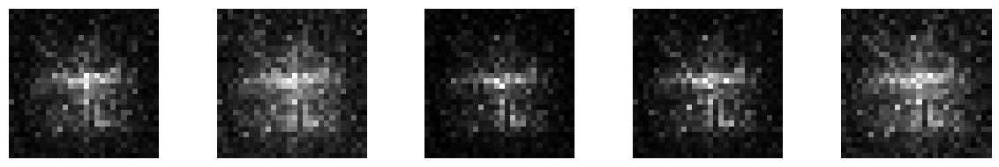

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 18ms/step


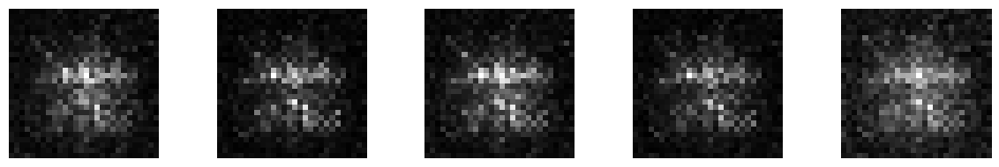

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 18ms/step


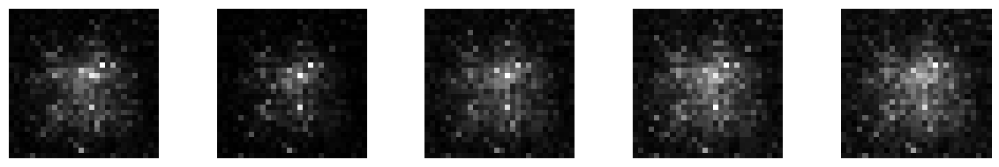

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 18ms/step


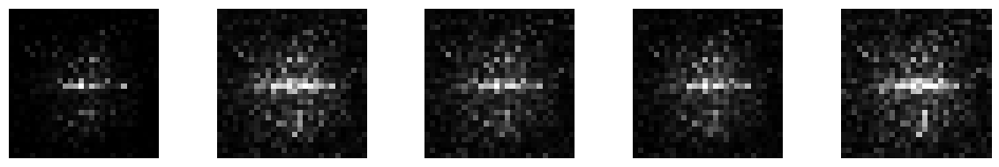

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 27ms/step


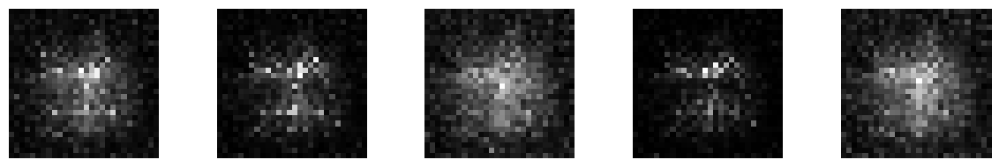

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 19ms/step


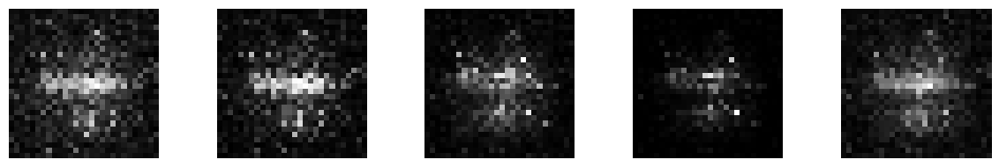

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 17ms/step


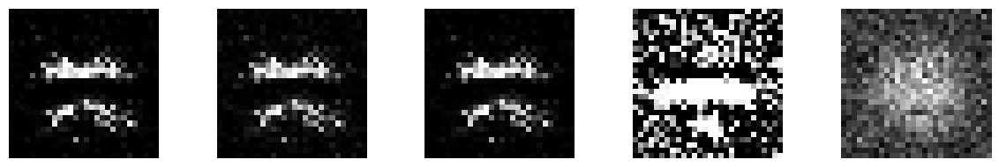

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 19ms/step


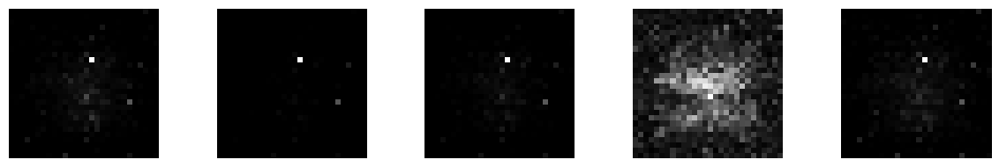

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 20ms/step


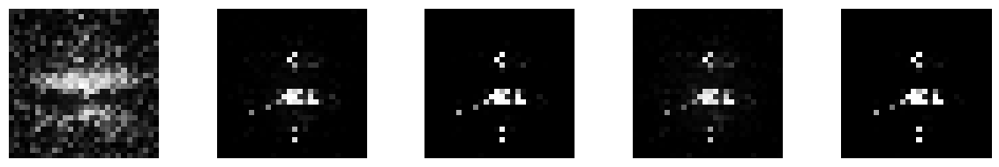

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 25ms/step


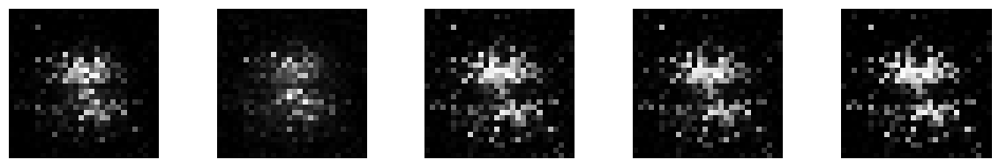

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 19ms/step


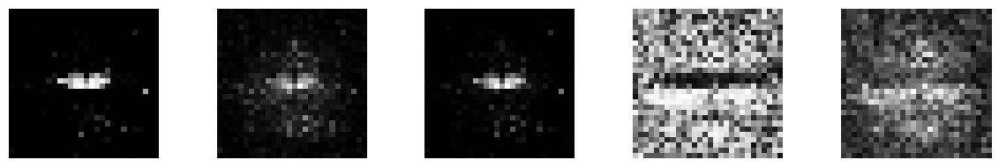

--------------- Epoch 51 ---------------
1/1 [==============================] - 0s 18ms/step


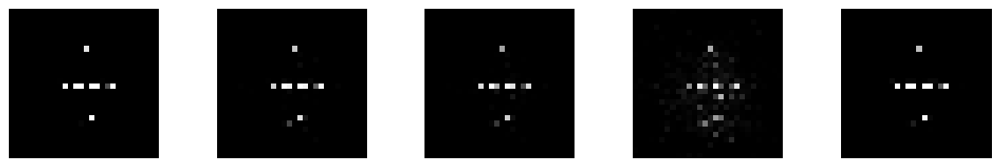

--------------- Epoch 52 ---------------
1/1 [==============================] - 0s 17ms/step


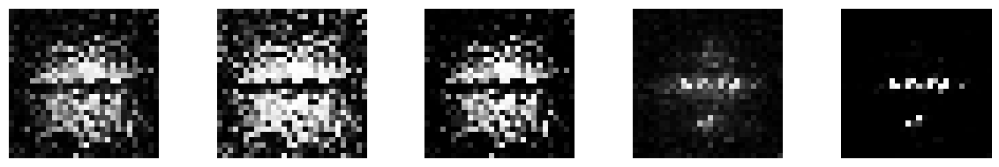

--------------- Epoch 53 ---------------
1/1 [==============================] - 0s 17ms/step


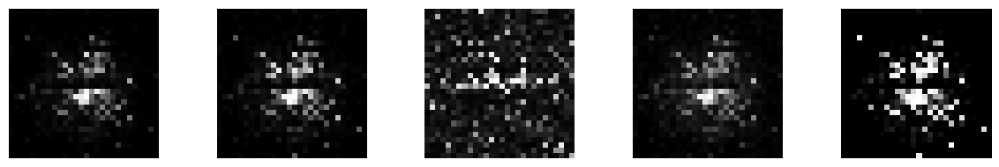

--------------- Epoch 54 ---------------
1/1 [==============================] - 0s 17ms/step


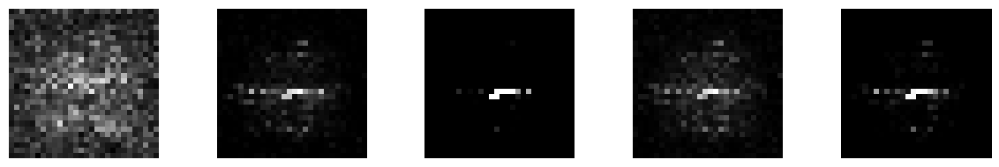

--------------- Epoch 55 ---------------
1/1 [==============================] - 0s 24ms/step


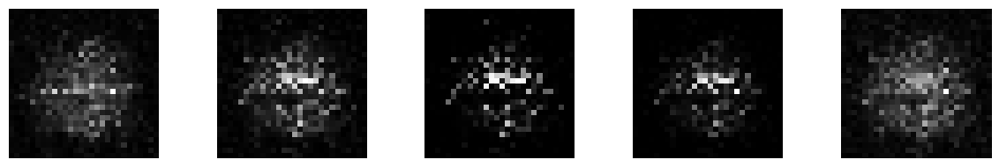

--------------- Epoch 56 ---------------
1/1 [==============================] - 0s 17ms/step


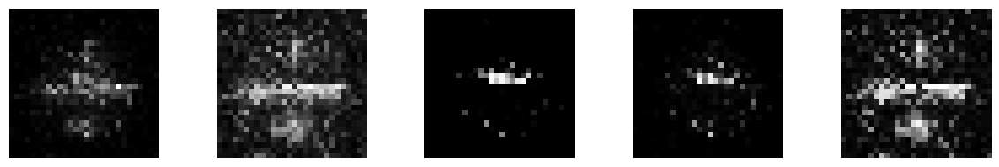

--------------- Epoch 57 ---------------
1/1 [==============================] - 0s 26ms/step


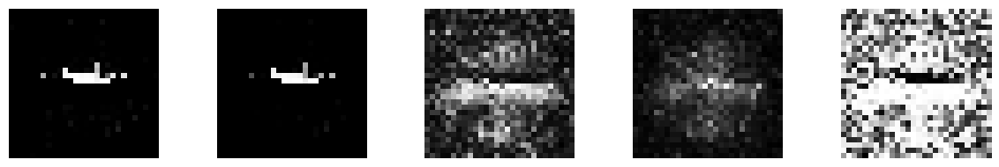

--------------- Epoch 58 ---------------
1/1 [==============================] - 0s 18ms/step


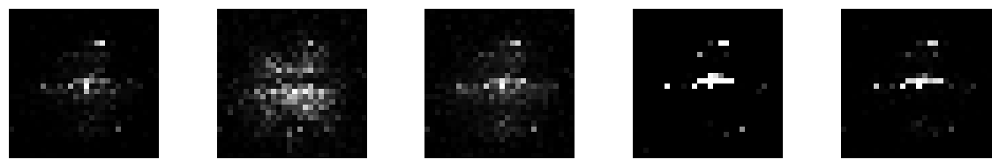

--------------- Epoch 59 ---------------
1/1 [==============================] - 0s 17ms/step


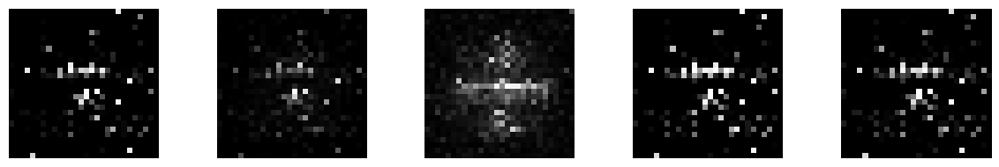

--------------- Epoch 60 ---------------
1/1 [==============================] - 0s 28ms/step


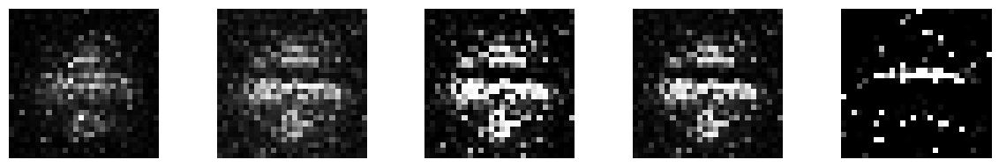

--------------- Epoch 61 ---------------
1/1 [==============================] - 0s 19ms/step


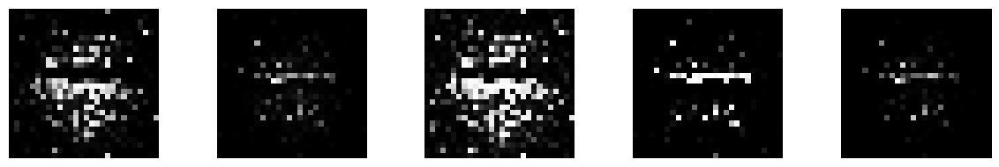

--------------- Epoch 62 ---------------
1/1 [==============================] - 0s 22ms/step


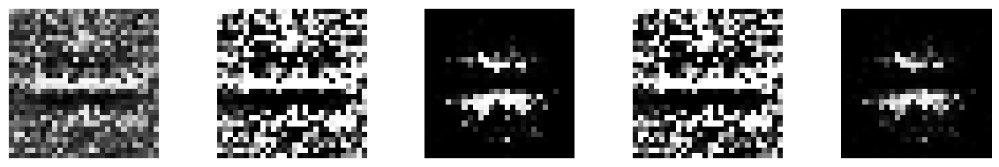

--------------- Epoch 63 ---------------
1/1 [==============================] - 0s 28ms/step


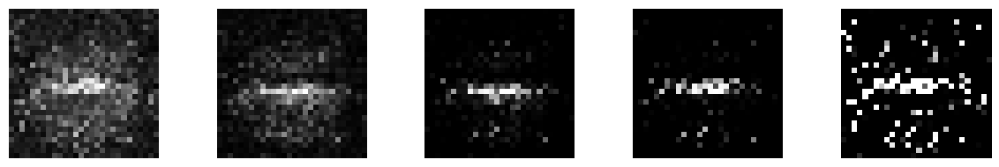

--------------- Epoch 64 ---------------
1/1 [==============================] - 0s 19ms/step


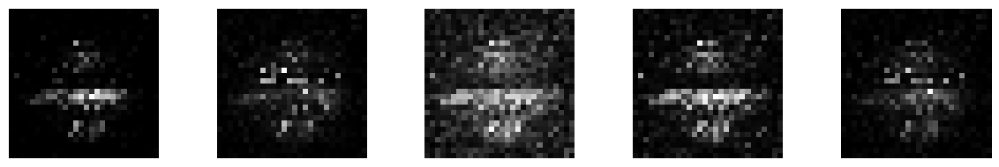

--------------- Epoch 65 ---------------
1/1 [==============================] - 0s 19ms/step


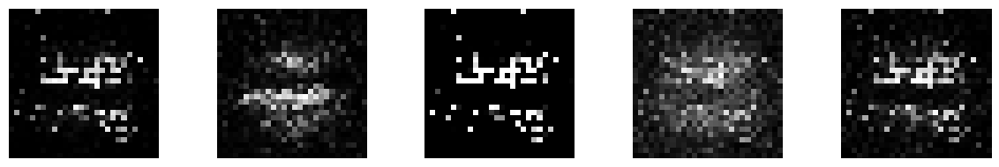

--------------- Epoch 66 ---------------
1/1 [==============================] - 0s 28ms/step


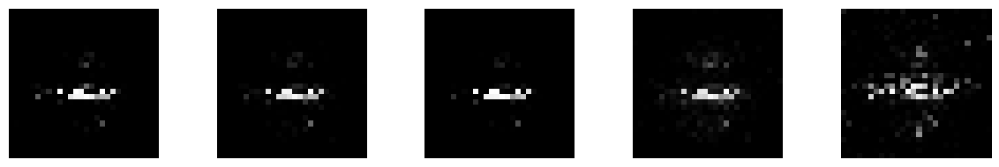

--------------- Epoch 67 ---------------
1/1 [==============================] - 0s 23ms/step


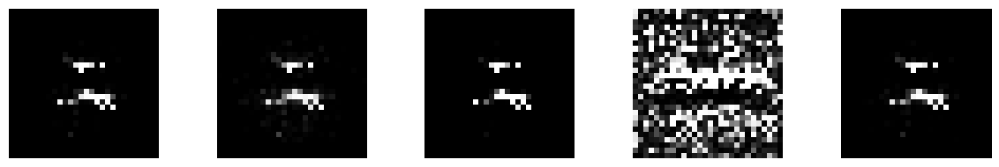

--------------- Epoch 68 ---------------
1/1 [==============================] - 0s 17ms/step


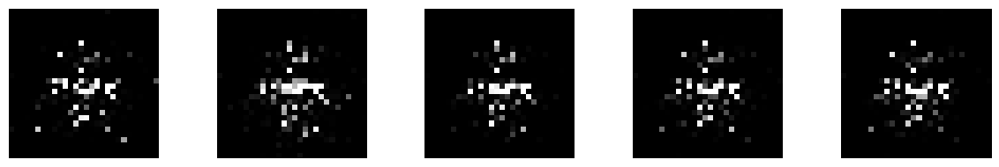

--------------- Epoch 69 ---------------
1/1 [==============================] - 0s 17ms/step


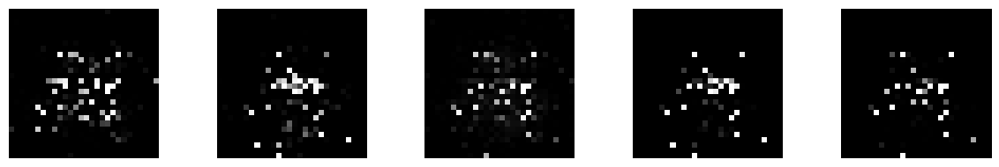

--------------- Epoch 70 ---------------
1/1 [==============================] - 0s 16ms/step


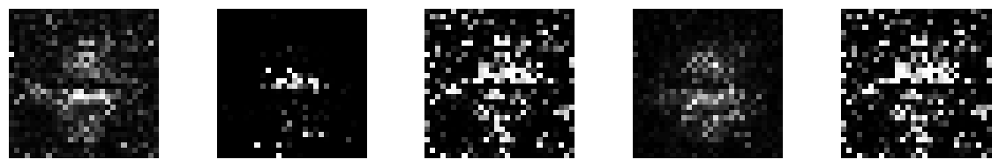

--------------- Epoch 71 ---------------
1/1 [==============================] - 0s 28ms/step


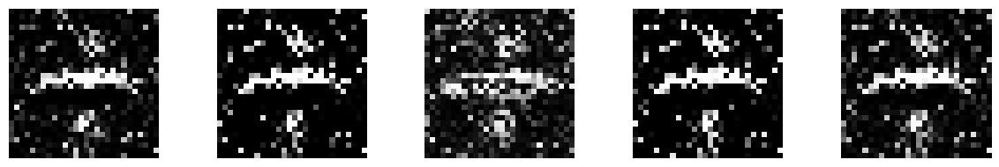

--------------- Epoch 72 ---------------
1/1 [==============================] - 0s 27ms/step


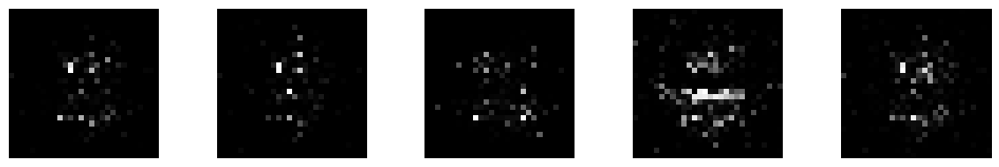

--------------- Epoch 73 ---------------
1/1 [==============================] - 0s 21ms/step


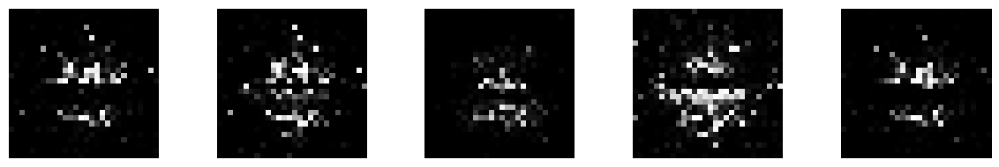

--------------- Epoch 74 ---------------
1/1 [==============================] - 0s 20ms/step


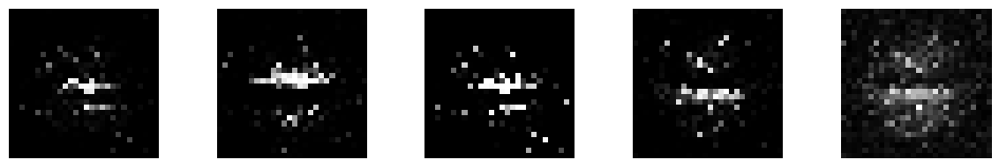

--------------- Epoch 75 ---------------
1/1 [==============================] - 0s 21ms/step


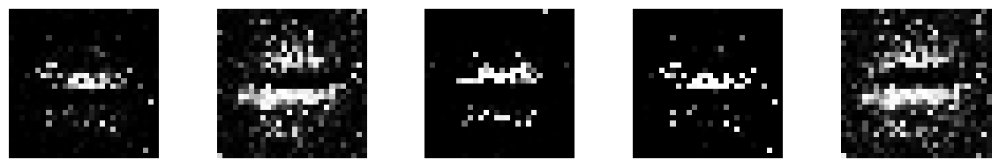

--------------- Epoch 76 ---------------
1/1 [==============================] - 0s 17ms/step


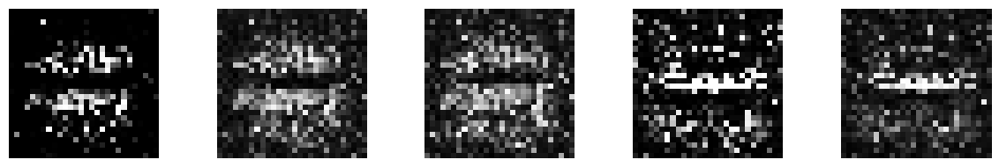

--------------- Epoch 77 ---------------
1/1 [==============================] - 0s 25ms/step


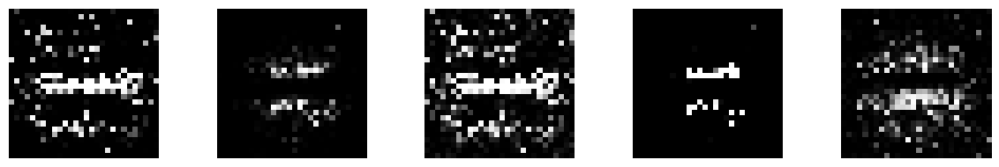

--------------- Epoch 78 ---------------
1/1 [==============================] - 0s 17ms/step


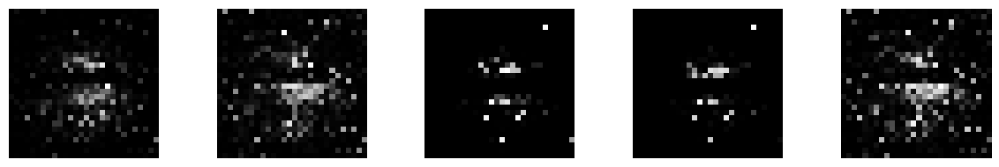

--------------- Epoch 79 ---------------
1/1 [==============================] - 0s 17ms/step


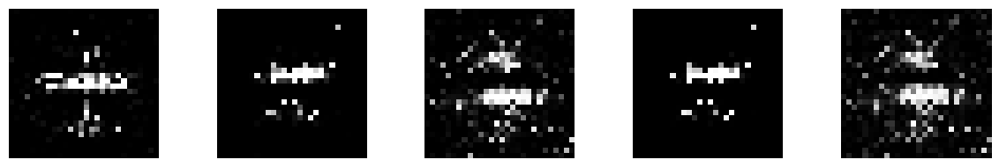

--------------- Epoch 80 ---------------
1/1 [==============================] - 0s 17ms/step


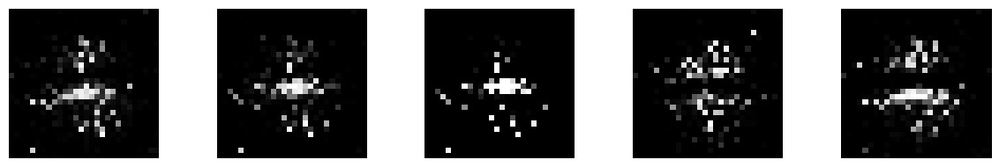

--------------- Epoch 81 ---------------
1/1 [==============================] - 0s 18ms/step


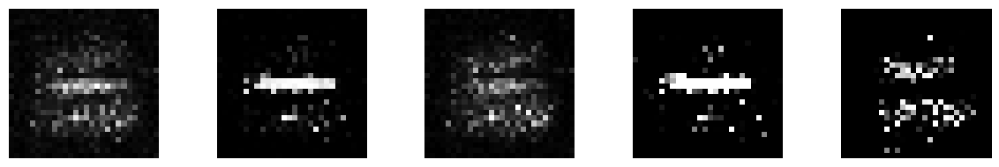

--------------- Epoch 82 ---------------
1/1 [==============================] - 0s 18ms/step


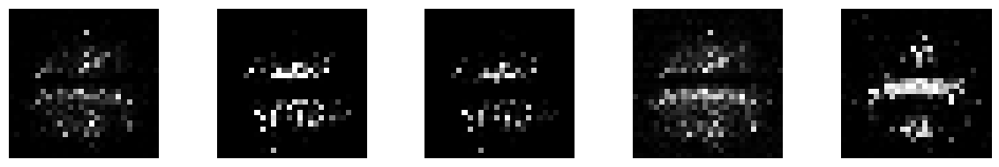

--------------- Epoch 83 ---------------
1/1 [==============================] - 0s 31ms/step


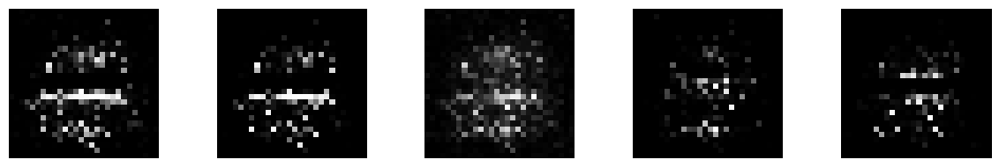

--------------- Epoch 84 ---------------
1/1 [==============================] - 0s 16ms/step


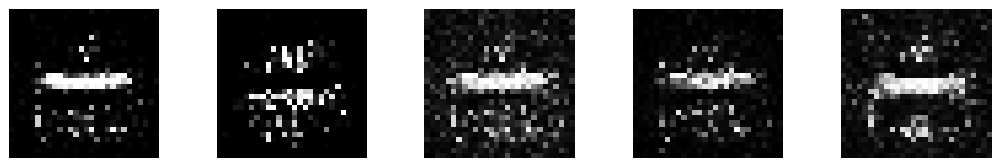

--------------- Epoch 85 ---------------
1/1 [==============================] - 0s 18ms/step


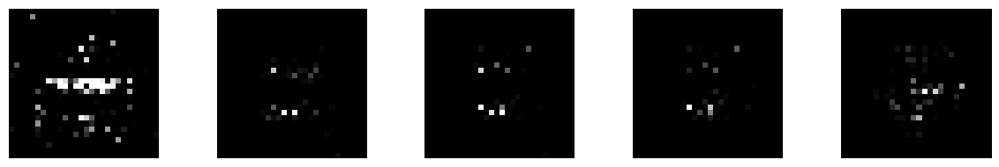

--------------- Epoch 86 ---------------
1/1 [==============================] - 0s 20ms/step


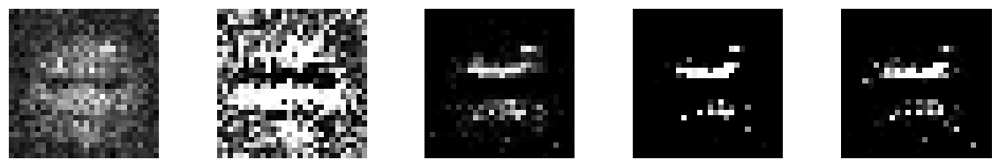

--------------- Epoch 87 ---------------
1/1 [==============================] - 0s 18ms/step


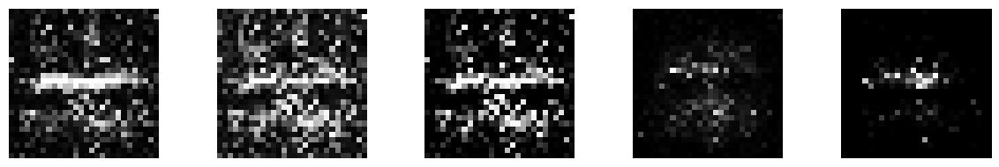

--------------- Epoch 88 ---------------
1/1 [==============================] - 0s 28ms/step


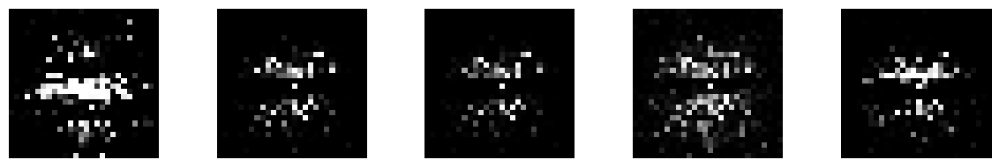

--------------- Epoch 89 ---------------
1/1 [==============================] - 0s 27ms/step


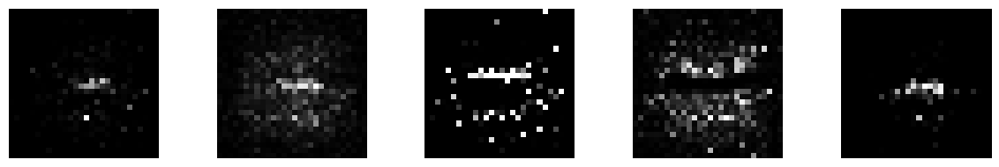

--------------- Epoch 90 ---------------
1/1 [==============================] - 0s 19ms/step


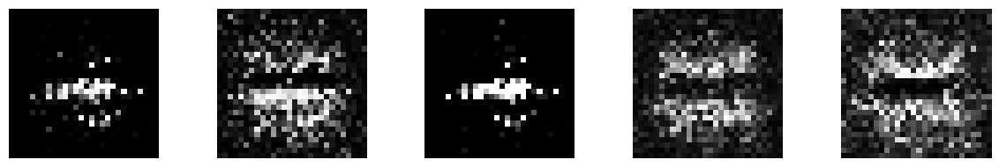

--------------- Epoch 91 ---------------
1/1 [==============================] - 0s 19ms/step


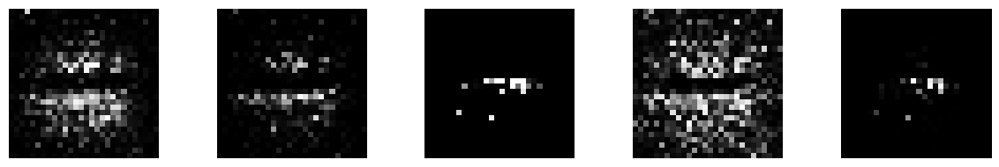

--------------- Epoch 92 ---------------
1/1 [==============================] - 0s 18ms/step


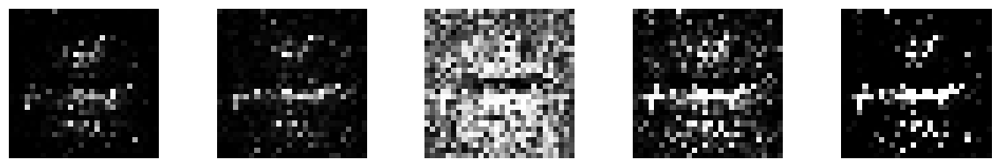

--------------- Epoch 93 ---------------
1/1 [==============================] - 0s 17ms/step


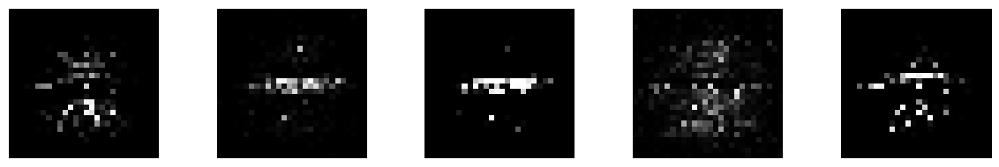

--------------- Epoch 94 ---------------
1/1 [==============================] - 0s 25ms/step


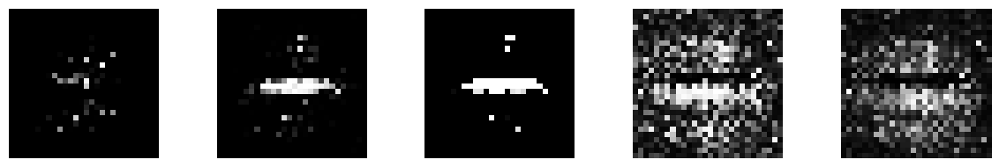

--------------- Epoch 95 ---------------
1/1 [==============================] - 0s 18ms/step


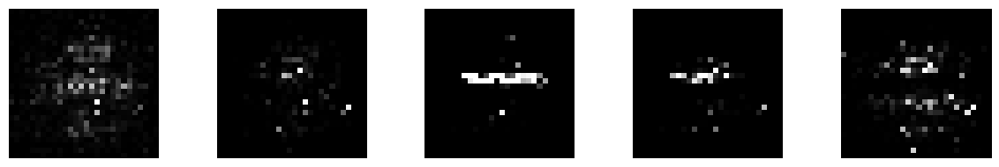

--------------- Epoch 96 ---------------
1/1 [==============================] - 0s 22ms/step


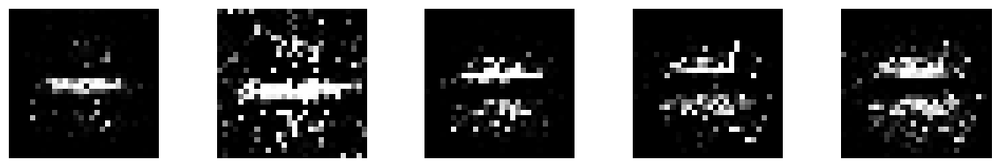

--------------- Epoch 97 ---------------
1/1 [==============================] - 0s 17ms/step


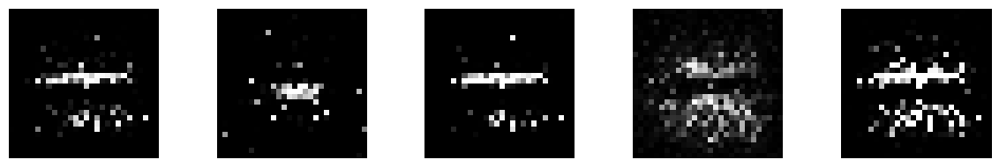

--------------- Epoch 98 ---------------
1/1 [==============================] - 0s 19ms/step


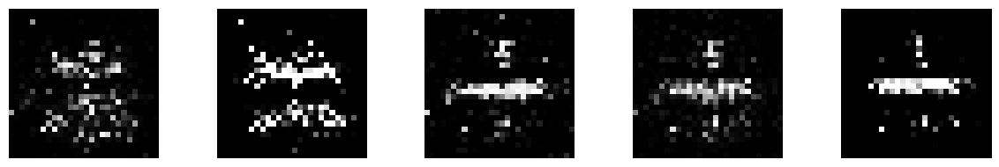

--------------- Epoch 99 ---------------
1/1 [==============================] - 0s 20ms/step


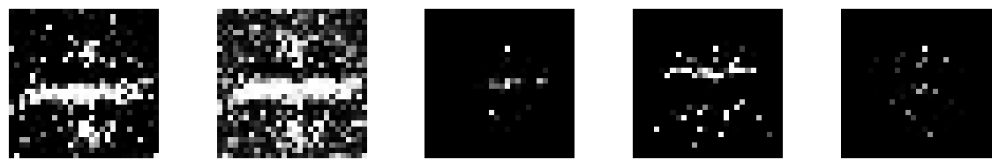

--------------- Epoch 100 ---------------
1/1 [==============================] - 0s 21ms/step


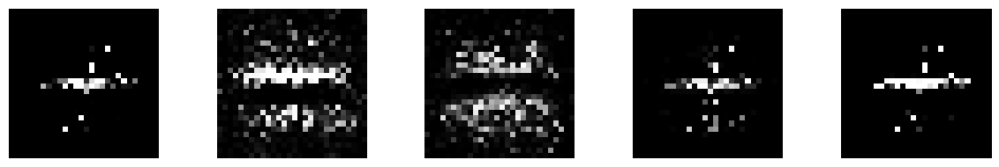

--------------- Epoch 101 ---------------
1/1 [==============================] - 0s 19ms/step


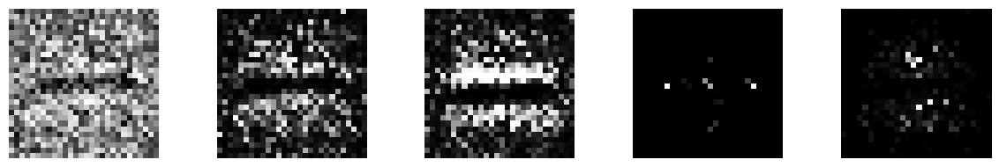

--------------- Epoch 102 ---------------
1/1 [==============================] - 0s 18ms/step


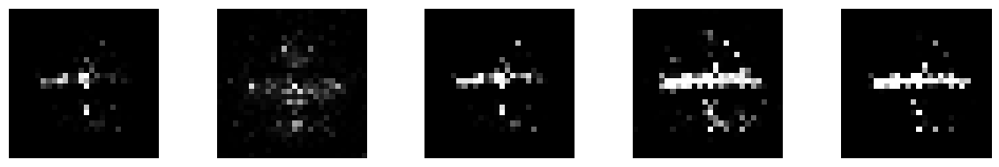

--------------- Epoch 103 ---------------
1/1 [==============================] - 0s 18ms/step


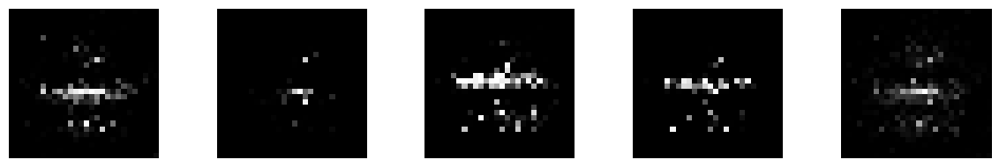

--------------- Epoch 104 ---------------
1/1 [==============================] - 0s 17ms/step


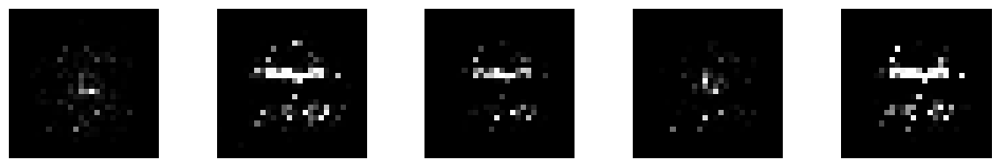

--------------- Epoch 105 ---------------
1/1 [==============================] - 0s 29ms/step


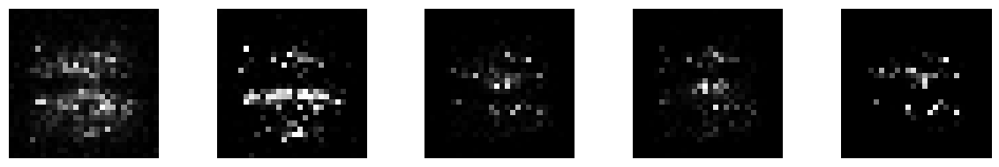

--------------- Epoch 106 ---------------
1/1 [==============================] - 0s 17ms/step


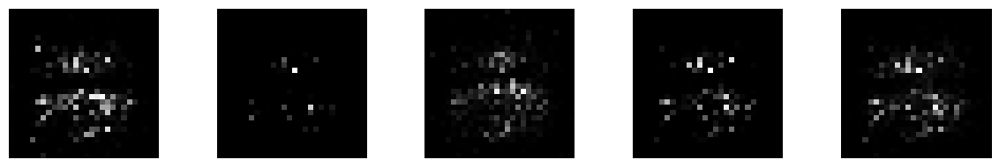

--------------- Epoch 107 ---------------
1/1 [==============================] - 0s 17ms/step


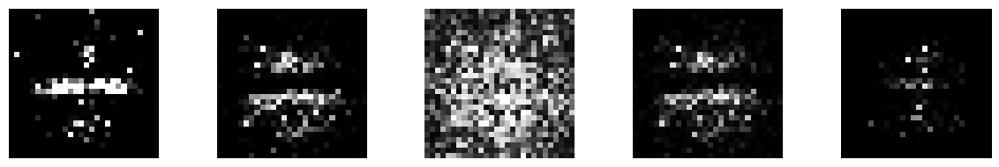

--------------- Epoch 108 ---------------
1/1 [==============================] - 0s 18ms/step


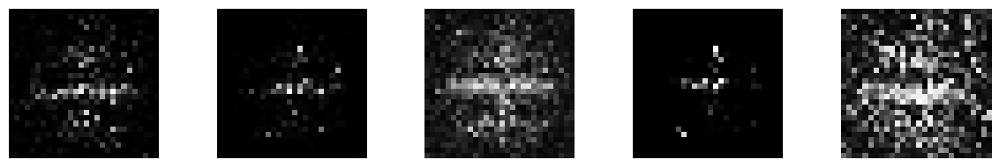

--------------- Epoch 109 ---------------
1/1 [==============================] - 0s 17ms/step


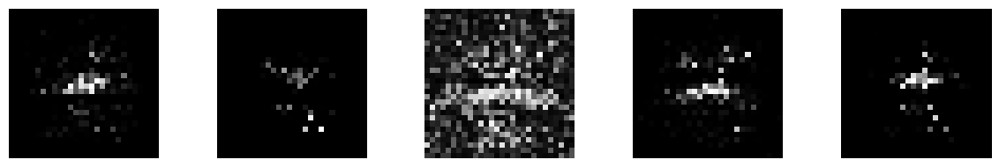

--------------- Epoch 110 ---------------
1/1 [==============================] - 0s 18ms/step


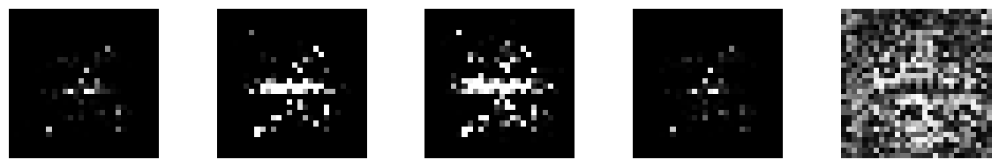

--------------- Epoch 111 ---------------
1/1 [==============================] - 0s 31ms/step


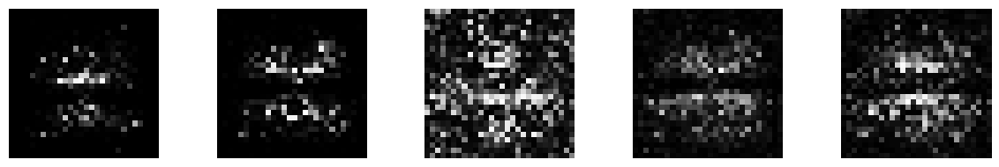

--------------- Epoch 112 ---------------
1/1 [==============================] - 0s 19ms/step


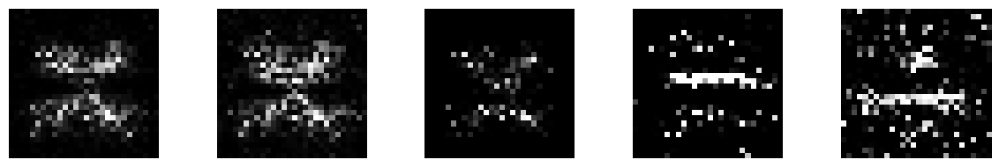

--------------- Epoch 113 ---------------
1/1 [==============================] - 0s 18ms/step


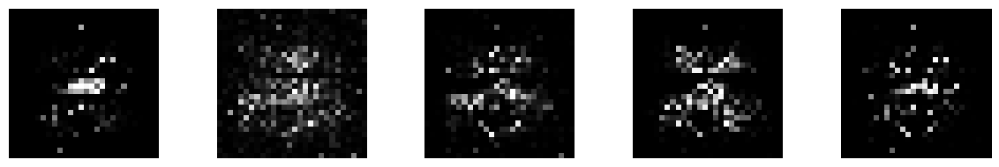

--------------- Epoch 114 ---------------
1/1 [==============================] - 0s 18ms/step


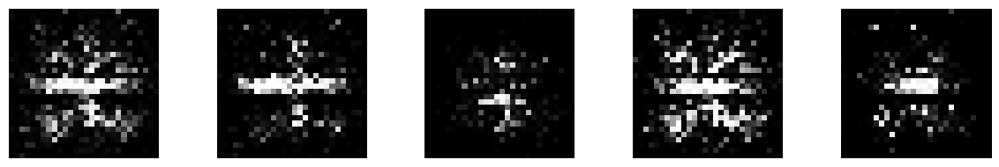

--------------- Epoch 115 ---------------
1/1 [==============================] - 0s 18ms/step


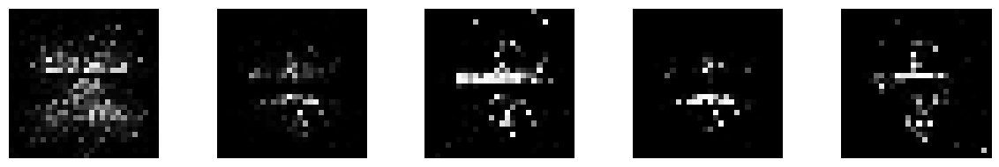

--------------- Epoch 116 ---------------
1/1 [==============================] - 0s 24ms/step


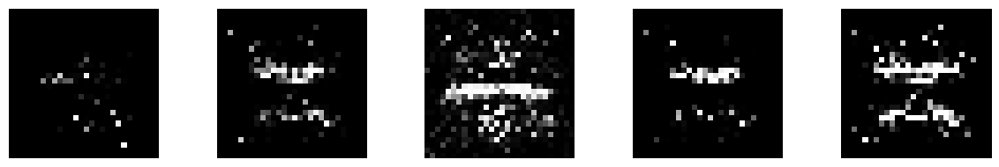

--------------- Epoch 117 ---------------
1/1 [==============================] - 0s 17ms/step


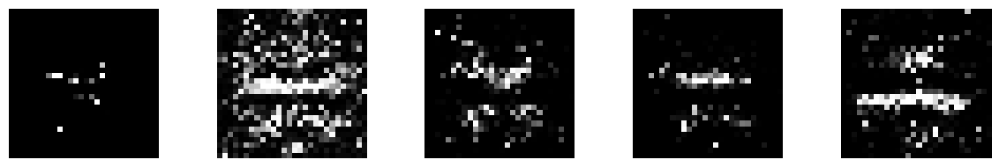

--------------- Epoch 118 ---------------
1/1 [==============================] - 0s 17ms/step


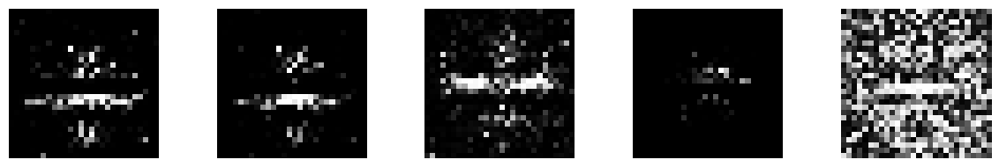

--------------- Epoch 119 ---------------
1/1 [==============================] - 0s 17ms/step


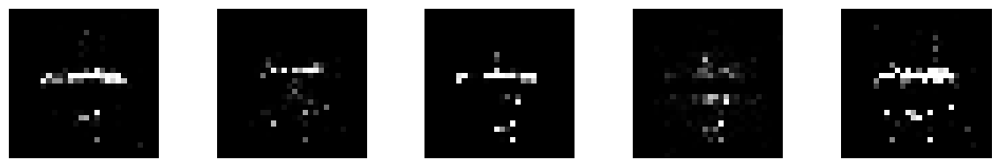

--------------- Epoch 120 ---------------
1/1 [==============================] - 0s 18ms/step


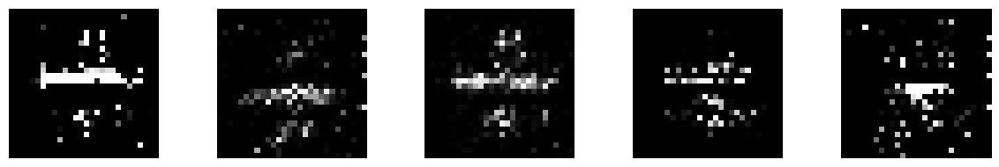

--------------- Epoch 121 ---------------
1/1 [==============================] - 0s 18ms/step


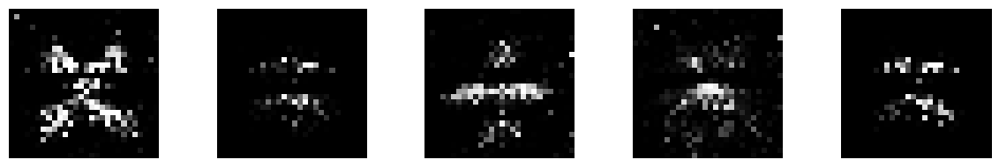

--------------- Epoch 122 ---------------
1/1 [==============================] - 0s 27ms/step


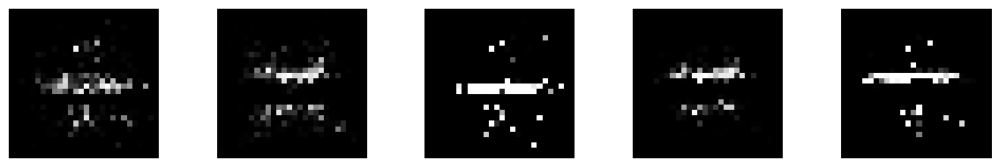

--------------- Epoch 123 ---------------
1/1 [==============================] - 0s 20ms/step


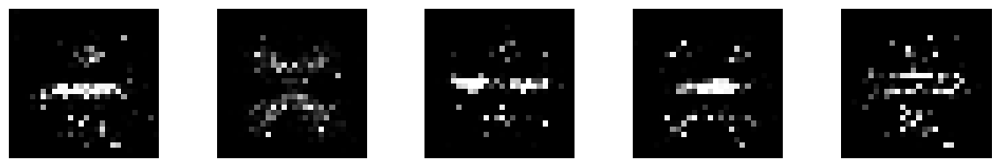

--------------- Epoch 124 ---------------
1/1 [==============================] - 0s 21ms/step


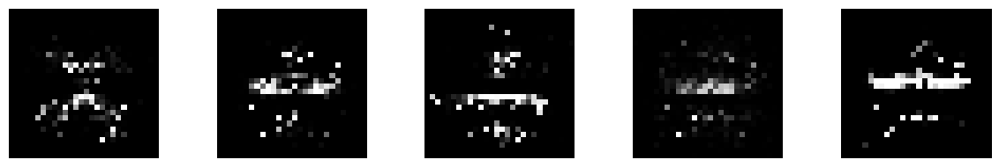

--------------- Epoch 125 ---------------
1/1 [==============================] - 0s 19ms/step


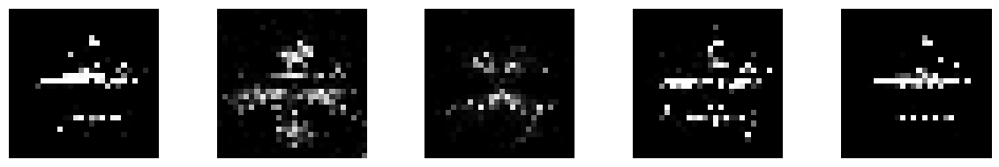

--------------- Epoch 126 ---------------
1/1 [==============================] - 0s 19ms/step


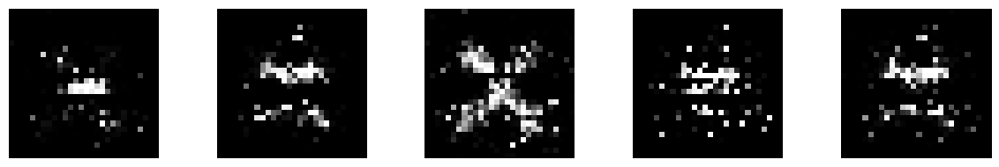

--------------- Epoch 127 ---------------
1/1 [==============================] - 0s 37ms/step


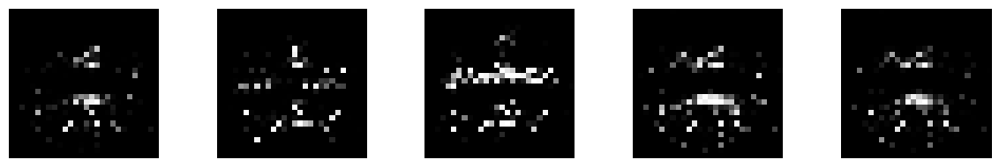

--------------- Epoch 128 ---------------
1/1 [==============================] - 0s 40ms/step


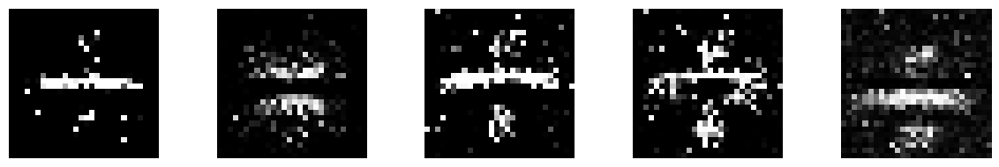

--------------- Epoch 129 ---------------
1/1 [==============================] - 0s 18ms/step


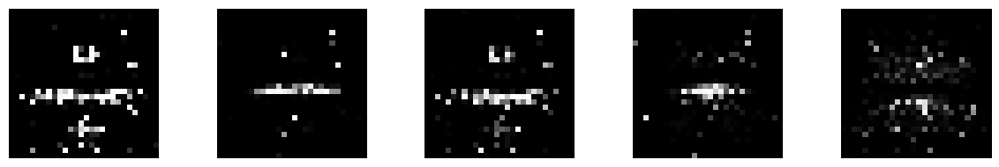

--------------- Epoch 130 ---------------
1/1 [==============================] - 0s 17ms/step


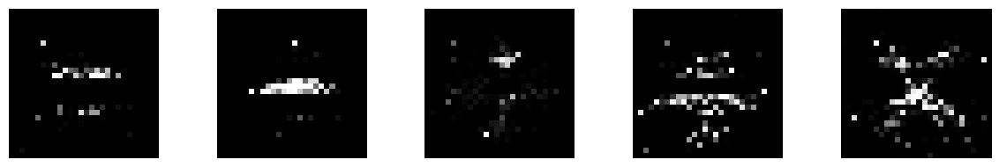

--------------- Epoch 131 ---------------
1/1 [==============================] - 0s 17ms/step


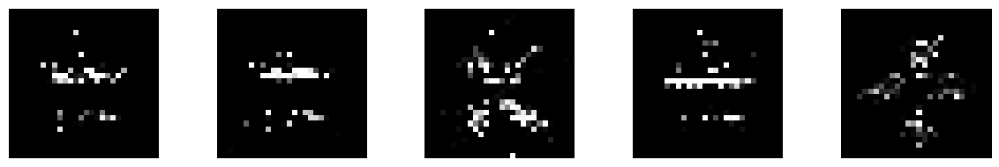

--------------- Epoch 132 ---------------
1/1 [==============================] - 0s 17ms/step


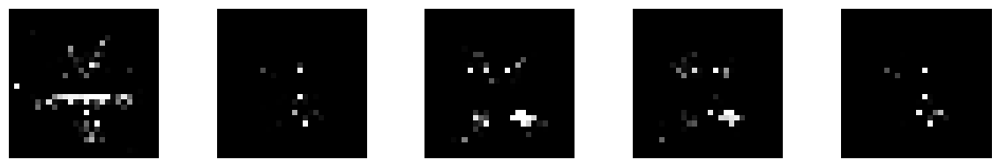

--------------- Epoch 133 ---------------
1/1 [==============================] - 0s 30ms/step


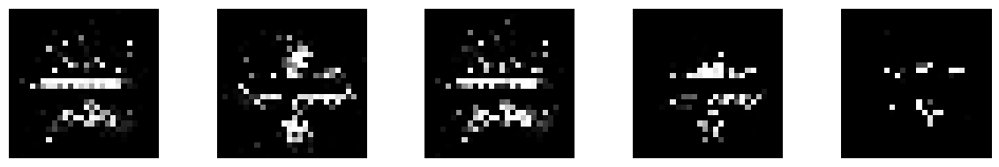

--------------- Epoch 134 ---------------
1/1 [==============================] - 0s 17ms/step


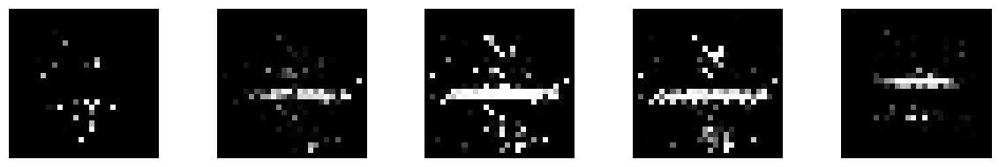

--------------- Epoch 135 ---------------
1/1 [==============================] - 0s 16ms/step


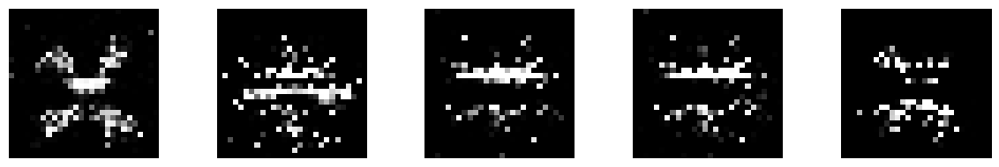

--------------- Epoch 136 ---------------
1/1 [==============================] - 0s 20ms/step


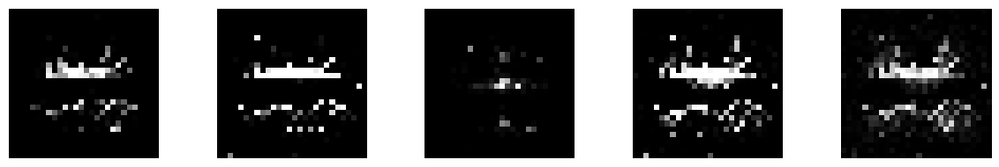

--------------- Epoch 137 ---------------
1/1 [==============================] - 0s 21ms/step


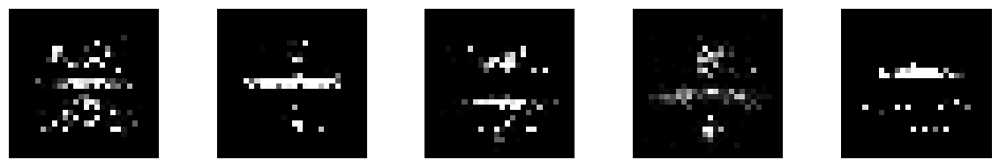

--------------- Epoch 138 ---------------
1/1 [==============================] - 0s 33ms/step


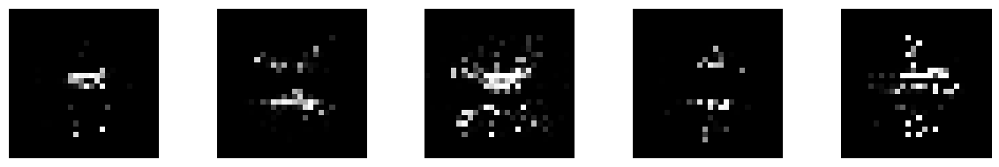

--------------- Epoch 139 ---------------
1/1 [==============================] - 0s 40ms/step


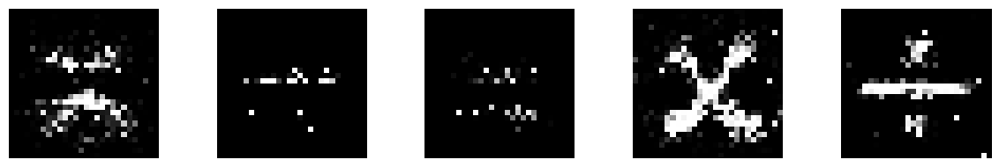

--------------- Epoch 140 ---------------
1/1 [==============================] - 0s 20ms/step


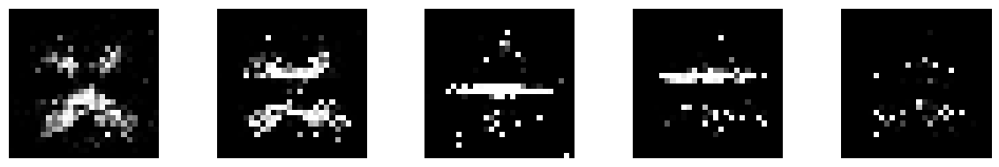

--------------- Epoch 141 ---------------
1/1 [==============================] - 0s 17ms/step


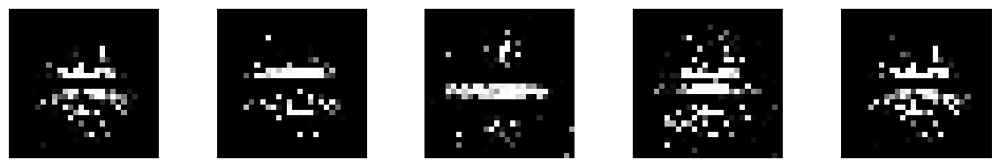

--------------- Epoch 142 ---------------
1/1 [==============================] - 0s 19ms/step


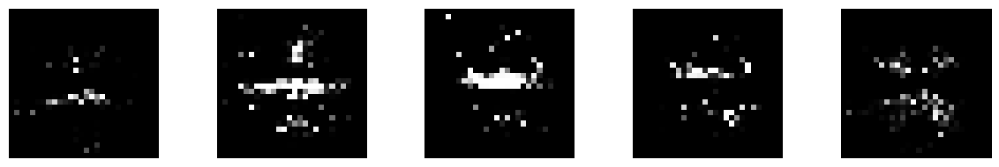

--------------- Epoch 143 ---------------
1/1 [==============================] - 0s 19ms/step


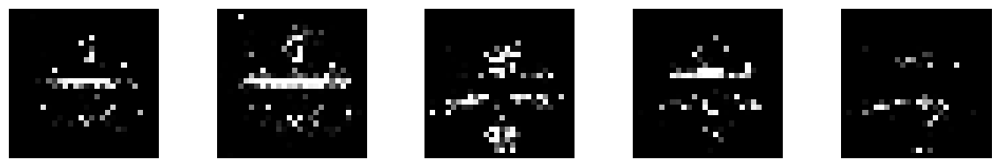

--------------- Epoch 144 ---------------
1/1 [==============================] - 0s 25ms/step


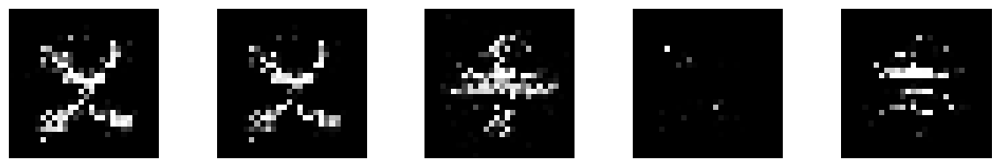

--------------- Epoch 145 ---------------
1/1 [==============================] - 0s 18ms/step


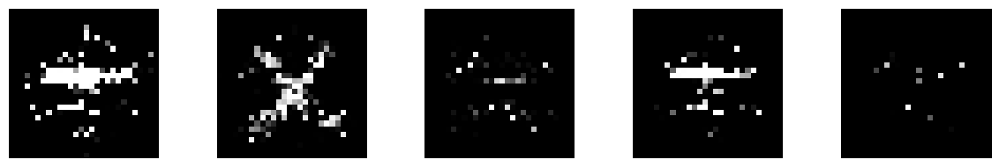

--------------- Epoch 146 ---------------
1/1 [==============================] - 0s 17ms/step


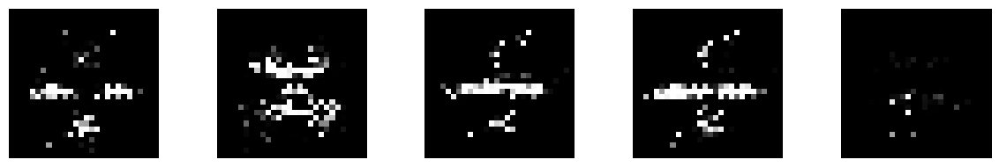

--------------- Epoch 147 ---------------
1/1 [==============================] - 0s 19ms/step


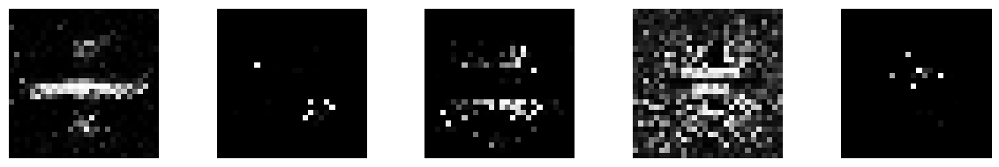

--------------- Epoch 148 ---------------
1/1 [==============================] - 0s 18ms/step


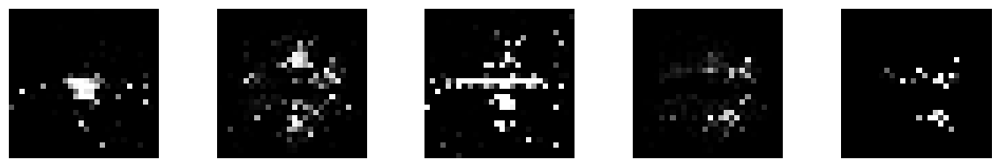

--------------- Epoch 149 ---------------
1/1 [==============================] - 0s 30ms/step


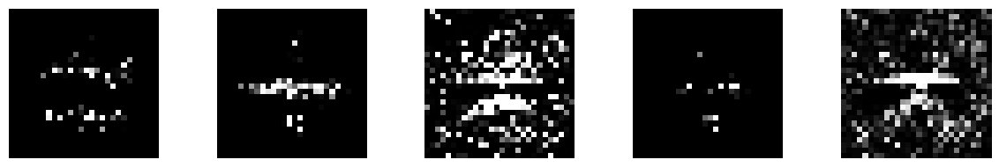

--------------- Epoch 150 ---------------
1/1 [==============================] - 0s 22ms/step


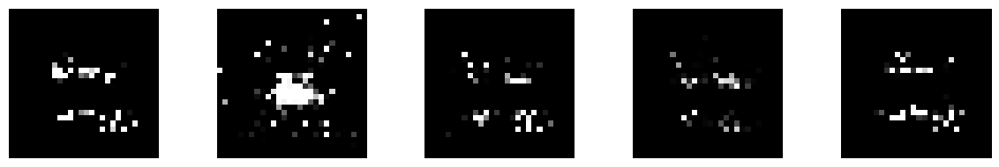

--------------- Epoch 151 ---------------
1/1 [==============================] - 0s 22ms/step


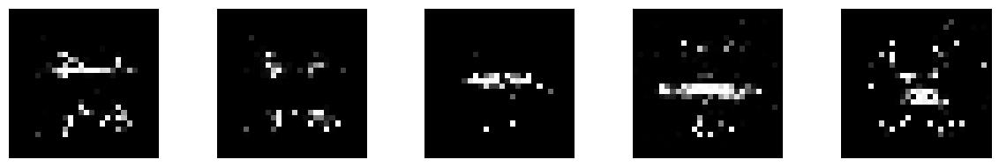

--------------- Epoch 152 ---------------
1/1 [==============================] - 0s 17ms/step


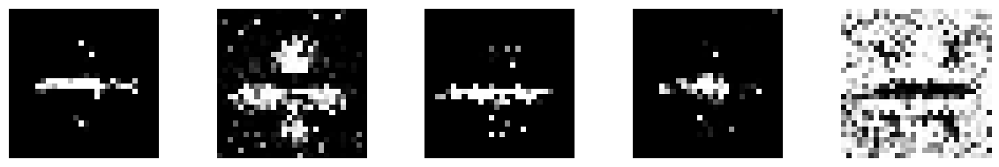

--------------- Epoch 153 ---------------
1/1 [==============================] - 0s 17ms/step


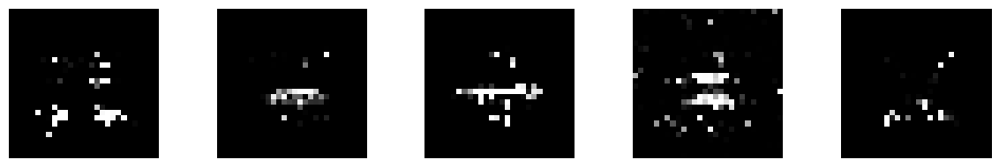

--------------- Epoch 154 ---------------
1/1 [==============================] - 0s 17ms/step


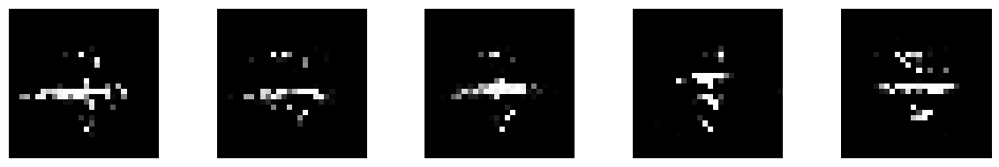

--------------- Epoch 155 ---------------
1/1 [==============================] - 0s 28ms/step


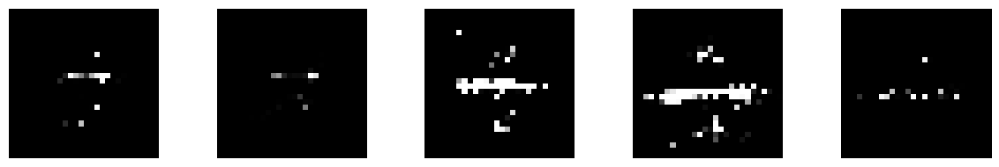

--------------- Epoch 156 ---------------
1/1 [==============================] - 0s 18ms/step


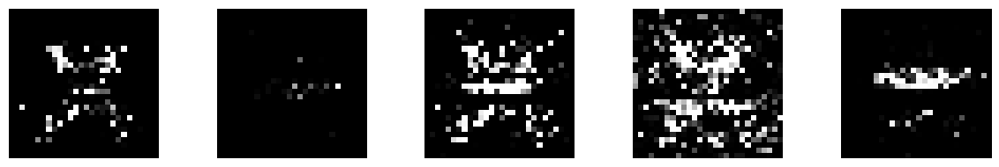

--------------- Epoch 157 ---------------
1/1 [==============================] - 0s 17ms/step


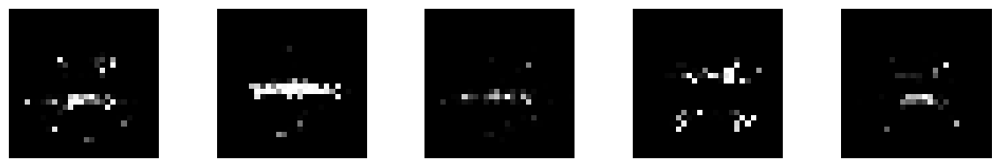

--------------- Epoch 158 ---------------
1/1 [==============================] - 0s 18ms/step


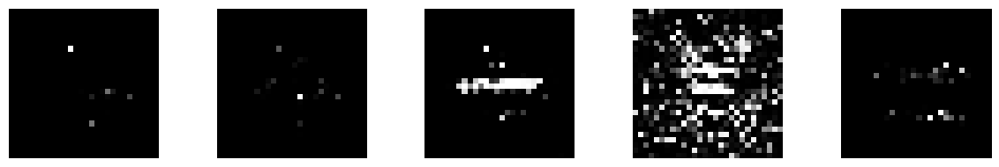

--------------- Epoch 159 ---------------
1/1 [==============================] - 0s 18ms/step


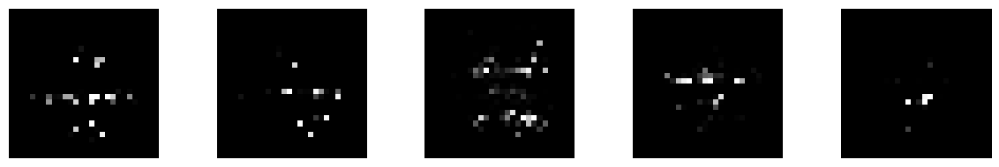

--------------- Epoch 160 ---------------
1/1 [==============================] - 0s 24ms/step


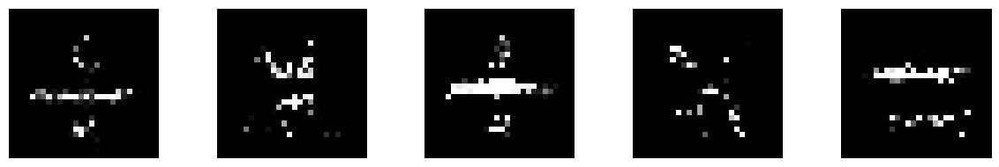

--------------- Epoch 161 ---------------
1/1 [==============================] - 0s 20ms/step


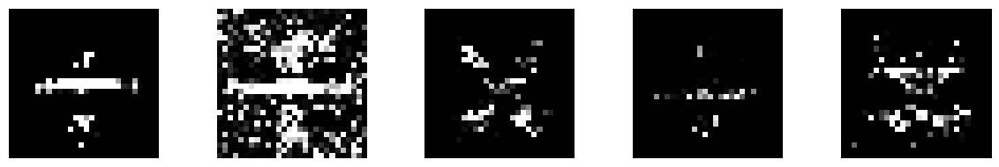

--------------- Epoch 162 ---------------
1/1 [==============================] - 0s 19ms/step


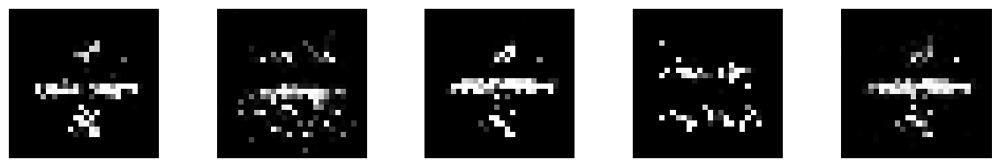

--------------- Epoch 163 ---------------
1/1 [==============================] - 0s 19ms/step


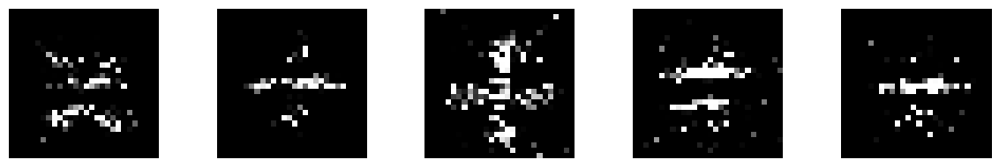

--------------- Epoch 164 ---------------
1/1 [==============================] - 0s 19ms/step


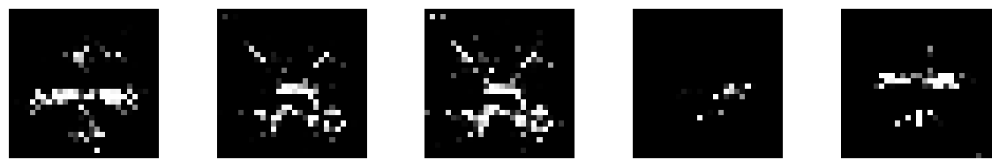

--------------- Epoch 165 ---------------
1/1 [==============================] - 0s 27ms/step


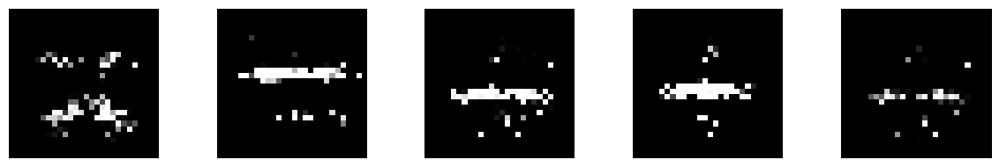

--------------- Epoch 166 ---------------
1/1 [==============================] - 0s 19ms/step


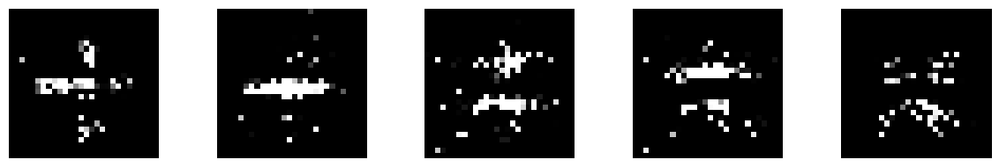

--------------- Epoch 167 ---------------
1/1 [==============================] - 0s 20ms/step


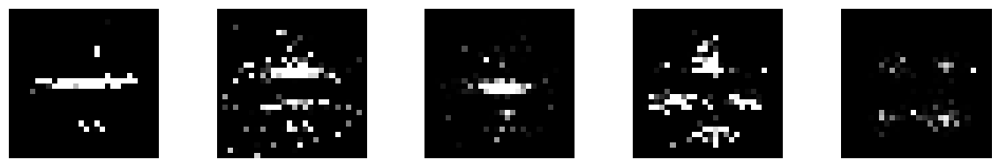

--------------- Epoch 168 ---------------
1/1 [==============================] - 0s 18ms/step


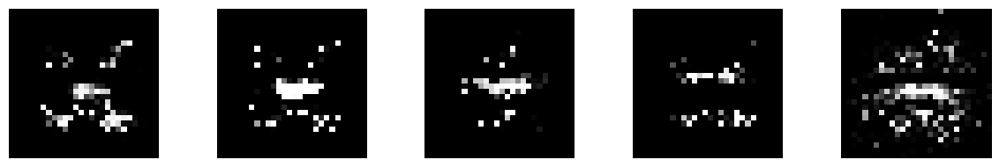

--------------- Epoch 169 ---------------
1/1 [==============================] - 0s 19ms/step


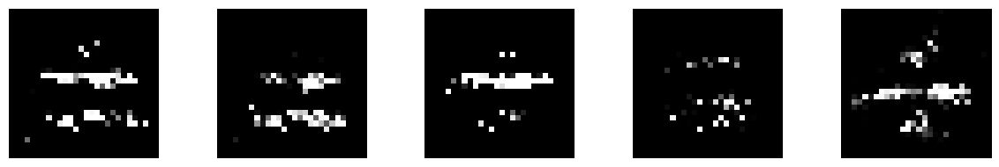

--------------- Epoch 170 ---------------
1/1 [==============================] - 0s 18ms/step


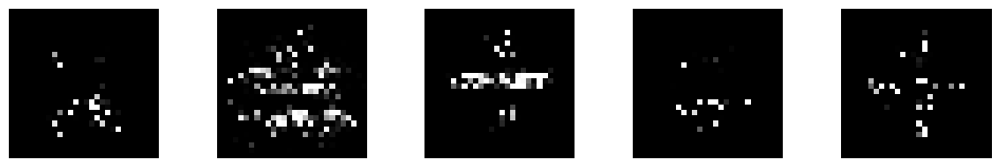

--------------- Epoch 171 ---------------
1/1 [==============================] - 0s 26ms/step


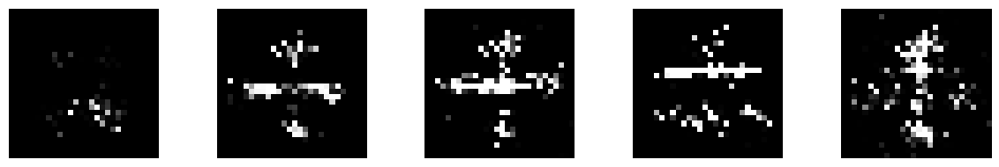

--------------- Epoch 172 ---------------
1/1 [==============================] - 0s 18ms/step


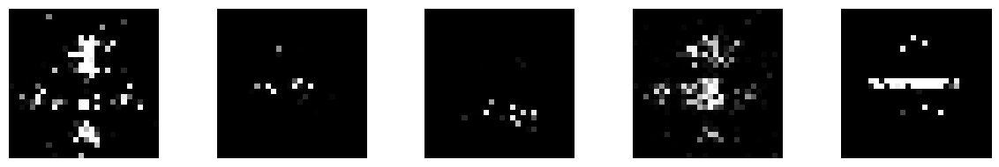

--------------- Epoch 173 ---------------
1/1 [==============================] - 0s 16ms/step


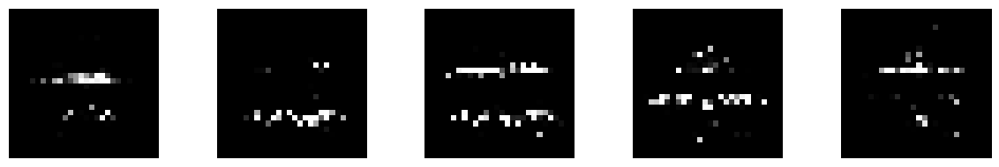

--------------- Epoch 174 ---------------
1/1 [==============================] - 0s 20ms/step


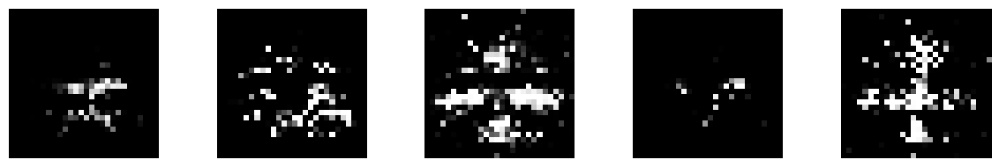

--------------- Epoch 175 ---------------
1/1 [==============================] - 0s 22ms/step


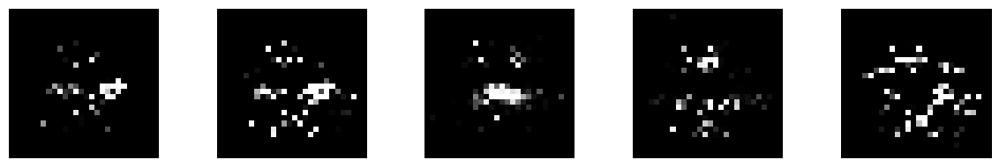

--------------- Epoch 176 ---------------
1/1 [==============================] - 0s 28ms/step


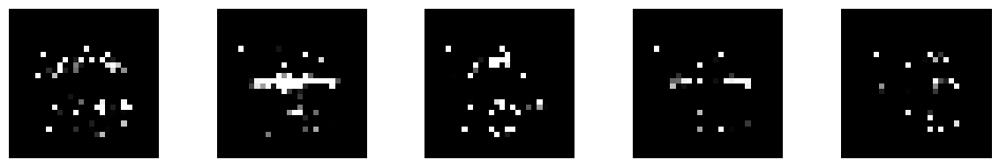

--------------- Epoch 177 ---------------
1/1 [==============================] - 0s 21ms/step


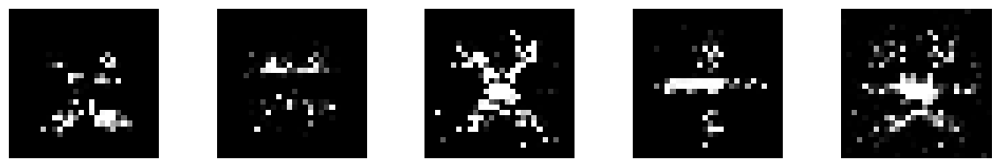

--------------- Epoch 178 ---------------
1/1 [==============================] - 0s 21ms/step


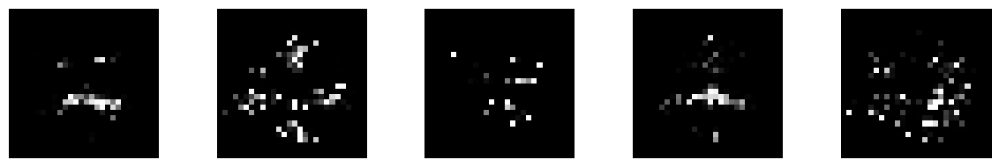

--------------- Epoch 179 ---------------
1/1 [==============================] - 0s 18ms/step


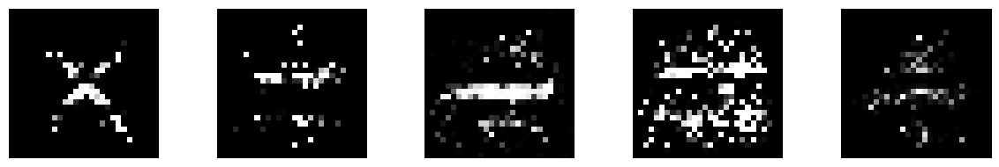

--------------- Epoch 180 ---------------
1/1 [==============================] - 0s 19ms/step


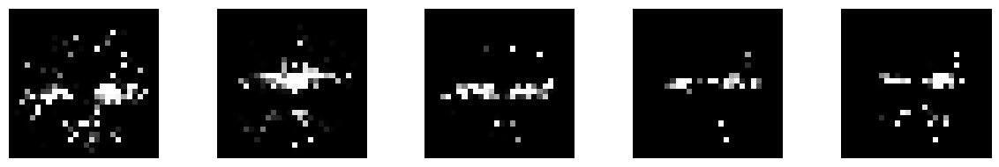

--------------- Epoch 181 ---------------
1/1 [==============================] - 0s 26ms/step


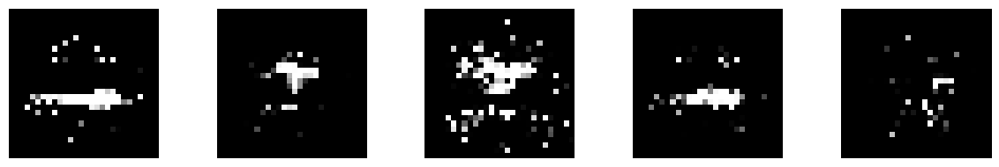

--------------- Epoch 182 ---------------
1/1 [==============================] - 0s 19ms/step


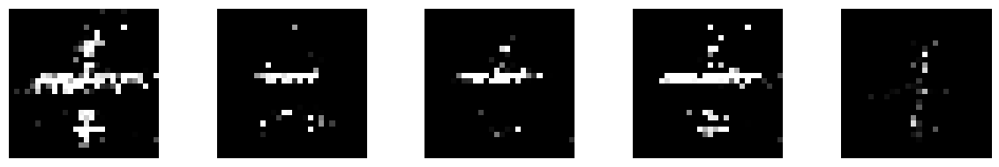

--------------- Epoch 183 ---------------
1/1 [==============================] - 0s 18ms/step


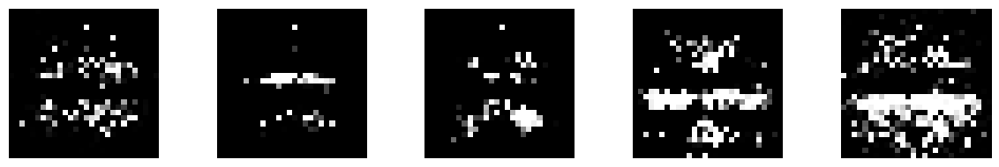

--------------- Epoch 184 ---------------
1/1 [==============================] - 0s 18ms/step


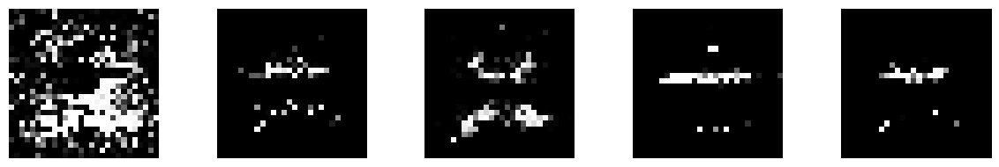

--------------- Epoch 185 ---------------
1/1 [==============================] - 0s 18ms/step


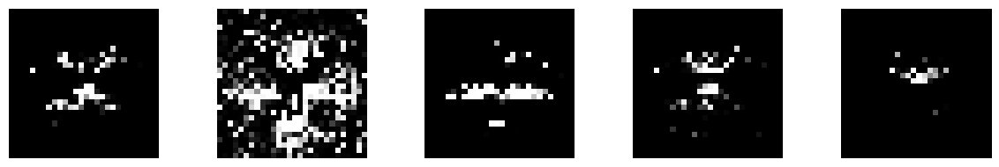

--------------- Epoch 186 ---------------
1/1 [==============================] - 0s 17ms/step


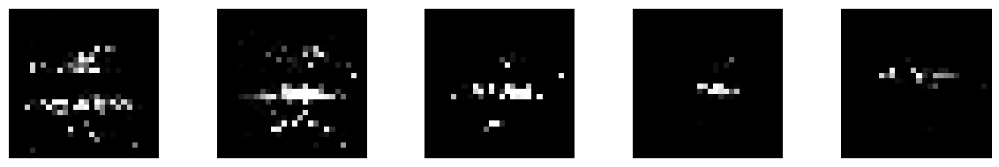

--------------- Epoch 187 ---------------
1/1 [==============================] - 0s 30ms/step


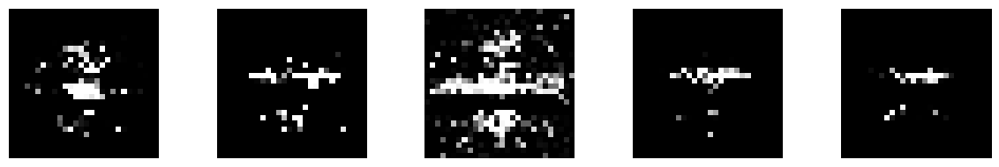

--------------- Epoch 188 ---------------
1/1 [==============================] - 0s 27ms/step


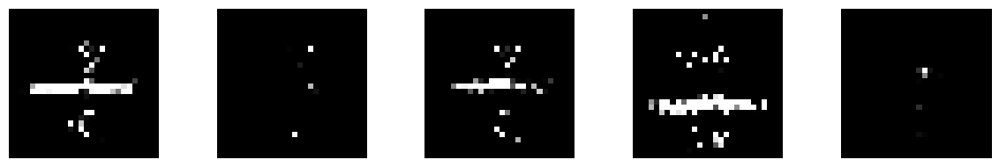

--------------- Epoch 189 ---------------
1/1 [==============================] - 0s 18ms/step


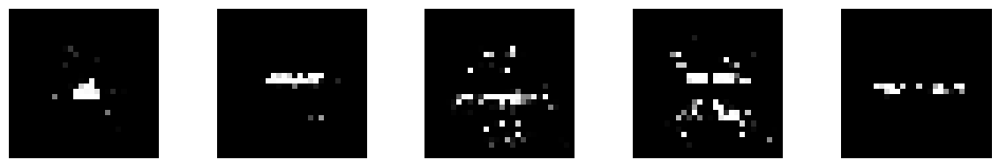

--------------- Epoch 190 ---------------
1/1 [==============================] - 0s 20ms/step


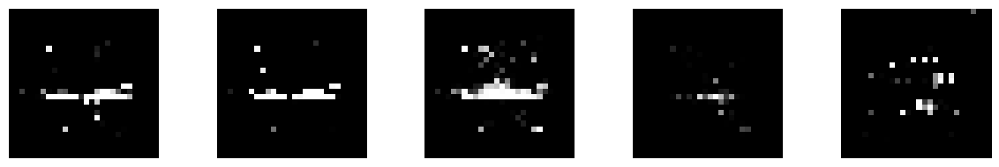

--------------- Epoch 191 ---------------
1/1 [==============================] - 0s 20ms/step


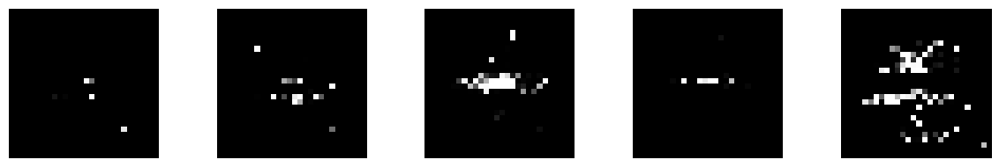

--------------- Epoch 192 ---------------
1/1 [==============================] - 0s 39ms/step


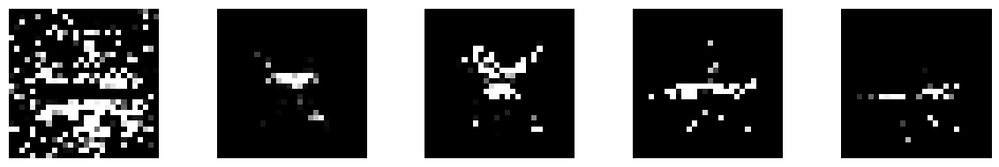

--------------- Epoch 193 ---------------
1/1 [==============================] - 0s 26ms/step


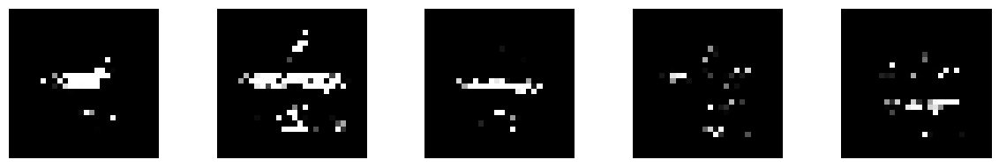

--------------- Epoch 194 ---------------
1/1 [==============================] - 0s 19ms/step


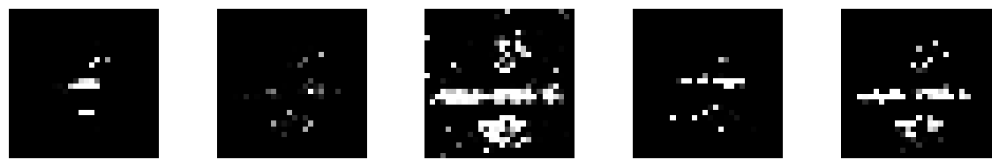

--------------- Epoch 195 ---------------
1/1 [==============================] - 0s 18ms/step


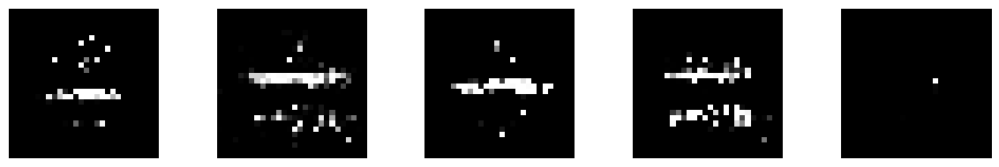

--------------- Epoch 196 ---------------
1/1 [==============================] - 0s 17ms/step


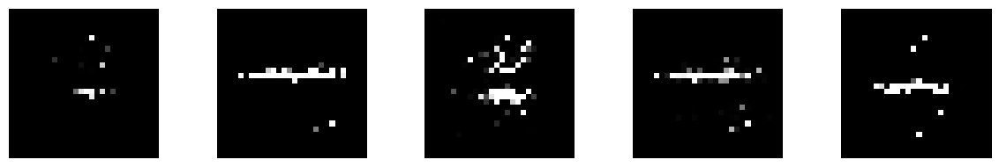

--------------- Epoch 197 ---------------
1/1 [==============================] - 0s 17ms/step


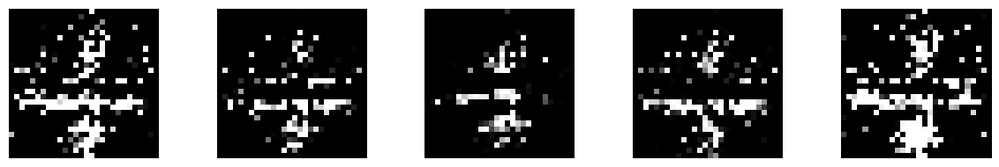

--------------- Epoch 198 ---------------
1/1 [==============================] - 0s 24ms/step


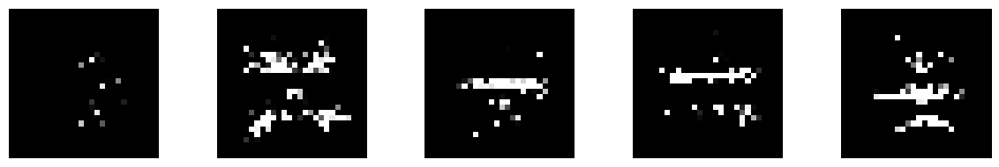

--------------- Epoch 199 ---------------
1/1 [==============================] - 0s 20ms/step


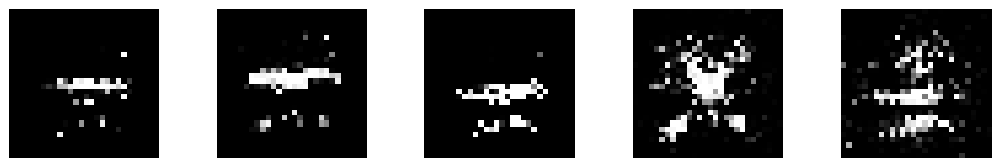

--------------- Epoch 200 ---------------
1/1 [==============================] - 0s 22ms/step


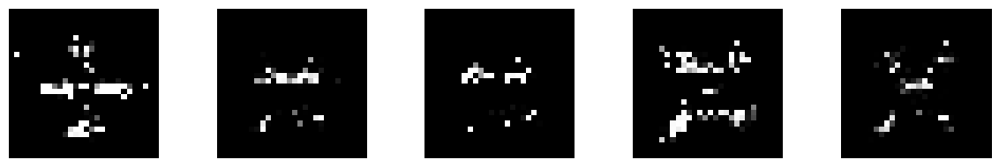

--------------- Epoch 201 ---------------
1/1 [==============================] - 0s 21ms/step


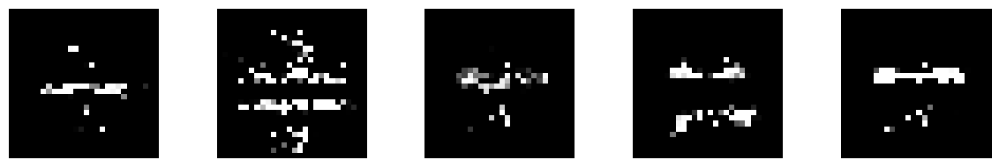

--------------- Epoch 202 ---------------
1/1 [==============================] - 0s 20ms/step


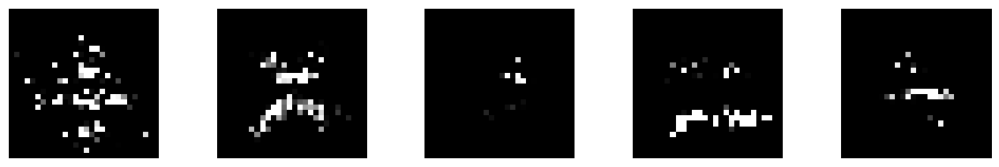

--------------- Epoch 203 ---------------
1/1 [==============================] - 0s 29ms/step


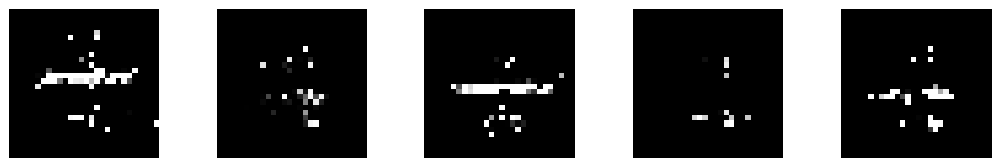

--------------- Epoch 204 ---------------
1/1 [==============================] - 0s 32ms/step


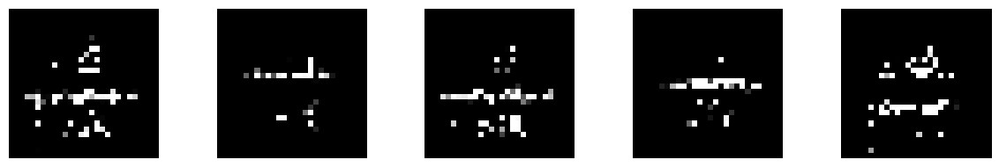

--------------- Epoch 205 ---------------
1/1 [==============================] - 0s 19ms/step


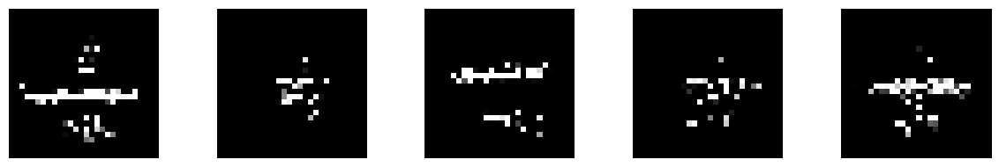

--------------- Epoch 206 ---------------
1/1 [==============================] - 0s 19ms/step


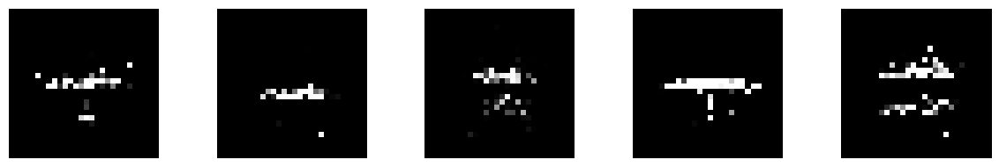

--------------- Epoch 207 ---------------
1/1 [==============================] - 0s 16ms/step


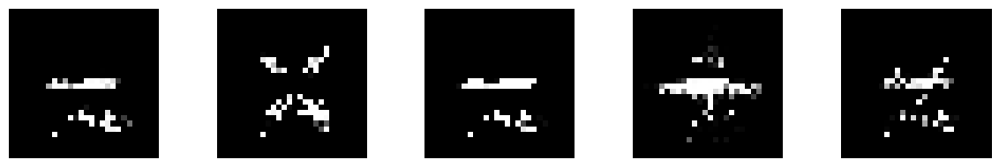

--------------- Epoch 208 ---------------
1/1 [==============================] - 0s 24ms/step


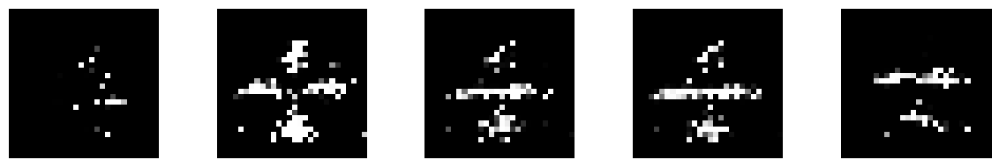

--------------- Epoch 209 ---------------
1/1 [==============================] - 0s 17ms/step


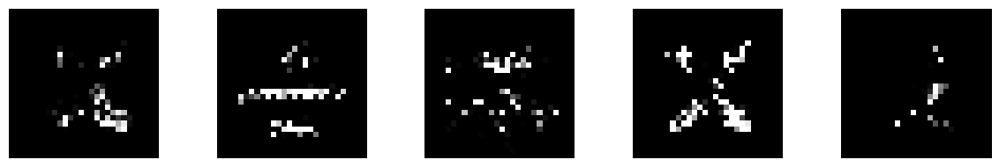

--------------- Epoch 210 ---------------
1/1 [==============================] - 0s 18ms/step


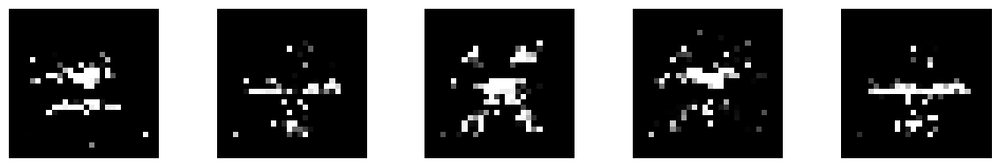

--------------- Epoch 211 ---------------
1/1 [==============================] - 0s 21ms/step


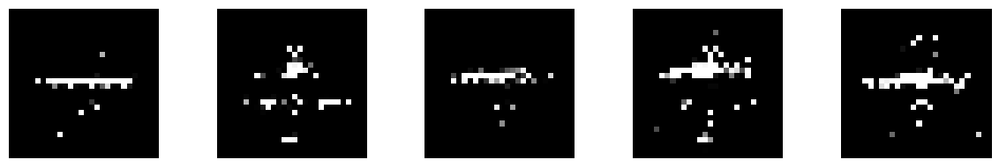

--------------- Epoch 212 ---------------
1/1 [==============================] - 0s 21ms/step


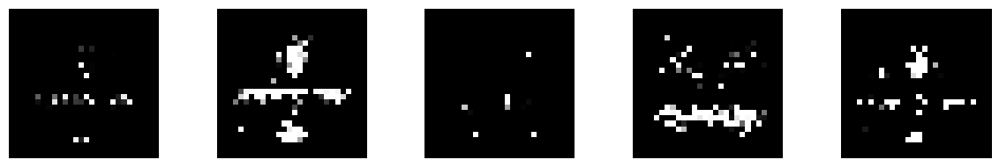

--------------- Epoch 213 ---------------
1/1 [==============================] - 0s 26ms/step


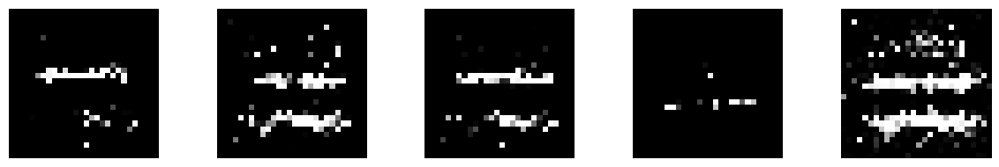

--------------- Epoch 214 ---------------
1/1 [==============================] - 0s 18ms/step


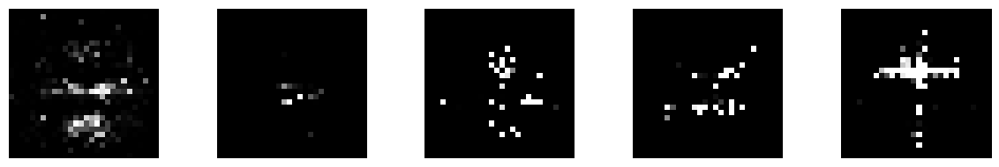

--------------- Epoch 215 ---------------
1/1 [==============================] - 0s 18ms/step


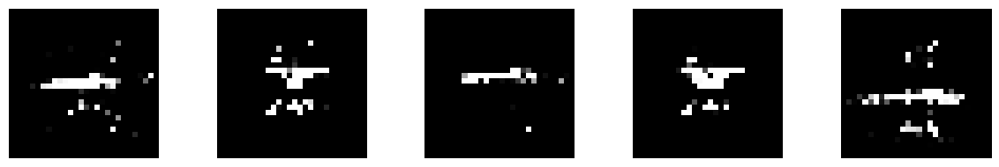

--------------- Epoch 216 ---------------
1/1 [==============================] - 0s 19ms/step


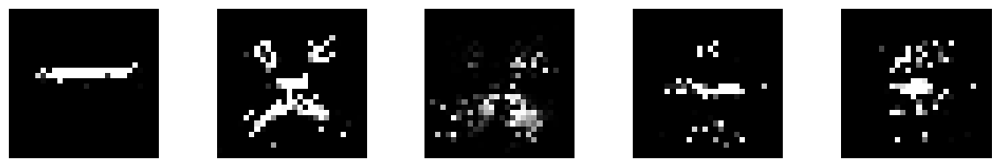

--------------- Epoch 217 ---------------
1/1 [==============================] - 0s 21ms/step


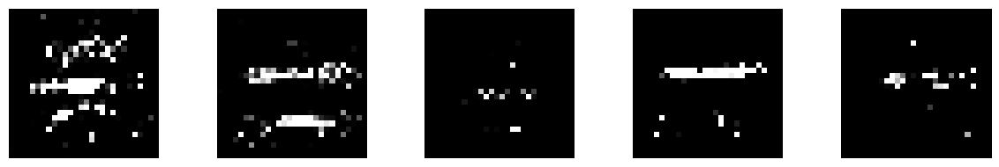

--------------- Epoch 218 ---------------
1/1 [==============================] - 0s 28ms/step


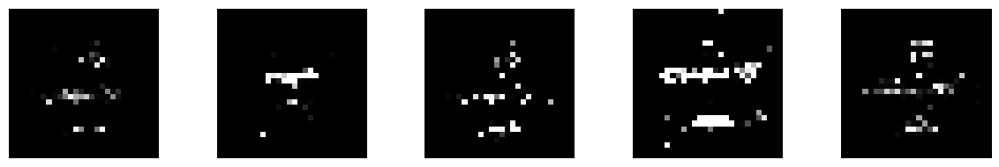

--------------- Epoch 219 ---------------
1/1 [==============================] - 0s 27ms/step


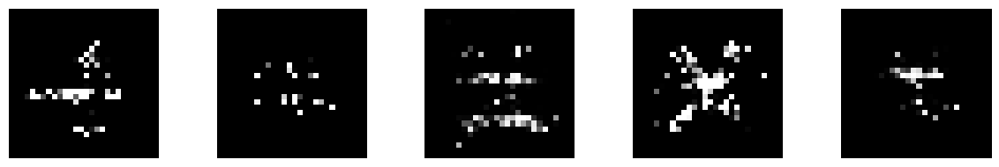

--------------- Epoch 220 ---------------
1/1 [==============================] - 0s 17ms/step


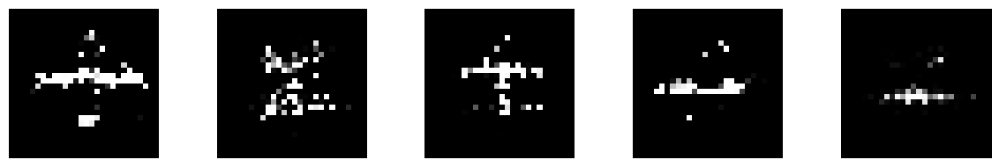

--------------- Epoch 221 ---------------
1/1 [==============================] - 0s 19ms/step


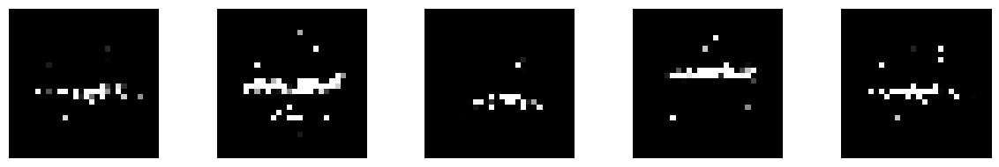

--------------- Epoch 222 ---------------
1/1 [==============================] - 0s 16ms/step


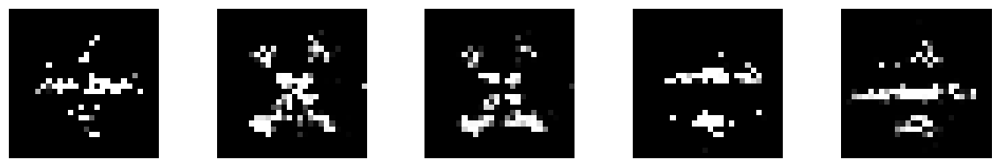

--------------- Epoch 223 ---------------
1/1 [==============================] - 0s 17ms/step


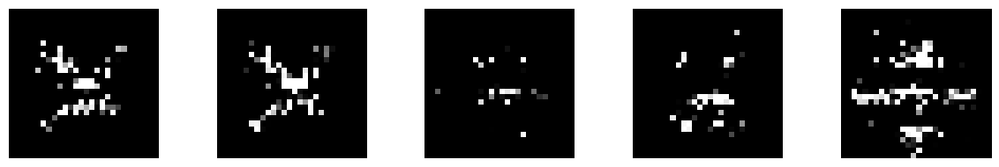

--------------- Epoch 224 ---------------
1/1 [==============================] - 0s 23ms/step


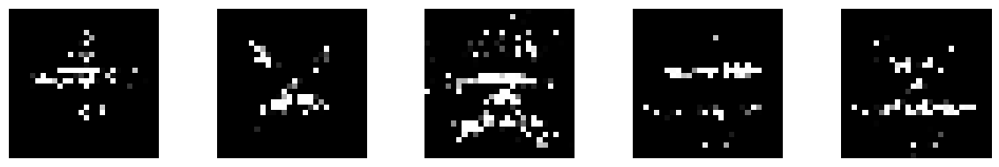

--------------- Epoch 225 ---------------
1/1 [==============================] - 0s 19ms/step


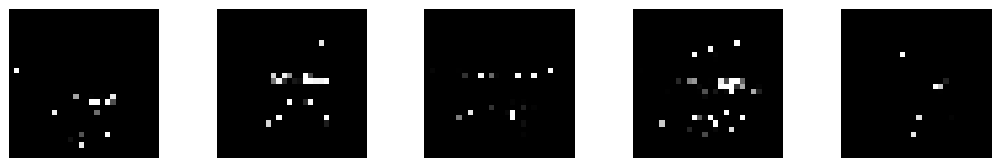

--------------- Epoch 226 ---------------
1/1 [==============================] - 0s 19ms/step


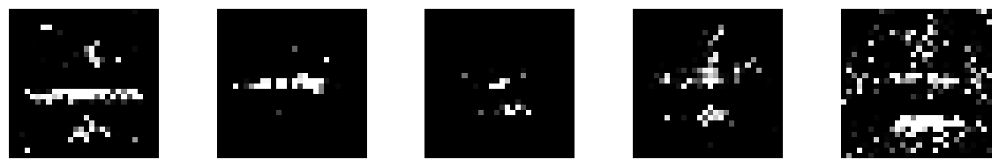

--------------- Epoch 227 ---------------
1/1 [==============================] - 0s 19ms/step


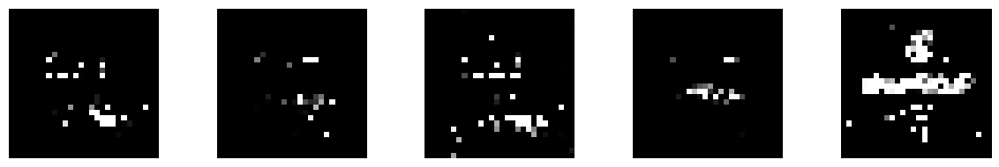

--------------- Epoch 228 ---------------
1/1 [==============================] - 0s 23ms/step


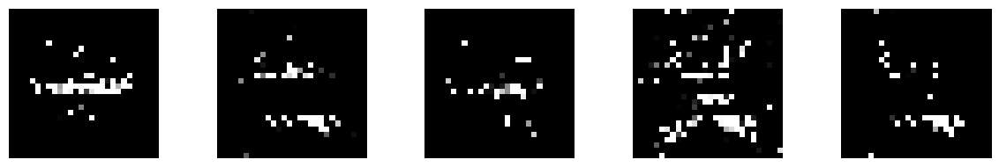

--------------- Epoch 229 ---------------
1/1 [==============================] - 0s 26ms/step


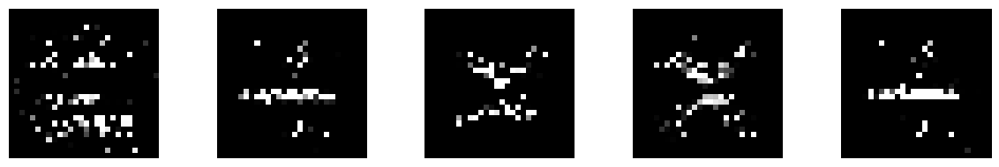

--------------- Epoch 230 ---------------
1/1 [==============================] - 0s 18ms/step


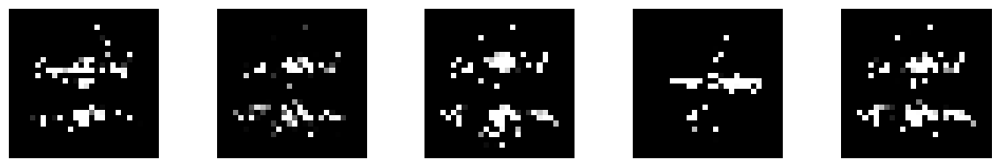

--------------- Epoch 231 ---------------
1/1 [==============================] - 0s 17ms/step


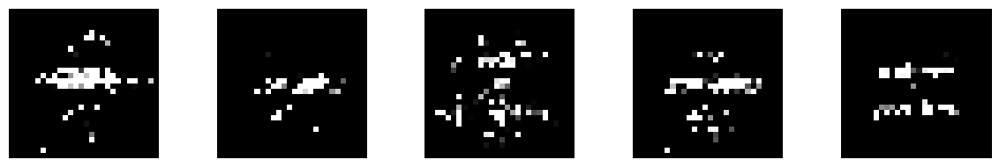

--------------- Epoch 232 ---------------
1/1 [==============================] - 0s 18ms/step


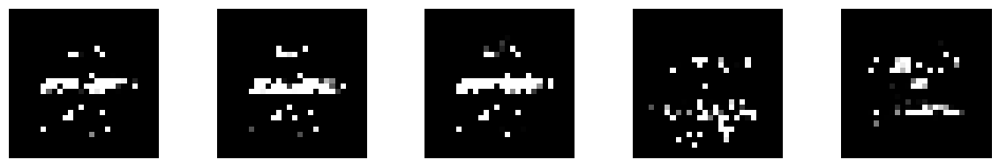

--------------- Epoch 233 ---------------
1/1 [==============================] - 0s 18ms/step


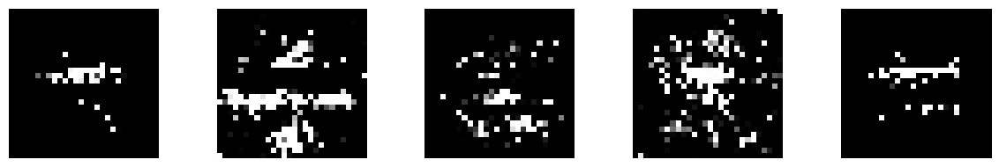

--------------- Epoch 234 ---------------
1/1 [==============================] - 0s 27ms/step


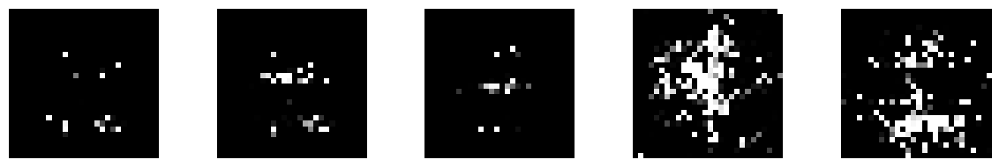

--------------- Epoch 235 ---------------
1/1 [==============================] - 0s 28ms/step


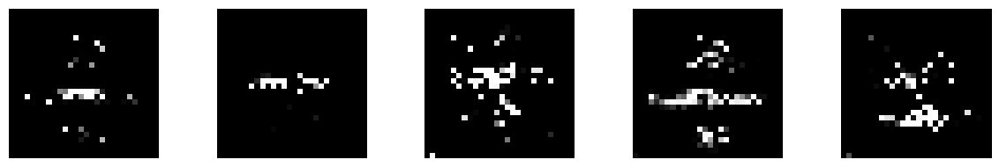

--------------- Epoch 236 ---------------
1/1 [==============================] - 0s 17ms/step


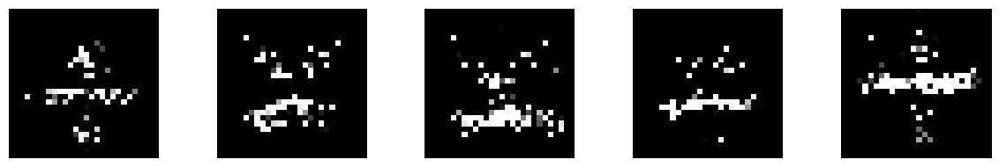

--------------- Epoch 237 ---------------
1/1 [==============================] - 0s 20ms/step


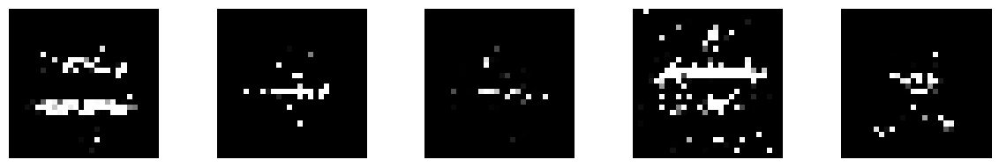

--------------- Epoch 238 ---------------
1/1 [==============================] - 0s 20ms/step


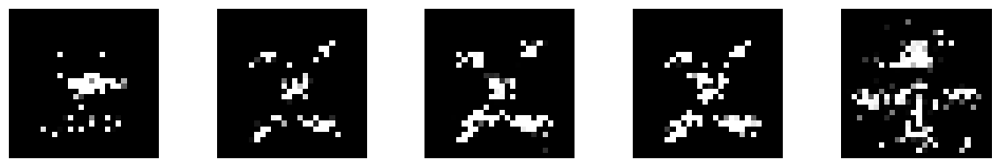

--------------- Epoch 239 ---------------
1/1 [==============================] - 0s 19ms/step


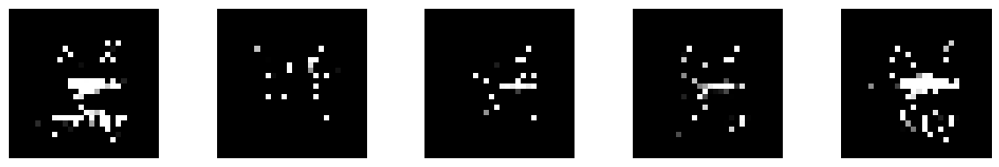

--------------- Epoch 240 ---------------
1/1 [==============================] - 0s 31ms/step


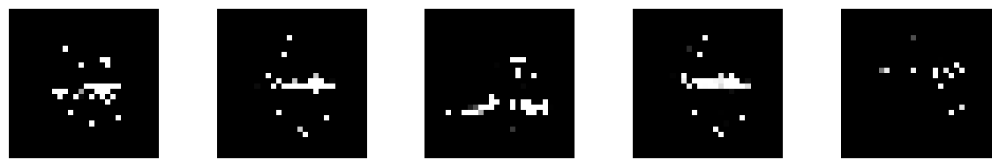

--------------- Epoch 241 ---------------
1/1 [==============================] - 0s 20ms/step


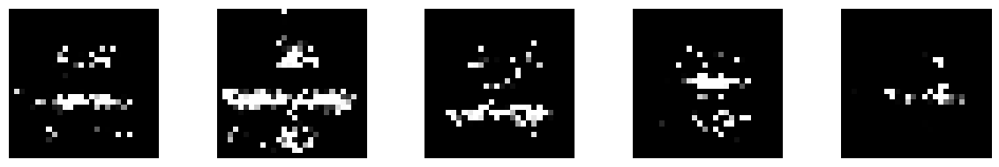

--------------- Epoch 242 ---------------
1/1 [==============================] - 0s 17ms/step


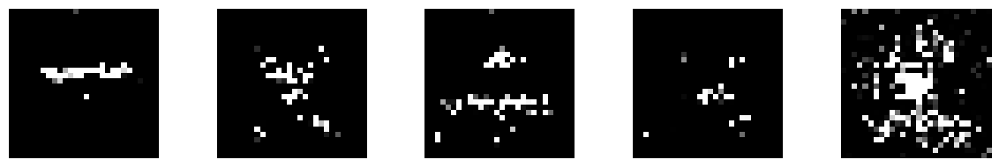

--------------- Epoch 243 ---------------
1/1 [==============================] - 0s 19ms/step


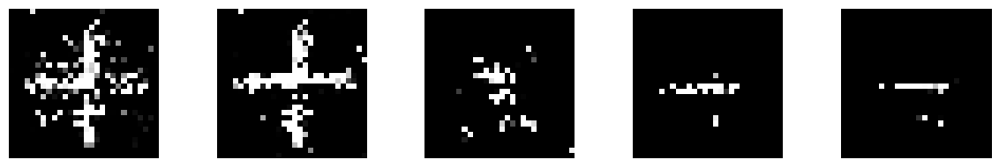

--------------- Epoch 244 ---------------
1/1 [==============================] - 0s 18ms/step


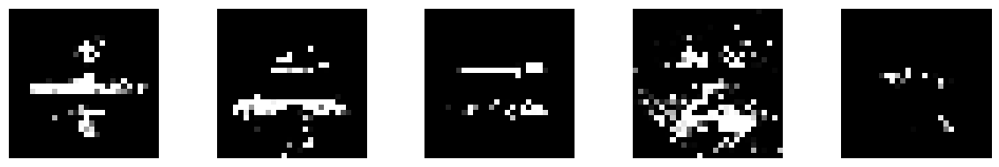

--------------- Epoch 245 ---------------
1/1 [==============================] - 0s 25ms/step


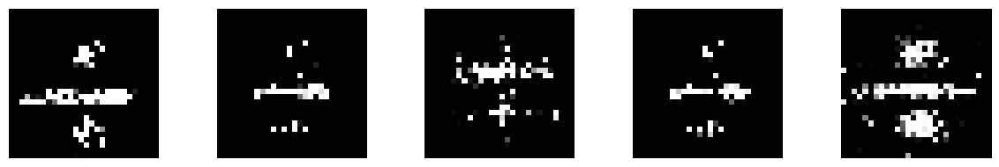

--------------- Epoch 246 ---------------
1/1 [==============================] - 0s 19ms/step


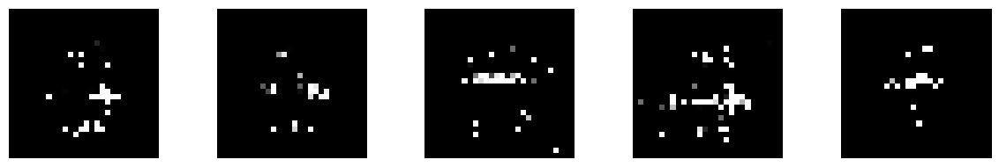

--------------- Epoch 247 ---------------
1/1 [==============================] - 0s 17ms/step


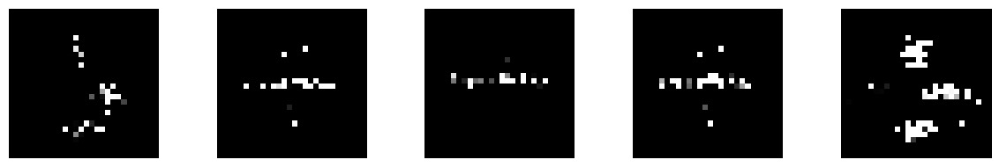

--------------- Epoch 248 ---------------
1/1 [==============================] - 0s 19ms/step


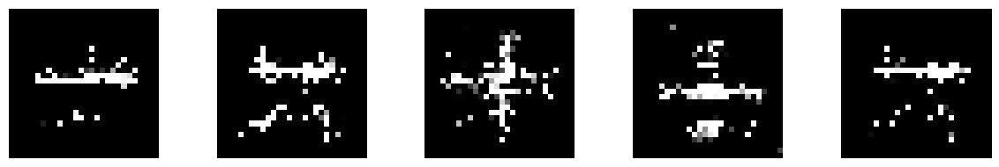

--------------- Epoch 249 ---------------
1/1 [==============================] - 0s 17ms/step


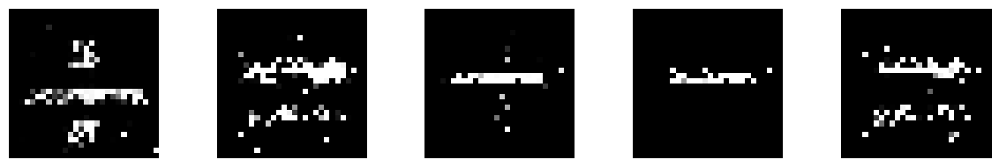

--------------- Epoch 250 ---------------
1/1 [==============================] - 0s 30ms/step


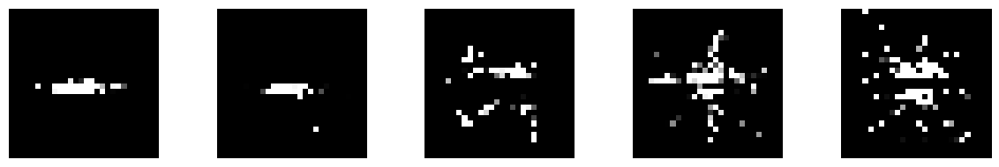

--------------- Epoch 251 ---------------
1/1 [==============================] - 0s 22ms/step


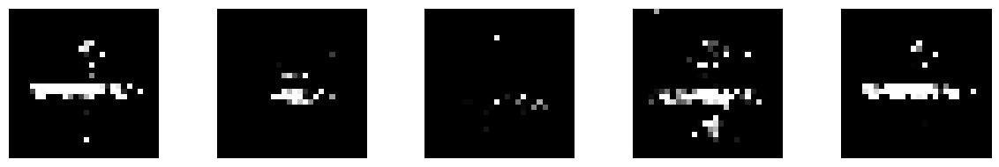

--------------- Epoch 252 ---------------
1/1 [==============================] - 0s 19ms/step


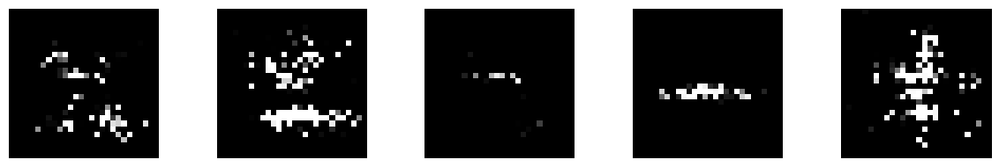

--------------- Epoch 253 ---------------
1/1 [==============================] - 0s 21ms/step


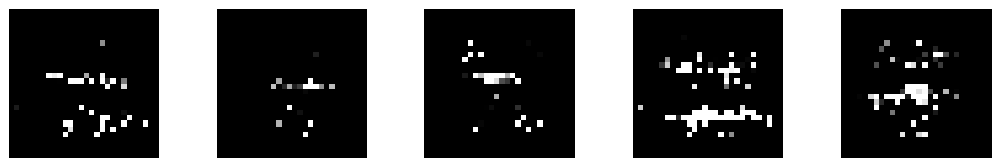

--------------- Epoch 254 ---------------
1/1 [==============================] - 0s 18ms/step


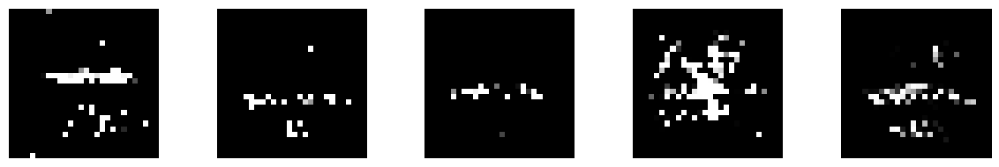

--------------- Epoch 255 ---------------
1/1 [==============================] - 0s 27ms/step


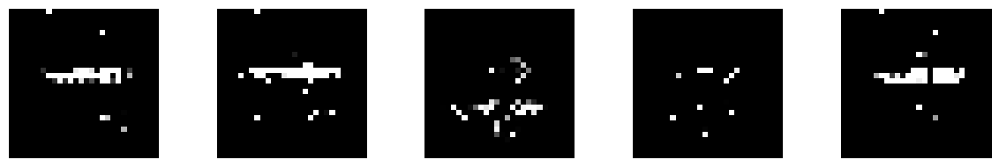

--------------- Epoch 256 ---------------
1/1 [==============================] - 0s 21ms/step


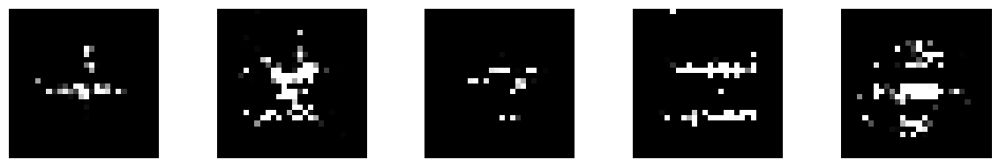

--------------- Epoch 257 ---------------
1/1 [==============================] - 0s 25ms/step


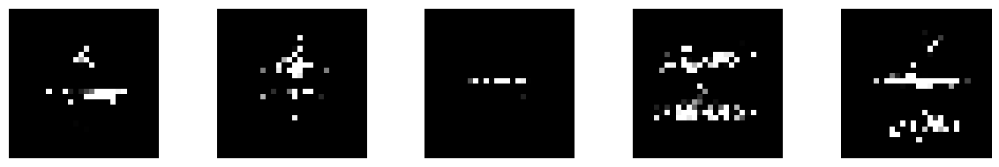

--------------- Epoch 258 ---------------
1/1 [==============================] - 0s 18ms/step


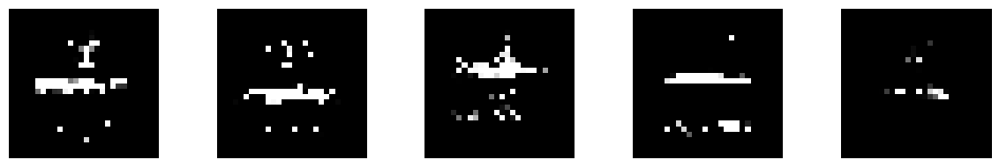

--------------- Epoch 259 ---------------
1/1 [==============================] - 0s 16ms/step


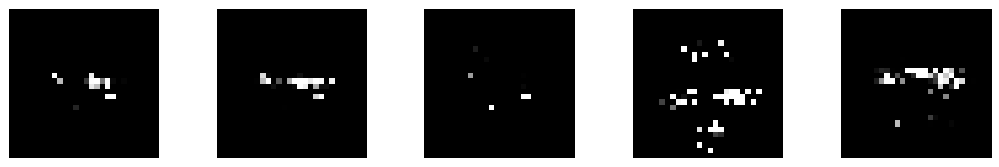

--------------- Epoch 260 ---------------
1/1 [==============================] - 0s 30ms/step


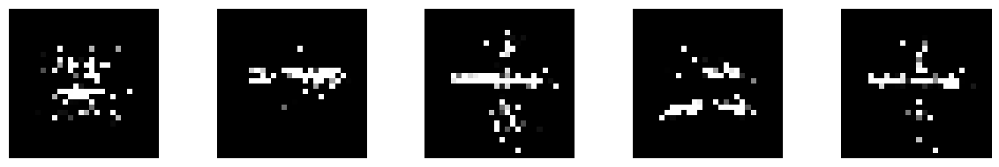

--------------- Epoch 261 ---------------
1/1 [==============================] - 0s 18ms/step


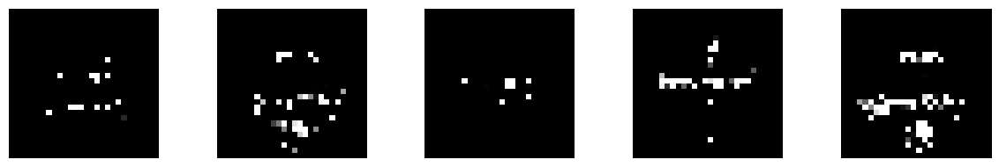

--------------- Epoch 262 ---------------
1/1 [==============================] - 0s 22ms/step


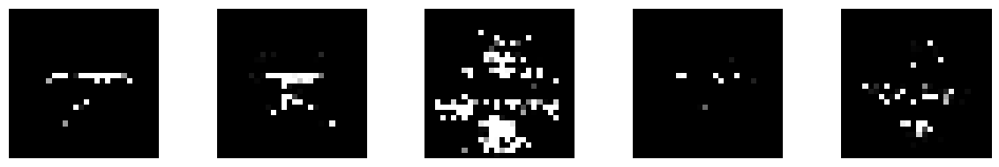

--------------- Epoch 263 ---------------
1/1 [==============================] - 0s 22ms/step


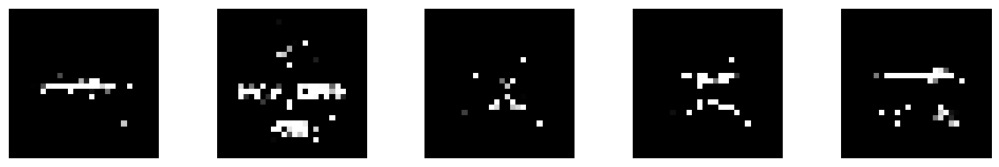

--------------- Epoch 264 ---------------
1/1 [==============================] - 0s 19ms/step


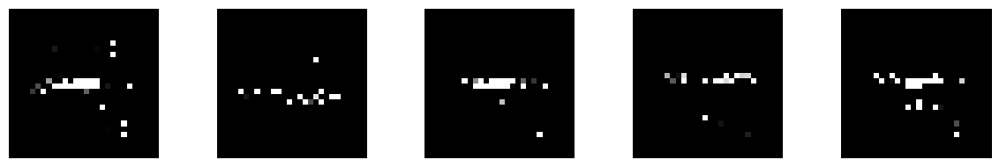

--------------- Epoch 265 ---------------
1/1 [==============================] - 0s 27ms/step


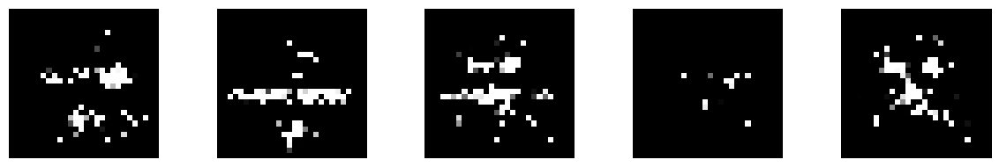

--------------- Epoch 266 ---------------
1/1 [==============================] - 0s 19ms/step


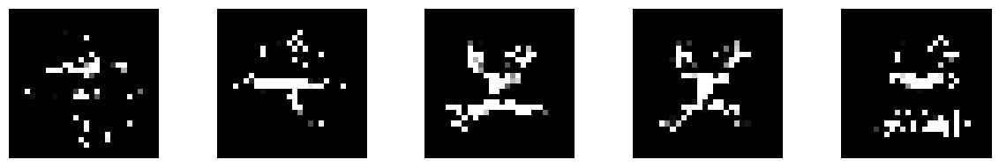

--------------- Epoch 267 ---------------
1/1 [==============================] - 0s 33ms/step


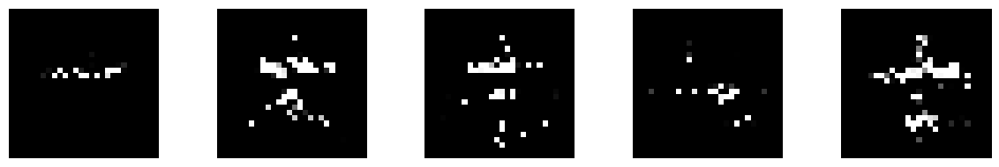

--------------- Epoch 268 ---------------
1/1 [==============================] - 0s 19ms/step


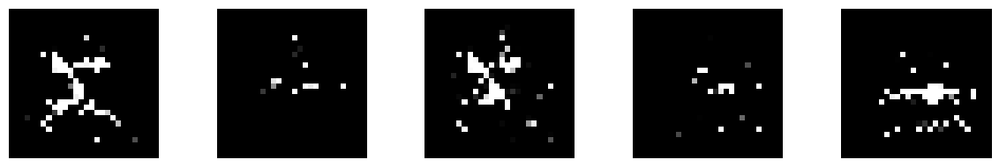

--------------- Epoch 269 ---------------
1/1 [==============================] - 0s 30ms/step


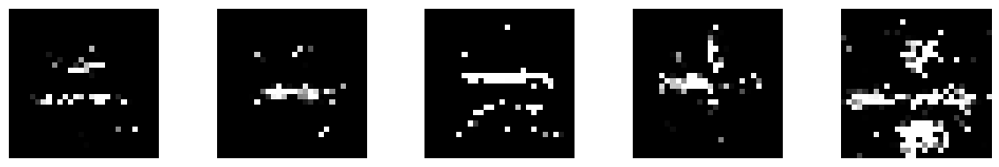

--------------- Epoch 270 ---------------
1/1 [==============================] - 0s 27ms/step


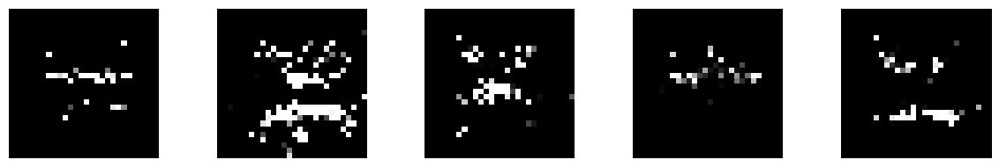

--------------- Epoch 271 ---------------
1/1 [==============================] - 0s 19ms/step


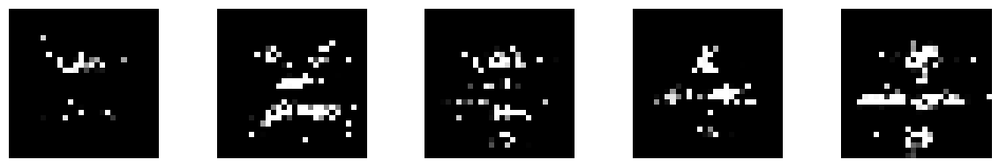

--------------- Epoch 272 ---------------
1/1 [==============================] - 0s 20ms/step


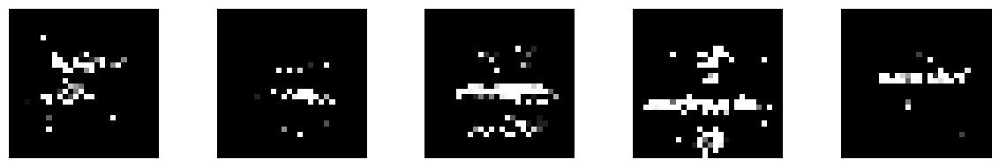

--------------- Epoch 273 ---------------
1/1 [==============================] - 0s 17ms/step


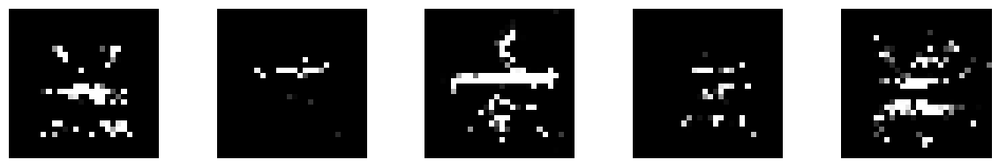

--------------- Epoch 274 ---------------
1/1 [==============================] - 0s 17ms/step


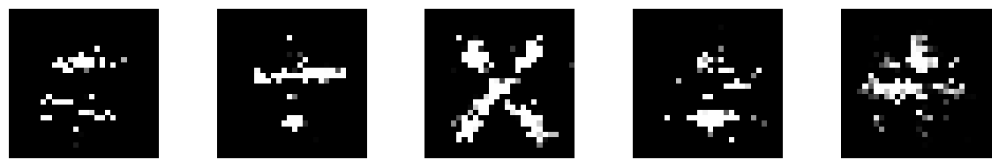

--------------- Epoch 275 ---------------
1/1 [==============================] - 0s 38ms/step


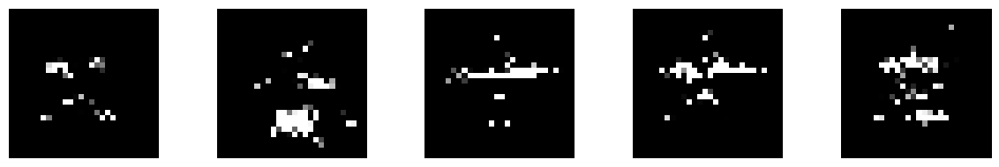

--------------- Epoch 276 ---------------
1/1 [==============================] - 0s 28ms/step


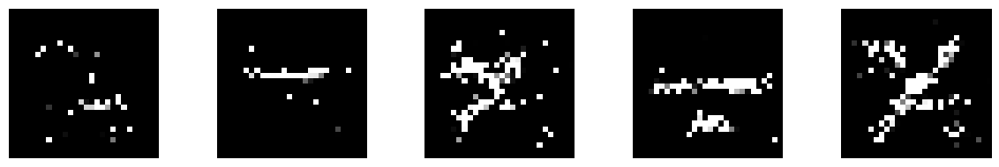

--------------- Epoch 277 ---------------
1/1 [==============================] - 0s 19ms/step


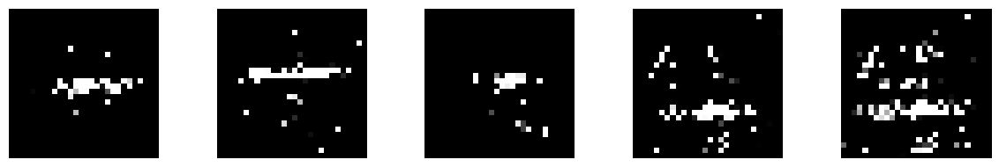

--------------- Epoch 278 ---------------
1/1 [==============================] - 0s 20ms/step


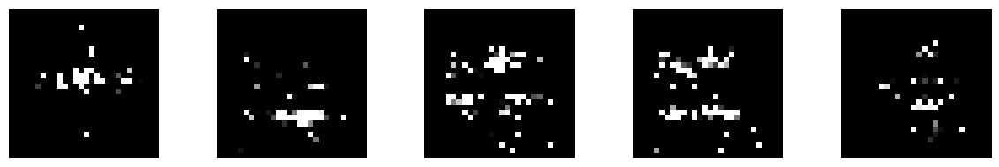

--------------- Epoch 279 ---------------
1/1 [==============================] - 0s 19ms/step


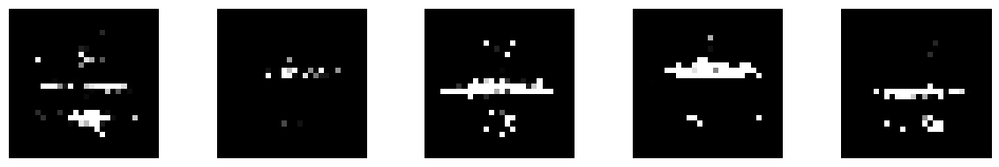

--------------- Epoch 280 ---------------
1/1 [==============================] - 0s 37ms/step


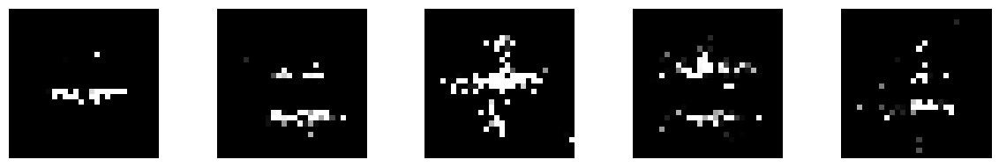

--------------- Epoch 281 ---------------
1/1 [==============================] - 0s 21ms/step


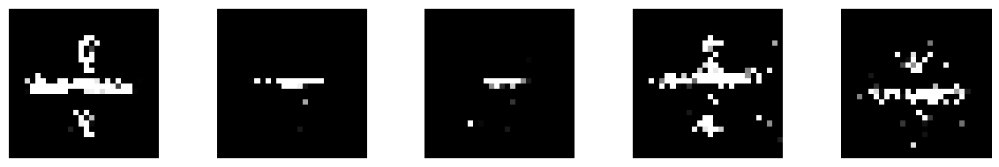

--------------- Epoch 282 ---------------
1/1 [==============================] - 0s 21ms/step


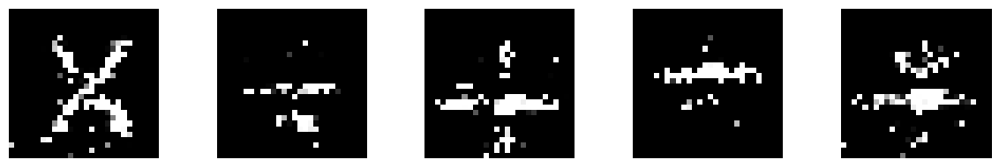

--------------- Epoch 283 ---------------
1/1 [==============================] - 0s 21ms/step


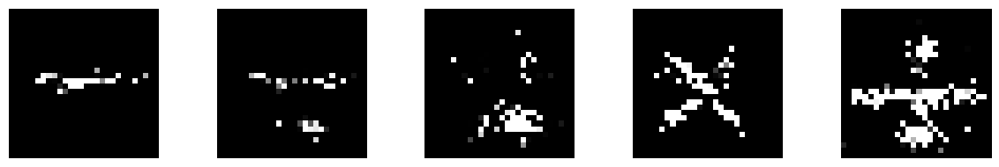

--------------- Epoch 284 ---------------
1/1 [==============================] - 0s 37ms/step


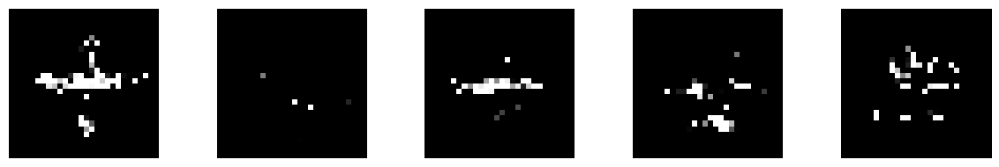

--------------- Epoch 285 ---------------
1/1 [==============================] - 0s 32ms/step


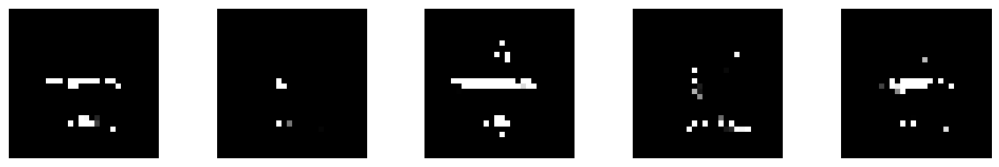

--------------- Epoch 286 ---------------
1/1 [==============================] - 0s 18ms/step


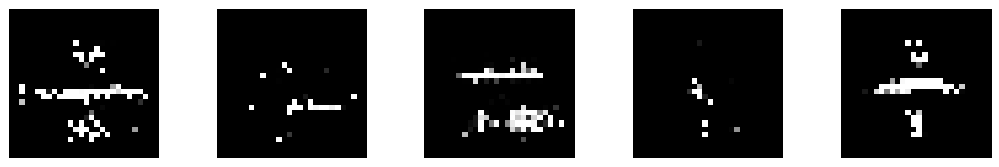

--------------- Epoch 287 ---------------
1/1 [==============================] - 0s 18ms/step


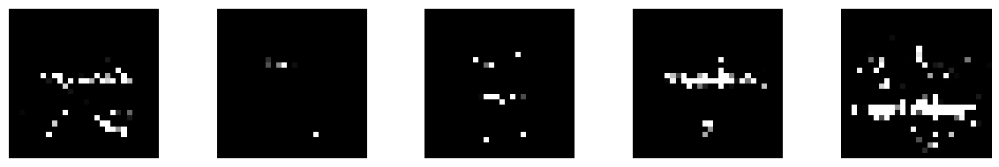

--------------- Epoch 288 ---------------
1/1 [==============================] - 0s 20ms/step


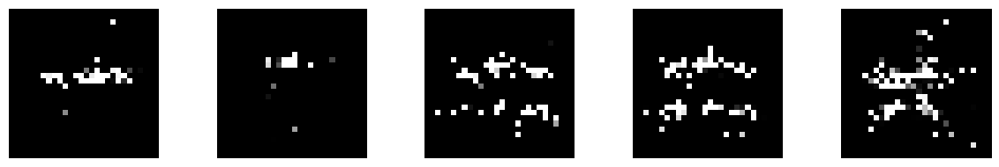

--------------- Epoch 289 ---------------
1/1 [==============================] - 0s 43ms/step


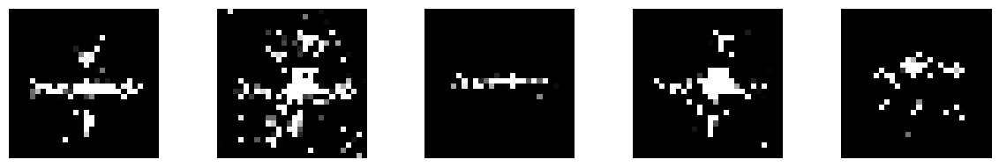

--------------- Epoch 290 ---------------
1/1 [==============================] - 0s 20ms/step


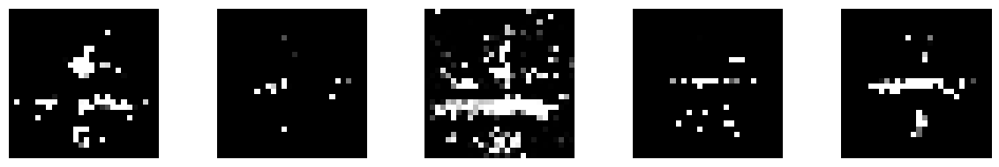

--------------- Epoch 291 ---------------
1/1 [==============================] - 0s 19ms/step


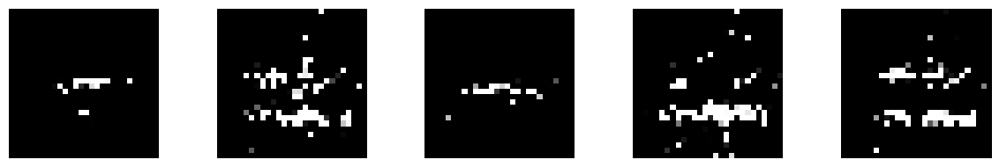

--------------- Epoch 292 ---------------
1/1 [==============================] - 0s 21ms/step


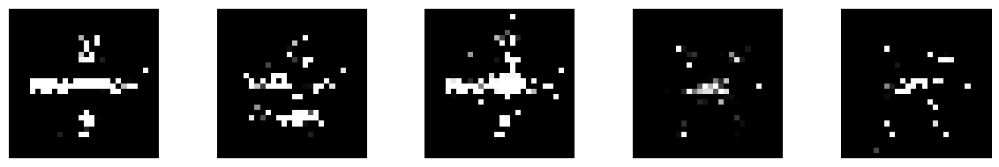

--------------- Epoch 293 ---------------
1/1 [==============================] - 0s 19ms/step


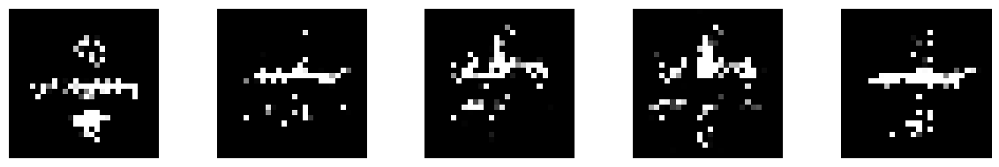

--------------- Epoch 294 ---------------
1/1 [==============================] - 0s 18ms/step


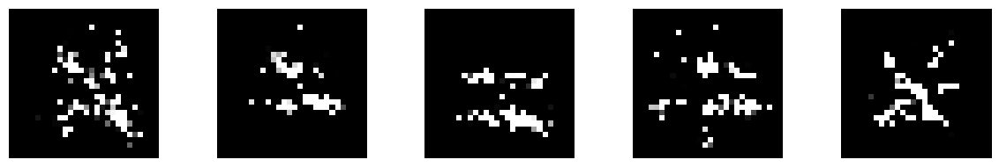

--------------- Epoch 295 ---------------
1/1 [==============================] - 0s 32ms/step


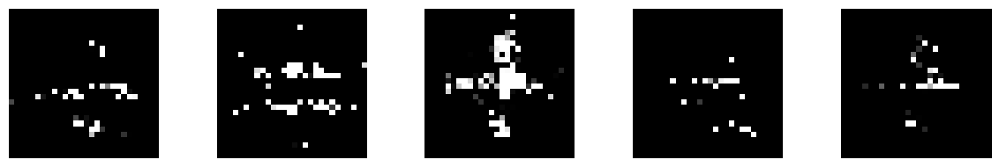

--------------- Epoch 296 ---------------
1/1 [==============================] - 0s 19ms/step


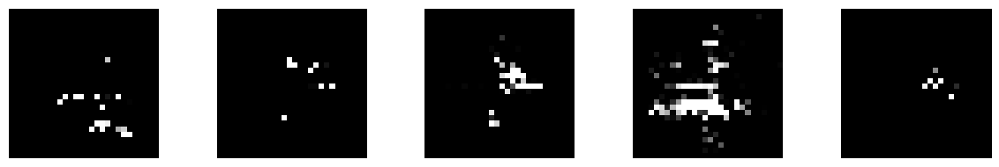

--------------- Epoch 297 ---------------
1/1 [==============================] - 0s 17ms/step


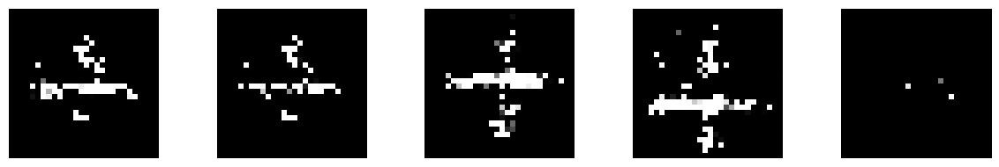

--------------- Epoch 298 ---------------
1/1 [==============================] - 0s 17ms/step


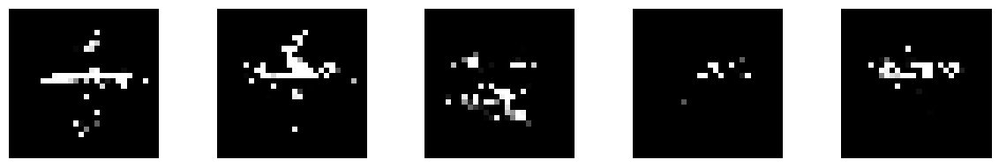

--------------- Epoch 299 ---------------
1/1 [==============================] - 0s 23ms/step


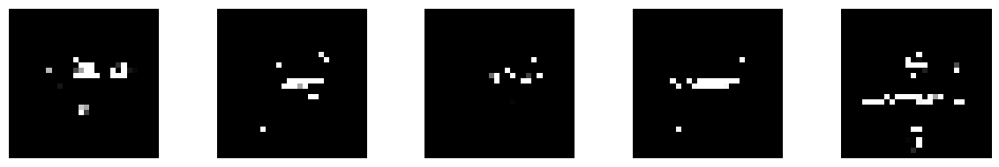

--------------- Epoch 300 ---------------
1/1 [==============================] - 0s 33ms/step


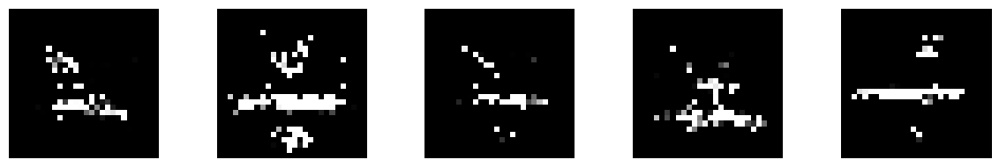

--------------- Epoch 301 ---------------
1/1 [==============================] - 0s 23ms/step


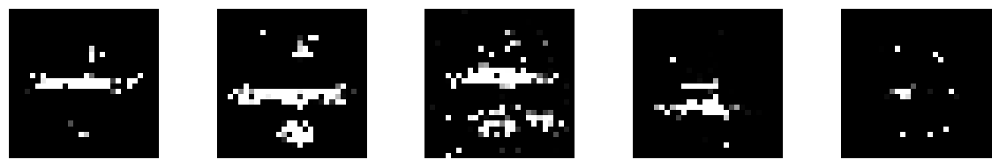

--------------- Epoch 302 ---------------
1/1 [==============================] - 0s 20ms/step


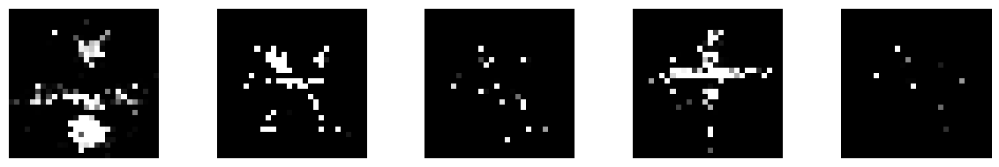

--------------- Epoch 303 ---------------
1/1 [==============================] - 0s 21ms/step


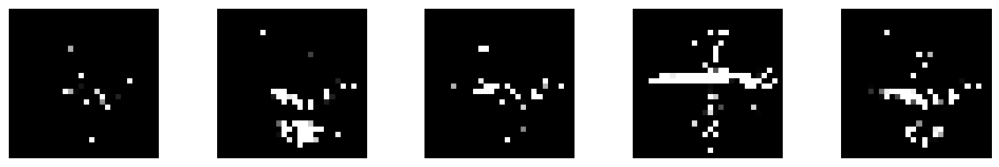

--------------- Epoch 304 ---------------
1/1 [==============================] - 0s 20ms/step


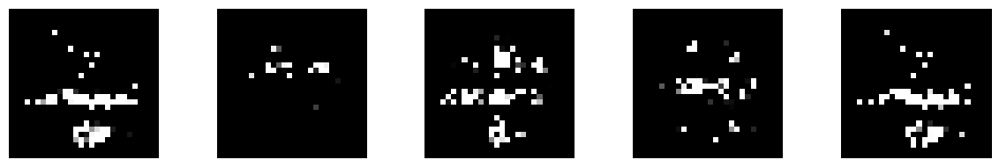

--------------- Epoch 305 ---------------
1/1 [==============================] - 0s 25ms/step


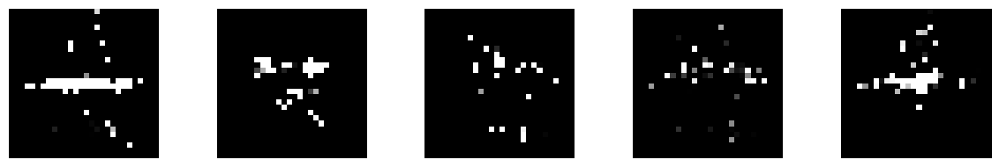

--------------- Epoch 306 ---------------
1/1 [==============================] - 0s 17ms/step


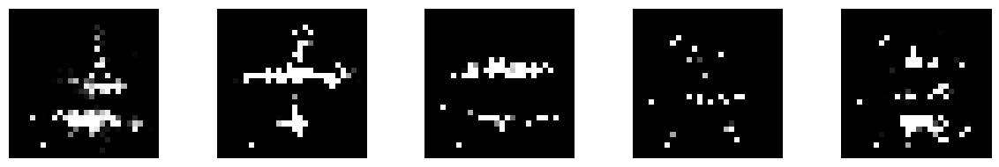

--------------- Epoch 307 ---------------
1/1 [==============================] - 0s 18ms/step


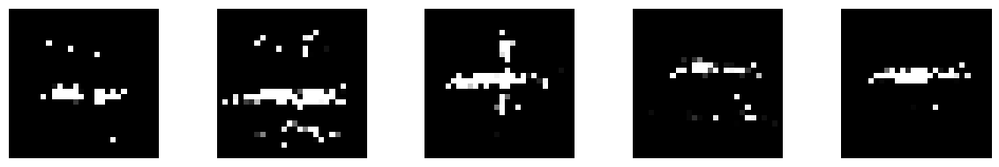

--------------- Epoch 308 ---------------
1/1 [==============================] - 0s 17ms/step


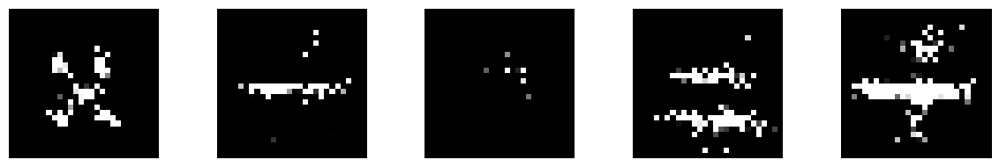

--------------- Epoch 309 ---------------
1/1 [==============================] - 0s 18ms/step


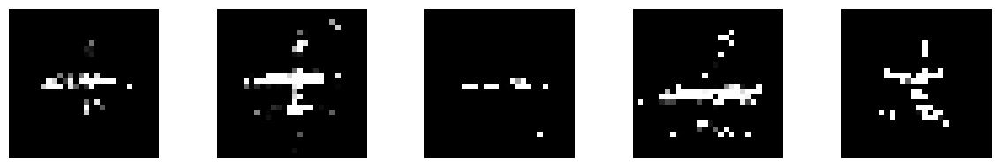

--------------- Epoch 310 ---------------
1/1 [==============================] - 0s 56ms/step


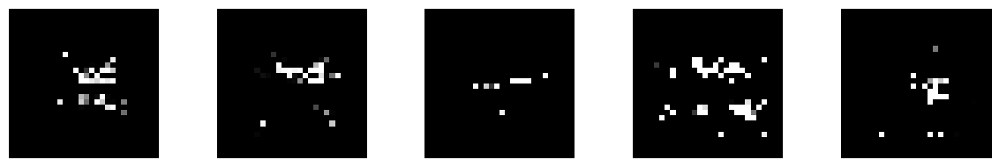

--------------- Epoch 311 ---------------
1/1 [==============================] - 0s 18ms/step


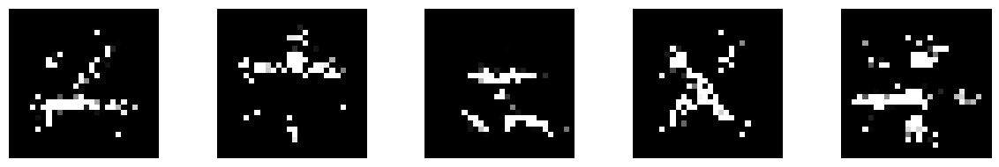

--------------- Epoch 312 ---------------
1/1 [==============================] - 0s 19ms/step


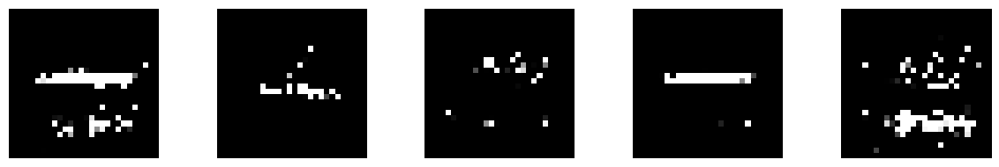

--------------- Epoch 313 ---------------
1/1 [==============================] - 0s 21ms/step


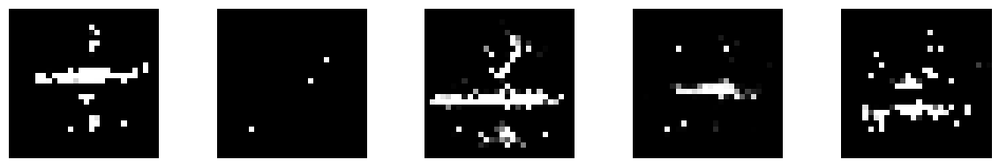

--------------- Epoch 314 ---------------
1/1 [==============================] - 0s 21ms/step


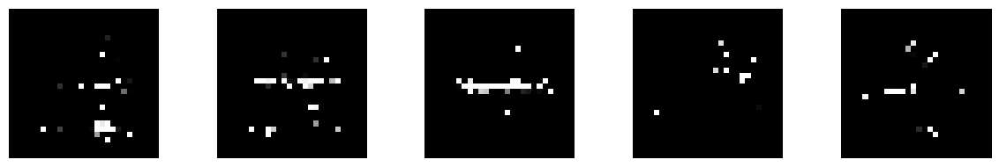

--------------- Epoch 315 ---------------
1/1 [==============================] - 0s 26ms/step


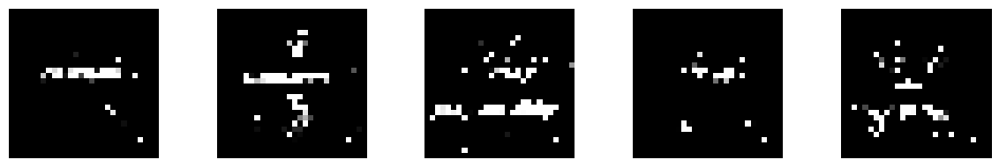

--------------- Epoch 316 ---------------
1/1 [==============================] - 0s 18ms/step


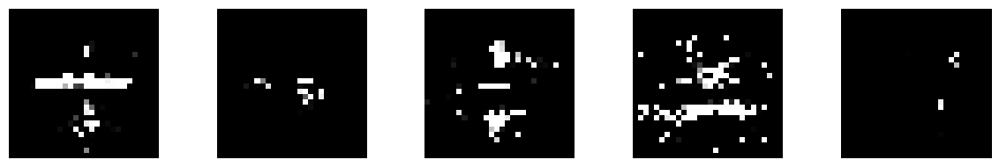

--------------- Epoch 317 ---------------
1/1 [==============================] - 0s 26ms/step


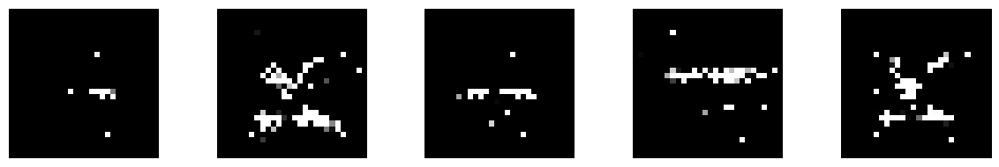

--------------- Epoch 318 ---------------
1/1 [==============================] - 0s 20ms/step


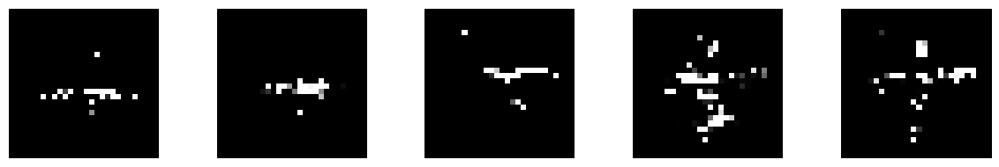

--------------- Epoch 319 ---------------
1/1 [==============================] - 0s 19ms/step


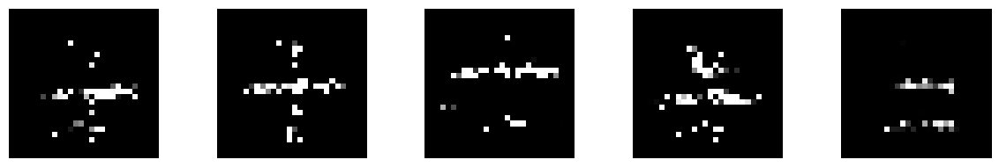

--------------- Epoch 320 ---------------
1/1 [==============================] - 0s 27ms/step


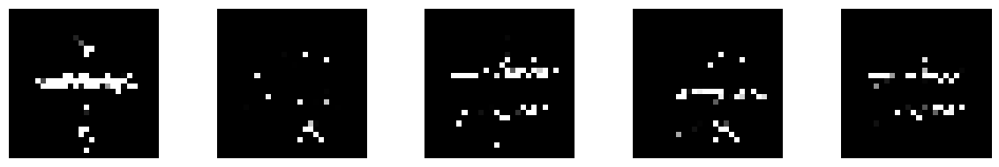

--------------- Epoch 321 ---------------
1/1 [==============================] - 0s 18ms/step


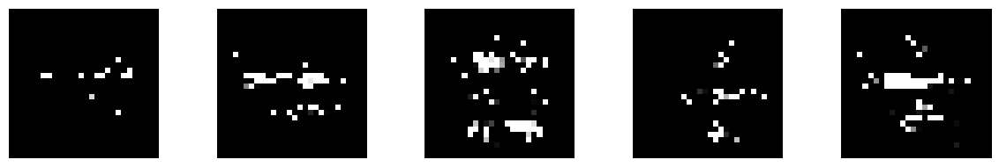

--------------- Epoch 322 ---------------
1/1 [==============================] - 0s 18ms/step


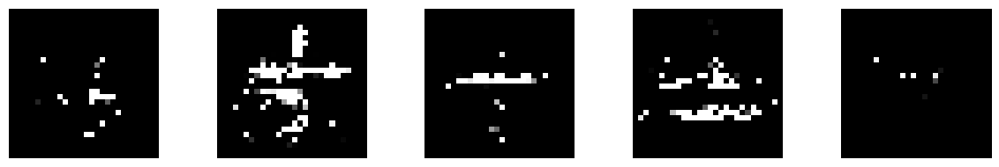

--------------- Epoch 323 ---------------
1/1 [==============================] - 0s 17ms/step


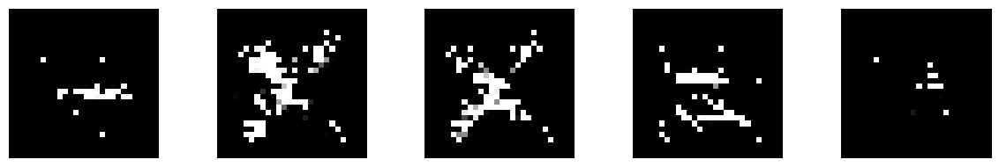

--------------- Epoch 324 ---------------
1/1 [==============================] - 0s 17ms/step


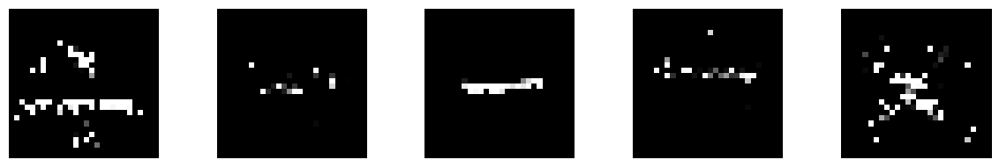

--------------- Epoch 325 ---------------
1/1 [==============================] - 0s 56ms/step


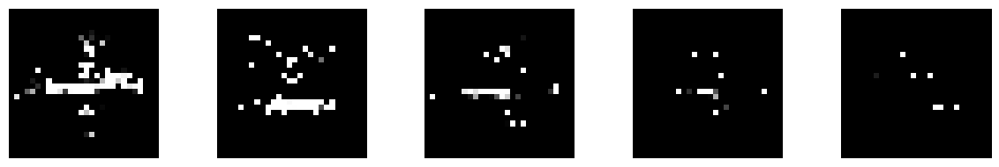

--------------- Epoch 326 ---------------
1/1 [==============================] - 0s 21ms/step


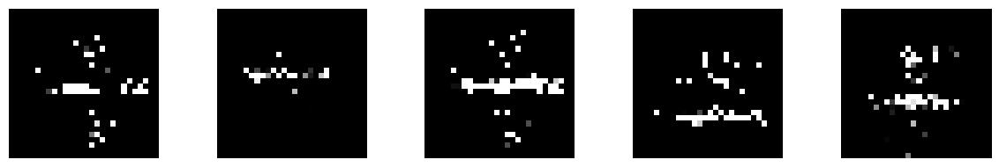

--------------- Epoch 327 ---------------
1/1 [==============================] - 0s 37ms/step


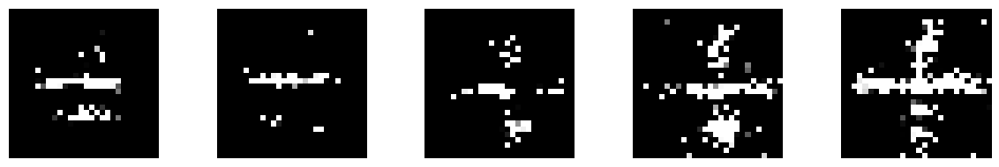

--------------- Epoch 328 ---------------
1/1 [==============================] - 0s 21ms/step


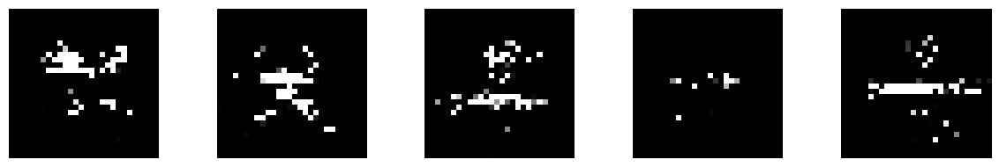

--------------- Epoch 329 ---------------
1/1 [==============================] - 0s 32ms/step


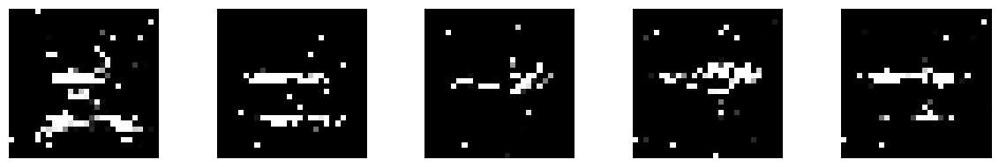

--------------- Epoch 330 ---------------
1/1 [==============================] - 0s 39ms/step


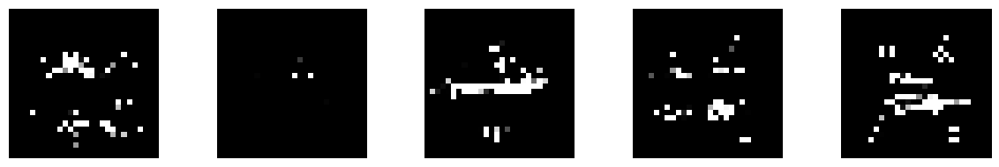

--------------- Epoch 331 ---------------
1/1 [==============================] - 0s 19ms/step


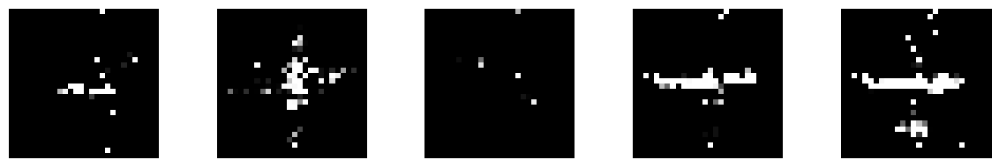

--------------- Epoch 332 ---------------
1/1 [==============================] - 0s 19ms/step


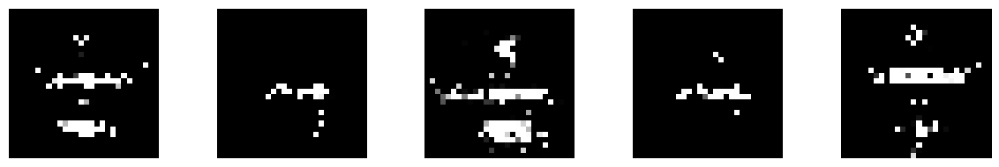

--------------- Epoch 333 ---------------
1/1 [==============================] - 0s 17ms/step


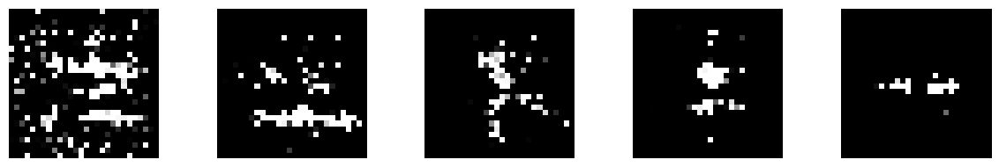

--------------- Epoch 334 ---------------
1/1 [==============================] - 0s 17ms/step


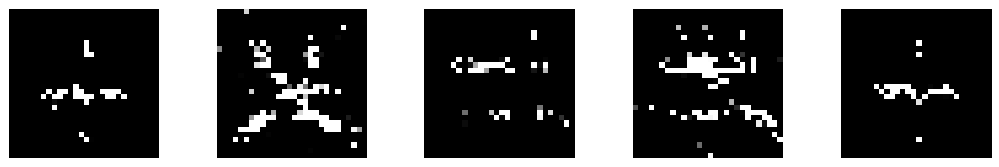

--------------- Epoch 335 ---------------
1/1 [==============================] - 0s 26ms/step


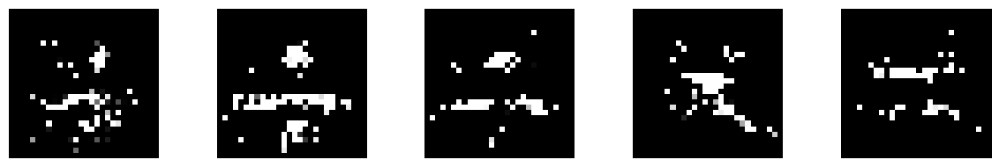

--------------- Epoch 336 ---------------
1/1 [==============================] - 0s 17ms/step


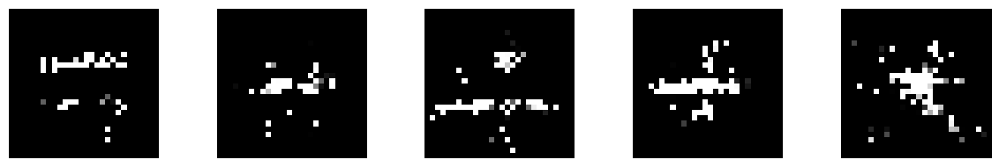

--------------- Epoch 337 ---------------
1/1 [==============================] - 0s 17ms/step


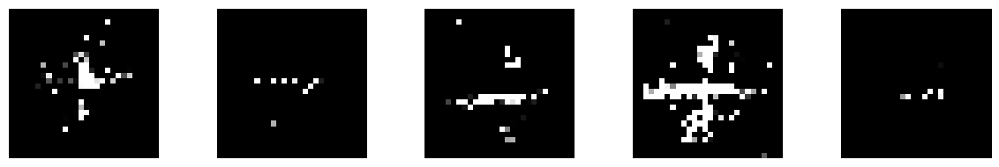

--------------- Epoch 338 ---------------
1/1 [==============================] - 0s 19ms/step


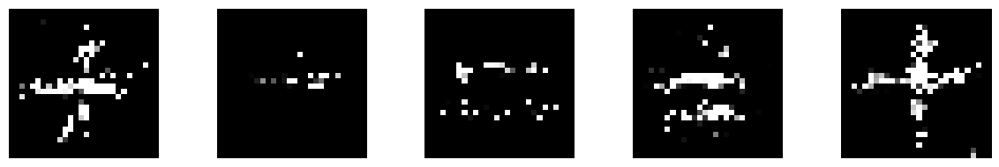

--------------- Epoch 339 ---------------
1/1 [==============================] - 0s 20ms/step


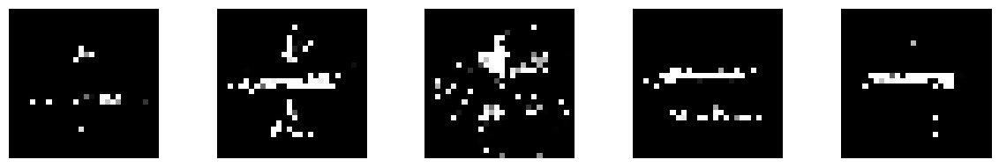

--------------- Epoch 340 ---------------
1/1 [==============================] - 0s 64ms/step


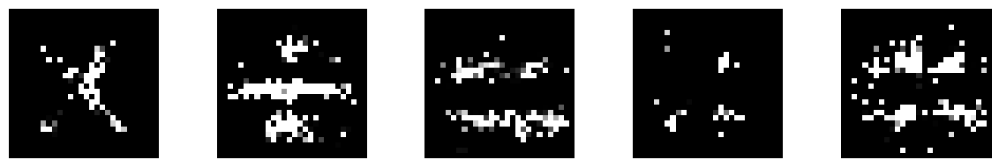

--------------- Epoch 341 ---------------
1/1 [==============================] - 0s 20ms/step


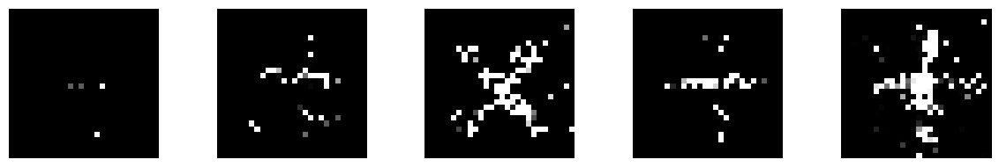

--------------- Epoch 342 ---------------
1/1 [==============================] - 0s 18ms/step


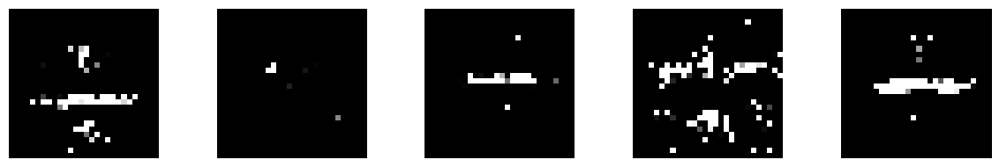

--------------- Epoch 343 ---------------
1/1 [==============================] - 0s 18ms/step


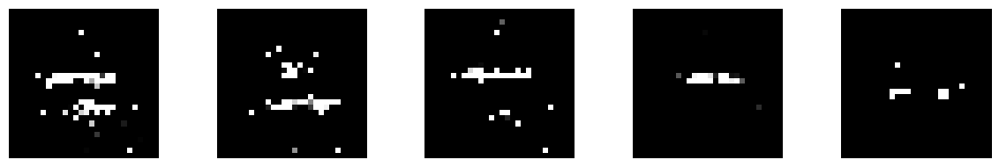

--------------- Epoch 344 ---------------
1/1 [==============================] - 0s 19ms/step


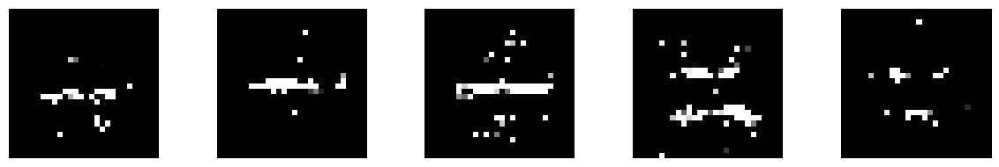

--------------- Epoch 345 ---------------
1/1 [==============================] - 0s 28ms/step


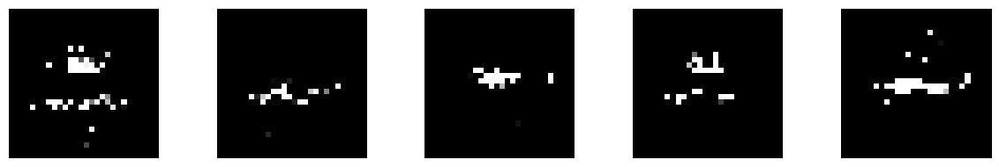

--------------- Epoch 346 ---------------
1/1 [==============================] - 0s 18ms/step


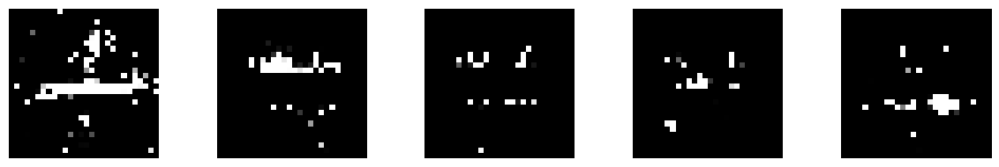

--------------- Epoch 347 ---------------
1/1 [==============================] - 0s 18ms/step


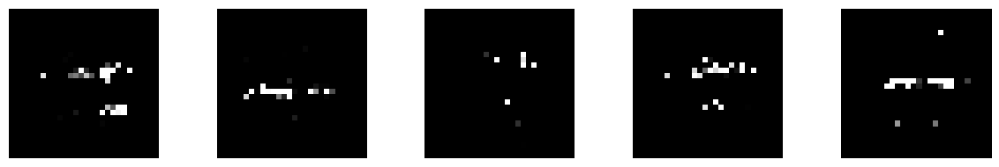

--------------- Epoch 348 ---------------
1/1 [==============================] - 0s 18ms/step


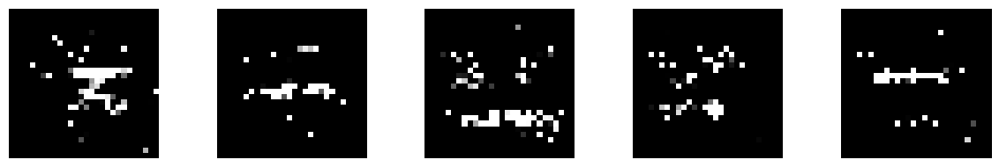

--------------- Epoch 349 ---------------
1/1 [==============================] - 0s 18ms/step


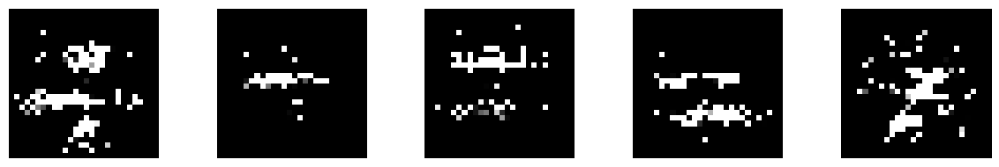

--------------- Epoch 350 ---------------
1/1 [==============================] - 0s 40ms/step


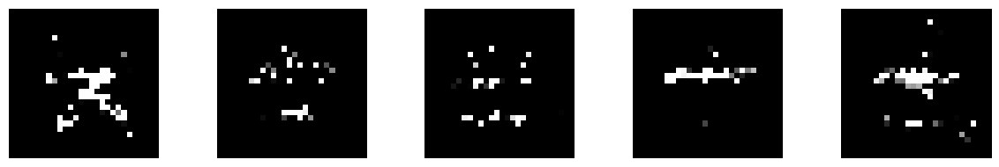

--------------- Epoch 351 ---------------
1/1 [==============================] - 0s 21ms/step


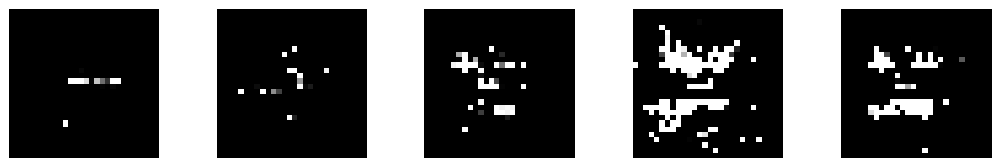

--------------- Epoch 352 ---------------
1/1 [==============================] - 0s 21ms/step


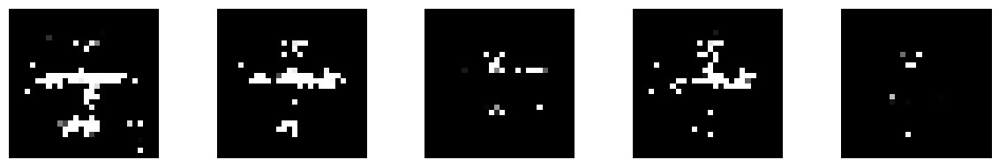

--------------- Epoch 353 ---------------
1/1 [==============================] - 0s 21ms/step


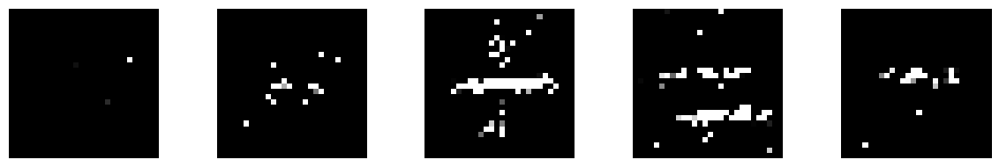

--------------- Epoch 354 ---------------
1/1 [==============================] - 0s 20ms/step


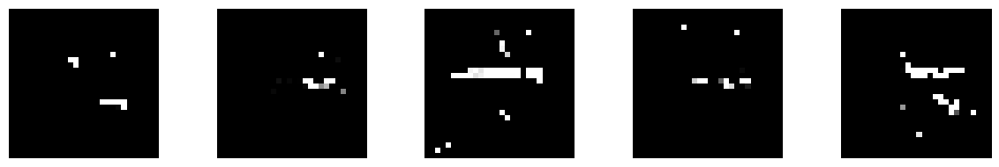

--------------- Epoch 355 ---------------
1/1 [==============================] - 0s 36ms/step


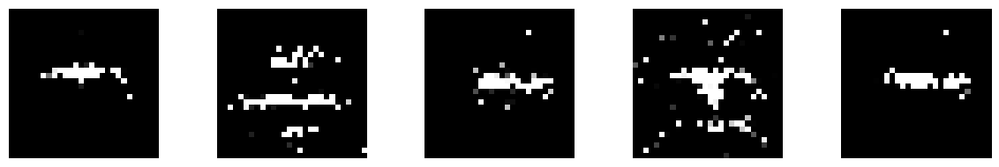

--------------- Epoch 356 ---------------
1/1 [==============================] - 0s 20ms/step


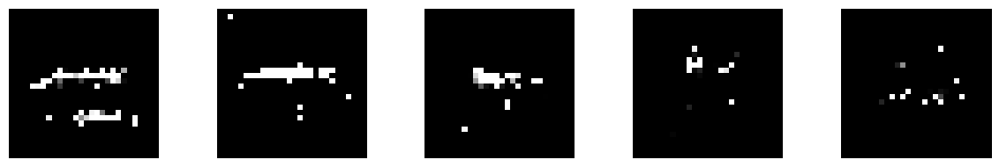

--------------- Epoch 357 ---------------
1/1 [==============================] - 0s 19ms/step


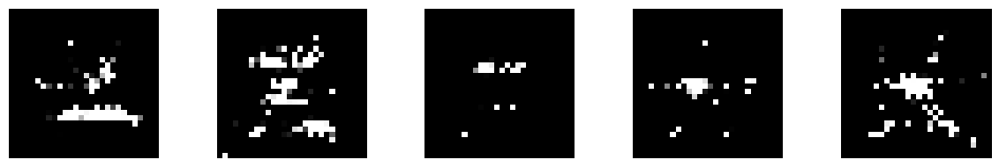

--------------- Epoch 358 ---------------
1/1 [==============================] - 0s 18ms/step


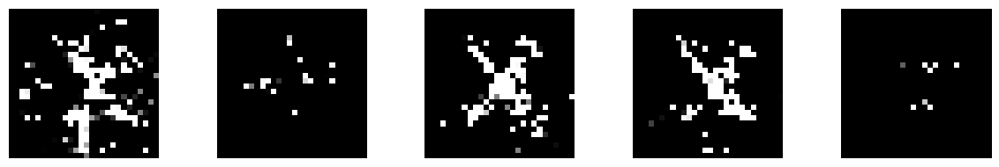

--------------- Epoch 359 ---------------
1/1 [==============================] - 0s 20ms/step


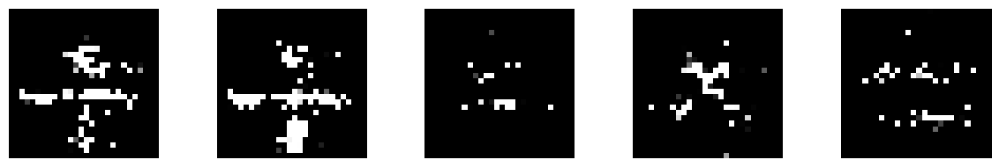

--------------- Epoch 360 ---------------
1/1 [==============================] - 0s 41ms/step


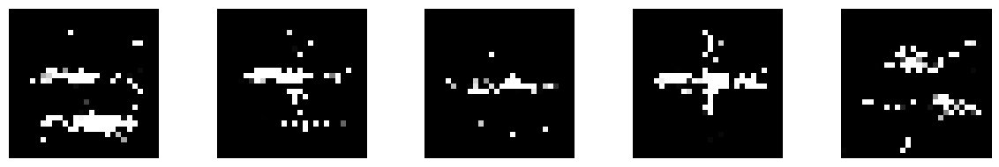

--------------- Epoch 361 ---------------
1/1 [==============================] - 0s 20ms/step


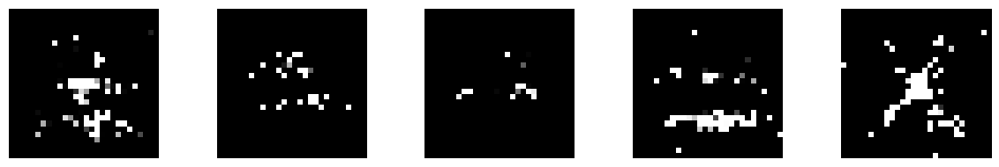

--------------- Epoch 362 ---------------
1/1 [==============================] - 0s 18ms/step


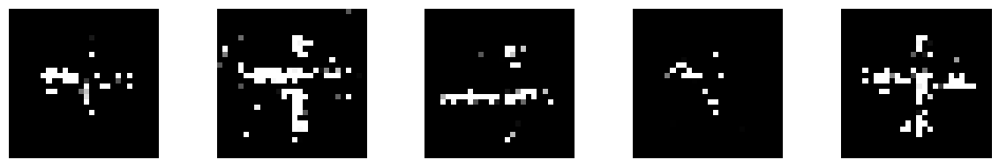

--------------- Epoch 363 ---------------
1/1 [==============================] - 0s 21ms/step


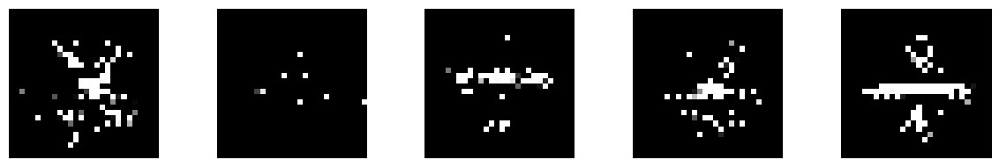

--------------- Epoch 364 ---------------
1/1 [==============================] - 0s 22ms/step


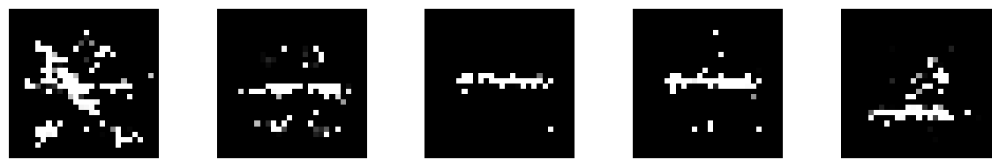

--------------- Epoch 365 ---------------
1/1 [==============================] - 0s 41ms/step


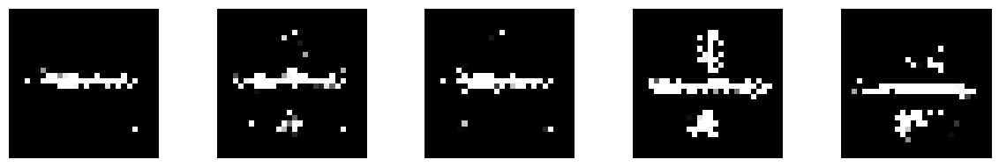

--------------- Epoch 366 ---------------
1/1 [==============================] - 0s 21ms/step


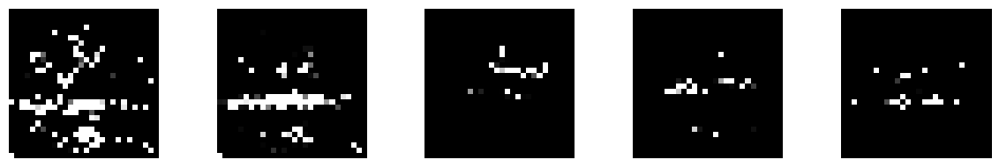

--------------- Epoch 367 ---------------
1/1 [==============================] - 0s 19ms/step


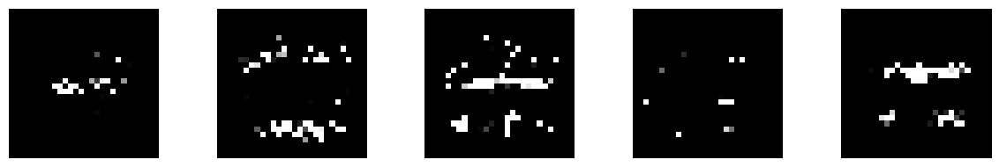

--------------- Epoch 368 ---------------
1/1 [==============================] - 0s 19ms/step


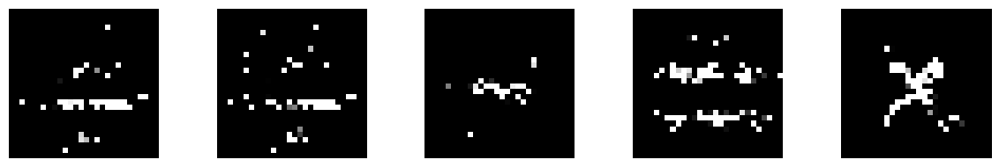

--------------- Epoch 369 ---------------
1/1 [==============================] - 0s 19ms/step


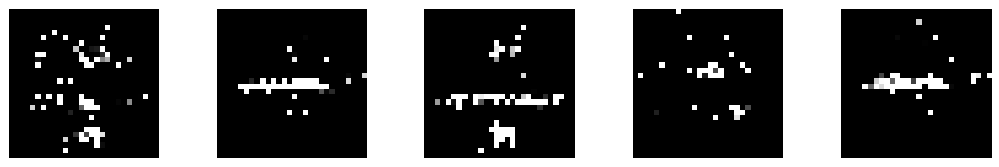

--------------- Epoch 370 ---------------
1/1 [==============================] - 0s 34ms/step


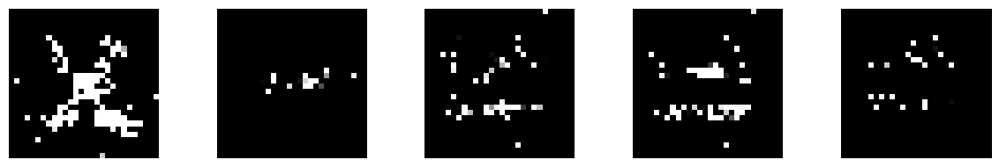

--------------- Epoch 371 ---------------
1/1 [==============================] - 0s 17ms/step


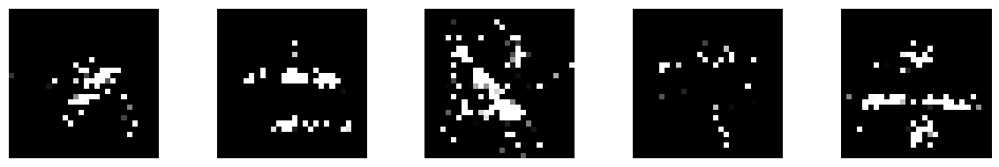

--------------- Epoch 372 ---------------
1/1 [==============================] - 0s 19ms/step


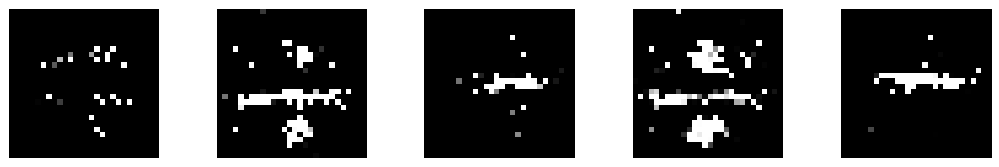

--------------- Epoch 373 ---------------
1/1 [==============================] - 0s 16ms/step


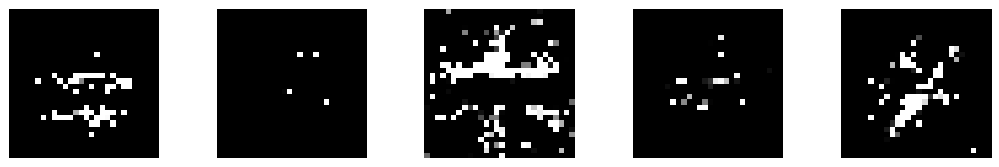

--------------- Epoch 374 ---------------
1/1 [==============================] - 0s 24ms/step


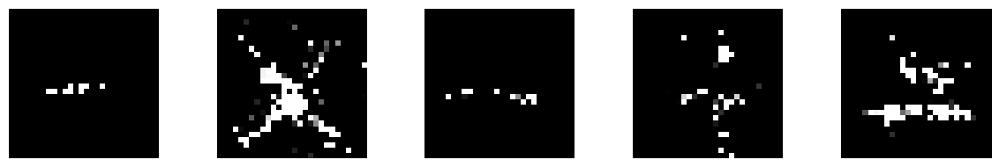

--------------- Epoch 375 ---------------
1/1 [==============================] - 0s 30ms/step


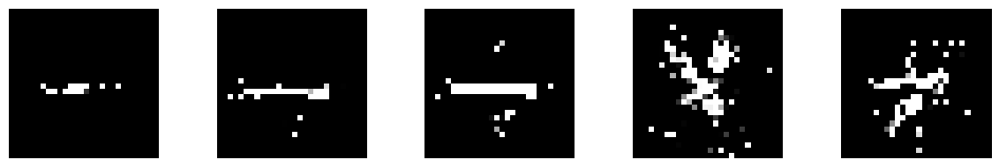

--------------- Epoch 376 ---------------
1/1 [==============================] - 0s 22ms/step


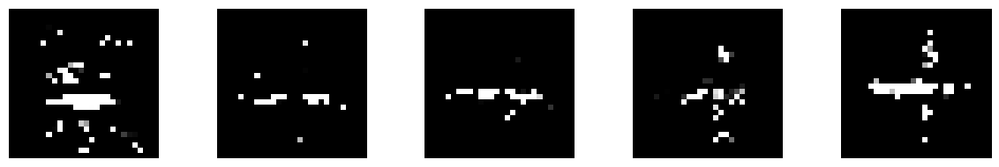

--------------- Epoch 377 ---------------
1/1 [==============================] - 0s 27ms/step


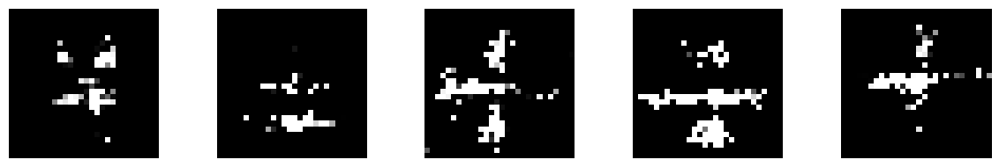

--------------- Epoch 378 ---------------
1/1 [==============================] - 0s 21ms/step


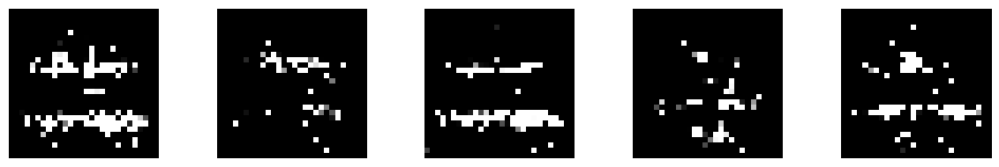

--------------- Epoch 379 ---------------
1/1 [==============================] - 0s 42ms/step


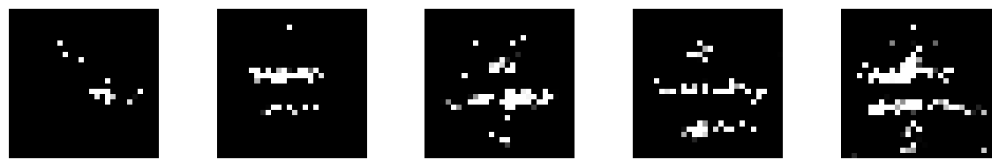

--------------- Epoch 380 ---------------
1/1 [==============================] - 0s 17ms/step


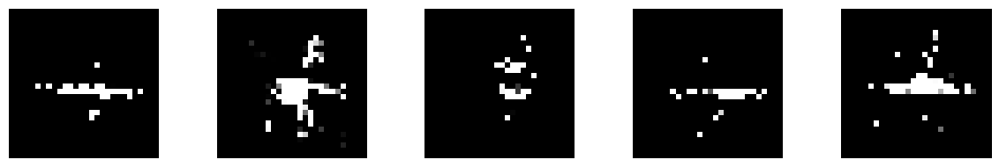

--------------- Epoch 381 ---------------
1/1 [==============================] - 0s 18ms/step


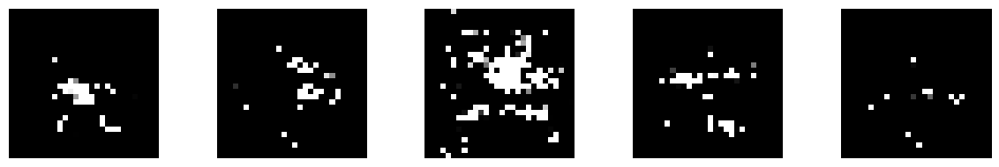

--------------- Epoch 382 ---------------
1/1 [==============================] - 0s 18ms/step


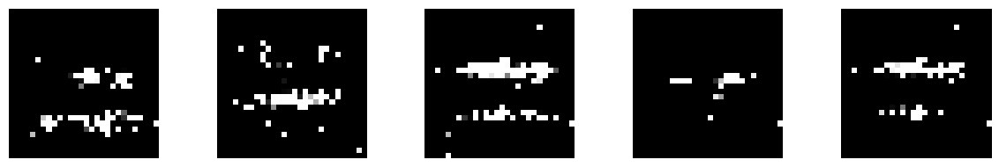

--------------- Epoch 383 ---------------
1/1 [==============================] - 0s 24ms/step


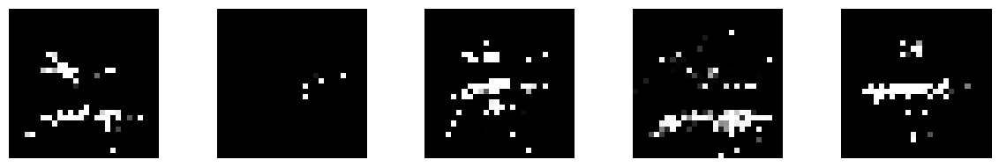

--------------- Epoch 384 ---------------
1/1 [==============================] - 0s 27ms/step


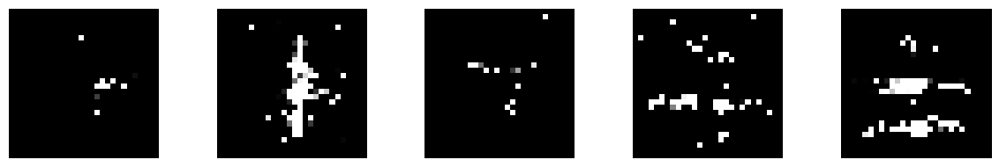

--------------- Epoch 385 ---------------
1/1 [==============================] - 0s 41ms/step


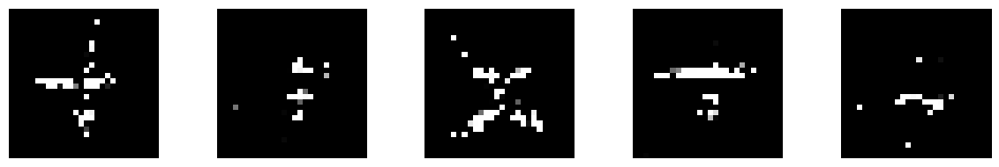

--------------- Epoch 386 ---------------
1/1 [==============================] - 0s 17ms/step


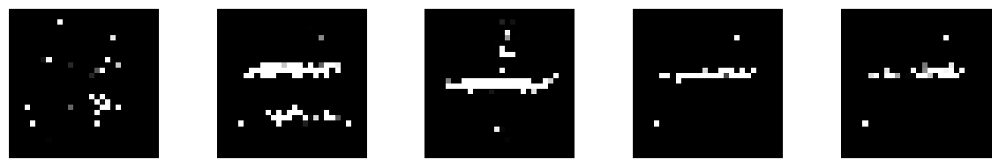

--------------- Epoch 387 ---------------
1/1 [==============================] - 0s 18ms/step


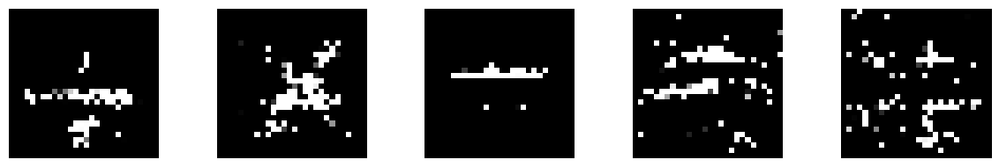

--------------- Epoch 388 ---------------
1/1 [==============================] - 0s 23ms/step


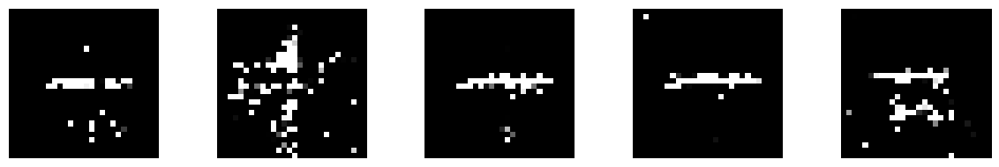

--------------- Epoch 389 ---------------
1/1 [==============================] - 0s 38ms/step


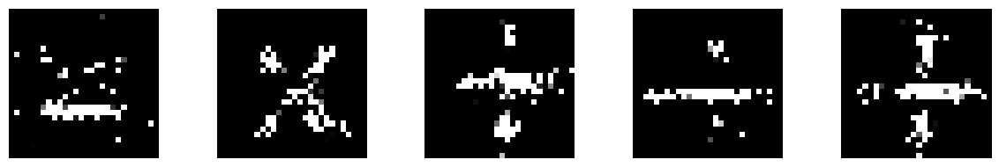

--------------- Epoch 390 ---------------
1/1 [==============================] - 0s 22ms/step


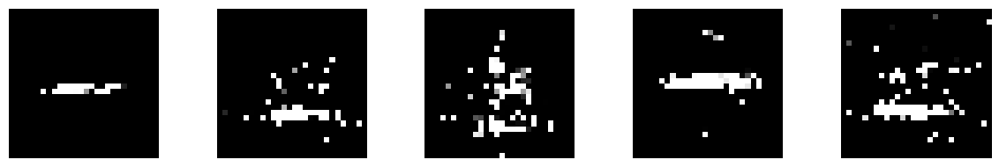

--------------- Epoch 391 ---------------
1/1 [==============================] - 0s 19ms/step


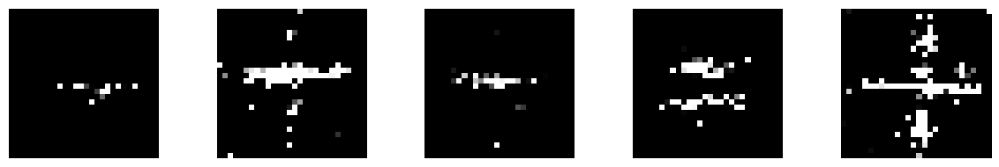

--------------- Epoch 392 ---------------
1/1 [==============================] - 0s 18ms/step


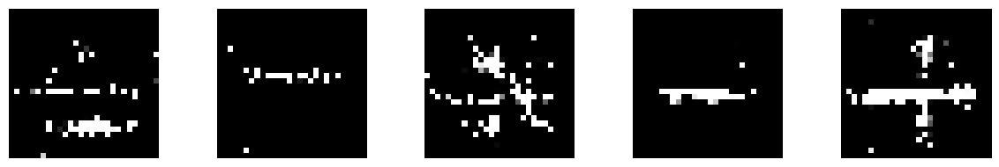

--------------- Epoch 393 ---------------
1/1 [==============================] - 0s 19ms/step


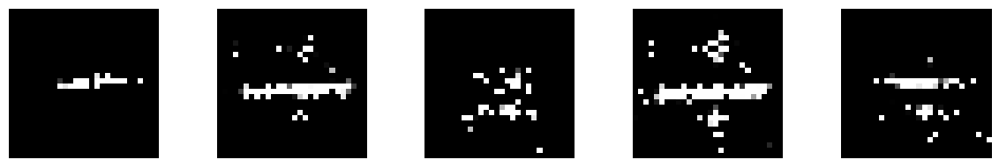

--------------- Epoch 394 ---------------
1/1 [==============================] - 0s 43ms/step


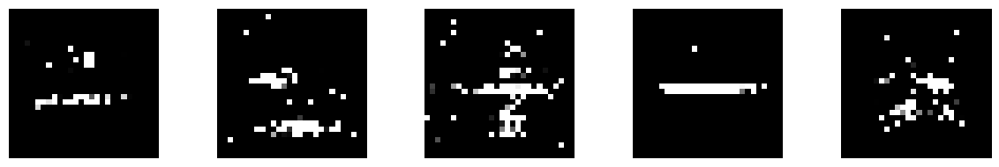

--------------- Epoch 395 ---------------
1/1 [==============================] - 0s 18ms/step


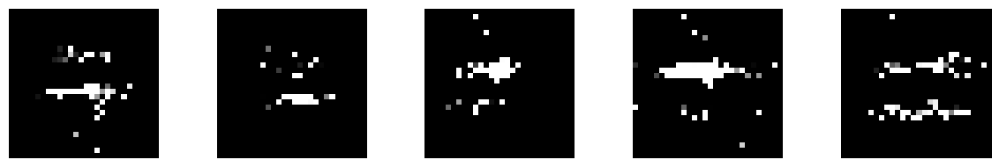

--------------- Epoch 396 ---------------
1/1 [==============================] - 0s 26ms/step


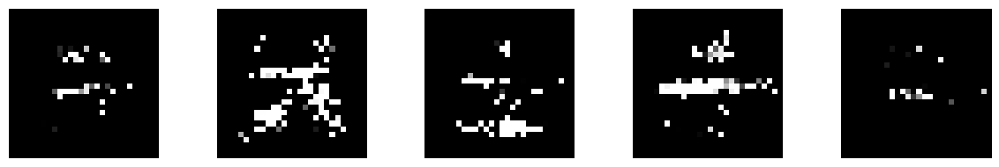

--------------- Epoch 397 ---------------
1/1 [==============================] - 0s 18ms/step


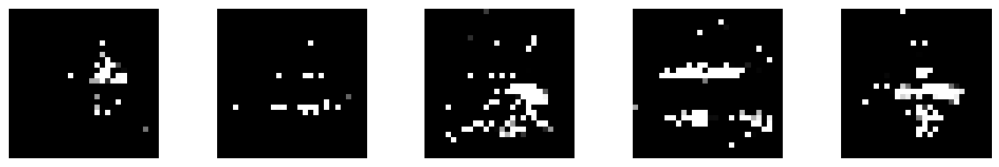

--------------- Epoch 398 ---------------
1/1 [==============================] - 0s 18ms/step


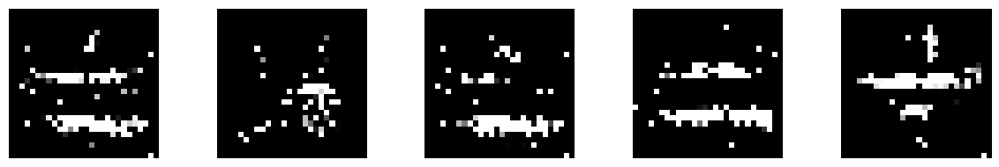

--------------- Epoch 399 ---------------
1/1 [==============================] - 0s 26ms/step


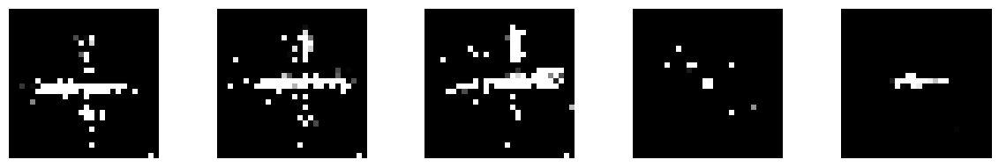

--------------- Epoch 400 ---------------
1/1 [==============================] - 0s 18ms/step


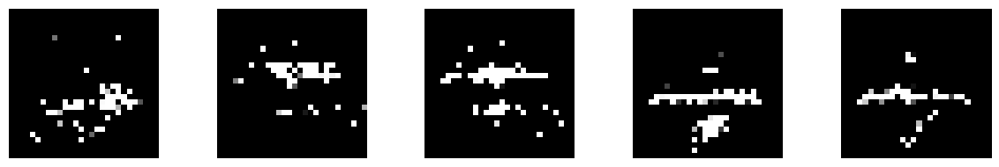

--------------- Epoch 401 ---------------
1/1 [==============================] - 0s 21ms/step


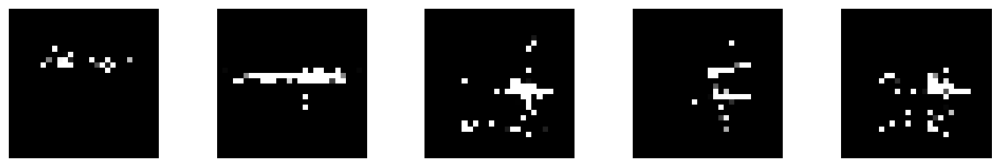

--------------- Epoch 402 ---------------
1/1 [==============================] - 0s 20ms/step


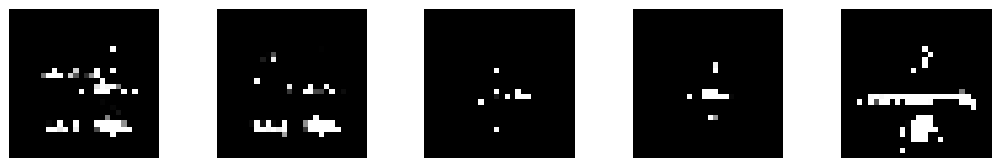

--------------- Epoch 403 ---------------
1/1 [==============================] - 0s 20ms/step


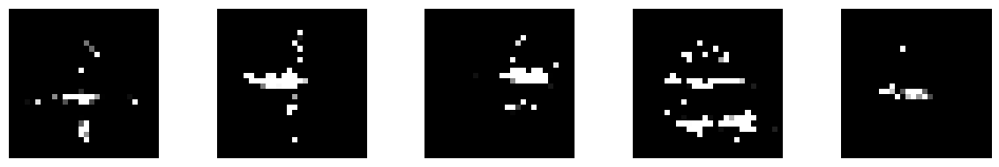

--------------- Epoch 404 ---------------
1/1 [==============================] - 0s 30ms/step


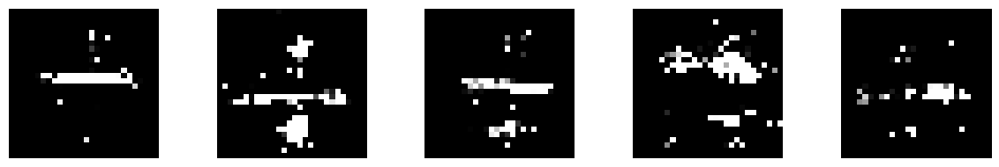

--------------- Epoch 405 ---------------
1/1 [==============================] - 0s 19ms/step


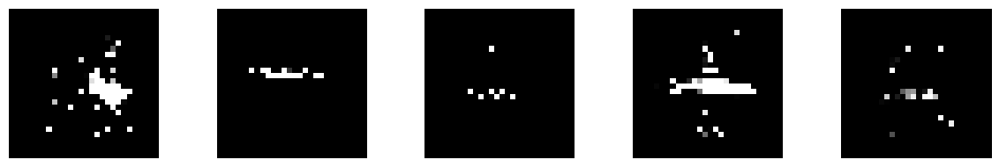

--------------- Epoch 406 ---------------
1/1 [==============================] - 0s 19ms/step


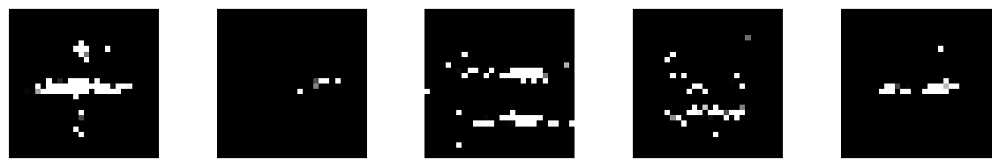

--------------- Epoch 407 ---------------
1/1 [==============================] - 0s 18ms/step


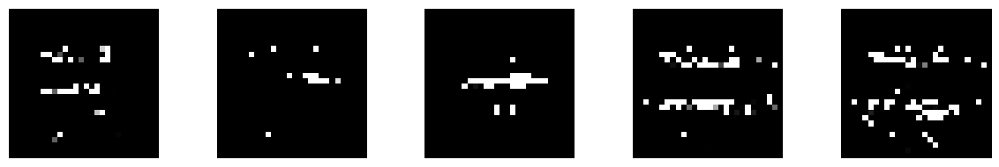

--------------- Epoch 408 ---------------
1/1 [==============================] - 0s 17ms/step


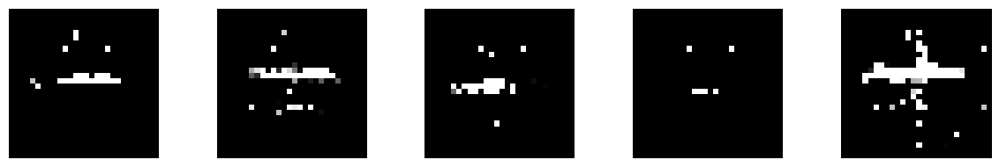

--------------- Epoch 409 ---------------
1/1 [==============================] - 0s 26ms/step


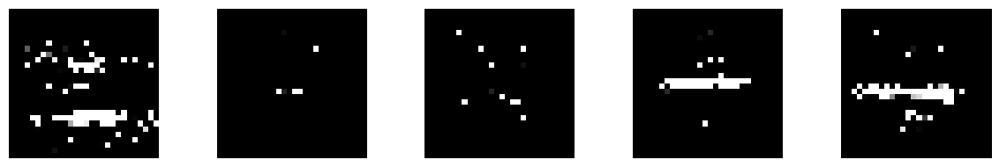

--------------- Epoch 410 ---------------
1/1 [==============================] - 0s 18ms/step


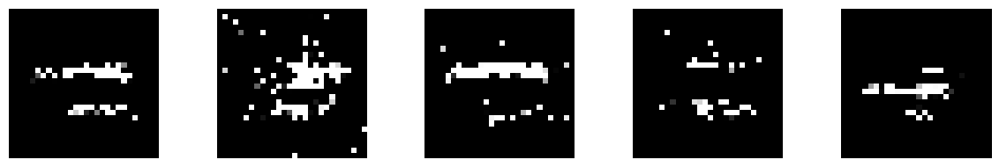

--------------- Epoch 411 ---------------
1/1 [==============================] - 0s 23ms/step


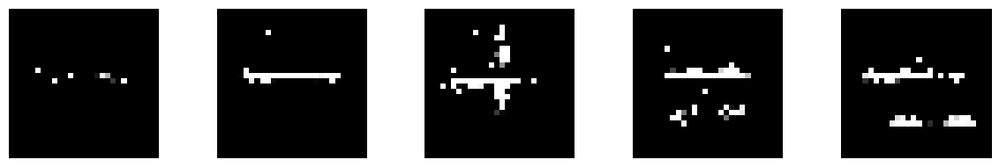

--------------- Epoch 412 ---------------
1/1 [==============================] - 0s 33ms/step


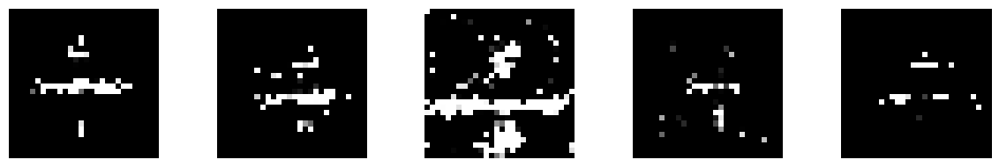

--------------- Epoch 413 ---------------
1/1 [==============================] - 0s 20ms/step


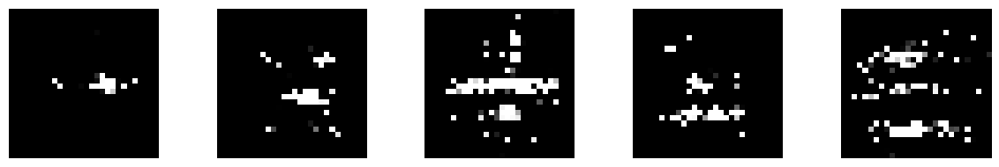

--------------- Epoch 414 ---------------
1/1 [==============================] - 0s 30ms/step


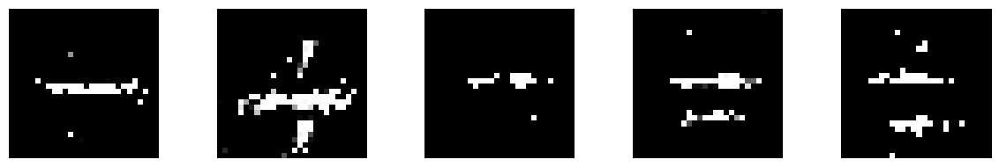

--------------- Epoch 415 ---------------
1/1 [==============================] - 0s 20ms/step


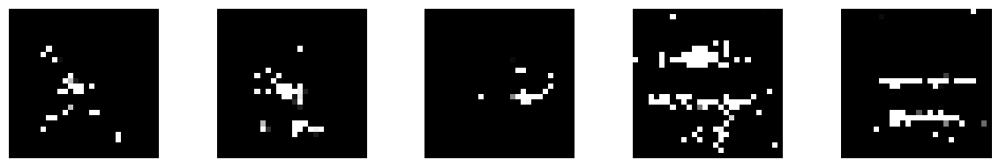

--------------- Epoch 416 ---------------
1/1 [==============================] - 0s 20ms/step


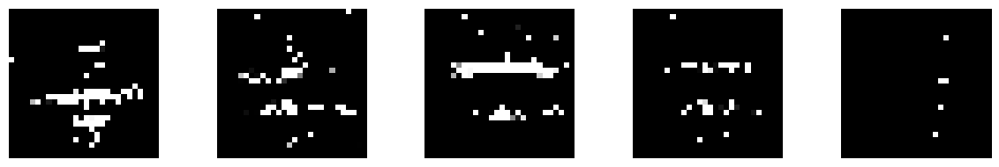

--------------- Epoch 417 ---------------
1/1 [==============================] - 0s 21ms/step


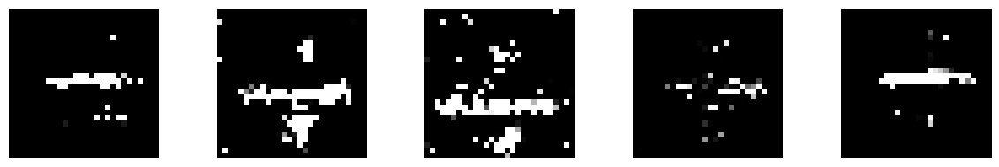

--------------- Epoch 418 ---------------
1/1 [==============================] - 0s 18ms/step


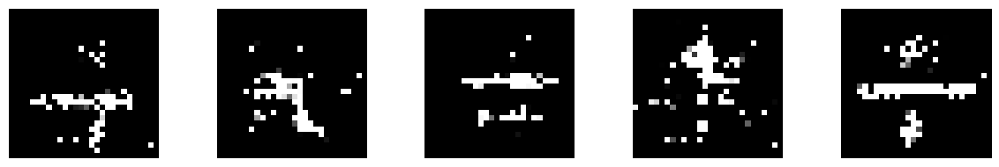

--------------- Epoch 419 ---------------
1/1 [==============================] - 0s 38ms/step


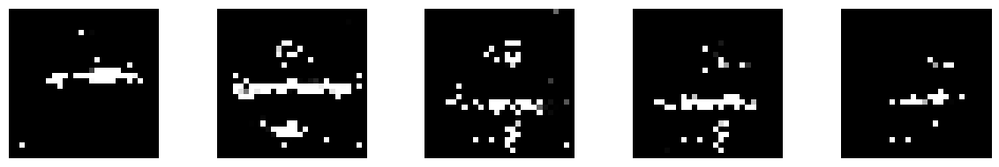

--------------- Epoch 420 ---------------
1/1 [==============================] - 0s 18ms/step


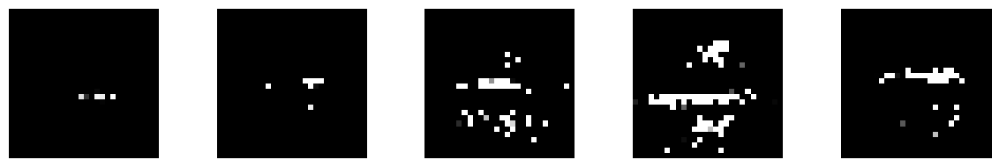

--------------- Epoch 421 ---------------
1/1 [==============================] - 0s 18ms/step


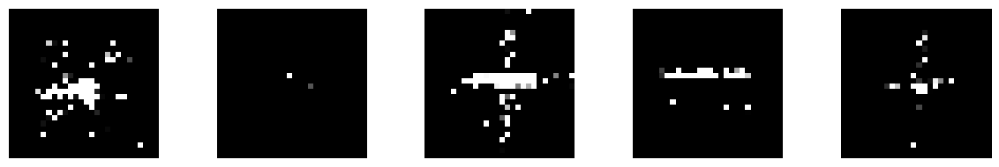

--------------- Epoch 422 ---------------
1/1 [==============================] - 0s 28ms/step


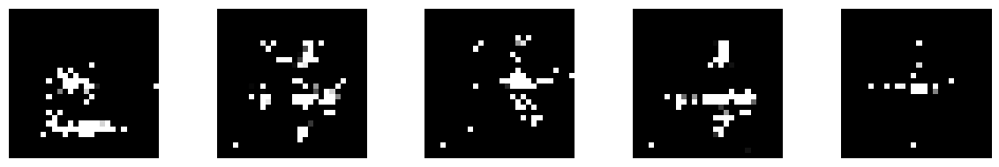

--------------- Epoch 423 ---------------
1/1 [==============================] - 0s 18ms/step


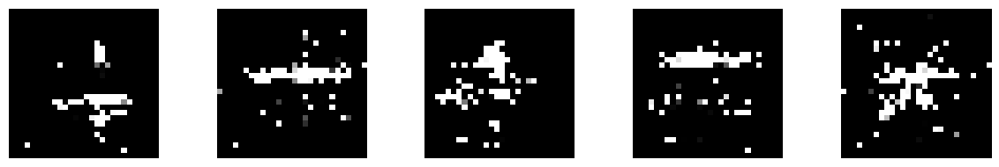

--------------- Epoch 424 ---------------
1/1 [==============================] - 0s 29ms/step


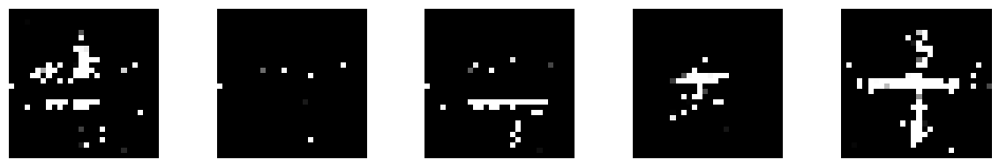

--------------- Epoch 425 ---------------
1/1 [==============================] - 0s 29ms/step


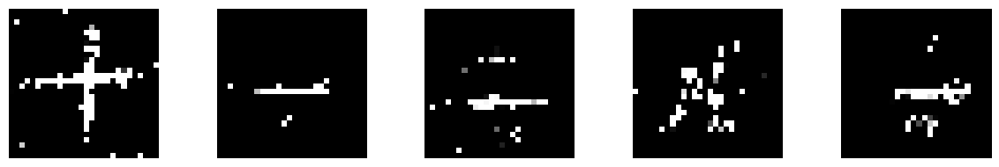

--------------- Epoch 426 ---------------
1/1 [==============================] - 0s 21ms/step


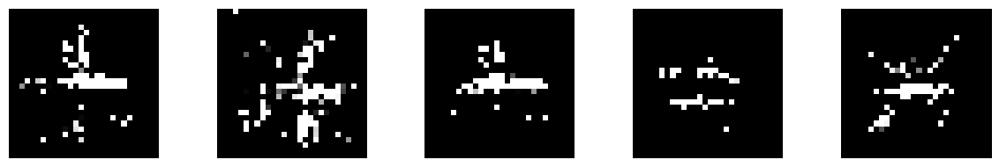

--------------- Epoch 427 ---------------
1/1 [==============================] - 0s 20ms/step


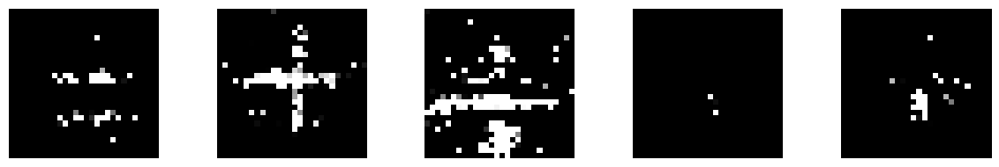

--------------- Epoch 428 ---------------
1/1 [==============================] - 0s 22ms/step


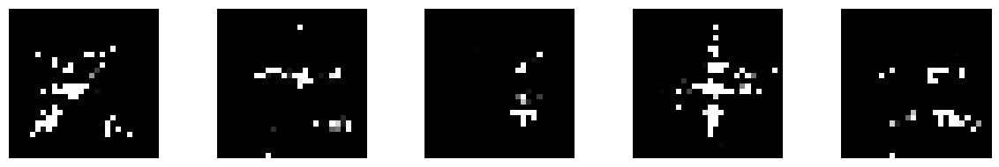

--------------- Epoch 429 ---------------
1/1 [==============================] - 0s 30ms/step


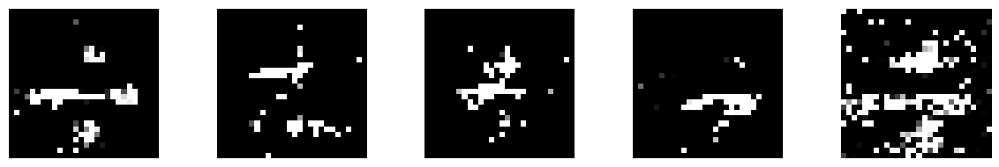

--------------- Epoch 430 ---------------
1/1 [==============================] - 0s 31ms/step


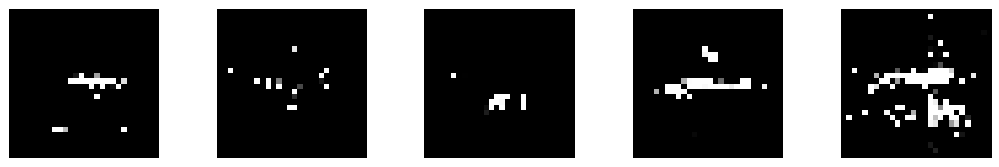

--------------- Epoch 431 ---------------
1/1 [==============================] - 0s 23ms/step


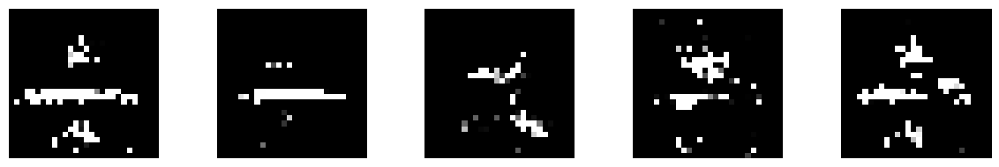

--------------- Epoch 432 ---------------
1/1 [==============================] - 0s 23ms/step


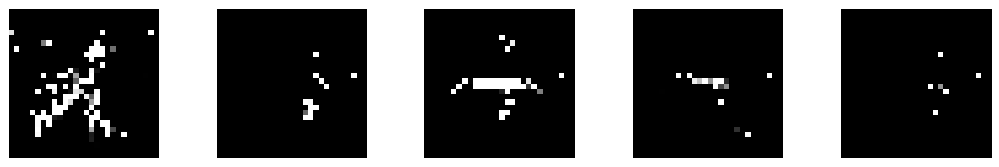

--------------- Epoch 433 ---------------
1/1 [==============================] - 0s 26ms/step


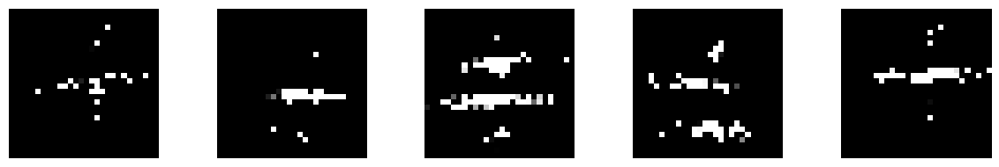

--------------- Epoch 434 ---------------
1/1 [==============================] - 0s 20ms/step


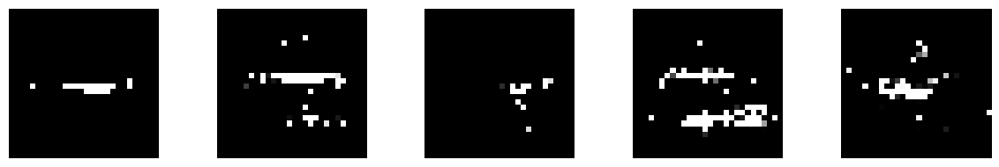

--------------- Epoch 435 ---------------
1/1 [==============================] - 0s 46ms/step


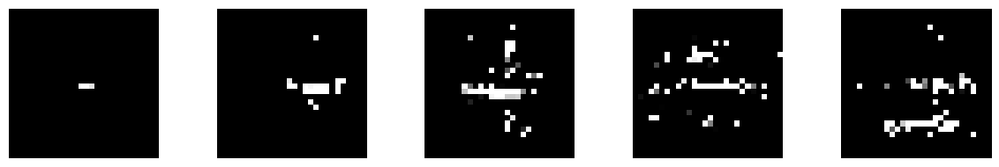

--------------- Epoch 436 ---------------
1/1 [==============================] - 0s 29ms/step


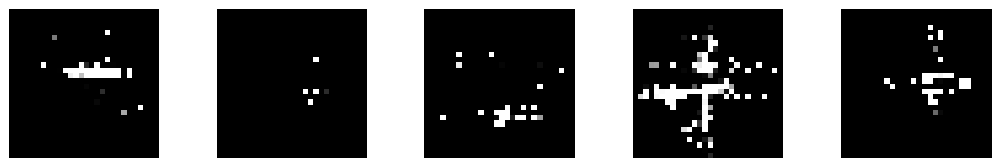

--------------- Epoch 437 ---------------
1/1 [==============================] - 0s 22ms/step


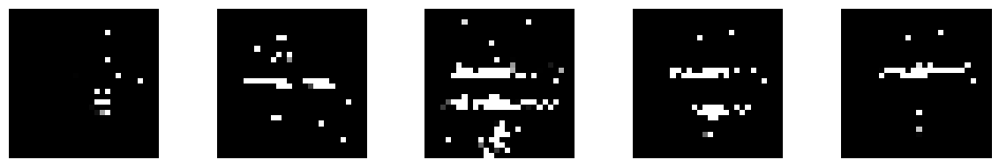

--------------- Epoch 438 ---------------
1/1 [==============================] - 0s 19ms/step


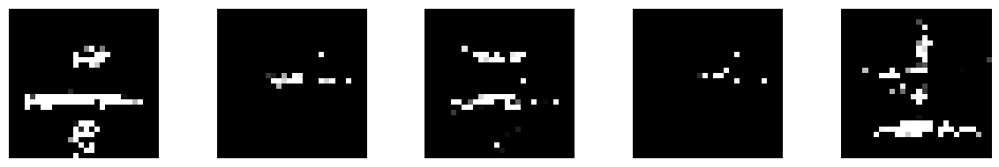

--------------- Epoch 439 ---------------
1/1 [==============================] - 0s 28ms/step


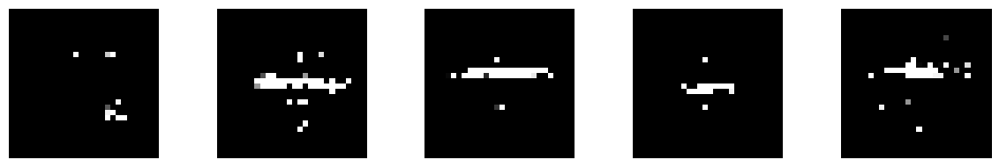

--------------- Epoch 440 ---------------
1/1 [==============================] - 0s 21ms/step


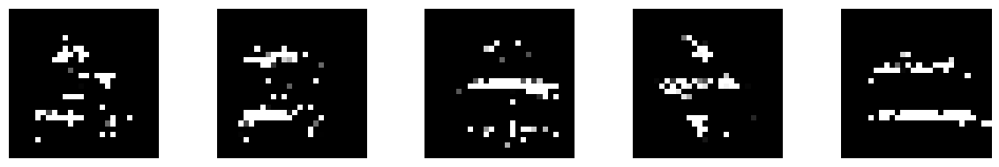

--------------- Epoch 441 ---------------
1/1 [==============================] - 0s 24ms/step


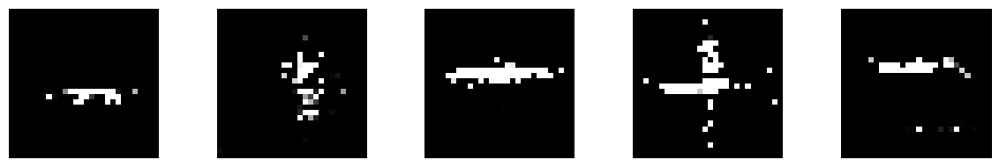

--------------- Epoch 442 ---------------
1/1 [==============================] - 0s 20ms/step


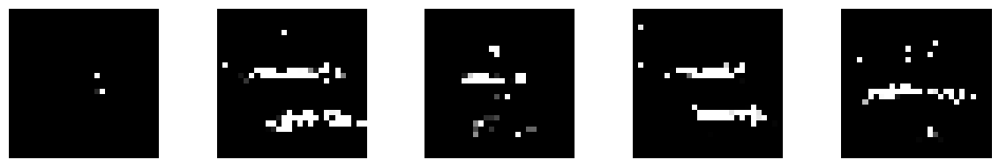

--------------- Epoch 443 ---------------
1/1 [==============================] - 0s 23ms/step


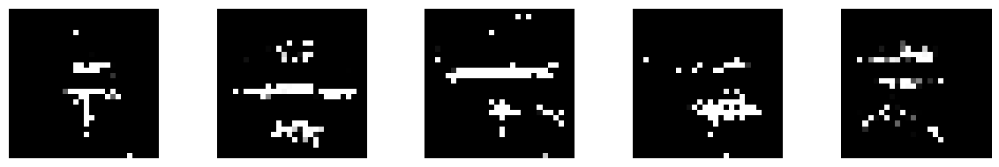

--------------- Epoch 444 ---------------
1/1 [==============================] - 0s 33ms/step


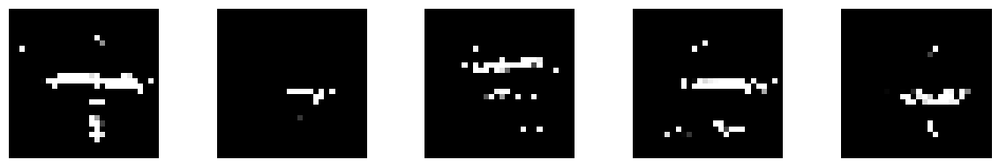

--------------- Epoch 445 ---------------
1/1 [==============================] - 0s 32ms/step


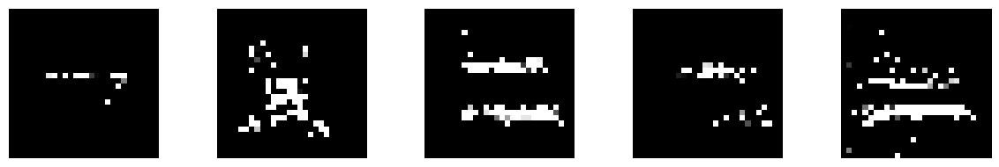

--------------- Epoch 446 ---------------
1/1 [==============================] - 0s 27ms/step


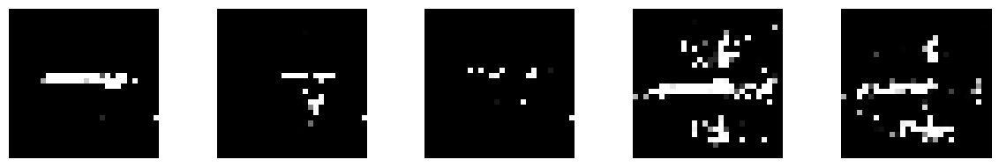

--------------- Epoch 447 ---------------
1/1 [==============================] - 0s 17ms/step


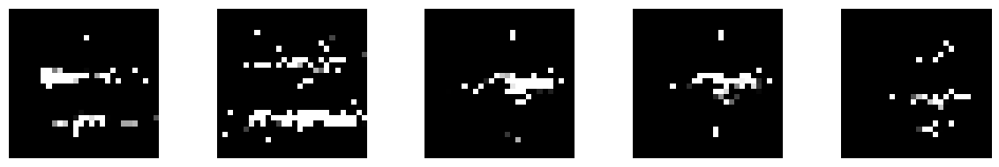

--------------- Epoch 448 ---------------
1/1 [==============================] - 0s 34ms/step


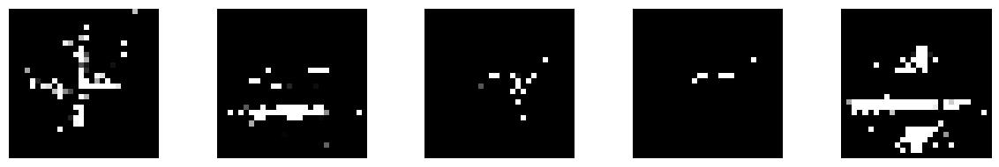

--------------- Epoch 449 ---------------
1/1 [==============================] - 0s 19ms/step


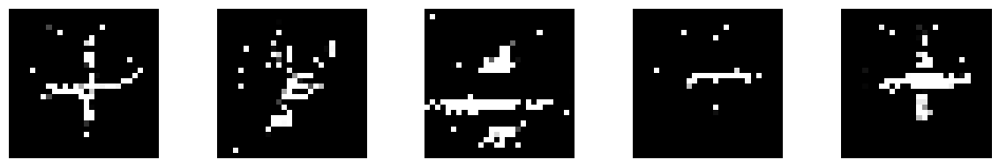

--------------- Epoch 450 ---------------
1/1 [==============================] - 0s 43ms/step


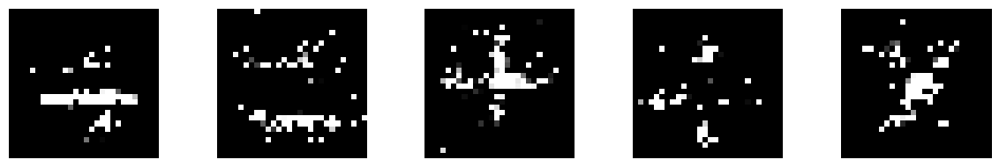

--------------- Epoch 451 ---------------
1/1 [==============================] - 0s 19ms/step


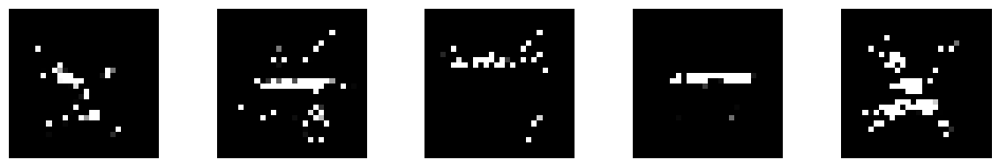

--------------- Epoch 452 ---------------
1/1 [==============================] - 0s 21ms/step


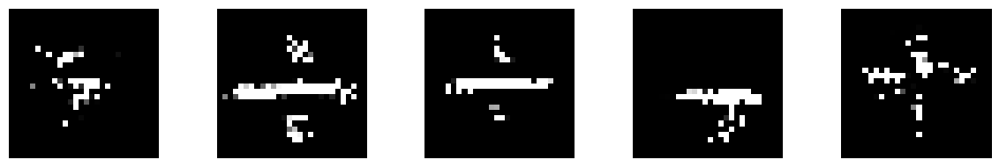

--------------- Epoch 453 ---------------
1/1 [==============================] - 0s 21ms/step


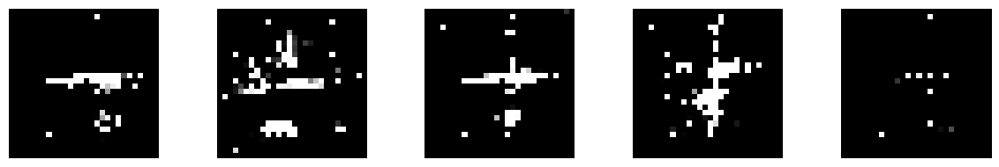

--------------- Epoch 454 ---------------
1/1 [==============================] - 0s 23ms/step


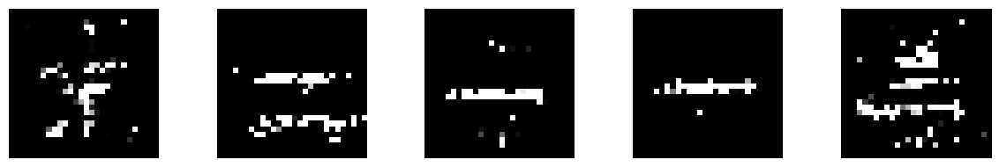

--------------- Epoch 455 ---------------
1/1 [==============================] - 0s 45ms/step


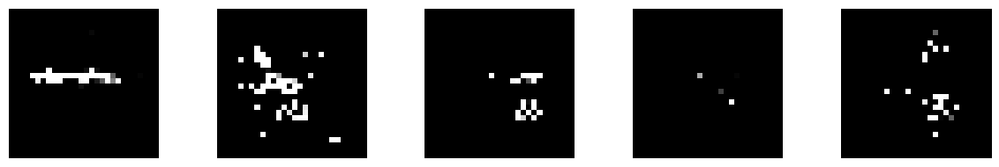

--------------- Epoch 456 ---------------
1/1 [==============================] - 0s 19ms/step


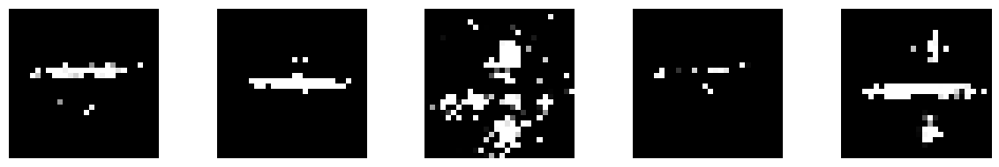

--------------- Epoch 457 ---------------
1/1 [==============================] - 0s 25ms/step


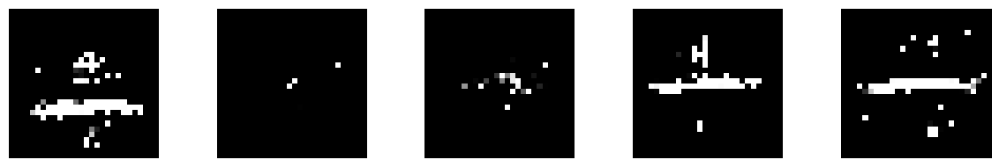

--------------- Epoch 458 ---------------
1/1 [==============================] - 0s 18ms/step


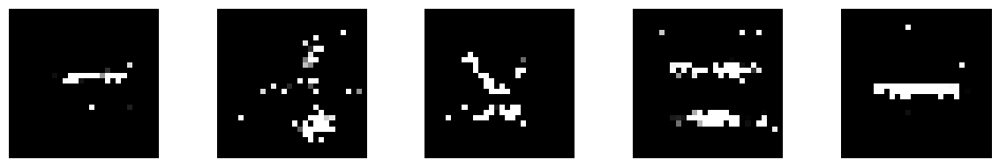

--------------- Epoch 459 ---------------
1/1 [==============================] - 0s 17ms/step


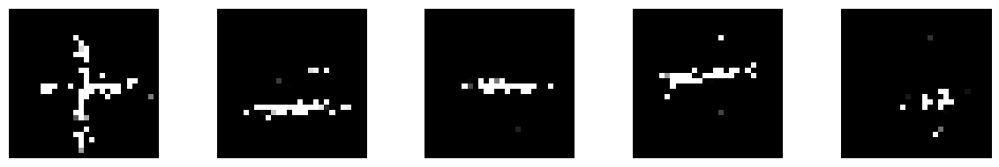

--------------- Epoch 460 ---------------
1/1 [==============================] - 0s 26ms/step


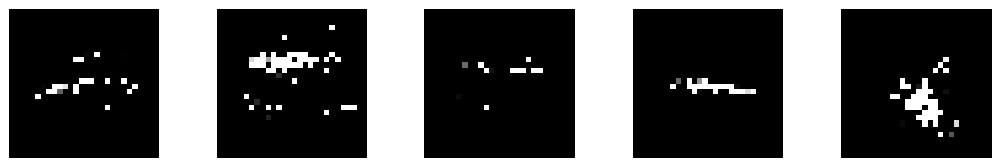

--------------- Epoch 461 ---------------
1/1 [==============================] - 0s 20ms/step


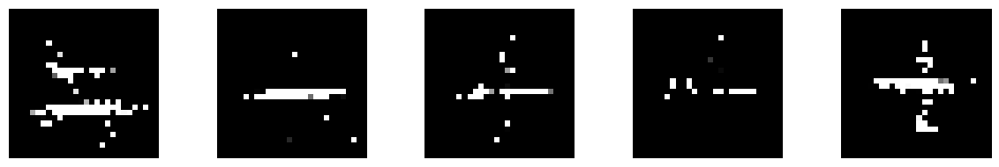

--------------- Epoch 462 ---------------
1/1 [==============================] - 0s 27ms/step


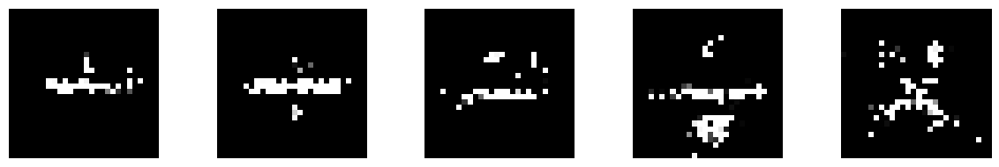

--------------- Epoch 463 ---------------
1/1 [==============================] - 0s 20ms/step


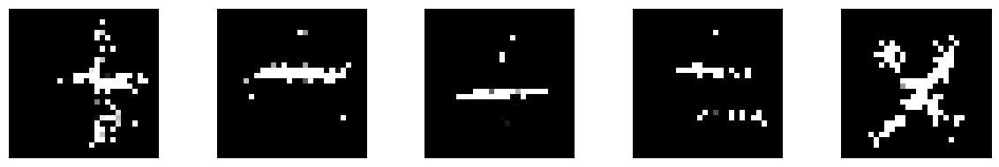

--------------- Epoch 464 ---------------
1/1 [==============================] - 0s 20ms/step


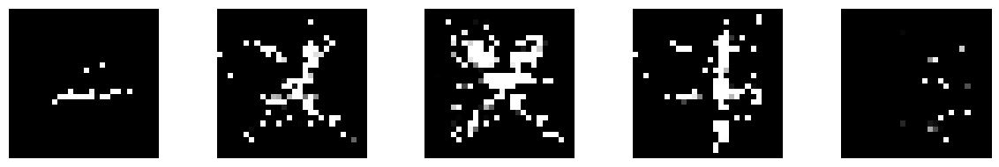

--------------- Epoch 465 ---------------
1/1 [==============================] - 0s 28ms/step


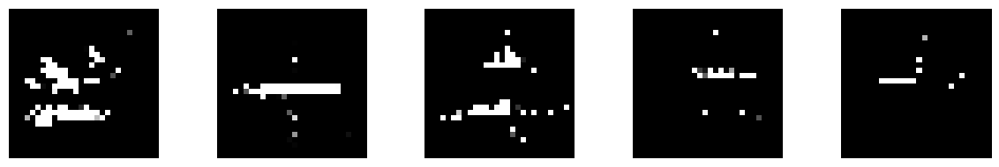

--------------- Epoch 466 ---------------
1/1 [==============================] - 0s 24ms/step


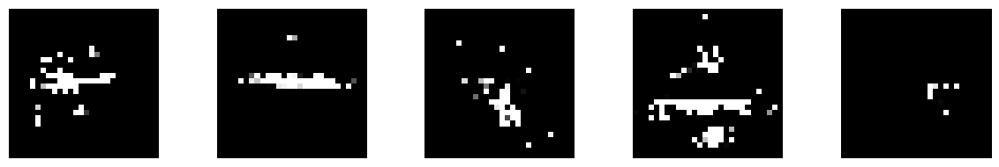

--------------- Epoch 467 ---------------
1/1 [==============================] - 0s 20ms/step


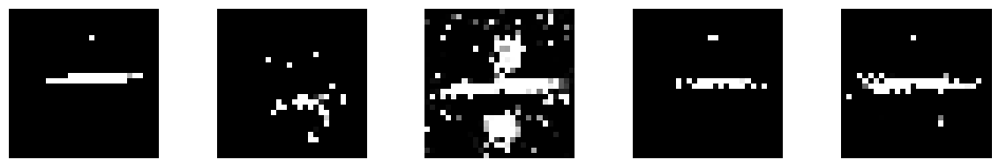

--------------- Epoch 468 ---------------
1/1 [==============================] - 0s 21ms/step


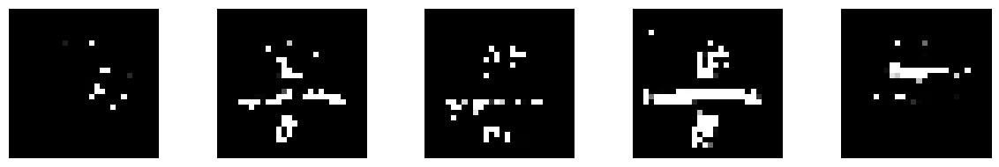

--------------- Epoch 469 ---------------
1/1 [==============================] - 0s 19ms/step


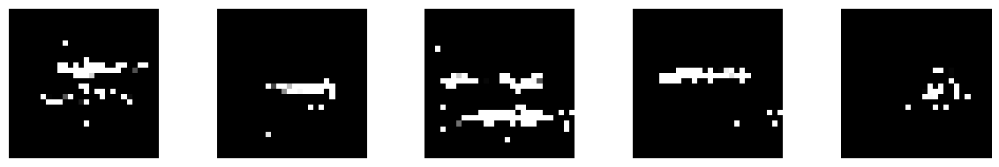

--------------- Epoch 470 ---------------
1/1 [==============================] - 0s 34ms/step


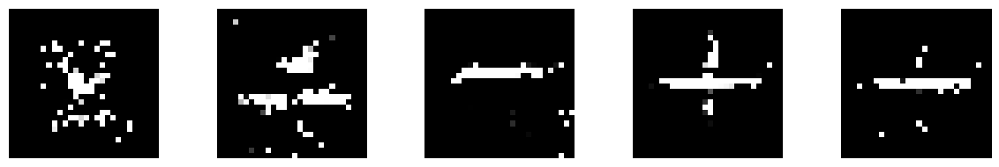

--------------- Epoch 471 ---------------
1/1 [==============================] - 0s 20ms/step


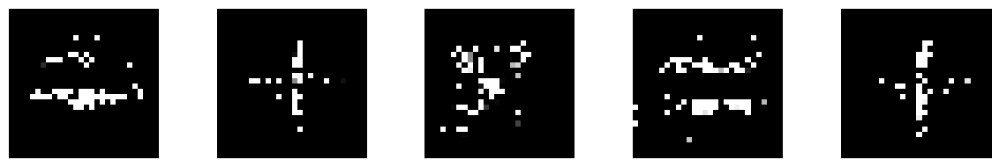

--------------- Epoch 472 ---------------
1/1 [==============================] - 0s 22ms/step


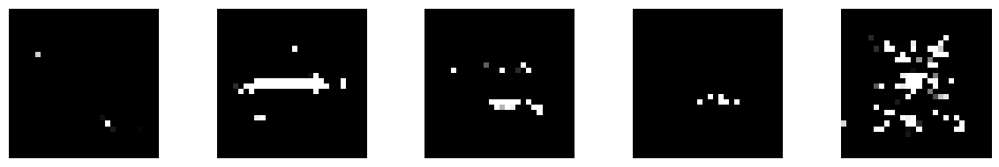

--------------- Epoch 473 ---------------
1/1 [==============================] - 0s 25ms/step


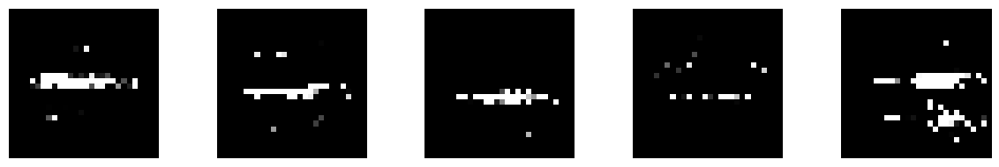

--------------- Epoch 474 ---------------
1/1 [==============================] - 0s 18ms/step


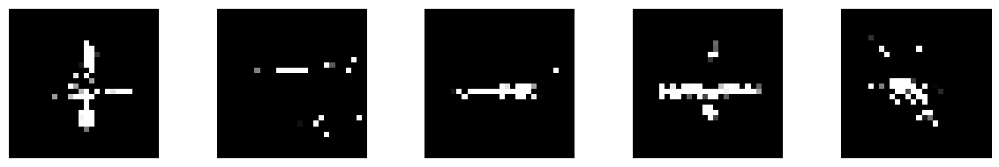

--------------- Epoch 475 ---------------
1/1 [==============================] - 0s 37ms/step


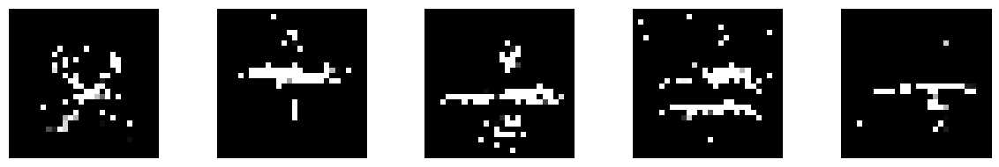

--------------- Epoch 476 ---------------
1/1 [==============================] - 0s 28ms/step


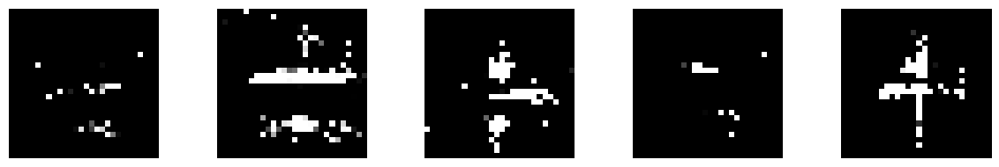

--------------- Epoch 477 ---------------
1/1 [==============================] - 0s 24ms/step


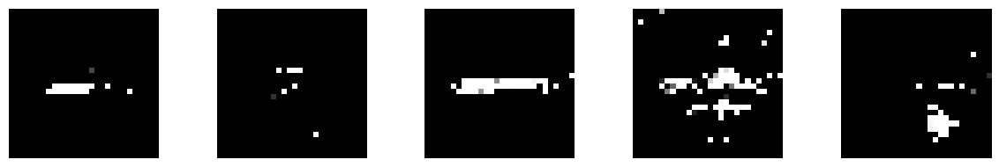

--------------- Epoch 478 ---------------
1/1 [==============================] - 0s 23ms/step


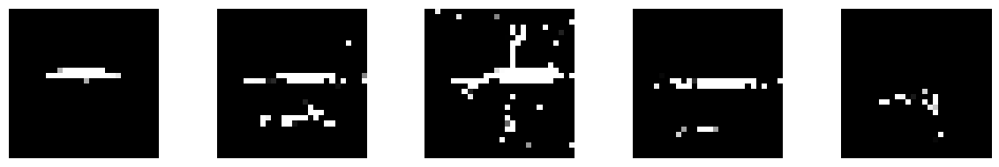

--------------- Epoch 479 ---------------
1/1 [==============================] - 0s 23ms/step


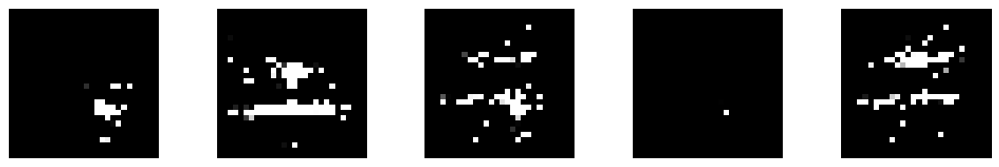

--------------- Epoch 480 ---------------
1/1 [==============================] - 0s 36ms/step


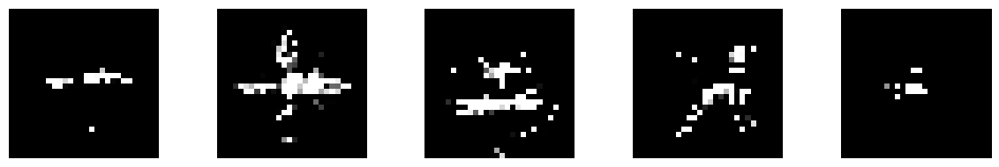

--------------- Epoch 481 ---------------
1/1 [==============================] - 0s 19ms/step


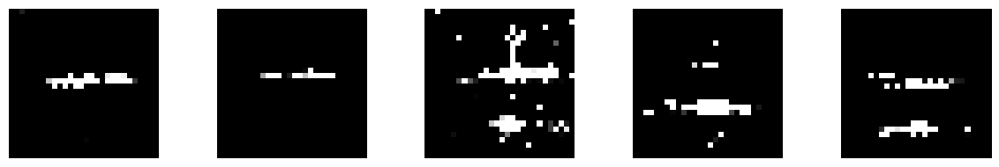

--------------- Epoch 482 ---------------
1/1 [==============================] - 0s 29ms/step


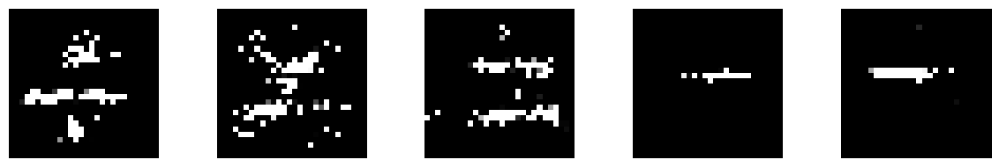

--------------- Epoch 483 ---------------
1/1 [==============================] - 0s 21ms/step


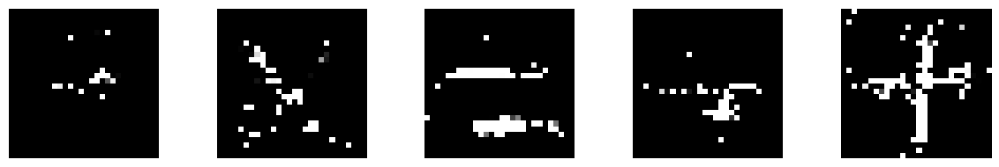

--------------- Epoch 484 ---------------
1/1 [==============================] - 0s 17ms/step


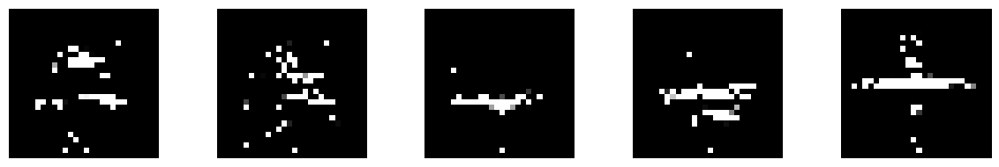

--------------- Epoch 485 ---------------
1/1 [==============================] - 0s 41ms/step


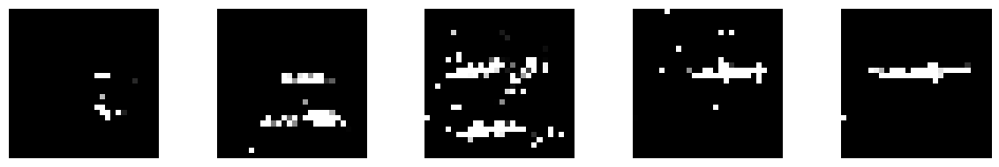

--------------- Epoch 486 ---------------
1/1 [==============================] - 0s 26ms/step


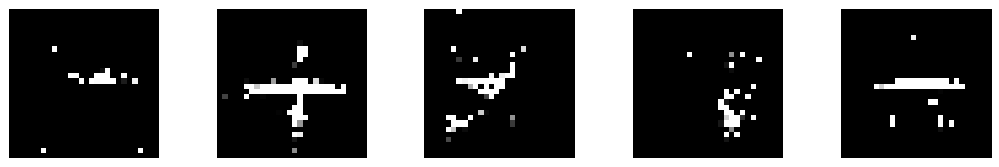

--------------- Epoch 487 ---------------
1/1 [==============================] - 0s 19ms/step


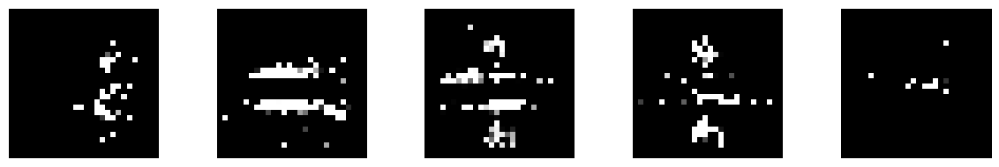

--------------- Epoch 488 ---------------
1/1 [==============================] - 0s 24ms/step


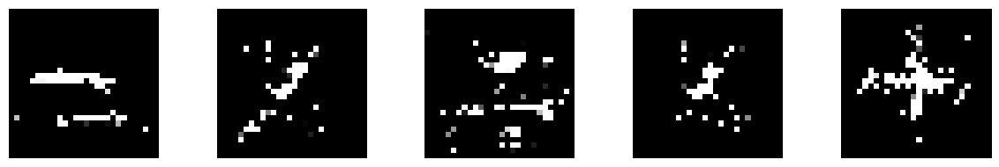

--------------- Epoch 489 ---------------
1/1 [==============================] - 0s 21ms/step


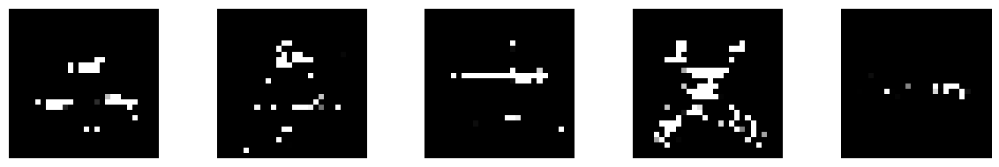

--------------- Epoch 490 ---------------
1/1 [==============================] - 0s 43ms/step


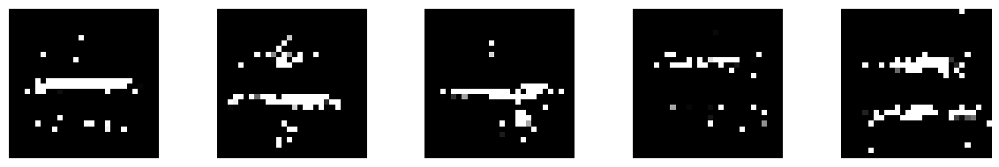

--------------- Epoch 491 ---------------
1/1 [==============================] - 0s 22ms/step


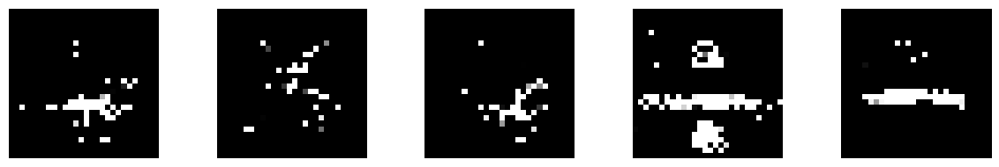

--------------- Epoch 492 ---------------
1/1 [==============================] - 0s 24ms/step


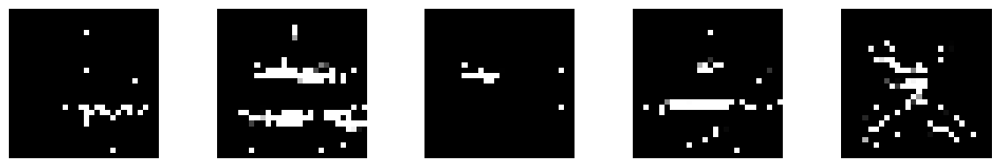

--------------- Epoch 493 ---------------
1/1 [==============================] - 0s 19ms/step


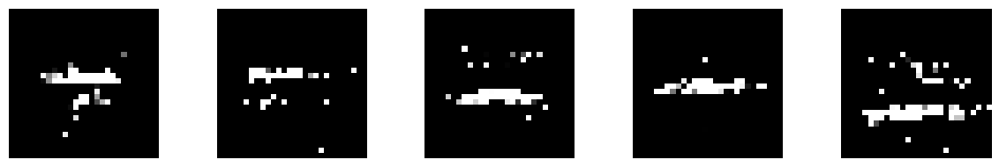

--------------- Epoch 494 ---------------
1/1 [==============================] - 0s 18ms/step


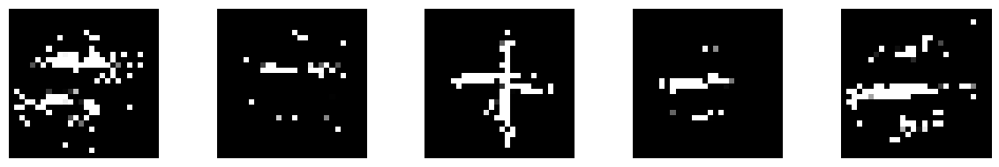

--------------- Epoch 495 ---------------
1/1 [==============================] - 0s 37ms/step


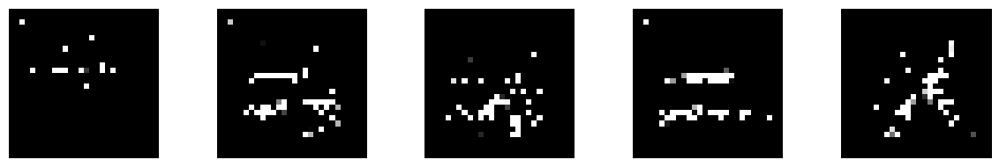

--------------- Epoch 496 ---------------
1/1 [==============================] - 0s 38ms/step


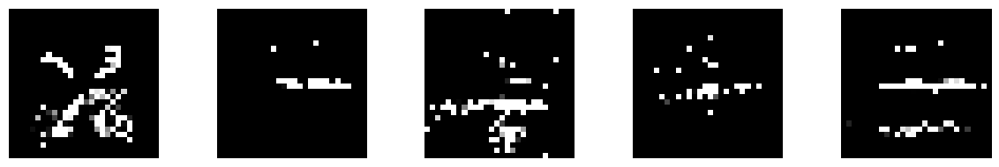

--------------- Epoch 497 ---------------
1/1 [==============================] - 0s 32ms/step


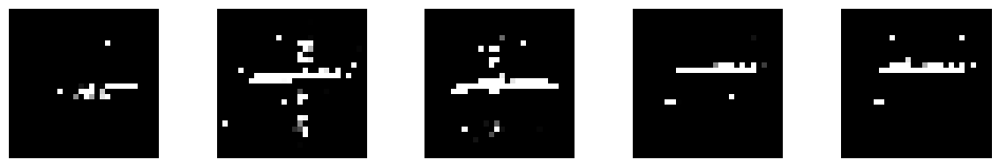

--------------- Epoch 498 ---------------
1/1 [==============================] - 0s 21ms/step


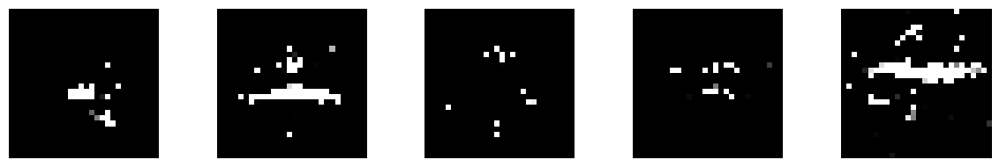

--------------- Epoch 499 ---------------
1/1 [==============================] - 0s 17ms/step


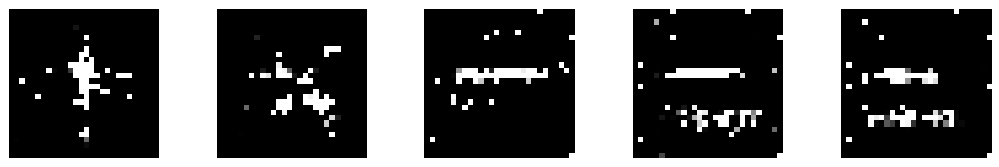

--------------- Epoch 500 ---------------
1/1 [==============================] - 0s 38ms/step


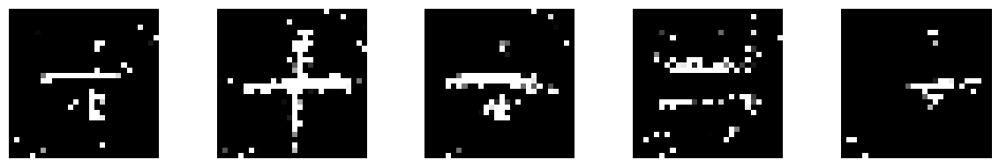

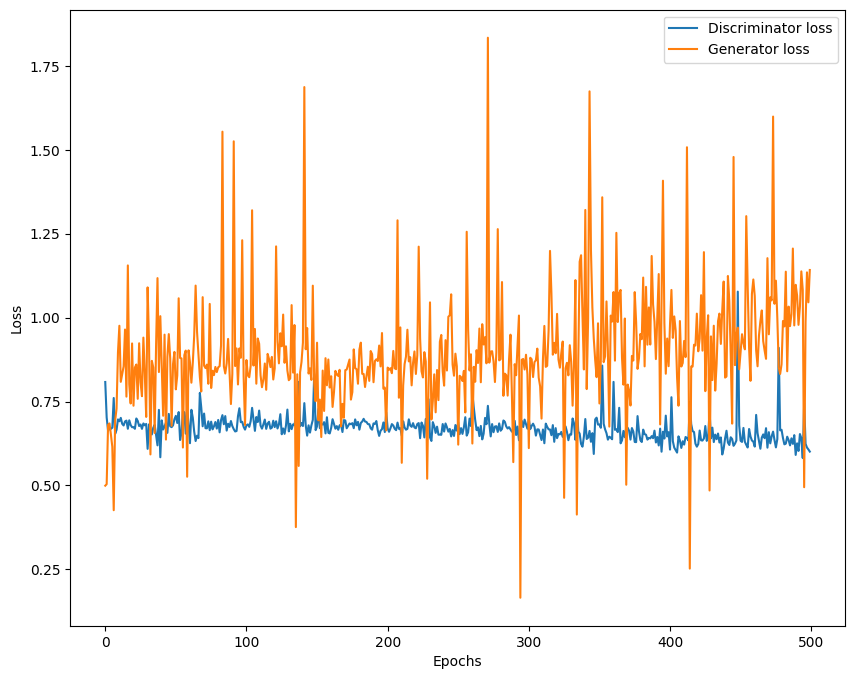

In [26]:
train(z_dim, epochs=500, BATCH_SIZE=128)

The loss goes up and down signficantly like a heartbeat. Nonetheless, we can seee that the symbols like addition, equals can be recognized pretty easily. GAN was able to generate the matematical symbols although it is somehow bad.

### New Dataset

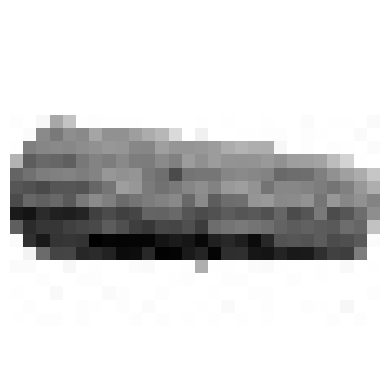

In [84]:
import pandas as pd
csv_path = '/content/drive/MyDrive/Colab Notebooks/fruits.csv'
df = pd.read_csv(csv_path)
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['label'])
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
from sklearn.model_selection import train_test_split

X = df.drop(columns=['label']).values
y = df['label'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
from sklearn.model_selection import train_test_split

X = df.drop(columns=['label']).values
y = df['label'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train = X_train.astype('float32')/255
X_test = X_test.astype('float32')/255
import matplotlib.pyplot as plt
index = 0
selected_image = X_train[index].reshape(28,28)

plt.imshow(selected_image, cmap='gray')
plt.axis('off')
plt.show()

Lets try the fruit dataset. I will use the mango, banana, and corn fruits.

### GAN


In [82]:
z_dim = 1
adam = Adam(learning_rate=0.0005, beta_1=0.5)


# (a) GENERATOR
g = Sequential()
g.add(Dense(128, input_dim=z_dim, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(512, input_dim=784, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(254, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(128, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=3, dim=(1, 3), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 100
Batch size: 128
Batches per epoch: 7


<ipython-input-82-ad39509d3074>:71: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for e in tqdm_notebook(range(1, epochs+1)):


  0%|          | 0/100 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 55ms/step


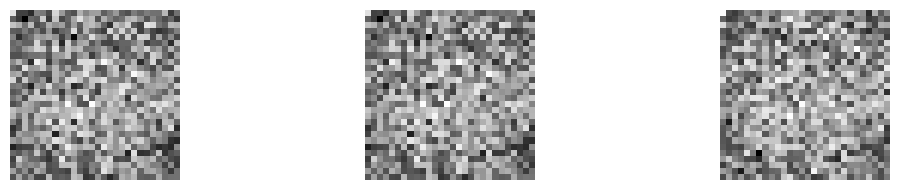

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 17ms/step


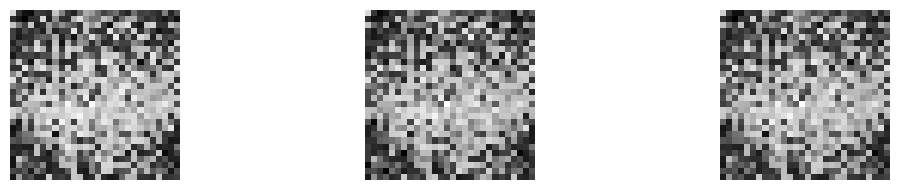

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 29ms/step


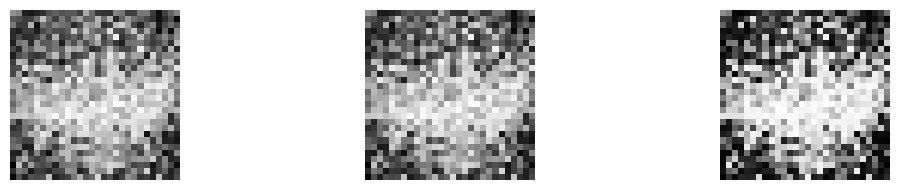

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 45ms/step


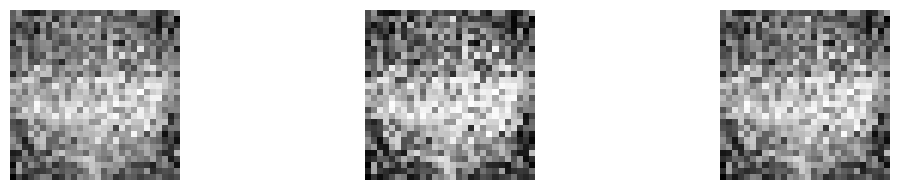

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 26ms/step


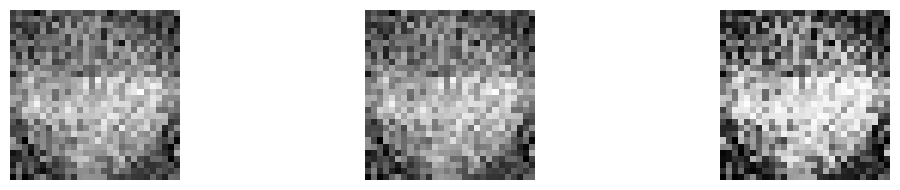

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 17ms/step


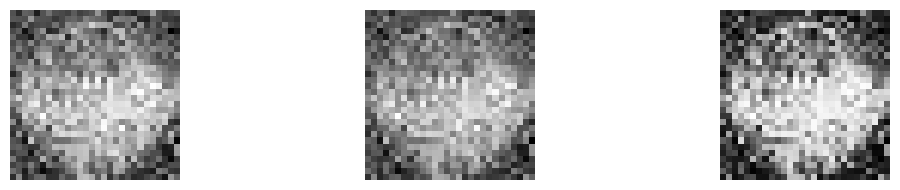

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 16ms/step


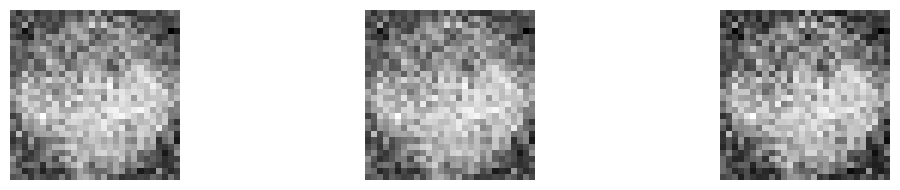

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 17ms/step


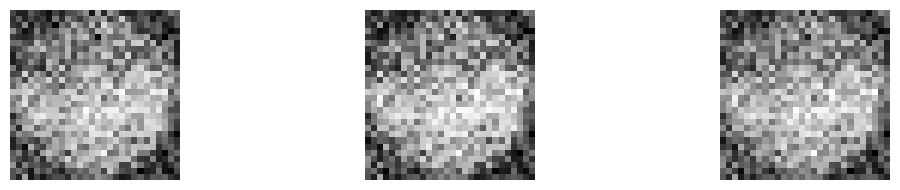

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 18ms/step


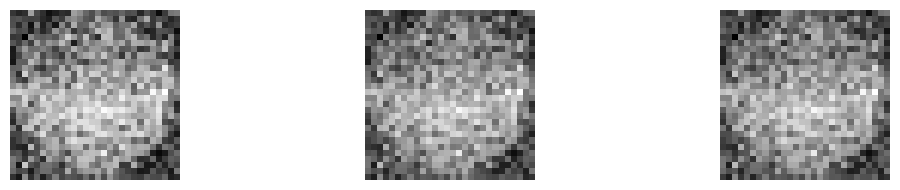

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 18ms/step


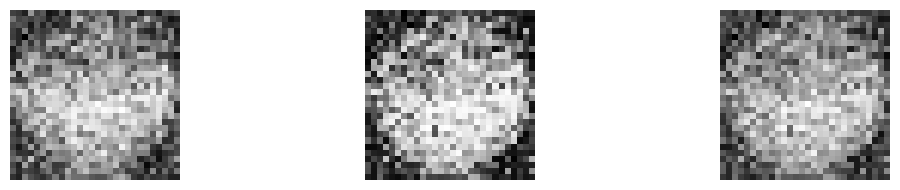

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 20ms/step


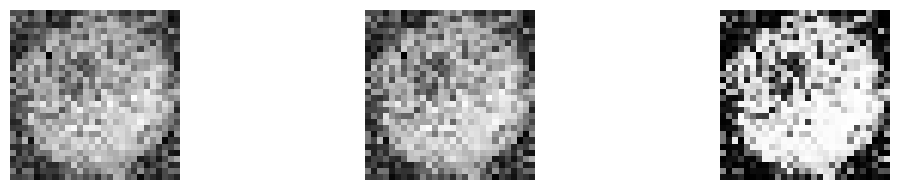

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 19ms/step


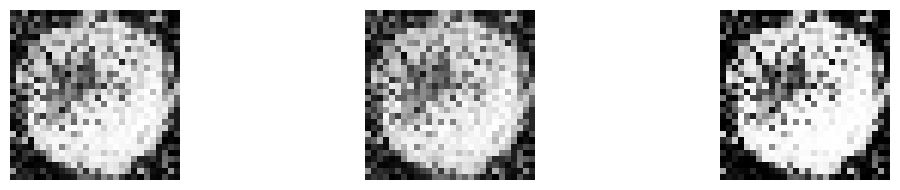

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 17ms/step


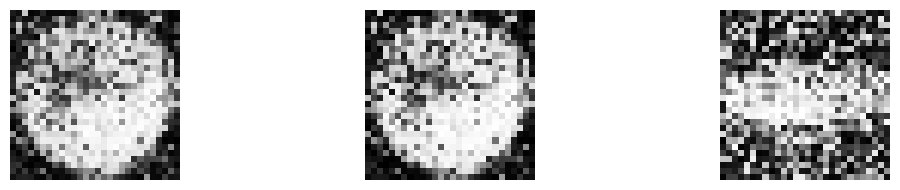

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 17ms/step


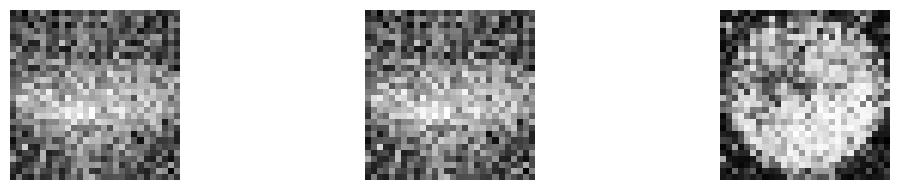

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 16ms/step


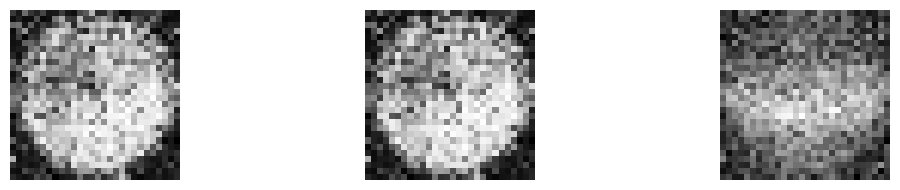

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 19ms/step


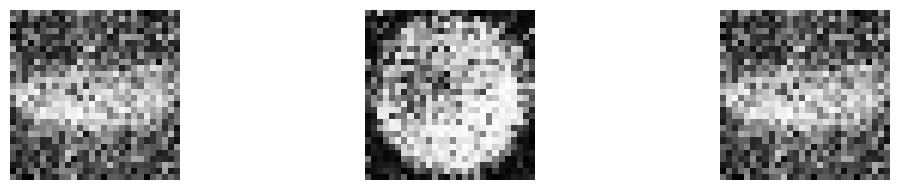

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 20ms/step


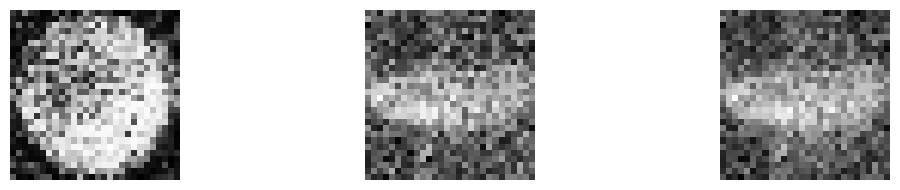

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 18ms/step


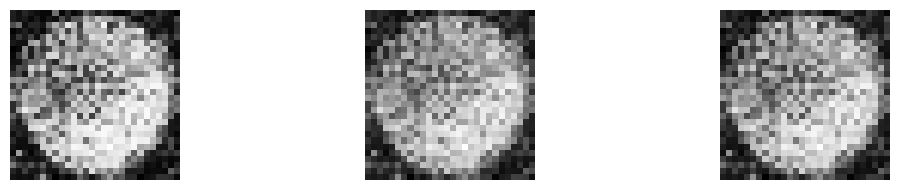

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 17ms/step


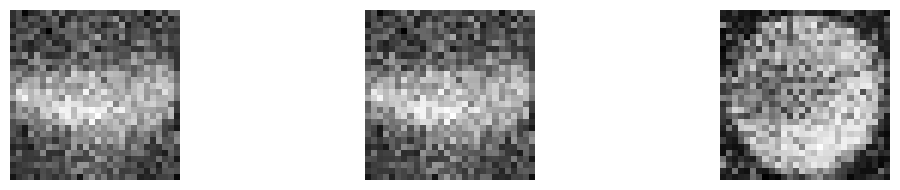

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 20ms/step


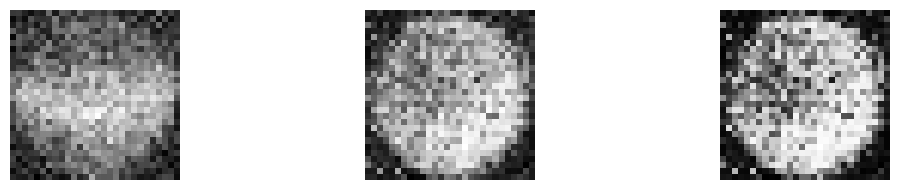

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 19ms/step


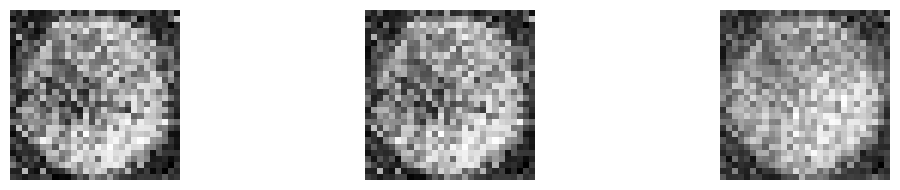

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 25ms/step


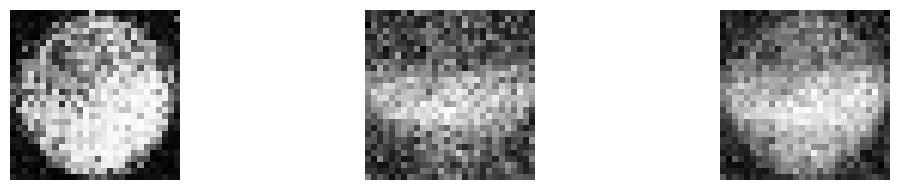

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 26ms/step


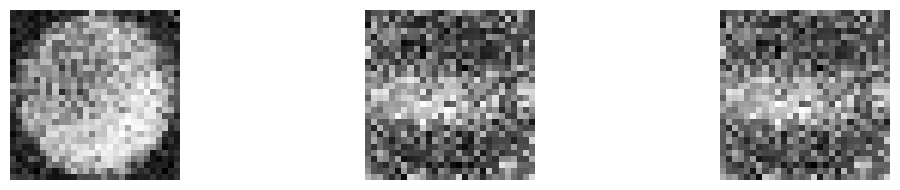

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 17ms/step


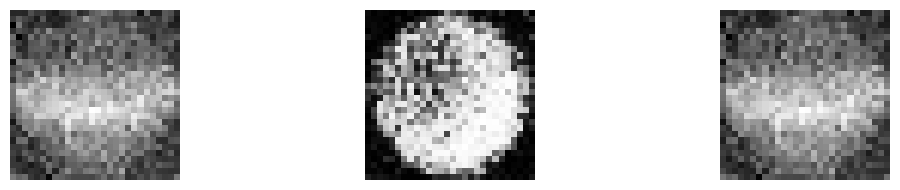

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 17ms/step


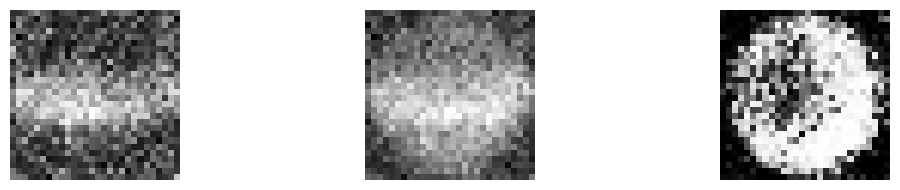

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 17ms/step


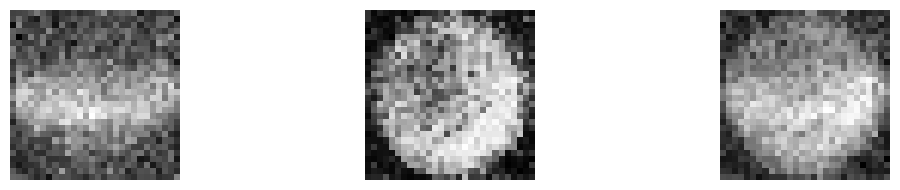

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 18ms/step


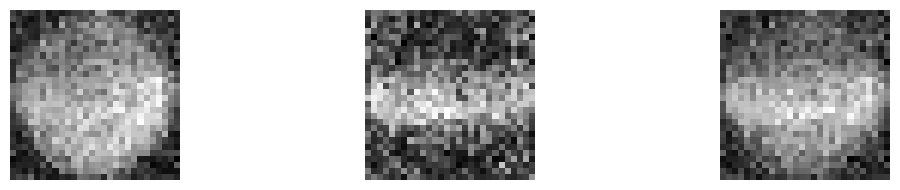

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 17ms/step


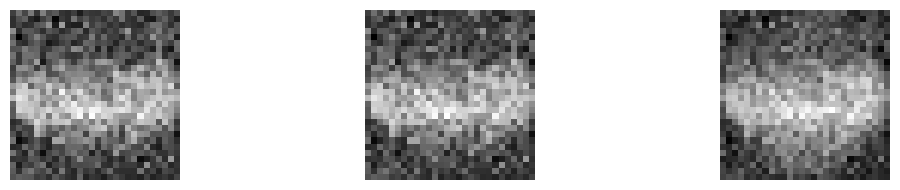

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 17ms/step


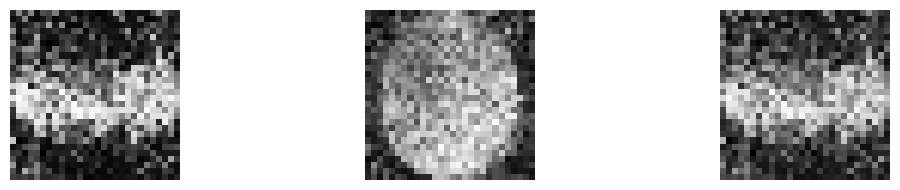

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 19ms/step


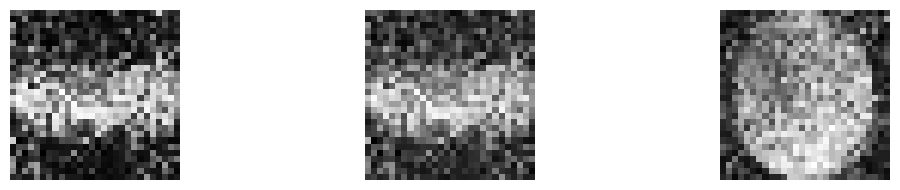

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 18ms/step


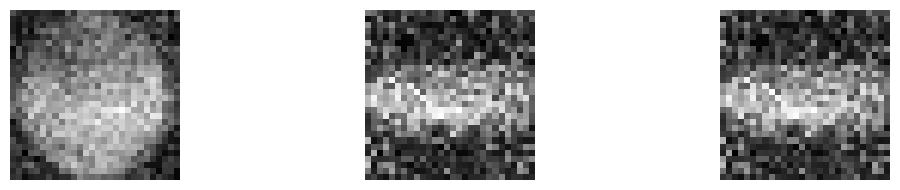

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 18ms/step


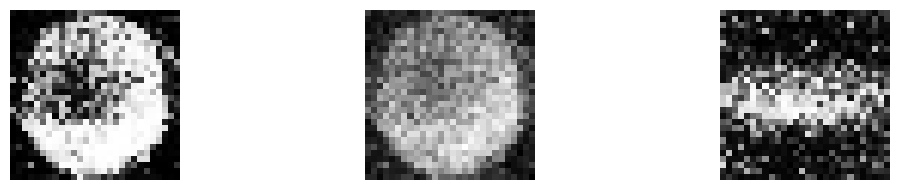

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 17ms/step


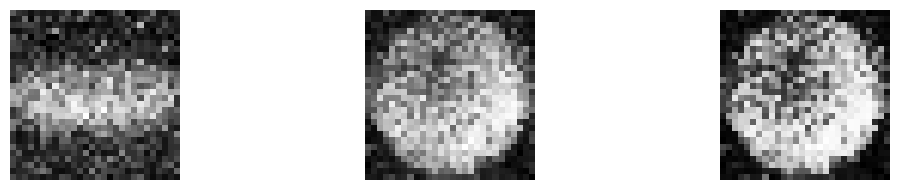

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 17ms/step


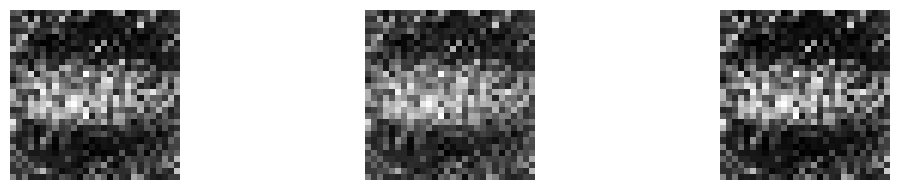

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 26ms/step


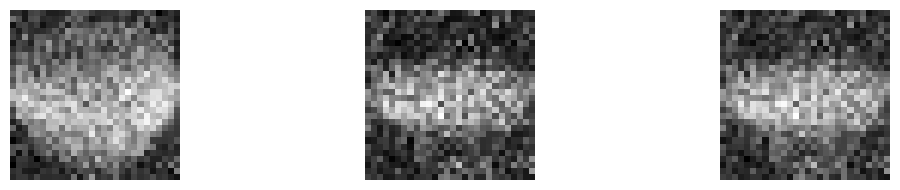

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 29ms/step


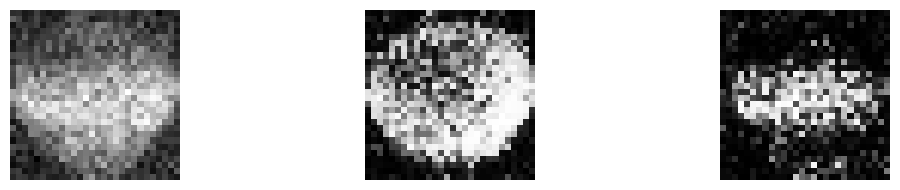

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 32ms/step


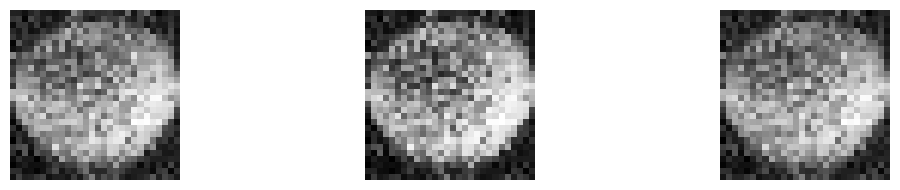

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 16ms/step


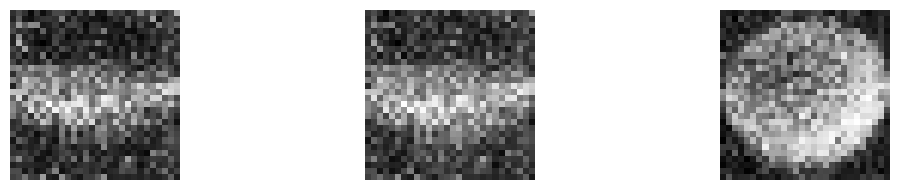

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 16ms/step


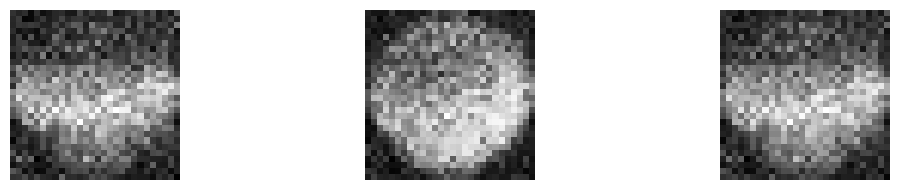

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 17ms/step


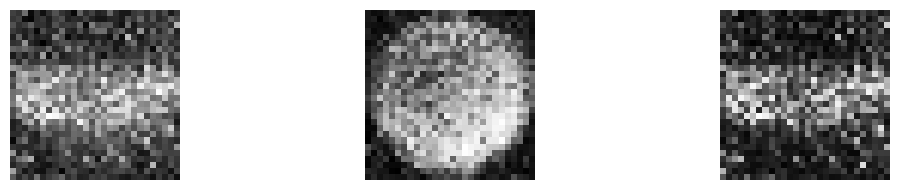

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 16ms/step


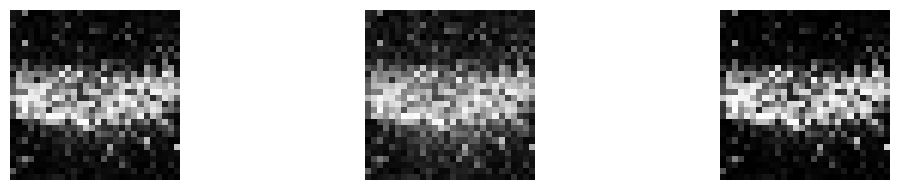

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 17ms/step


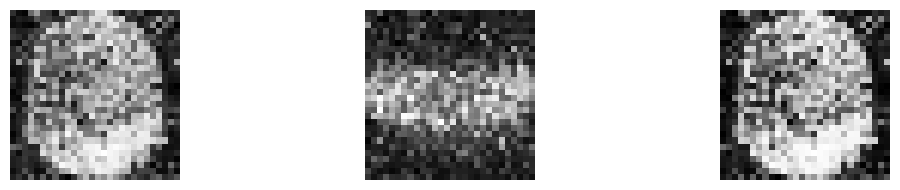

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 17ms/step


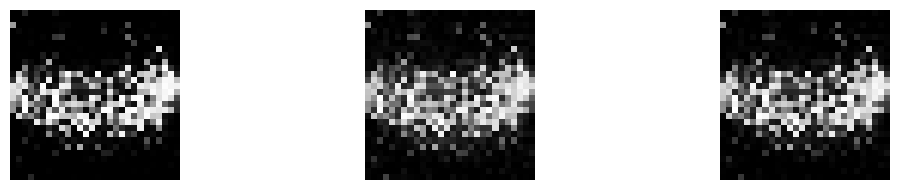

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 18ms/step


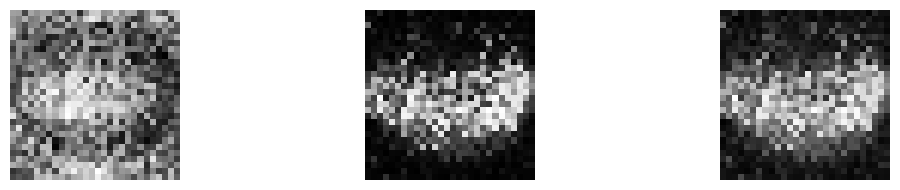

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 17ms/step


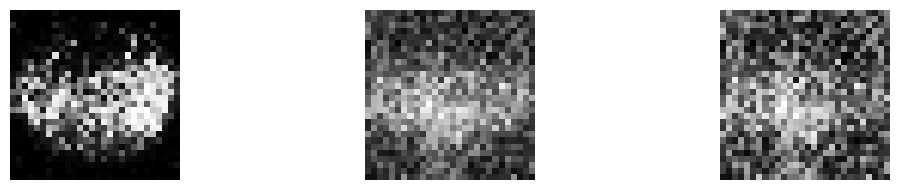

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 17ms/step


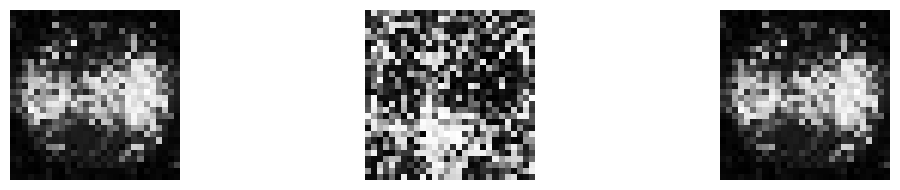

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 18ms/step


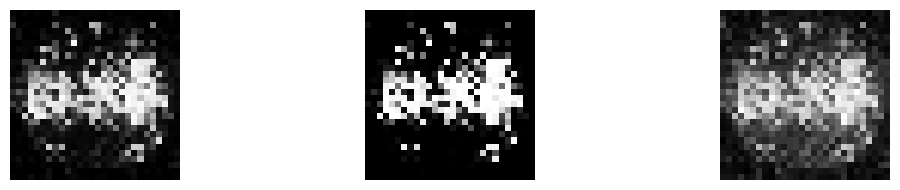

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 19ms/step


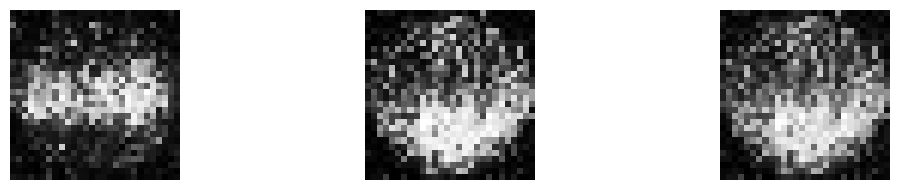

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 28ms/step


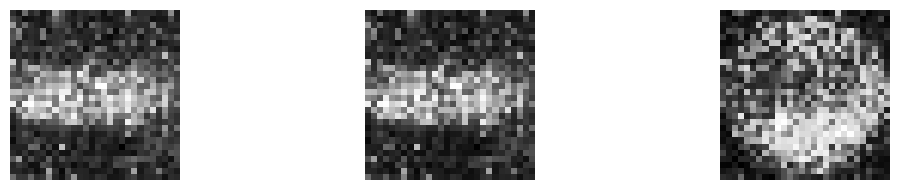

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 26ms/step


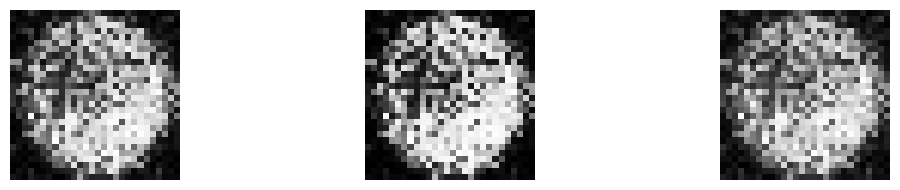

--------------- Epoch 51 ---------------
1/1 [==============================] - 0s 19ms/step


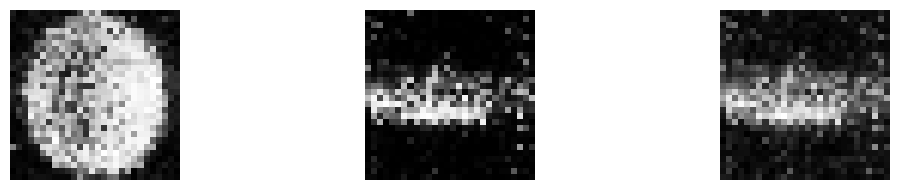

--------------- Epoch 52 ---------------
1/1 [==============================] - 0s 21ms/step


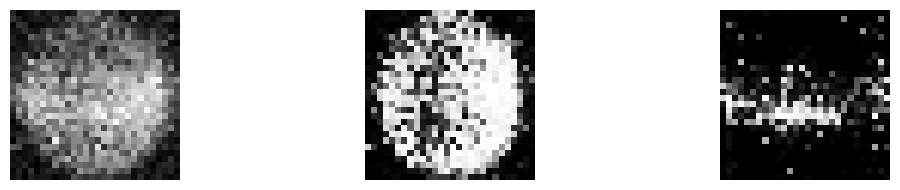

--------------- Epoch 53 ---------------
1/1 [==============================] - 0s 17ms/step


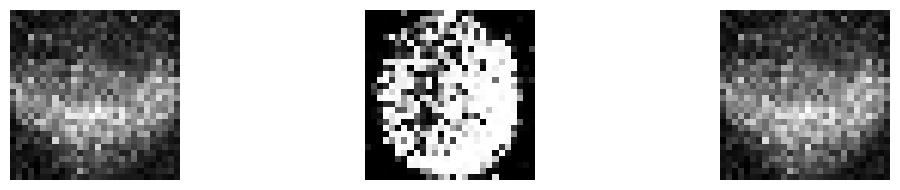

--------------- Epoch 54 ---------------
1/1 [==============================] - 0s 18ms/step


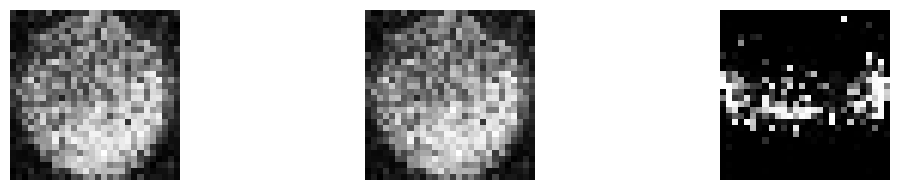

--------------- Epoch 55 ---------------
1/1 [==============================] - 0s 18ms/step


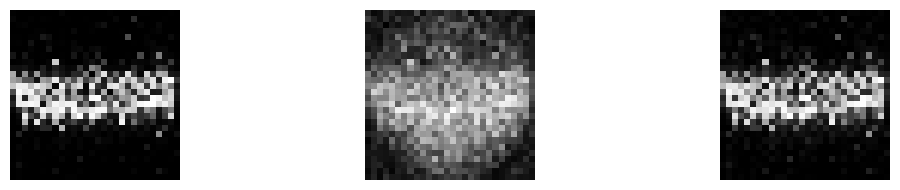

--------------- Epoch 56 ---------------
1/1 [==============================] - 0s 17ms/step


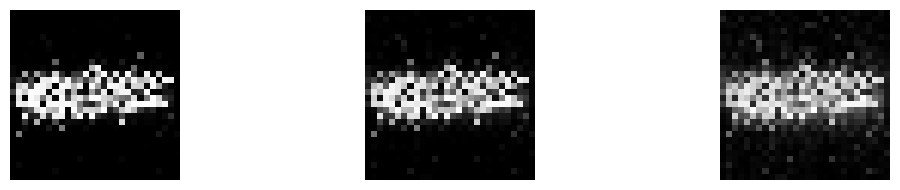

--------------- Epoch 57 ---------------
1/1 [==============================] - 0s 17ms/step


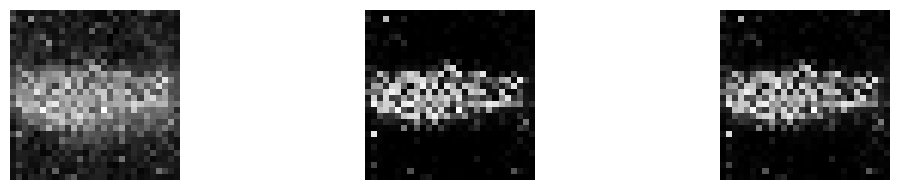

--------------- Epoch 58 ---------------
1/1 [==============================] - 0s 18ms/step


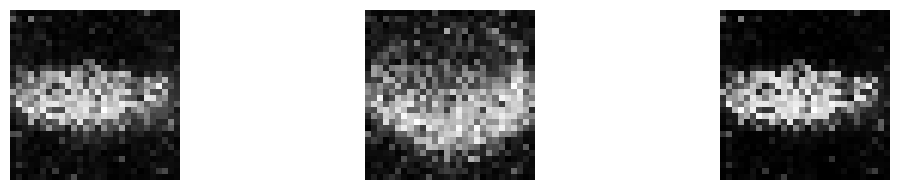

--------------- Epoch 59 ---------------
1/1 [==============================] - 0s 19ms/step


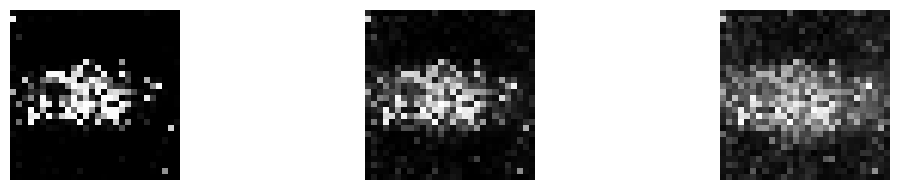

--------------- Epoch 60 ---------------
1/1 [==============================] - 0s 17ms/step


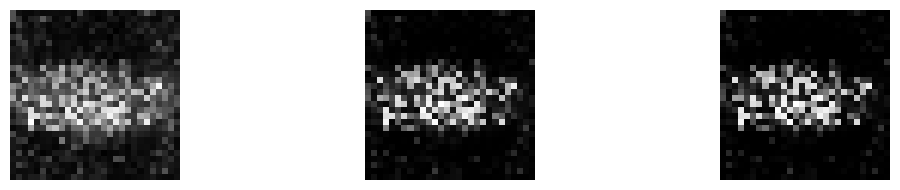

--------------- Epoch 61 ---------------
1/1 [==============================] - 0s 18ms/step


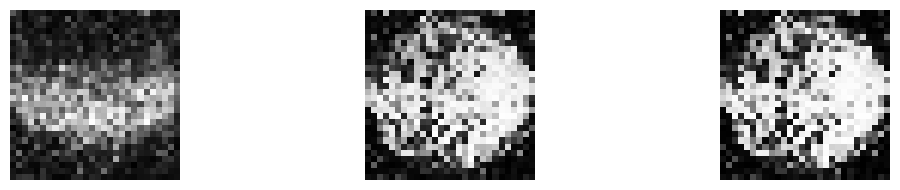

--------------- Epoch 62 ---------------
1/1 [==============================] - 0s 28ms/step


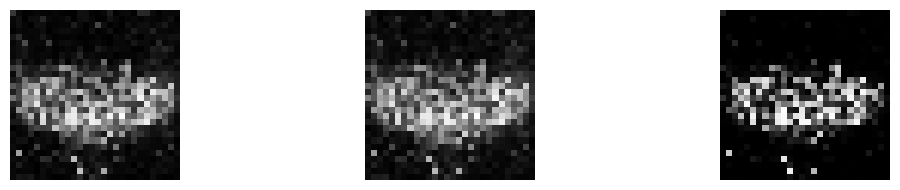

--------------- Epoch 63 ---------------
1/1 [==============================] - 0s 27ms/step


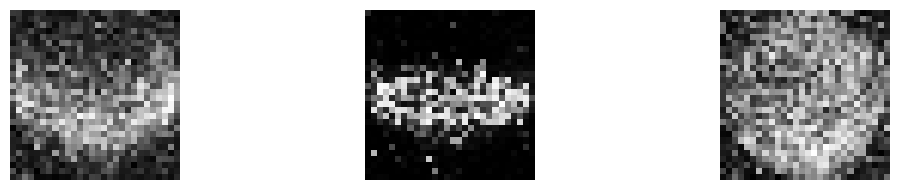

--------------- Epoch 64 ---------------
1/1 [==============================] - 0s 18ms/step


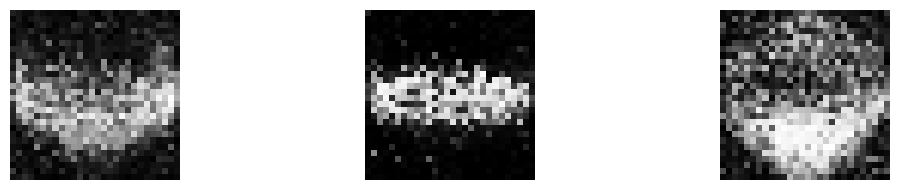

--------------- Epoch 65 ---------------
1/1 [==============================] - 0s 22ms/step


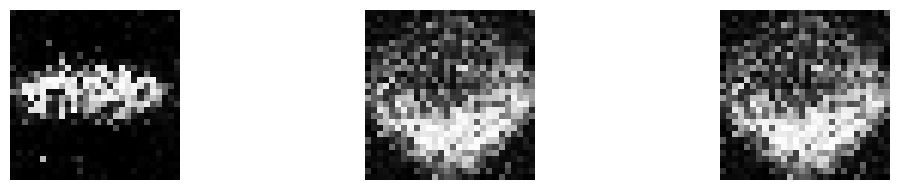

--------------- Epoch 66 ---------------
1/1 [==============================] - 0s 22ms/step


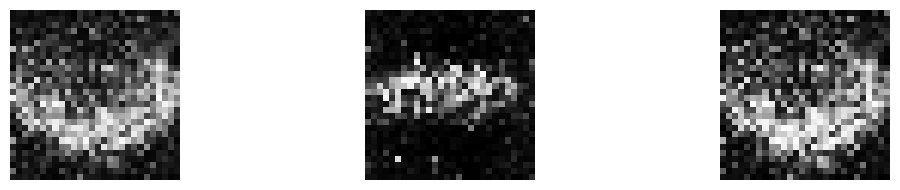

--------------- Epoch 67 ---------------
1/1 [==============================] - 0s 17ms/step


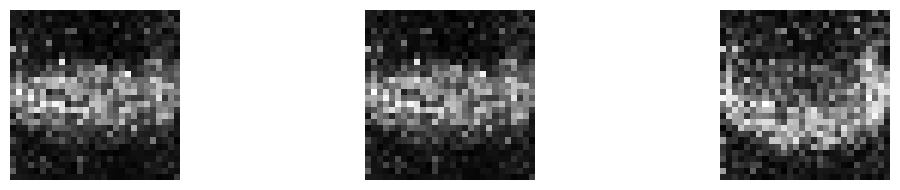

--------------- Epoch 68 ---------------
1/1 [==============================] - 0s 18ms/step


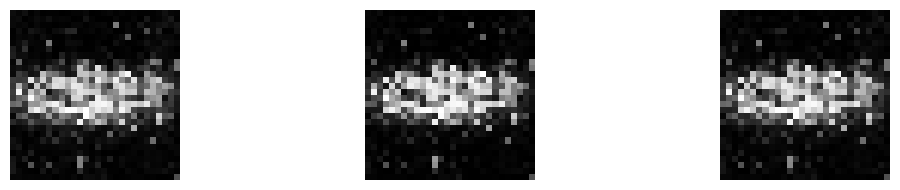

--------------- Epoch 69 ---------------
1/1 [==============================] - 0s 18ms/step


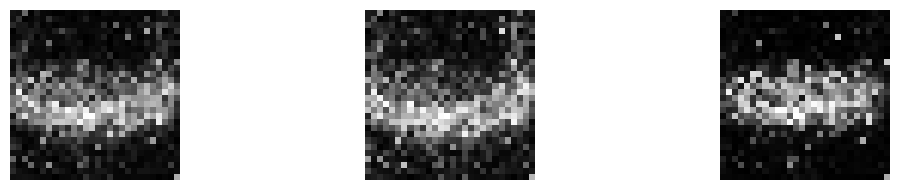

--------------- Epoch 70 ---------------
1/1 [==============================] - 0s 18ms/step


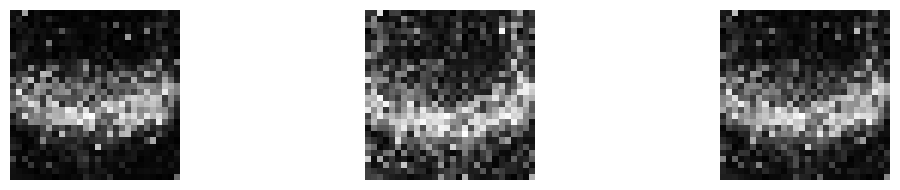

--------------- Epoch 71 ---------------
1/1 [==============================] - 0s 19ms/step


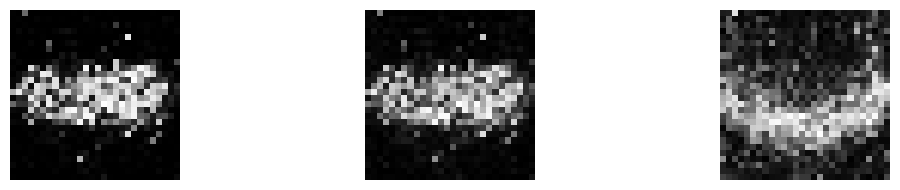

--------------- Epoch 72 ---------------
1/1 [==============================] - 0s 18ms/step


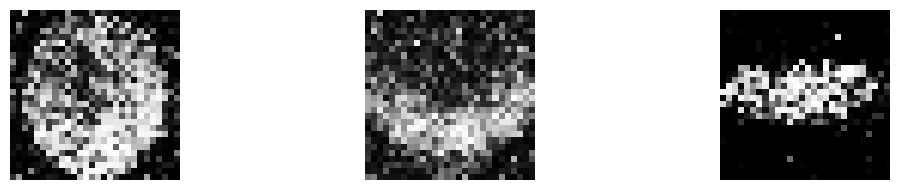

--------------- Epoch 73 ---------------
1/1 [==============================] - 0s 17ms/step


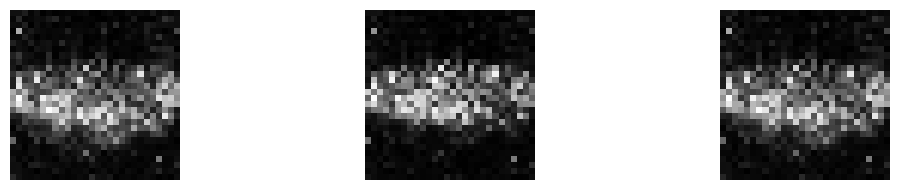

--------------- Epoch 74 ---------------
1/1 [==============================] - 0s 17ms/step


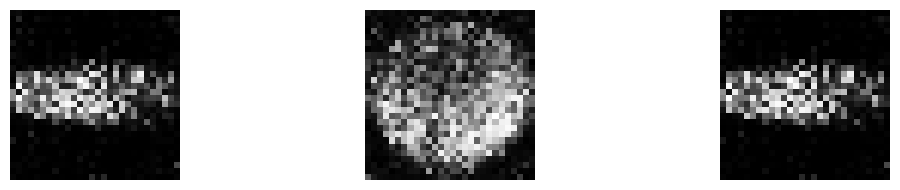

--------------- Epoch 75 ---------------
1/1 [==============================] - 0s 24ms/step


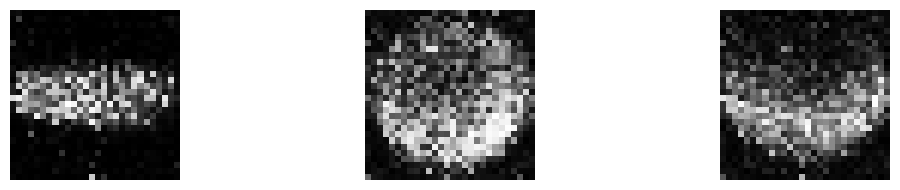

--------------- Epoch 76 ---------------
1/1 [==============================] - 0s 23ms/step


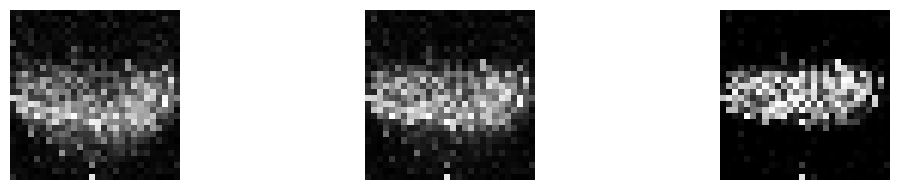

--------------- Epoch 77 ---------------
1/1 [==============================] - 0s 20ms/step


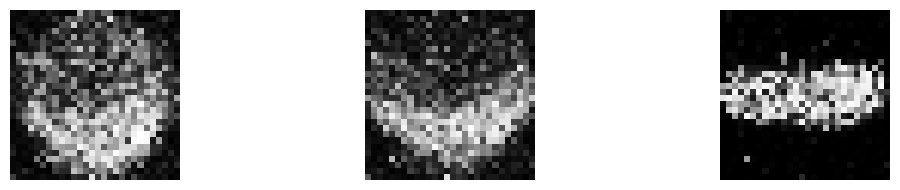

--------------- Epoch 78 ---------------
1/1 [==============================] - 0s 52ms/step


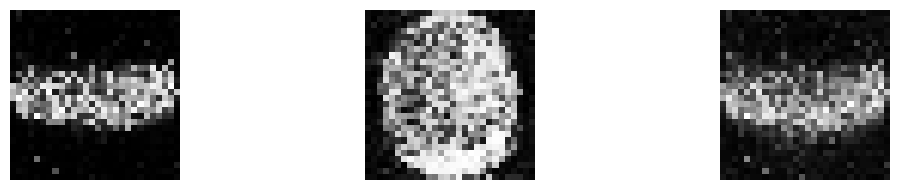

--------------- Epoch 79 ---------------
1/1 [==============================] - 0s 18ms/step


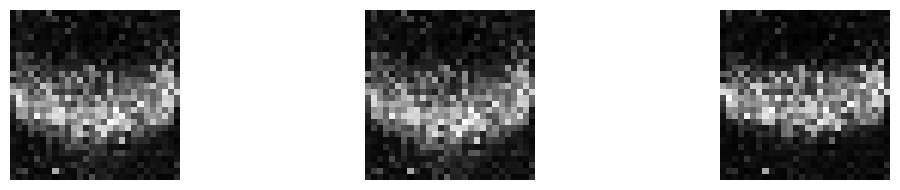

--------------- Epoch 80 ---------------
1/1 [==============================] - 0s 20ms/step


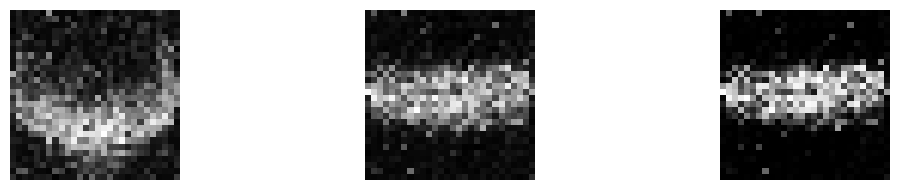

--------------- Epoch 81 ---------------
1/1 [==============================] - 0s 17ms/step


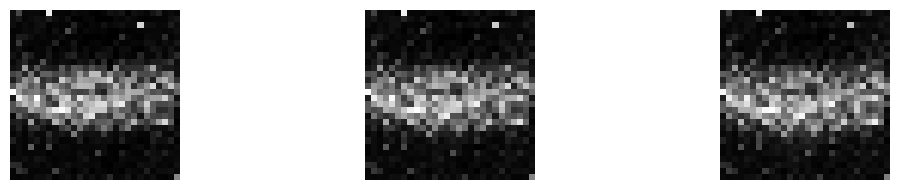

--------------- Epoch 82 ---------------
1/1 [==============================] - 0s 19ms/step


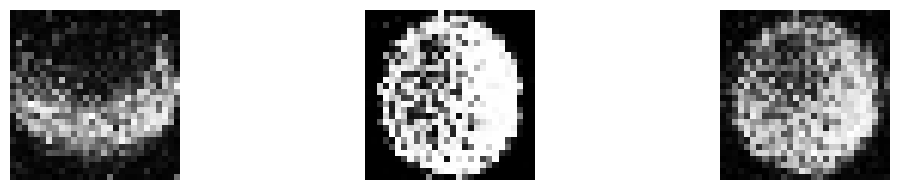

--------------- Epoch 83 ---------------
1/1 [==============================] - 0s 28ms/step


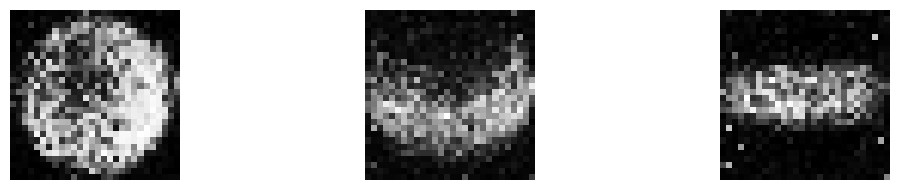

--------------- Epoch 84 ---------------
1/1 [==============================] - 0s 18ms/step


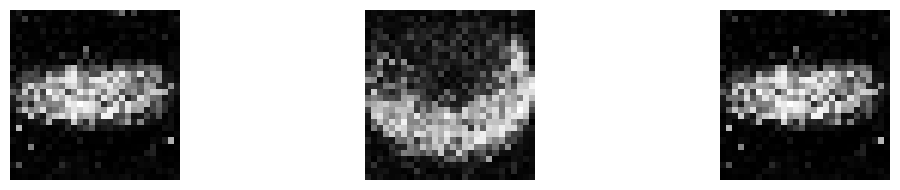

--------------- Epoch 85 ---------------
1/1 [==============================] - 0s 17ms/step


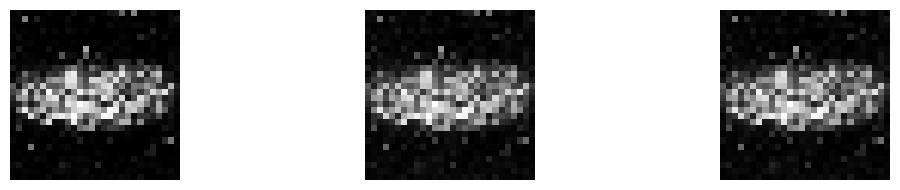

--------------- Epoch 86 ---------------
1/1 [==============================] - 0s 19ms/step


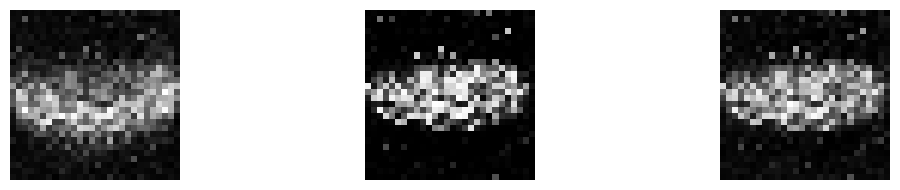

--------------- Epoch 87 ---------------
1/1 [==============================] - 0s 25ms/step


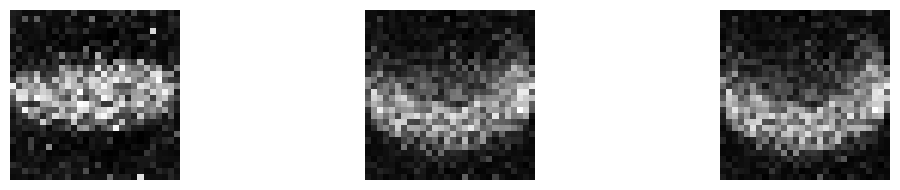

--------------- Epoch 88 ---------------
1/1 [==============================] - 0s 29ms/step


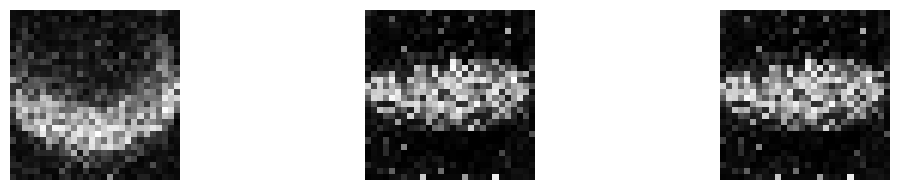

--------------- Epoch 89 ---------------
1/1 [==============================] - 0s 17ms/step


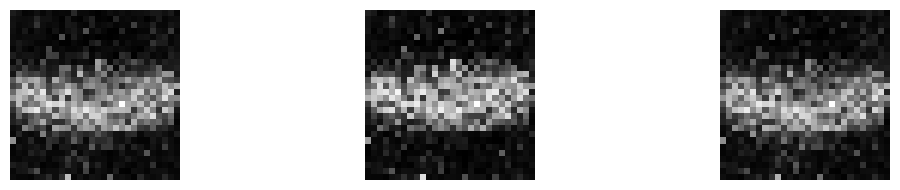

--------------- Epoch 90 ---------------
1/1 [==============================] - 0s 18ms/step


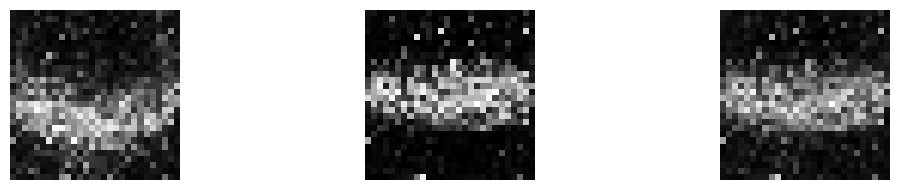

--------------- Epoch 91 ---------------
1/1 [==============================] - 0s 18ms/step


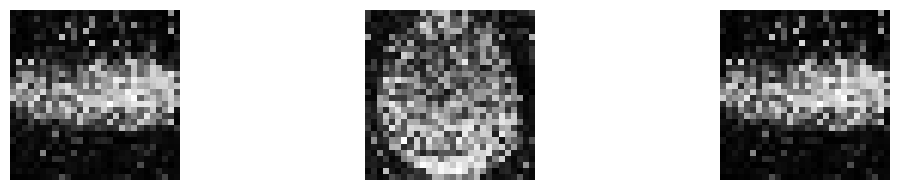

--------------- Epoch 92 ---------------
1/1 [==============================] - 0s 17ms/step


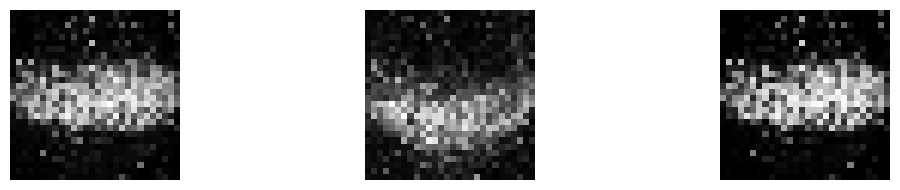

--------------- Epoch 93 ---------------
1/1 [==============================] - 0s 18ms/step


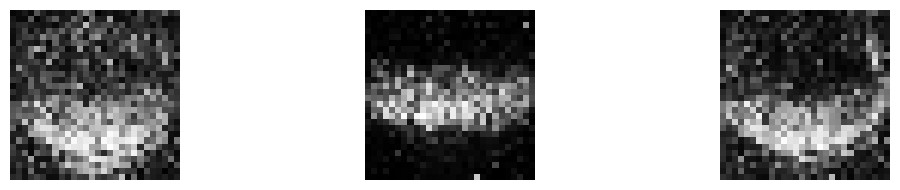

--------------- Epoch 94 ---------------
1/1 [==============================] - 0s 18ms/step


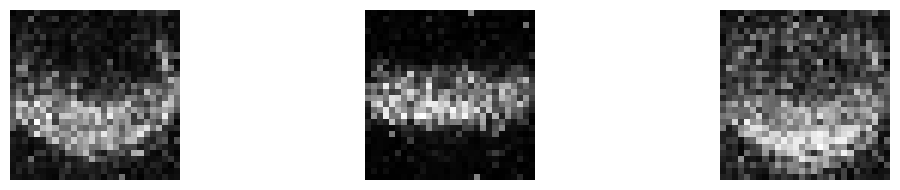

--------------- Epoch 95 ---------------
1/1 [==============================] - 0s 18ms/step


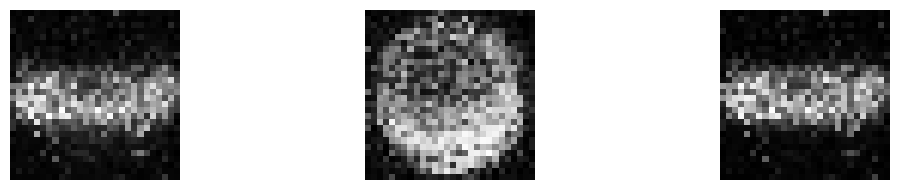

--------------- Epoch 96 ---------------
1/1 [==============================] - 0s 18ms/step


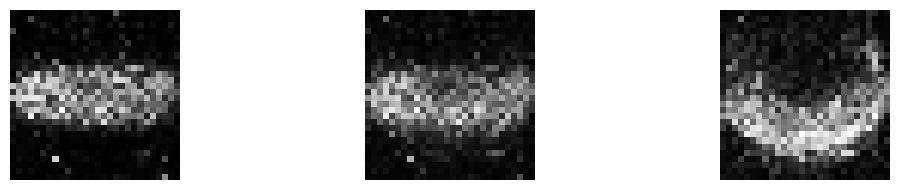

--------------- Epoch 97 ---------------
1/1 [==============================] - 0s 17ms/step


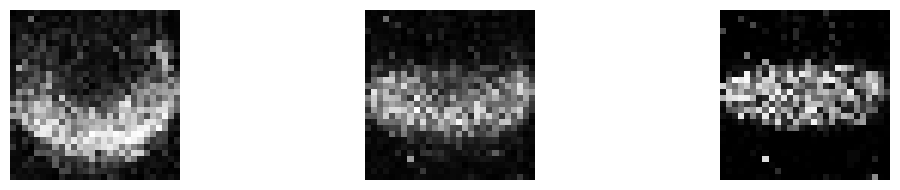

--------------- Epoch 98 ---------------
1/1 [==============================] - 0s 21ms/step


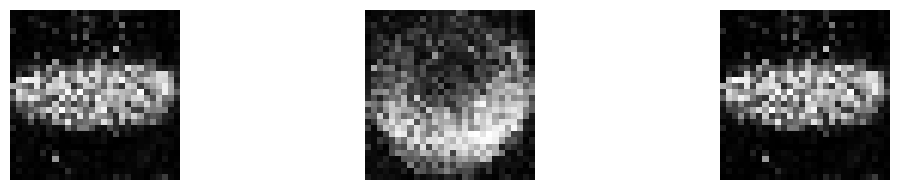

--------------- Epoch 99 ---------------
1/1 [==============================] - 0s 17ms/step


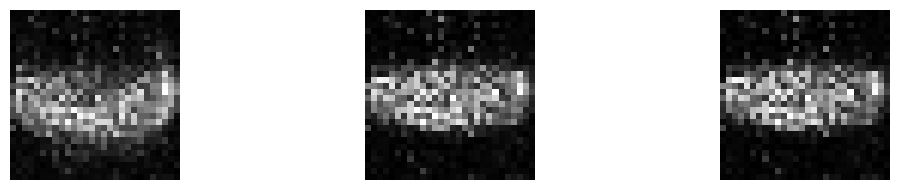

--------------- Epoch 100 ---------------
1/1 [==============================] - 0s 25ms/step


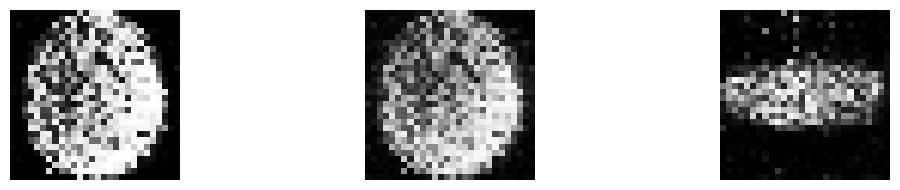

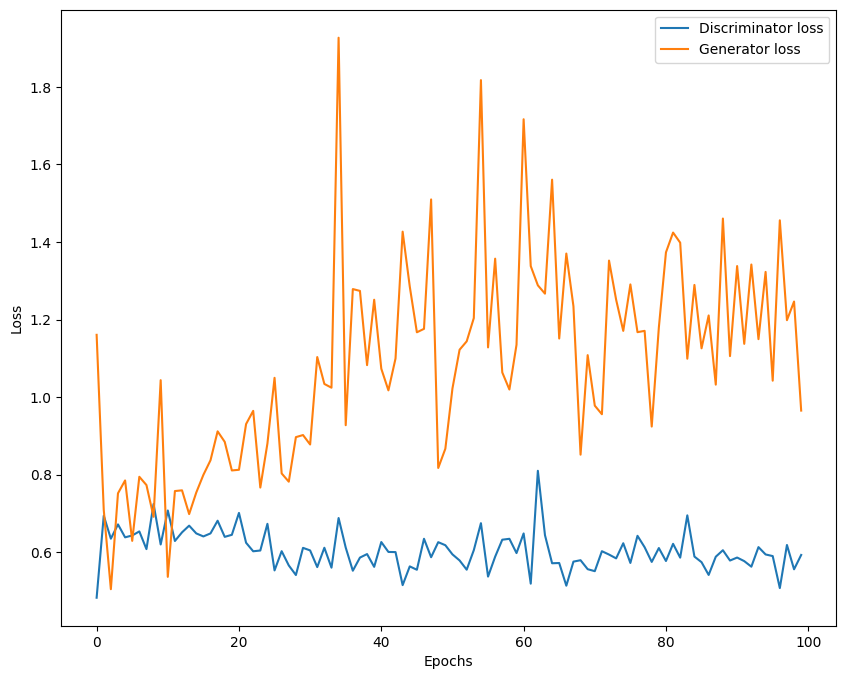

In [83]:
train(z_dim, epochs=100, BATCH_SIZE=128)

The plot barely converges to each other. Nonetheless, the generated images are close to the fruits. They are pretty discenible such as the mango, corn, and banana. The arc of the banana, the straight sturdy structure of the corn, and the roundness of the mango can be seen.

### VAE

In [67]:
batch_size = 32
latent_dim = 2   # Number of latent dimension parameters

input_img = tf.keras.layers.Input(shape=(784,), name="input")
x = tf.keras.layers.Dense(1024, activation='relu', name="intermediate_encoder")(input_img)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dense(latent_dim * 2, activation='relu', name="latent_encoder")(x)

z_mu = tf.keras.layers.Dense(latent_dim)(x)
z_log_sigma = tf.keras.layers.Dense(latent_dim)(x)

def sampling(args):
    z_mu, z_log_sigma = args
    epsilon = tf.keras.backend.random_normal(shape=(tf.keras.backend.shape(z_mu)[0], latent_dim))
    z = z_mu + tf.keras.backend.exp(z_log_sigma) * epsilon
    return z

# sample vector from the latent distribution
z = tf.keras.layers.Lambda(sampling)([z_mu, z_log_sigma])
# decoder takes the latent distribution sample as input
decoder_input = tf.keras.layers.Input((latent_dim,), name="input_decoder")
x = tf.keras.layers.Dense(128, activation='relu', name="intermediate_decoder")(decoder_input)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
# Expand to 784 total pixels
x = tf.keras.layers.Dense(784, activation='sigmoid', name="original_decoder")(x)

# decoder model statement
decoder = tf.keras.Model(decoder_input, x)

# apply the decoder to the sample from the latent distribution
z_decoded = decoder(z)
decoder.summary()

Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_decoder (InputLayer)  [(None, 2)]               0         
                                                                 
 intermediate_decoder (Dens  (None, 128)               384       
 e)                                                              
                                                                 
 batch_normalization_20 (Ba  (None, 128)               512       
 tchNormalization)                                               
                                                                 
 dense_78 (Dense)            (None, 256)               33024     
                                                                 
 batch_normalization_21 (Ba  (None, 256)               1024      
 tchNormalization)                                               
                                                          

In [68]:
# construct a custom layer to calculate the loss
class CustomVariationalLayer(tf.keras.layers.Layer):

    def vae_loss(self, x, z_decoded):
        x = tf.keras.backend.flatten(x)
        z_decoded = tf.keras.backend.flatten(z_decoded)
        # Reconstruction loss
        xent_loss = tf.keras.losses.binary_crossentropy(x, z_decoded)
        return xent_loss

    # adds the custom loss to the class
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

# apply the custom loss to the input images and the decoded latent distribution sample
y = CustomVariationalLayer()([input_img, z_decoded])
# VAE model statement
lr = 0.0001
vae = tf.keras.Model(input_img, y)
vae.compile(optimizer=Adam(learning_rate=lr), loss=None)
vae.summary()

Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 784)]                0         []                            
                                                                                                  
 intermediate_encoder (Dens  (None, 1024)                 803840    ['input[0][0]']               
 e)                                                                                               
                                                                                                  
 dense_73 (Dense)            (None, 512)                  524800    ['intermediate_encoder[0][0]']
                                                                                                  
 dense_74 (Dense)            (None, 256)                  131328    ['dense_73[0][0]']     

In [69]:
train_x = X_train.reshape(-1,784) # train_x.reshape(-1, 784)
val_x = X_test.reshape(-1,784) #val_x.reshape(-1, 784)

In [70]:
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-10, verbose=1)
callbacks = [
    ModelCheckpoint(filepath='vae.keras', save_best_only=True),
    TensorBoard(log_dir='./logs'),
    reduce_lr  # Include the reduce_lr callback in your list of callbacks
]

# Fit the model with callbacks
vae.fit(x=train_x, y=None,
        shuffle=True,
        epochs=500,
        batch_size=batch_size,
        validation_data=(val_x, None),
        callbacks=callbacks)

Epoch 1/500
32/32 [==============================] - 5s 23ms/step - loss: 0.7233 - val_loss: 0.6885 - lr: 1.0000e-04
Epoch 2/500
32/32 [==============================] - 0s 14ms/step - loss: 0.6567 - val_loss: 0.6753 - lr: 1.0000e-04
Epoch 3/500
32/32 [==============================] - 0s 15ms/step - loss: 0.6360 - val_loss: 0.6623 - lr: 1.0000e-04
Epoch 4/500
32/32 [==============================] - 0s 14ms/step - loss: 0.6263 - val_loss: 0.6505 - lr: 1.0000e-04
Epoch 5/500
32/32 [==============================] - 0s 14ms/step - loss: 0.6184 - val_loss: 0.6384 - lr: 1.0000e-04
Epoch 6/500
32/32 [==============================] - 0s 14ms/step - loss: 0.6109 - val_loss: 0.6289 - lr: 1.0000e-04
Epoch 7/500
32/32 [==============================] - 0s 14ms/step - loss: 0.6052 - val_loss: 0.6163 - lr: 1.0000e-04
Epoch 8/500
32/32 [==============================] - 1s 16ms/step - loss: 0.5953 - val_loss: 0.6073 - lr: 1.0000e-04
Epoch 9/500
32/32 [==============================] - 1s 21ms/ste

1/1 [==============================] - 0s 15ms/step


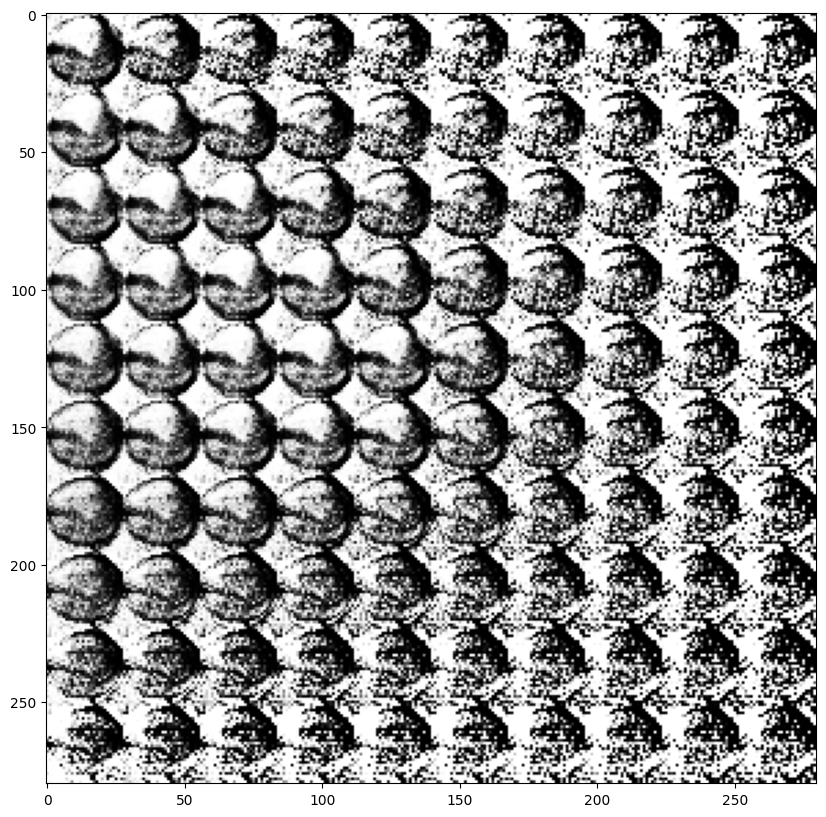

In [71]:
# Display a 2D manifold of the samples
n = 10  # figure with 20x20 samples
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))

# Construct grid of latent variable values - can change values here to generate different things
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

# decode for each square in the grid
for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, batch_size).reshape(batch_size, 2)

        x_decoded = decoder.predict(z_sample, batch_size=batch_size)

        digit = x_decoded[0].reshape(digit_size, digit_size)

        figure[i * digit_size: (i + 1) * digit_size,
               j * digit_size: (j + 1) * digit_size] = digit

plt.figure(figsize=(10, 10))
plt.imshow(figure, cmap='gray')
plt.show()

The mangoes can be seen here on the grid. The mangoes are discenible with its round shape with the lower part of the grid having an issue seen by the blocky image.

32/32 [==============================] - 0s 2ms/step


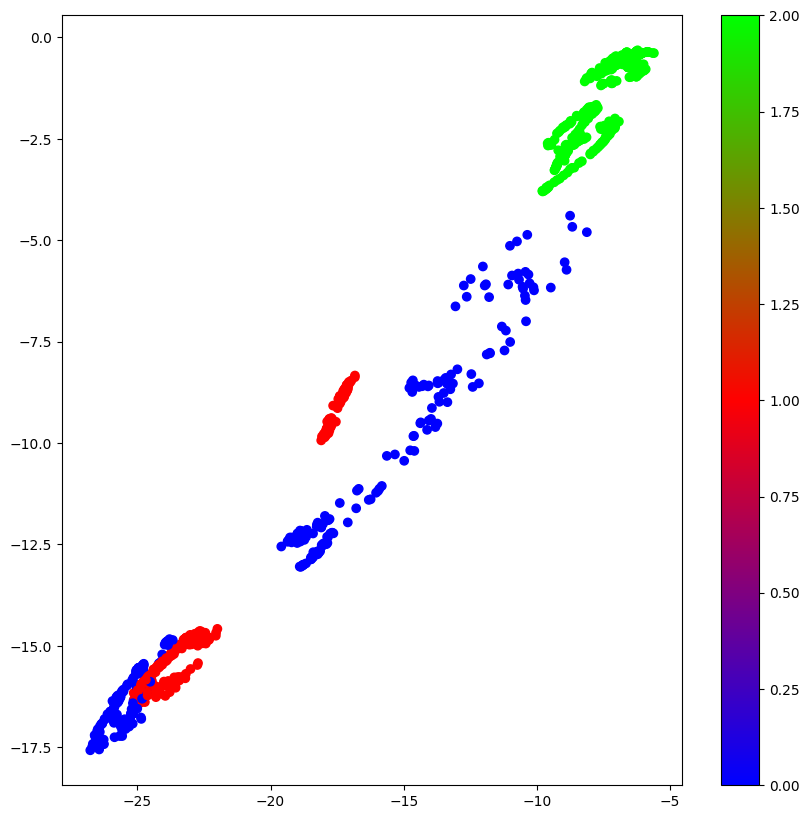

In [72]:
encoder = tf.keras.Model(input_img, z_mu) # works on older version of TF and Keras
x_valid_noTest_encoded = encoder.predict(train_x, batch_size=batch_size)
plt.figure(figsize=(10, 10))
plt.scatter(x_valid_noTest_encoded[:, 0], x_valid_noTest_encoded[:, 1], c=y_train, cmap='brg')
plt.colorbar()
plt.show()

The classes can be seen clustere to each other although some groups are at the other part of the plot. The VAE was able to generate images decently.

# Prelab Questions

**What are autoencoders? What is the vanilla/standard/regular architecture of an autoencoder?**

Autoencoders are a type of artificial neural network used for unsupervised learning tasks such as data compression, denoising, and feature learning. The vanilla architecture of an autoencoder consists of an encoder network that compresses the input data into a lower-dimensional representation. Then, data is fed to a decoder network that reconstructs the original input from the given representation. The encoder can be added with dense layers with a decreasing number of neurons, while the decoder is the opposite of the encoder.



**What are the limitations of autoencoders?**

They may struggle with capturing complex data distributions effectively, especially when the data is high-dimensional or has intricate patterns. In addition, their deterministic nature can lead to lack of diversity in generated outputs.



**Why use variable autoencoders?**

They introduce randomness in the latent space, allowing for diverse outputs for a given input. This randomness helps in generating more realistic and diverse reconstructions, enhancing the model's ability to capture complex data distributions.



**What do we mean by generative adversarial networks?**

Generative Adversarial Networks (GANs) are models used for creating new data that looks similar to existing data.It has  two main parts: the generator and the discriminator. The generator tries to produce fake data that resembles real data, while the discriminator's job is to tell apart real data from fake data. hrough this process, GANs can generate new data samples that are realistic and similar to the original data they were trained on.


# Concusion

Variational Autoencoders (VAEs) are useful for balancing reconstruction accuracy and latent space continuity. VAEs frequently fail to capture tiny features in reconstructions whle keeping smoothness in the latent space.  I've gained valuable insights into the power of unsupervised learning and generative modeling. Working with VAEs, I learned about the important of encoding data into a meaningful latent space and the role of probabilistic sampling in generating diverse outputs. On the other hand, experimenting with GANs taught me about the adversaial training process and the delicate balance between the generator and discriminator networks. Both VAEs and GANs broadened my understanding of how neural networks can be used to generate new data samples.

# References


> **Variational Autoencoders and GANs**
>
> Harvard University
>
> Fall 2020
>
> Instructors: Mark Glickman, Pavlos Protopapas, and Chris Tanner
>
> Lab Instructors: Chris Tanner and Eleni Angelaki Kaxiras
>
> Content: Srivatsan Srinivasan, Pavlos Protopapas, Chris Tanner
>
> Link: https://harvard-iacs.github.io/2020-CS109B/labs/lab10/notebook/

